In [ ]:
# Перезапустить runtime
import os
os.kill(os.getpid(), 9)

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Подготовка данных

In [2]:
import os
from abc import ABC, abstractmethod
from collections import Counter
from enum import Enum

import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, OneHotEncoder, StandardScaler

class Model(Enum):
    HOMOGENEOUS = 'homogeneous'
    HOMOGENEOUS_INF = 'homogeneous_inf'
    HOMOGENEOUS_FIN = 'homogeneous_fin'

    DUAL_POROSITY_INF = 'dual_porosity_inf'
    DUAL_POROSITY_FIN = 'dual_porosity_fin'

    DUAL_PERMEABILITY_INF = 'dual_permeability_inf'
    DUAL_PERMEABILITY_FIN = 'dual_permeability_fin'

    RADIAL_COMPOSITE_INF = 'radial_composite_inf'


class AbstractPressureDataPreprocessor(ABC):
    """
    Подготовка данных кривых давления из файлов
    """
    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        self.data_dir = data_dir
        self.test_size = test_size
        self.val_size = val_size
        self.random_state = random_state
        self.debug = debug

    @abstractmethod
    def load_data(self):
        """Загрузка датасета"""
        pass

    def normalize(self, X):
        """
        Принимает:
        -----------
        X : numpy array, shape (samples, timesteps, channels)
            Входные данные, где:
            X[:, :, 0] = p_D (безразмерная производная давления)
            X[:, :, 1] = t_D (безразмерное время)

        Возвращает:
        --------
        X_norm : numpy array, shape (samples, timesteps, channels)
            Нормализованные данные
        """
        X_norm = X.copy()

        for i in range(X.shape[2]):
            channel = X[:, :, i]

            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min

            channel_norm = (channel - channel_min) / channel_range

            X_norm[:, :, i] = channel_norm

        return X_norm

    def fit_standardize(self, X_train, X_val=None, X_test=None):
        """
        Z-score нормализация: (x - mean) / std
        Лучше сохраняет распределение данных
        """
        # Среднее и std по всем сэмплам и временным шагам для каждого канала
        self.mean_vals = np.mean(X_train, axis=(0, 1))  # shape (channels,)
        self.std_vals = np.std(X_train, axis=(0, 1))

        # Защита от малых std
        self.std_vals[self.std_vals < 1e-8] = 1.0

        X_train_norm = self._standardize(X_train)

        results = [X_train_norm]
        if X_val is not None:
            results.append(self._standardize(X_val))
        if X_test is not None:
            results.append(self._standardize(X_test))

        return results if len(results) > 1 else results[0]

    def _standardize(self, X):
        X_norm = X.copy()
        for i in range(X.shape[2]):
            X_norm[:, :, i] = (X[:, :, i] - self.mean_vals[i]) / self.std_vals[i]
        return X_norm

    def get_dataset(self, task='classification'):
        X, y = self.load_data()

        if self.debug:
            print('shape X =', X.shape)

        if task == 'classification':
            X_train_val, X_test, y_train_val, y_test = train_test_split(
                X, y,
                test_size=self.test_size,
                random_state=42,
                shuffle=True,
                stratify=y
            )
        elif task == 'regression':
            X_train_val, X_test, y_train_val, y_test = train_test_split(
                X, y,
                test_size=self.test_size,
                random_state=42,
                shuffle=True,
                stratify=None
            )
        else:
            print('Task may be: classification or regression')
            return None

        val_size_relative = self.val_size / (1 - self.test_size)

        if task == 'classification':
            X_train, X_val, y_train, y_val = train_test_split(
                X_train_val, y_train_val,
                test_size=val_size_relative,
                random_state=42,
                shuffle=True,
                stratify=y_train_val
            )
        elif task == 'regression':
            X_train, X_val, y_train, y_val = train_test_split(
                X_train_val, y_train_val,
                test_size=val_size_relative,
                random_state=42,
                shuffle=True,
                stratify=None
            )
        else:
            print('Task may be: classification or regression')
            return None

        if self.debug:
            print(f"Train: {X_train.shape} ({(X_train.shape[0] / X.shape[0]) * 100:.1f}%)")
            print(f"Val: {X_val.shape} ({(X_val.shape[0] / X.shape[0]) * 100:.1f}%)")
            print(f"Test: {X_test.shape} ({(X_test.shape[0] / X.shape[0]) * 100:.1f}%)")

        self.X_train, self.X_val, self.X_test = X_train, X_val, X_test
        self.y_train, self.y_val, self.y_test = y_train, y_val, y_test
        self.X_original, self.y_original = X, y

        return X_train, X_val, X_test, y_train, y_val, y_test



class AbstractPressureDataClassificationPreprocessor(AbstractPressureDataPreprocessor, ABC):
    """
    Подготовка данных кривых давления для классификации из файлов
    """

    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)
        self.class_names = []
        self.label_encoder = LabelEncoder()
        self.one_hot_encoder = OneHotEncoder(sparse_output=False)
        self.scaler = StandardScaler()

    def _encode_new_sample(self, new_label):
        """
        Кодирование нового значения (строки)
        :param new_label: строка с меткой
        :return: one-hot закодированный вектор
        """
        integer_encoded = self.label_encoder.transform([new_label])
        integer_encoded_reshaped = integer_encoded.reshape(-1, 1)
        one_hot_encoded = self.one_hot_encoder.transform(integer_encoded_reshaped)
        return one_hot_encoded

    def _init_target_encoders(self):
        """
        Подготовка данных для целевой переменной
        """
        targets = []
        for item in os.listdir(f'{self.data_dir}/curve'):
            if item.endswith('.csv'):
                label = self._get_label_from_filename(item)
                targets.append(label)

        for label in set(targets):
            self.class_names.append(label)

        if not self.class_names:
            raise ValueError("В директории не найдено CSV файлов")

        print(f"Найденные метки: {self.class_names}")

        self.label_encoder = LabelEncoder()
        self.one_hot_encoder = OneHotEncoder(sparse_output=False)

        integer_encoded = self.label_encoder.fit_transform(targets)
        integer_encoded = integer_encoded.reshape(-1, 1)

        one_hot_encoded = self.one_hot_encoder.fit_transform(integer_encoded)

        if self.debug:
            print(f"One-hot кодирование (размерность): {one_hot_encoded.shape}")

    def _get_label_from_filename(self, filename):
        parts = filename.rsplit('_', 1)
        label = parts[0]
        return label

    def stats(self, return_dict=False):
        """
        Выводит статистику распределения меток по подвыборкам.
        Работает с one-hot encoded метками.
        """
        if not hasattr(self, 'y_original'):
            raise ValueError("Сначала вызовите get_dataset()")

        print(f"Формат y_original: {self.y_original.shape}")
        print(f"Пример y_original[0]: {self.y_original[0]}")

        if len(self.y_original.shape) > 1 and self.y_original.shape[1] > 1:
            print("Обнаружены one-hot encoded метки. Преобразую в целые числа...")
            y_original_int = np.argmax(self.y_original, axis=1)
            y_train_int = np.argmax(self.y_train, axis=1)
            y_val_int = np.argmax(self.y_val, axis=1)
            y_test_int = np.argmax(self.y_test, axis=1)
        else:
            y_original_int = self.y_original.flatten()
            y_train_int = self.y_train.flatten()
            y_val_int = self.y_val.flatten()
            y_test_int = self.y_test.flatten()

        datasets = {
            'Original': y_original_int,
            'Train': y_train_int,
            'Validation': y_val_int,
            'Test': y_test_int
        }

        stats_dict = {}

        print("=" * 70)
        print("СТАТИСТИКА РАСПРЕДЕЛЕНИЯ МЕТОК")
        print("=" * 70)

        for name, y_data in datasets.items():
            total = len(y_data)
            counter = Counter(y_data)

            sorted_classes = sorted(counter.items())

            stats = {
                'total': total,
                'counts': dict(sorted_classes),
                'percentages': {k: v / total * 100 for k, v in sorted_classes}
            }

            stats_dict[name] = stats

            print(f"\n{name} (n={total}):")
            print("-" * 40)

            for cls, count in sorted_classes:
                percentage = count / total * 100
                print(f"  Класс {cls}: {count:4d} ({percentage:6.2f}%)")

        print("\n" + "=" * 70)
        print("СВОДНАЯ ТАБЛИЦА")
        print("=" * 70)

        all_classes = sorted(set(y_original_int))

        header = f"{'Класс':<8} {'Original':<12} {'Train':<12} {'Val':<12} {'Test':<12}"
        print(header)
        print("-" * 60)

        for cls in all_classes:
            row = f"{cls:<8}"
            for name in ['Original', 'Train', 'Validation', 'Test']:
                count = stats_dict[name]['counts'].get(cls, 0)
                total = stats_dict[name]['total']
                percentage = count / total * 100 if total > 0 else 0
                row += f"{count} ({percentage:5.1f}%)  "
            print(row)

        if return_dict:
            return stats_dict

    def get_class_names(self):
        return self.class_names

In [3]:
import os
from typing import override

import numpy as np
import pandas as pd


class PressureDataClassificationPreprocessor2D(AbstractPressureDataClassificationPreprocessor):
    """
    Загрузка датасета для классификации через для обучения модели 2D CNN.
    Данные формируются в виде time_series_size x time_series_size.
    [кривая давления^T * (time_series_size / 2) | кривая производной давления^T * (time_series_size / 2)].
    """
    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)

    @override
    def load_data(self):
        """
        Загрузка датасета и преобразование в матрицы 128×128 согласно статье
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        self._init_target_encoders()

        for item in os.listdir(self.data_dir):
            file_path = os.path.join(self.data_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD', 'P_wD']]

            # Извлекаем данные
            t_D = np.array(df['t_D'])            # время (128 точек)
            dP_wD = np.array(df['dP_wD'])        # производная давления (128 точек)
            P_wD = np.array(df['P_wD'])          # изменение давления (128 точек)

            # Проверяем, что у нас 128 точек
            assert len(dP_wD) == 128, f"Ожидается 128 точек давления, получено {len(dP_wD)}"
            assert len(P_wD) == 128, f"Ожидается 128 точек производной, получено {len(P_wD)}"

            # Дублируем каждый вектор 64 раз для создания матрицы 128×64
            # pressure_matrix = P_wD.reshape(128, 1).repeat(64, axis=1)
            # derivative_matrix = dP_wD.reshape(128, 1).repeat(64, axis=1)
            pressure_matrix = np.tile(P_wD.reshape(-1, 1), (1, 64))
            derivative_matrix = np.tile(dP_wD.reshape(-1, 1), (1, 64))

            # Склеиваем матрицы горизонтально: слева давление, справа производная
            # Получаем матрицу 128×128
            sample_matrix = np.hstack([pressure_matrix, derivative_matrix])

            # Добавляем размерность канала для CNN (batch_size, height, width, channels)
            sample_matrix = sample_matrix.reshape(128, 128, 1)

            X_list.append(sample_matrix)

            # Получаем метку как в исходном коде
            label = self._get_label_from_filename(item)
            target = self._encode_new_sample(label)[0]
            y_list.append(target)

        X = np.array(X_list)
        y = np.array(y_list)

        print(f"Загружено {len(X)} образцов")
        print(f"Форма X: {X.shape}")  # (n_samples, 128, 128, 1)
        print(f"Форма y: {y.shape}")

        return X, y

In [4]:
import os
import re

import numpy as np
import pandas as pd
from typing_extensions import override


class PressureDataClassificationPreprocessor1D(AbstractPressureDataClassificationPreprocessor):
    """Подготовка данных для классификации типа пласта из файлов кривых"""

    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        curve_dir = self.data_dir + '/curve'
        self._init_target_encoders()

        for item in os.listdir(curve_dir):
            file_path = os.path.join(curve_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])

            model, boundary, num = self._get_labels_from_filename(item)
            num = int(num)

            k = self.get_k(model, num)[0]

            dP_wD = dP_wD / k
            t_D = t_D / k

            sample = np.column_stack([dP_wD, t_D])
            X_list.append(sample)

            label = self._get_label_from_filename(item)
            target = self._encode_new_sample(label)[0]
            y_list.append(target)

        X = np.array(X_list)
        y = np.array(y_list)

        return X, y

    def _get_labels_from_filename(self, item):
        """
        Получение target из названия файла.
        Пример входного файла: homogeneous_inf_12_inc1
        """
        basename = os.path.basename(item)
        name_without_ext = os.path.splitext(basename)[0]
        parts = name_without_ext.split('_')

        if len(parts) > 3:
            return parts[0] + '_' + parts[1], parts[2], parts[3]
        else:
            return parts[0], parts[1], parts[2]

    def get_k(self, model_type, num):
        """
        Получение параметра k.
        """
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if model_type == 'homogeneous':
            return param_df['k']

        if model_type == 'dual_porosity':
            return param_df['k_f']

        if model_type == 'dual_permeability':
            return param_df['k2']

        if model_type == 'radial_composite':
            return param_df['k1']

        return None


class PressureDataRegressionPreprocessor1D(AbstractPressureDataPreprocessor):

    def __init__(self, data_dir, model_type, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)

        self.model_type = model_type

        self.model_params = {
            Model.HOMOGENEOUS.value: ['k', 'C_D', 'S', 'r_D_e'],
            Model.DUAL_POROSITY_INF.value: ['k', 'C_D', 'S', 'omega', 'lambda'],
            Model.DUAL_PERMEABILITY_INF.value : ['k', 'C_D', 'S', 'omega', 'lambda', 'kappa'],
            Model.RADIAL_COMPOSITE_INF.value : ['k', 'C_D', 'S', 'M', 'R_f'],
        }

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        curve_data_dir = self.data_dir + "/curve"

        pattern = r'(.+)_(\d+)\.csv$'

        for item in os.listdir(curve_data_dir):
            match = re.match(pattern, item)
            model_type = match.group(1)
            num = int(match.group(2))

            if not model_type.startswith(self.model_type.value):
                continue

            file_path = os.path.join(curve_data_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])

            sample = np.column_stack([dP_wD, t_D])
            X_list.append(sample)

            y_list.append(self.get_params_from_file(num))

        X = np.array(X_list)
        y = np.array(y_list)

        return X, y

    def get_params_from_file(self, num):
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if self.model_type == Model.HOMOGENEOUS:
            return [param_df['k'], param_df['C_D'], param_df['S'], param_df['r_D_e']]

        if self.model_type == Model.HOMOGENEOUS_FIN:
            return [param_df['k'], param_df['C_D'], param_df['S'], param_df['r_D_e']]

        if self.model_type == Model.HOMOGENEOUS_INF:
            return [param_df['k'], param_df['C_D'], param_df['S']]

        if self.model_type == Model.DUAL_POROSITY_INF:
            return [param_df['k_f'], param_df['C_D'], param_df['S'], param_df['omega'], param_df['lambda']]

        if self.model_type == Model.DUAL_POROSITY_FIN:
            return [param_df['k_f'], param_df['C_D'], param_df['S'], param_df['omega'], param_df['lambda'], param_df['R_eD']]

        if self.model_type == Model.DUAL_PERMEABILITY_INF:
            return [param_df['k1'], param_df['C_D'], param_df['S1'], param_df['omega'], param_df['lambda'], param_df['kappa']]

        if self.model_type == Model.DUAL_PERMEABILITY_FIN:
            return [param_df['k1'], param_df['C_D'], param_df['S1'], param_df['omega'], param_df['lambda'], param_df['kappa'], param_df['R_eD']]

        if self.model_type == Model.RADIAL_COMPOSITE_INF:
            return [param_df['k1'],
                    param_df['S'],
                    param_df['C_D'],
                    param_df['M12'],
                    param_df['omega12'],
                    param_df['r_fD']]

        return None

## Предобработка для regression (custom split)

In [5]:
class AbstractCustomPressureDataPreprocessor(ABC):
    """
    Подготовка данных кривых давления из файлов
    Деление на train, test, val уже выполнено кастомно
    """
    def __init__(self, data_dir, debug=False):
        self.data_dir = data_dir
        self.debug = debug

    @abstractmethod
    def load_data(self):
        """Загрузка датасета"""
        pass

    def normalize(self, X):
        """
        Принимает:
        -----------
        X : numpy array, shape (samples, timesteps, channels)
            Входные данные, где:
            X[:, :, 0] = p_D (безразмерная производная давления)
            X[:, :, 1] = t_D (безразмерное время)

        Возвращает:
        --------
        X_norm : numpy array, shape (samples, timesteps, channels)
            Нормализованные данные
        """
        X_norm = X.copy()

        for i in range(X.shape[2]):
            channel = X[:, :, i]

            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min

            channel_norm = (channel - channel_min) / channel_range

            X_norm[:, :, i] = channel_norm

        return X_norm

    def get_dataset(self):
        X_list, y_list = self.load_data()

        print(y_list[0])  # Для отладки

        # Разделяем по data_type
        train_idx = [i for i, y in enumerate(y_list) if y['data_type'] == 'train']
        val_idx = [i for i, y in enumerate(y_list) if y['data_type'] == 'val']
        test_idx = [i for i, y in enumerate(y_list) if y['data_type'] == 'test']

        X_train = [X_list[i] for i in train_idx]
        X_val = [X_list[i] for i in val_idx]
        X_test = [X_list[i] for i in test_idx]

        # Убираем data_type из словарей
        y_train = [{k: v for k, v in y_list[i].items() if k != 'data_type'} for i in train_idx]
        y_val = [{k: v for k, v in y_list[i].items() if k != 'data_type'} for i in val_idx]
        y_test = [{k: v for k, v in y_list[i].items() if k != 'data_type'} for i in test_idx]

        # Определяем порядок параметров для преобразования в массив
        # Используем model_params или ключи первого элемента
        if y_train:
            # Пробуем получить порядок из model_params
            param_order = self.model_params.get(self.model_type.value, [])

            # Если model_params не содержит нужные ключи, используем ключи из словаря
            if not param_order or not all(p in y_train[0] for p in param_order):
                # Исключаем data_type, если он вдруг остался
                param_order = [k for k in y_train[0].keys() if k != 'data_type']

            # Преобразуем в numpy массивы
            y_train_array = np.array([[y[p] for p in param_order] for y in y_train])
            y_val_array = np.array([[y[p] for p in param_order] for y in y_val]) if y_val else np.array([])
            y_test_array = np.array([[y[p] for p in param_order] for y in y_test]) if y_test else np.array([])
        else:
            y_train_array = np.array([])
            y_val_array = np.array([])
            y_test_array = np.array([])

        # Конвертируем X в numpy массивы
        X_train = np.array(X_train)
        X_val = np.array(X_val)
        X_test = np.array(X_test)

        if self.debug:
            print(f"X_train shape: {X_train.shape}")
            print(f"y_train shape: {y_train_array.shape}")

        return X_train, X_val, X_test, y_train_array, y_val_array, y_test_array

In [6]:
class PressureDataRegressionCustomPreprocessor1D(AbstractCustomPressureDataPreprocessor):

    def __init__(self, data_dir, model_type, debug=False):
        super().__init__(data_dir, debug)

        self.model_type = model_type

        self.model_params = {
            Model.HOMOGENEOUS.value: ['k', 'C_D', 'S', 'r_D_e'],
            Model.HOMOGENEOUS_INF.value: ['k', 'C_D', 'S'],
            Model.HOMOGENEOUS_FIN.value: ['k', 'C_D', 'S', 'r_D_e'],
            Model.DUAL_POROSITY_INF.value: ['k_f', 'C_D', 'S', 'omega', 'lambda'],
            Model.DUAL_POROSITY_FIN.value: ['k_f', 'C_D', 'S', 'omega', 'lambda', 'R_eD'],
            Model.DUAL_PERMEABILITY_INF.value: ['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa'],
            Model.DUAL_PERMEABILITY_FIN.value: ['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa', 'R_eD'],
            Model.RADIAL_COMPOSITE_INF.value: ['k1', 'C_D', 'S', 'M12', 'omega12', 'r_fD'],
        }

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: X, y (оба как списки)
        """
        X_list = []
        y_list = []  # Каждый элемент будет словарем или объектом с атрибутами

        curve_data_dir = self.data_dir + "/curve"
        pattern = r'(.+)_(\d+)\.csv$'

        for item in os.listdir(curve_data_dir):
            match = re.match(pattern, item)
            if not match:
                continue

            model_type = match.group(1)
            num = int(match.group(2))

            if not model_type.startswith(self.model_type.value):
                continue

            file_path = os.path.join(curve_data_dir, item)
            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])
            sample = np.column_stack([dP_wD, t_D])

            X_list.append(sample)

            # Получаем параметры и data_type
            params = self.get_params_from_file(num)
            if params:
                y_list.append(params)

        return X_list, y_list

    def get_params_from_file(self, num):
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if self.model_type == Model.HOMOGENEOUS:
            return {
                'k': param_df['k'].values[0],  # Добавьте .values[0] или .iloc[0]
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.HOMOGENEOUS_FIN:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.HOMOGENEOUS_INF:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_POROSITY_INF:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_POROSITY_FIN:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_PERMEABILITY_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.DUAL_PERMEABILITY_FIN:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if self.model_type == Model.RADIAL_COMPOSITE_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega12': param_df['omega12'].values[0],
                'M12': param_df['M12'].values[0],
                'r_fD': param_df['r_fD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        return None

## Предобработка для classification

In [7]:
class AbstractPressureDataClassificationPreprocessor(ABC):
    """
    Подготовка данных кривых давления из файлов
    """
    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        self.data_dir = data_dir
        self.test_size = test_size
        self.val_size = val_size
        self.random_state = random_state
        self.debug = debug

    @abstractmethod
    def load_data(self):
        """Загрузка датасета"""
        pass

    def normalize(self, X):
        """
        Принимает:
        -----------
        X : numpy array, shape (samples, timesteps, channels)
            Входные данные, где:
            X[:, :, 0] = p_D (безразмерная производная давления)
            X[:, :, 1] = t_D (безразмерное время)

        Возвращает:
        --------
        X_norm : numpy array, shape (samples, timesteps, channels)
            Нормализованные данные
        """
        X_norm = X.copy()

        for i in range(X.shape[2]):
            channel = X[:, :, i]

            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min

            channel_norm = (channel - channel_min) / channel_range

            X_norm[:, :, i] = channel_norm

        return X_norm

    def get_dataset(self):
        X_list, y_list = self.load_data()

        print(y_list[0])  # Для отладки

        # Разделяем по data_type
        train_idx = [i for i, y in enumerate(y_list) if y[1] == 'train']
        val_idx = [i for i, y in enumerate(y_list) if y[1] == 'val']
        test_idx = [i for i, y in enumerate(y_list) if y[1] == 'test']

        X_train = [X_list[i] for i in train_idx]
        X_val = [X_list[i] for i in val_idx]
        X_test = [X_list[i] for i in test_idx]

        # Убираем data_type из словарей
        y_train = np.array([y_list[i][0] for i in train_idx])
        y_val   = np.array([y_list[i][0] for i in val_idx])   if val_idx  else np.array([])
        y_test  = np.array([y_list[i][0] for i in test_idx])  if test_idx else np.array([])

        # Конвертируем X в numpy массивы
        X_train = np.array(X_train)
        X_val = np.array(X_val)
        X_test = np.array(X_test)

        print(f"X_train shape: {X_train.shape}")
        print(f"y_train shape: {y_train.shape}")

        return X_train, X_val, X_test, y_train, y_val, y_test

    def get_class_names(self):
        return self.class_names

In [8]:
class PressureDataClassificationCustomPreprocessor1D(AbstractPressureDataClassificationPreprocessor):

    def __init__(self, data_dir, debug=False):
        super().__init__(data_dir, debug)

        self.class_names = []
        self.label_encoder = LabelEncoder()
        self.one_hot_encoder = OneHotEncoder(sparse_output=False)
        self.scaler = StandardScaler()

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: X, y (оба как списки)
        """
        X_list = []
        y_list = []

        curve_data_dir = self.data_dir + "/curve"
        pattern = r'(.+)_(\d+)\.csv$'

        self._init_target_encoders()

        for item in os.listdir(curve_data_dir):
            match = re.match(pattern, item)

            model_type = match.group(1)
            num = int(match.group(2))

            model_type = Model(model_type)

            file_path = os.path.join(curve_data_dir, item)
            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            # Получаем параметры и data_type
            params = self.get_params_from_file(model_type, num)

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])
            k = self.get_k(model_type, params)

            t_D = t_D / k
            dP_wD = dP_wD / k

            sample = np.column_stack([dP_wD, t_D])

            label = self._get_label_from_filename(item)
            target = self._encode_new_sample(label)[0]

            X_list.append(sample)
            y_list.append((target, params['data_type']))

        return X_list, y_list

    def _encode_new_sample(self, new_label):
        """
        Кодирование нового значения (строки)
        :param new_label: строка с меткой
        :return: one-hot закодированный вектор
        """
        integer_encoded = self.label_encoder.transform([new_label])
        integer_encoded_reshaped = integer_encoded.reshape(-1, 1)
        one_hot_encoded = self.one_hot_encoder.transform(integer_encoded_reshaped)
        return one_hot_encoded

    def _init_target_encoders(self):
        targets = []
        for item in os.listdir(f'{self.data_dir}/curve'):
            if item.endswith('.csv'):
                label = self._get_label_from_filename(item)
                targets.append(label)

        if not targets:
            raise ValueError("В директории не найдено CSV файлов")

        # LabelEncoder сортирует алфавитно — берём тот же порядок
        self.label_encoder = LabelEncoder()
        integer_encoded = self.label_encoder.fit_transform(targets)

        # class_names в том же порядке что и энкодер
        self.class_names = list(self.label_encoder.classes_)  # <- вот так

        self.one_hot_encoder = OneHotEncoder(sparse_output=False)
        self.one_hot_encoder.fit_transform(integer_encoded.reshape(-1, 1))

    def _get_label_from_filename(self, filename):
        parts = filename.rsplit('_', 1)
        label = parts[0]
        return label

    def _get_labels_from_filename(self, item):
        """
        Получение target из названия файла.
        Пример входного файла: homogeneous_inf_12_inc1
        """
        basename = os.path.basename(item)
        name_without_ext = os.path.splitext(basename)[0]
        parts = name_without_ext.split('_')

        if len(parts) > 3:
            return parts[0] + '_' + parts[1], parts[2], parts[3]
        else:
            return parts[0], parts[1], parts[2]

    def get_k(self, model_type, param_df):
        """
        Получение параметра k.
        """
        if model_type == Model.HOMOGENEOUS_INF or model_type == Model.HOMOGENEOUS_FIN:
            return param_df['k']

        if model_type == Model.DUAL_POROSITY_INF or model_type == Model.DUAL_POROSITY_FIN:
            return param_df['k_f']

        if model_type == Model.DUAL_PERMEABILITY_INF or model_type == Model.DUAL_PERMEABILITY_FIN:
            return param_df['k1']

        if model_type == Model.RADIAL_COMPOSITE_INF:
            return param_df['k1']

        return None

    def get_params_from_file(self, model_type, num):
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if model_type == Model.HOMOGENEOUS:
            return {
                'k': param_df['k'].values[0],  # Добавьте .values[0] или .iloc[0]
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.HOMOGENEOUS_FIN:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'r_D_e': param_df['r_D_e'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.HOMOGENEOUS_INF:
            return {
                'k': param_df['k'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_POROSITY_INF:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_POROSITY_FIN:
            return {
                'k_f': param_df['k_f'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_PERMEABILITY_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.DUAL_PERMEABILITY_FIN:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S1': param_df['S1'].values[0],
                'omega': param_df['omega'].values[0],
                'lambda': param_df['lambda'].values[0],
                'kappa': param_df['kappa'].values[0],
                'R_eD': param_df['R_eD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        if model_type == Model.RADIAL_COMPOSITE_INF:
            return {
                'k1': param_df['k1'].values[0],
                'C_D': param_df['C_D'].values[0],
                'S': param_df['S'].values[0],
                'omega12': param_df['omega12'].values[0],
                'M12': param_df['M12'].values[0],
                'r_fD': param_df['r_fD'].values[0],
                'data_type': param_df['data_type'].values[0]
            }

        return None

## Подготовка данных для multilabel

In [9]:
import numpy as np
import pandas as pd
from sklearn.preprocessing import MultiLabelBinarizer

class MultilabelEncoder:
    def __init__(self):
        # Определяем все возможные метки
        self.all_labels = [
            'homogeneous',
            'dual_porosity',
            'dual_permeability',
            'radial_composite',
            'inf',
            'fin',
            'inc1',
            'inc2',
            'full'
        ]

        # Создаем маппинг label -> индекс
        self.label_to_idx = {label: i for i, label in enumerate(self.all_labels)}

        self.n_classes = len(self.all_labels)

    def encode(self, reservoir, boundary, suffix):
        """
        Преобразование трех меток в multilabel вектор

        Parameters:
        -----------
        reservoir : str (например, 'homogeneous')
        boundary : str (например, 'infinite')
        suffix : str (например, 'inc1')

        Returns:
        --------
        np.array : бинарный вектор длины 8
        """
        # Инициализируем нулевой вектор
        y = np.zeros(self.n_classes, dtype=np.int8)

        # Устанавливаем 1 для соответствующих меток
        y[self.label_to_idx[reservoir]] = 1
        y[self.label_to_idx[boundary]] = 1
        y[self.label_to_idx[suffix]] = 1

        return y

    def encode_batch(self, reservoirs, boundaries, suffixes):
        """
        Преобразование батча меток
        """
        y_batch = []
        for r, b, s in zip(reservoirs, boundaries, suffixes):
            y_batch.append(self.encode(r, b, s))
        return np.array(y_batch)

    def decode(self, y_vector, threshold=0.5):
        """
        Обратное преобразование: из бинарного вектора в метки
        """
        if isinstance(y_vector, np.ndarray):
            y_binary = (y_vector > threshold).astype(int)
        else:
            y_binary = y_vector

        # Получаем индексы, где значение = 1
        indices = np.where(y_binary == 1)[0]

        # Преобразуем индексы в названия меток
        labels = [self.all_labels[i] for i in indices]

        # Разделяем на три категории
        reservoir_labels = [l for l in labels if l in ['homogeneous', 'dual_porosity', 'dual_permeability', 'radial_composite']]
        boundary_labels = [l for l in labels if l in ['inf', 'fin']]
        suffix_labels = [l for l in labels if l in ['inc1', 'inc2', 'full']]

        return {
            'reservoir': reservoir_labels[0] if reservoir_labels else None,
            'boundary': boundary_labels[0] if boundary_labels else None,
            'suffix': suffix_labels[0] if suffix_labels else None
        }

In [10]:
class PressureDataMultilabelClassificationPreprocessor1D(AbstractPressureDataClassificationPreprocessor):
    """Подготовка данных для multilabel классификации типа пласта из файлов кривых"""

    def __init__(self, data_dir, test_size=0.2, val_size=0.1, random_state=42, debug=False):
        super().__init__(data_dir, test_size, val_size, random_state, debug)
        self.encoder = MultilabelEncoder()

    @override
    def load_data(self):
        """
        Загрузка датасета
        :return: np.array(X), np.array(y)
        """
        X_list = []
        y_list = []

        curve_data_dir = self.data_dir + "/curve"

        for item in os.listdir(curve_data_dir):
            file_path = os.path.join(curve_data_dir, item)

            df = pd.read_csv(file_path)[['t_D', 'dP_wD']]

            t_D = np.array(df['t_D'])
            dP_wD = np.array(df['dP_wD'])

            model, boundary, num, type = self._get_labels_from_filename(item)
            num = int(num)

            k = self.get_k(model, num)[0]

            dP_wD = dP_wD / k
            t_D = t_D / k

            sample = np.column_stack([dP_wD, t_D])
            X_list.append(sample)

            target = self.encoder.encode(model, boundary, type)
            y_list.append(target)

        X = np.array(X_list)
        y = np.array(y_list)

        return X, y

    def _get_labels_from_filename(self, item):
        """
        Получение target из названия файла.
        Пример входного файла: homogeneous_inf_12_inc1
        """
        basename = os.path.basename(item)
        name_without_ext = os.path.splitext(basename)[0]
        parts = name_without_ext.split('_')

        if len(parts) > 4:
            return parts[0] + '_' + parts[1], parts[2], parts[3], parts[4]
        else:
            return parts[0], parts[1], parts[2], parts[3]

    def get_k(self, model_type, num):
        """
        Получение параметра k.
        """
        file_name = f'{self.data_dir}/params/{num}.csv'
        param_df = pd.read_csv(file_name)

        if model_type == 'homogeneous':
            return param_df['k']

        if model_type == 'dual_porosity':
            return param_df['k_f']

        if model_type == 'dual_permeability':
            return param_df['k2']

        if model_type == 'radial_composite':
            return param_df['k1']

        return None

## Предобработка для multilabel (custom split)

In [11]:
class PressureDataMultilabelClassificationCustomPreprocessor1D:
    """
    Multilabel classification preprocessor with custom train/val/test split.
    Splits by data_type column in params CSV — no random split.
    """

    def __init__(self, data_dir, debug=False):
        self.data_dir = data_dir
        self.debug = debug
        self.encoder = MultilabelEncoder()

    def normalize(self, X):
        """Per-sample min-max normalization, same as parent class."""
        X_norm = X.copy()
        for i in range(X.shape[2]):
            channel = X[:, :, i]
            channel_min = np.min(channel, axis=1, keepdims=True)
            channel_max = np.max(channel, axis=1, keepdims=True)
            channel_range = channel_max - channel_min
            X_norm[:, :, i] = np.where(
                channel_range > 0,
                (channel - channel_min) / channel_range,
                0,
            )
        return X_norm

    def _get_labels_from_filename(self, item):
        """homogeneous_inf_12_inc1.csv  ->  ('homogeneous', 'inf', 12, 'inc1')"""
        name = os.path.splitext(os.path.basename(item))[0]
        parts = name.split('_')
        # Parse from the right: suffix | num | boundary | model...
        # Handles any model name length (homogeneous, dual_porosity, radial_composite, etc.)
        if len(parts) < 4:
            return None
        suffix   = parts[-1]
        try:
            num = int(parts[-2])
        except ValueError:
            return None
        boundary = parts[-3]
        model    = '_'.join(parts[:-3])
        return model, boundary, num, suffix

    def _get_k(self, model_type, num):
        param_df = pd.read_csv(f'{self.data_dir}/params/{num}.csv')
        k_col = {'homogeneous': 'k', 'dual_porosity': 'k_f',
                 'dual_permeability': 'k2', 'radial_composite': 'k1'}.get(model_type)
        return param_df[k_col].values[0] if k_col else 1.0

    def _get_data_type(self, num):
        param_df = pd.read_csv(f'{self.data_dir}/params/{num}.csv')
        return param_df['data_type'].values[0]

    def load_data(self):
        X_list, y_list, splits = [], [], []
        curve_dir = self.data_dir + "/curve"

        for item in sorted(os.listdir(curve_dir)):
            if not item.endswith('.csv'):
                continue
            parsed = self._get_labels_from_filename(item)
            if parsed is None:
                continue
            model, boundary, num, suffix = parsed

            df = pd.read_csv(os.path.join(curve_dir, item))[['t_D', 'dP_wD']]
            k = self._get_k(model, num)
            data_type = self._get_data_type(num)

            t_D   = np.array(df['t_D'])   / k
            dP_wD = np.array(df['dP_wD']) / k

            X_list.append(np.column_stack([dP_wD, t_D]))
            y_list.append(self.encoder.encode(model, boundary, suffix))
            splits.append(data_type)

        return X_list, y_list, splits

    def get_dataset(self):
        X_list, y_list, splits = self.load_data()

        def _collect(tag):
            idx = [i for i, s in enumerate(splits) if s == tag]
            return (np.array([X_list[i] for i in idx]),
                    np.array([y_list[i] for i in idx]))

        X_train, y_train = _collect('train')
        X_val,   y_val   = _collect('val')
        X_test,  y_test  = _collect('test')

        if self.debug:
            print(f"train={len(y_train)}, val={len(y_val)}, test={len(y_test)}")

        return X_train, X_val, X_test, y_train, y_val, y_test

# Код обучения

In [12]:
import json
import os
import time

import numpy as np
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

from sklearn.metrics import (classification_report, confusion_matrix,
                             precision_recall_fscore_support, roc_auc_score,
                             mean_squared_error, mean_absolute_error, r2_score)


class WellTestTrainer:
    TASK_TYPES = ['classification', 'regression']

    def __init__(self, model, task_type='classification', class_names=None,
                 output_names=None, use_mixed_precision=True):
        """
        Класс для обучения моделей (поддерживает классификацию и регрессию)

        Parameters:
        -----------
        model : keras.Model
            Модель для обучения
        task_type : str
            Тип задачи ('classification' или 'regression')
        class_names : list, optional
            Названия классов (для классификации)
        output_names : list, optional
            Названия выходных параметров (для регрессии)
        use_mixed_precision : bool
            Использовать mixed precision для ускорения на GPU
        """
        if task_type not in self.TASK_TYPES:
            raise ValueError(f"task_type должен быть одним из {self.TASK_TYPES}")

        self.model = model
        self.task_type = task_type
        self.class_names = class_names or []
        self.output_names = output_names or [f'output_{i}' for i in range(model.output_shape[-1])]

        self.num_outputs = model.output_shape[-1]

        self.device_type = self._setup_device(use_mixed_precision)

        self.best_model_path = f'best_model_{task_type}.h5'
        self.checkpoint_dir = f'training_checkpoints_{task_type}'
        self.metrics_file = f'training_metrics_{task_type}.json'

        self.history = None
        self.metrics = None
        self.training_time = None
        self.scaler_y = None

        os.makedirs(self.checkpoint_dir, exist_ok=True)

    def _setup_device(self, use_mixed_precision=True):
        """Настройка устройства (GPU/CPU)"""
        print("=" * 60)
        print(f"НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ ({self.task_type.upper()})")
        print("=" * 60)

        gpus = tf.config.list_physical_devices('GPU')

        if gpus:
            print(f"Обнаружено GPU: {len(gpus)}")
            if use_mixed_precision:
                tf.keras.mixed_precision.set_global_policy('mixed_float16')
                print("✅ Mixed precision включен")
            return 'GPU'
        else:
            print("GPU не обнаружен, используется CPU")
            return 'CPU'

    def _get_loss_and_metrics(self):
        """Возвращает функцию потерь и метрики в зависимости от типа задачи"""
        if self.task_type == 'classification':
            loss = 'categorical_crossentropy'
            metrics = ['accuracy']
        else:  # regression
            loss = 'mse'  # Mean Squared Error
            metrics = ['mae', 'mse']  # Mean Absolute Error, Mean Squared Error

        return loss, metrics

    def _get_monitor_metric(self):
        """Возвращает метрику для мониторинга в callbacks"""
        if self.task_type == 'classification':
            return 'val_accuracy', 'max'
        else:  # regression
            return 'val_loss', 'min'

    def _create_callbacks(self, patience=50, reduce_lr_patience=5):
        """Создание callback'ов для обучения"""
        monitor_metric, monitor_mode = self._get_monitor_metric()

        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=self.best_model_path,
                monitor=monitor_metric,
                mode=monitor_mode,
                save_best_only=True,
                save_weights_only=False,
                verbose=1,
                save_freq='epoch'
            ),

            # keras.callbacks.EarlyStopping(
            #     monitor=monitor_metric,
            #     patience=patience,
            #     restore_best_weights=True,
            #     verbose=1,
            #     mode=monitor_mode
            # ),

            keras.callbacks.ReduceLROnPlateau(
                monitor=monitor_metric,
                factor=0.5,
                patience=reduce_lr_patience,
                min_lr=1e-6,
                verbose=1,
                mode=monitor_mode
            ),

            keras.callbacks.CSVLogger(
                os.path.join(self.checkpoint_dir, 'training_log.csv'),
                separator=',',
                append=True
            ),

            keras.callbacks.TerminateOnNaN()
        ]

        if self.device_type == 'GPU':
            callbacks.append(
                keras.callbacks.TensorBoard(
                    log_dir=os.path.join(self.checkpoint_dir, 'tensorboard_logs'),
                    histogram_freq=1,
                    write_graph=True,
                    write_images=True,
                    update_freq='epoch'
                )
            )

        return callbacks

    def _get_optimizer(self, initial_lr=0.01, optimizer_type='adam'):
        """Создание оптимизатора"""
        clipnorm = 1.0
        epsilon = 1e-7

        if optimizer_type == 'adam':
            optimizer = keras.optimizers.Adam(
                learning_rate=initial_lr,
                beta_1=0.9,
                beta_2=0.999,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'sgd':
            optimizer = keras.optimizers.SGD(
                learning_rate=initial_lr,
                momentum=0.9,
                nesterov=True,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'rmsprop':
            optimizer = keras.optimizers.RMSprop(
                learning_rate=initial_lr,
                rho=0.9,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        else:
            raise ValueError(f"Неизвестный оптимизатор: {optimizer_type}")

        return optimizer

    def _compile_model(self, optimizer):
        """Компиляция модели"""
        loss, metrics = self._get_loss_and_metrics()

        self.model.compile(
            optimizer=optimizer,
            loss=loss,
            metrics=metrics
        )

    def set_y_scaler(self, scaler):
        """Установка scaler для нормализации целевых значений (для регрессии)"""
        self.scaler_y = scaler

    def train(self, X_train, y_train, X_val, y_val,
              batch_size=32, epochs=300, initial_lr=0.01,
              optimizer_type='adam', custom_lr_schedule=None,
              class_weight=None, validation_freq=1):
        """
        Обучение модели
        """
        print("\n" + "=" * 60)
        print(f"НАЧАЛО ОБУЧЕНИЯ НА {self.device_type} ({self.task_type.upper()})")
        print("=" * 60)

        print(f"Устройство: {self.device_type}")
        print(f"Размер батча: {batch_size}")
        print(f"Тренировочные данные: X {X_train.shape}, y {y_train.shape}")
        print(f"Валидационные данные: X {X_val.shape}, y {y_val.shape}")
        print(f"Эпохи: {epochs}")

        optimizer = self._get_optimizer(initial_lr, optimizer_type)
        self._compile_model(optimizer)

        if custom_lr_schedule is None:
            if self.task_type == 'classification':
                def lr_schedule(epoch, lr):
                    if epoch in [50, 150, 250]:
                        return lr * 0.1
                    return lr
            else:  # regression
                def lr_schedule(epoch, lr):
                    if epoch in [30, 50, 70]:
                        return lr * 0.1
                    return lr
        else:
            lr_schedule = custom_lr_schedule

        lr_scheduler = keras.callbacks.LearningRateScheduler(lr_schedule, verbose=1)

        callbacks = self._create_callbacks()
        callbacks.append(lr_scheduler)

        start_time = time.time()

        try:
            self.history = self.model.fit(
                X_train, y_train,
                validation_data=(X_val, y_val),
                batch_size=batch_size,
                epochs=epochs,
                callbacks=callbacks,
                verbose=1,
                shuffle=True,
                class_weight=class_weight if self.task_type == 'classification' else None,
                validation_freq=validation_freq
            )

            self.training_time = time.time() - start_time

            print(f"\n✅ Обучение завершено за {self.training_time:.2f} секунд")
            print(f"✅ Лучшая модель сохранена в: {self.best_model_path}")

            self._save_training_info(X_train, X_val)

            return self.history

        except Exception as e:
            print(f"\n❌ Ошибка при обучении: {e}")
            print("Попытка восстановления...")

            if os.path.exists(self.best_model_path):
                self.model = keras.models.load_model(self.best_model_path)
                print("✅ Загружена лучшая сохраненная модель")

            raise

    def _save_training_info(self, X_train, X_val):
        """Сохранение информации об обучении"""
        info = {
            'task_type': self.task_type,
            'device_type': self.device_type,
            'training_time': self.training_time,
            'training_samples': len(X_train),
            'validation_samples': len(X_val),
            'input_shape': X_train.shape[1:],
            'model_summary': []
        }

        if self.task_type == 'classification':
            info.update({
                'num_classes': len(self.class_names),
                'class_names': self.class_names
            })
        else:  # regression
            info.update({
                'num_outputs': self.num_outputs,
                'output_names': self.output_names
            })

        self.model.summary(print_fn=lambda x: info['model_summary'].append(x))

        with open(self.metrics_file, 'w') as f:
            json.dump(info, f, indent=2, default=str)

        print(f"✅ Информация об обучении сохранена в {self.metrics_file}")

    def evaluate(self, X_test, y_test, batch_size=None):
        """
        Оценка модели на тестовых данных
        """
        print("\n" + "=" * 60)
        print(f"ОЦЕНКА МОДЕЛИ ({self.task_type.upper()})")
        print("=" * 60)

        if batch_size is None:
            batch_size = 32

        # Базовая оценка
        results = self.model.evaluate(
            X_test, y_test,
            batch_size=batch_size,
            verbose=0,
            return_dict=True
        )

        print(f"\n📊 Базовые метрики:")
        for metric_name, metric_value in results.items():
            print(f"  {metric_name}: {metric_value:.4f}")

        # Предсказания
        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        # Специфичная оценка в зависимости от типа задачи
        if self.task_type == 'classification':
            self._evaluate_classification(y_test, y_pred)
        else:  # regression
            self._evaluate_regression(y_test, y_pred, self.scaler_y)

        # Сохранение метрик
        self.metrics = {
            'task_type': self.task_type,
            'test_metrics': results,
            'device_used': self.device_type,
            'evaluation_time': time.time()
        }

        if self.task_type == 'classification':
            self.metrics.update(self._get_classification_metrics_dict())
        else:
            self.metrics.update(self._get_regression_metrics_dict(y_test, y_pred))

        with open(f'evaluation_metrics_{self.task_type}.json', 'w') as f:
            json.dump(self.metrics, f, indent=2, default=str)

        return self.metrics

    def plot_confusion_matrix(self, X_test, y_test, batch_size=None,
                             normalize=True, save_path=None, show_plot=True):
        """
        Построение и визуализация confusion matrix

        Parameters:
        -----------
        X_test, y_test : numpy arrays
            Тестовые данные
        batch_size : int, optional
            Размер батча для предсказания
        normalize : bool
            Нормализовать ли значения (проценты) или оставить абсолютные значения
        save_path : str, optional
            Путь для сохранения графика
        show_plot : bool
            Показывать ли график

        Returns:
        --------
        numpy.ndarray : confusion matrix
        """
        print("\n" + "=" * 60)
        print("CONFUSION MATRIX")
        print("=" * 60)

        if batch_size is None:
            batch_size = 32

        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)
        y_pred_classes = np.argmax(y_pred, axis=1)
        y_true = np.argmax(y_test, axis=1)

        cm = confusion_matrix(y_true, y_pred_classes)

        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis] * 100
            fmt = '.2f'
            title_suffix = ' (%)'
        else:
            fmt = 'd'
            title_suffix = ''

        fig, ax = plt.subplots(figsize=(10, 8))

        im = ax.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
        ax.figure.colorbar(im, ax=ax)

        ax.set(xticks=np.arange(cm.shape[1]),
               yticks=np.arange(cm.shape[0]),
               xticklabels=self.class_names,
               yticklabels=self.class_names,
               title=f'Confusion Matrix{title_suffix}',
               ylabel='True Label',
               xlabel='Predicted Label')

        plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

        thresh = cm.max() / 2.
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                ax.text(j, i, format(cm[i, j], fmt),
                        ha="center", va="center",
                        color="white" if cm[i, j] > thresh else "black",
                        fontsize=10)

        fig.tight_layout()

        if self.metrics is not None:
            self.metrics['confusion_matrix'] = cm.tolist()
            self.metrics['confusion_matrix_normalized'] = normalize
            with open('evaluation_metrics.json', 'w') as f:
                json.dump(self.metrics, f, indent=2, default=str)

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 Confusion matrix сохранена в {save_path}")

        if show_plot:
            plt.show()

        return cm

    def _evaluate_classification(self, y_test, y_pred):
        """Оценка для классификации"""
        y_pred_classes = np.argmax(y_pred, axis=1)
        y_true = np.argmax(y_test, axis=1)

        try:
            if len(self.class_names) == 2:
                roc_auc = roc_auc_score(y_true, y_pred[:, 1])
                print(f"\n📈 ROC AUC Score: {roc_auc:.4f}")
            else:
                roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr', average='macro')
                print(f"\n📈 ROC AUC Score (macro): {roc_auc:.4f}")
        except:
            roc_auc = None
            print("\n⚠️ ROC AUC не может быть вычислен")

        print("\n📊 Classification Report:")
        print(classification_report(
            y_true, y_pred_classes,
            target_names=self.class_names,
            digits=4
        ))

    def _evaluate_regression(self, y_test, y_pred, scaler=None):
        # Всегда приводим к оригинальному масштабу для метрик
        if scaler is not None:
            y_test_real = scaler.inverse_transform(y_test)
            y_pred_real = scaler.inverse_transform(y_pred)
        else:
            y_test_real = y_test
            y_pred_real = y_pred

        print("\n📊 Регрессионные метрики (в исходном масштабе):")

        for i in range(self.num_outputs):
            output_name = self.output_names[i] if i < len(self.output_names) else f'Output {i}'

            # Считаем ВСЁ на реальных данных
            mse = mean_squared_error(y_test_real[:, i], y_pred_real[:, i])
            mae = mean_absolute_error(y_test_real[:, i], y_pred_real[:, i])
            r2 = r2_score(y_test_real[:, i], y_pred_real[:, i])

            print(f"\n  {output_name}:")
            print(f"    MSE:  {mse:.4e}") # Используем экспоненту для больших чисел
            print(f"    MAE:  {mae:.4e}")
            print(f"    R²:   {r2:.4f}")

            # Диагностика: если R2 < 0, модель хуже, чем простое среднее
            if r2 < 0:
                print(f"    ⚠️  КРИТИЧЕСКАЯ ОШИБКА: Модель работает хуже константы (среднего)!")

    def _get_regression_metrics_dict(self, y_test, y_pred):
        """Возвращает словарь с метриками регрессии"""
        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        metrics_dict = {
            'output_names': self.output_names,
            'per_output_metrics': {}
        }

        for i in range(self.num_outputs):
            mse = float(mean_squared_error(y_test_orig[:, i], y_pred_orig[:, i]))
            mae = float(mean_absolute_error(y_test_orig[:, i], y_pred_orig[:, i]))
            r2 = float(r2_score(y_test_orig[:, i], y_pred_orig[:, i]))

            metrics_dict['per_output_metrics'][self.output_names[i]] = {
                'mse': mse,
                'mae': mae,
                'r2': r2
            }

        metrics_dict['overall'] = {
            'mse': float(mean_squared_error(y_test_orig, y_pred_orig)),
            'mae': float(mean_absolute_error(y_test_orig, y_pred_orig))
        }

        return metrics_dict

    def _get_classification_metrics_dict(self):
        """Возвращает словарь с метриками классификации"""
        return {}  # Здесь можно добавить сохранение classification report в словарь

    def predict_single(self, X_single, return_original_scale=False):
        """
        Предсказание для одного примера

        Parameters:
        -----------
        X_single : numpy array
            Один пример данных
        return_original_scale : bool
            Для регрессии - возвращать ли значения в исходном масштабе

        Returns:
        --------
        Для классификации: (predicted_class, probabilities, confidence)
        Для регрессии: predictions (и опционально в исходном масштабе)
        """
        X_batch = np.expand_dims(X_single, axis=0)
        predictions = self.model.predict(X_batch, batch_size=1, verbose=0)[0]

        if self.task_type == 'classification':
            predicted_class = np.argmax(predictions)
            confidence = predictions[predicted_class]
            return predicted_class, predictions, confidence
        else:  # regression
            if return_original_scale and self.scaler_y is not None:
                predictions = predictions.reshape(1, -1)
                predictions = self.scaler_y.inverse_transform(predictions)[0]
            return predictions

    def plot_training_history(self, save_path=None):
        """Визуализация истории обучения"""
        if self.history is None:
            print("⚠️ Модель еще не обучена!")
            return

        history_dict = self.history.history

        if self.task_type == 'classification':
            self._plot_classification_history(history_dict, save_path)
        else:
            self._plot_regression_history(history_dict, save_path)

    def _plot_classification_history(self, history_dict, save_path):
        """Визуализация истории для классификации"""
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Accuracy
        axes[0].plot(history_dict['accuracy'], label='Train', linewidth=2)
        axes[0].plot(history_dict['val_accuracy'], label='Validation', linewidth=2)
        axes[0].set_title(f'Model Accuracy ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        # Loss
        axes[1].plot(history_dict['loss'], label='Train', linewidth=2)
        axes[1].plot(history_dict['val_loss'], label='Validation', linewidth=2)
        axes[1].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Loss')
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def _plot_regression_history(self, history_dict, save_path):
        """Визуализация истории для регрессии"""
        num_metrics = len([k for k in history_dict.keys() if not k.startswith('val_')])
        val_metrics = len([k for k in history_dict.keys() if k.startswith('val_')])

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Loss
        axes[0].plot(history_dict['loss'], label='Train Loss', linewidth=2)
        axes[0].plot(history_dict['val_loss'], label='Validation Loss', linewidth=2)
        axes[0].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Loss')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        # MAE если есть
        if 'mae' in history_dict:
            axes[1].plot(history_dict['mae'], label='Train MAE', linewidth=2)
            axes[1].plot(history_dict['val_mae'], label='Validation MAE', linewidth=2)
            axes[1].set_title(f'Model MAE ({self.device_type})', fontsize=14)
            axes[1].set_xlabel('Epoch')
            axes[1].set_ylabel('MAE')
            axes[1].legend()
            axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def plot_predictions_vs_actual(self, X_test, y_test, batch_size=None, save_path=None):
        """
        Построение графика предсказаний vs реальных значений (только для регрессии)
        """
        if self.task_type != 'regression':
            print("⚠️ Этот метод доступен только для регрессии")
            return

        if batch_size is None:
            batch_size = 32

        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        print(f"Количество выходов: {self.num_outputs}")
        print(f"Форма y_test_orig: {y_test_orig.shape}")
        print("Results:", y_pred_orig[:, 0].min(), y_pred_orig[:, 0].max())
        print("Results:", y_test_orig[:, 0].min(), y_test_orig[:, 0].max())

        # Отображаем ВСЕ выходы, но не более 6 для читаемости
        n_outputs = self.num_outputs  # Убираем min, чтобы видеть все выходы
        max_display = 8  # Максимум для отображения

        if n_outputs > max_display:
            print(f"⚠️ Внимание: {n_outputs} выходов, но для читаемости будет показано только {max_display}")
            n_outputs = max_display

        n_cols = min(n_outputs, 2)
        n_rows = (n_outputs + 1) // 2

        fig, axes = plt.subplots(n_rows, n_cols, figsize=(12, 5 * n_rows))
        if n_outputs == 1:
            axes = np.array([axes])
        axes = axes.flatten()

        for i in range(n_outputs):
            ax = axes[i]
            output_name = self.output_names[i] if i < len(self.output_names) else f'Output {i}'

            ax.scatter(y_test_orig[:, i], y_pred_orig[:, i], alpha=0.5, s=10)

            # Линия идеального предсказания
            min_val = min(y_test_orig[:, i].min(), y_pred_orig[:, i].min())
            max_val = max(y_test_orig[:, i].max(), y_pred_orig[:, i].max())
            ax.plot([min_val, max_val], [min_val, max_val], 'r--', linewidth=2, label='Идеальное предсказание')

            ax.set_xlabel('Реальные значения')
            ax.set_ylabel('Предсказанные значения')
            ax.set_title(f'{output_name}\nR² = {r2_score(y_test_orig[:, i], y_pred_orig[:, i]):.4f}')
            ax.grid(True, alpha=0.3)
            ax.legend()

        # Скрыть лишние подграфики
        for j in range(n_outputs, len(axes)):
            axes[j].set_visible(False)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def get_bad_predictions(self, X_test, y_test, batch_size=None, error_threshold=None, top_k=None):
        """
        Находит примеры с плохими предсказаниями

        Параметры:
        -----------
        error_threshold : float, optional
            Порог абсолютной ошибки
        top_k : int, optional
            Количество самых плохих предсказаний
        """
        if self.task_type != 'regression':
            print("⚠️ Этот метод доступен только для регрессии")
            return None

        if batch_size is None:
            batch_size = 32

        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        # Отладочная информация
        print(f"Shape of y_test_orig: {y_test_orig.shape}")
        print(f"Shape of y_pred_orig: {y_pred_orig.shape}")
        print(f"Type of X_test: {type(X_test)}")
        if hasattr(X_test, 'shape'):
            print(f"Shape of X_test: {X_test.shape}")

        # Убеждаемся, что данные - numpy массивы
        y_test_orig = np.array(y_test_orig)
        y_pred_orig = np.array(y_pred_orig)

        # Проверяем размерности y
        if y_test_orig.ndim == 1:
            y_test_orig = y_test_orig.reshape(-1, 1)
            y_pred_orig = y_pred_orig.reshape(-1, 1)

        # Вычисляем ошибки
        abs_errors = np.abs(y_test_orig - y_pred_orig)
        rel_errors = np.abs((y_test_orig - y_pred_orig) / (y_test_orig + 1e-8)) * 100

        # Создаем DataFrame с результатами
        results_data = {}

        # Добавляем информацию о предсказаниях и ошибках для каждого выхода
        n_outputs = y_test_orig.shape[1]
        for i in range(n_outputs):
            output_name = self.output_names[i] if hasattr(self, 'output_names') and i < len(self.output_names) else f'Output_{i}'
            results_data[f'Actual_{output_name}'] = y_test_orig[:, i]
            results_data[f'Predicted_{output_name}'] = y_pred_orig[:, i]
            results_data[f'AbsError_{output_name}'] = abs_errors[:, i]
            results_data[f'RelError_{output_name}_%'] = rel_errors[:, i]

        # Добавляем общие метрики
        results_data['MeanAbsError'] = abs_errors.mean(axis=1)
        results_data['MeanRelError_%'] = rel_errors.mean(axis=1)
        results_data['MaxAbsError'] = abs_errors.max(axis=1)

        # Создаем DataFrame из результатов
        results_df = pd.DataFrame(results_data)

        # Для 3-мерных данных X_test (например, для LSTM) добавляем сводные статистики
        if X_test.ndim == 3:
            print("Обнаружены 3-мерные данные, добавляем статистики признаков...")

            # Вычисляем статистики для каждого временного шага
            # Форма: (samples, time_steps, features)
            X_test_array = np.array(X_test)

            # Добавляем статистики по временному измерению
            results_data_features = {}

            for i in range(X_test_array.shape[2]):  # По количеству признаков
                feature_data = X_test_array[:, :, i]
                results_data_features[f'Feature_{i}_mean'] = feature_data.mean(axis=1)
                results_data_features[f'Feature_{i}_std'] = feature_data.std(axis=1)
                results_data_features[f'Feature_{i}_min'] = feature_data.min(axis=1)
                results_data_features[f'Feature_{i}_max'] = feature_data.max(axis=1)
                results_data_features[f'Feature_{i}_last'] = feature_data[:, -1]  # Последнее значение

            # Создаем DataFrame с признаками
            features_df = pd.DataFrame(results_data_features)

            # Объединяем с результатами
            results_df = pd.concat([features_df, results_df], axis=1)

        elif X_test.ndim == 2:
            # Для 2-мерных данных добавляем все признаки
            X_test_array = np.array(X_test)
            for i in range(X_test_array.shape[1]):
                results_df[f'Feature_{i}'] = X_test_array[:, i]

        elif isinstance(X_test, pd.DataFrame):
            # Для DataFrame
            for col in X_test.columns:
                results_df[col] = X_test[col].values

        print(f"Created DataFrame with shape: {results_df.shape}")

        # Фильтруем по порогу
        if error_threshold is not None:
            mask = results_df['MeanAbsError'] > error_threshold
            bad_predictions = results_df[mask].copy()
            print(f"Found {len(bad_predictions)} bad predictions with error > {error_threshold}")
        else:
            bad_predictions = results_df.copy()

        # Берем топ-K
        if top_k is not None:
            bad_predictions = bad_predictions.nlargest(top_k, 'MeanAbsError')
            print(f"Taking top {top_k} bad predictions")

        # Сортируем по убыванию ошибки
        bad_predictions = bad_predictions.sort_values('MeanAbsError', ascending=False)

        # Добавляем информацию о процентиле
        if len(bad_predictions) > 0:
            bad_predictions['ErrorPercentile'] = bad_predictions['MeanAbsError'].rank(pct=True) * 100

        return bad_predictions

    def save_model(self, path=None, format='keras'):
        """Сохранение модели"""
        if path is None:
            path = f'welltest_model_{self.task_type}'

        os.makedirs(os.path.dirname(path) if os.path.dirname(path) else '.', exist_ok=True)

        if format in ['h5', 'all']:
            try:
                weights_path = f"{path}.weights.h5"
                self.model.save_weights(weights_path)
                print(f"✅ Веса модели сохранены: {weights_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить веса: {e}")

        if format in ['keras', 'all']:
            keras_path = f"{path}.keras" if not path.endswith('.keras') else path
            try:
                self.model.save(keras_path)
                print(f"✅ Модель сохранена в Keras format: {keras_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в Keras format: {e}")

        if format in ['savedmodel', 'all']:
            savedmodel_path = f"{path}_savedmodel"
            try:
                tf.saved_model.save(self.model, savedmodel_path)
                print(f"✅ Модель сохранена в SavedModel: {savedmodel_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в SavedModel: {e}")

        # Сохранение конфигурации
        config = {
            'task_type': self.task_type,
            'class_names': self.class_names if self.task_type == 'classification' else [],
            'output_names': self.output_names if self.task_type == 'regression' else [],
            'num_outputs': self.num_outputs if self.task_type == 'regression' else None,
            'input_shape': self.model.input_shape[1:],
            'device_used': self.device_type,
            'model_format': format,
            'save_time': time.strftime('%Y-%m-%d %H:%M:%S')
        }

        config_path = f"{path}_config.json"
        with open(config_path, 'w') as f:
            json.dump(config, f, indent=2)
        print(f"✅ Конфигурация сохранена: {config_path}")

# Модель нейронной сети

In [13]:
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np


class WellTestLSTM:
    def __init__(self, num_classes=2, input_shape=(128, 2), task_type='classification'):
        """
        Инициализация LSTM сети для анализа кривых ГДИС

        Parameters:
        -----------
        num_classes : int
            Количество классов (типов пластов) - для классификации
            Для регрессии этот параметр означает количество выходных параметров
        input_shape : tuple
            Форма входных данных (временные точки, признаки)
            Для LSTM обычно (timesteps, features)
        task_type : str
            'classification' или 'regression'
        """
        self.num_classes = num_classes
        self.input_shape = input_shape
        self.task_type = task_type
        self.model = self._build_model()

    def _build_model(self):
        """Построение архитектуры сети с LSTM"""
        inputs = keras.Input(shape=self.input_shape)

        # ---- Первый LSTM блок ----
        x = layers.LSTM(
            units=64,
            return_sequences=True,
            name='lstm_1'
        )(inputs)
        x = layers.BatchNormalization(name='bn_1')(x)
        x = layers.Dropout(0.3, name='dropout_1')(x)

        # ---- Второй LSTM блок ----
        x = layers.LSTM(
            units=128,
            return_sequences=True,
            name='lstm_2'
        )(x)
        x = layers.BatchNormalization(name='bn_2')(x)
        x = layers.Dropout(0.3, name='dropout_2')(x)

        # ---- Третий LSTM блок ----
        x = layers.LSTM(
            units=256,
            return_sequences=False,
            name='lstm_3'
        )(x)
        x = layers.BatchNormalization(name='bn_3')(x)
        x = layers.Dropout(0.3, name='dropout_3')(x)

        # ---- Полносвязная часть (Regression/Classification Head) ----
        x = layers.Dense(128, activation='relu', name='fc1')(x)
        x = layers.BatchNormalization(name='bn_fc1')(x)
        x = layers.Dropout(0.5, name='dropout_fc1')(x)

        x = layers.Dense(64, activation='relu', name='fc2')(x)
        x = layers.BatchNormalization(name='bn_fc2')(x)
        x = layers.Dropout(0.5, name='dropout_fc2')(x)

        # ---- Выходной слой ----
        if self.task_type == 'classification':
            # Для классификации - softmax
            outputs = layers.Dense(
                self.num_classes,
                activation='softmax',
                name='output_classification'
            )(x)
            model_name = 'WellTestLSTM_Classification'
        else:
            # Для регрессии - linear активация
            outputs = layers.Dense(
                self.num_classes,  # количество выходных параметров
                activation='linear',
                name='output_regression'
            )(x)
            model_name = 'WellTestLSTM_Regression'

        model = keras.Model(inputs=inputs, outputs=outputs, name=model_name)

        return model

    def summary(self):
        """Вывод архитектуры модели"""
        return self.model.summary()

    def compile_model(self, learning_rate=0.001):
        """Компиляция модели с соответствующими метриками"""
        if self.task_type == 'classification':
            loss = 'sparse_categorical_crossentropy'
            metrics = ['accuracy']
        else:
            loss = 'mse'  # Mean Squared Error для регрессии
            metrics = ['mae', 'mse']  # Mean Absolute Error, Mean Squared Error

        optimizer = keras.optimizers.Adam(learning_rate=learning_rate)

        self.model.compile(
            optimizer=optimizer,
            loss=loss,
            metrics=metrics
        )

        return self.model

# Scaler

In [14]:
import numpy as np
from sklearn.base import BaseEstimator, TransformerMixin

class KValueScaler(BaseEstimator, TransformerMixin):
    """
    Кастомный скейлер для параметров ГДИС.

    Логика:
    1. Для k (столбец 0):
       - Умножаем на 10^12, затем StandardScaler
    2. Для log_cols (например omega, lambda):
       - Применяем log10, затем StandardScaler
    3. Для остальных (C_D, S и др.):
       - Применяем StandardScaler
    """

    def __init__(self, log_cols=None):
        self.k_multiplier = 1e12
        self.log_cols = log_cols or []
        self.k_scaler = None
        self.log_scalers = {}
        self.other_scaler = None

    def _other_cols(self, n_cols):
        return [i for i in range(1, n_cols) if i not in self.log_cols]

    def fit(self, y, **fit_params):
        n_cols = y.shape[1]

        self.k_scaler = StandardScaler()
        self.k_scaler.fit(y[:, 0:1] * self.k_multiplier)

        for col in self.log_cols:
            scaler = StandardScaler()
            scaler.fit(np.log10(y[:, col:col+1]))
            self.log_scalers[col] = scaler

        other = self._other_cols(n_cols)
        if other:
            self.other_scaler = StandardScaler()
            self.other_scaler.fit(y[:, other])

        return self

    def transform(self, y):
        n_cols = y.shape[1]
        y_t = np.zeros_like(y, dtype=np.float64)

        y_t[:, 0:1] = self.k_scaler.transform(y[:, 0:1] * self.k_multiplier)

        for col in self.log_cols:
            y_t[:, col:col+1] = self.log_scalers[col].transform(np.log10(y[:, col:col+1]))

        other = self._other_cols(n_cols)
        if other and self.other_scaler is not None:
            y_t[:, other] = self.other_scaler.transform(y[:, other])

        return y_t

    def inverse_transform(self, y):
        n_cols = y.shape[1]
        y_i = np.zeros_like(y, dtype=np.float64)

        y_i[:, 0:1] = self.k_scaler.inverse_transform(y[:, 0:1]) / self.k_multiplier

        for col in self.log_cols:
            y_i[:, col:col+1] = 10 ** self.log_scalers[col].inverse_transform(y[:, col:col+1])

        other = self._other_cols(n_cols)
        if other and self.other_scaler is not None:
            y_i[:, other] = self.other_scaler.inverse_transform(y[:, other])

        return y_i

    def fit_transform(self, y, **fit_params):
        self.fit(y, **fit_params)
        return self.transform(y)


# Классификация multiclass

In [ ]:
!unzip /content/drive/MyDrive/datasets/cls_data.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: cls_data/params/31.csv  
  inflating: cls_data/params/53.csv  
  inflating: cls_data/params/60.csv  
  inflating: cls_data/params/77.csv  
  inflating: cls_data/params/81.csv  
  inflating: cls_data/params/83.csv  
  inflating: cls_data/params/157.csv  
  inflating: cls_data/params/160.csv  
  inflating: cls_data/params/171.csv  
  inflating: cls_data/params/189.csv  
  inflating: cls_data/params/229.csv  
  inflating: cls_data/params/232.csv  
  inflating: cls_data/params/261.csv  
  inflating: cls_data/params/394.csv  
  inflating: cls_data/params/481.csv  
  inflating: cls_data/params/482.csv  
  inflating: cls_data/params/520.csv  
  inflating: cls_data/params/536.csv  
  inflating: cls_data/params/561.csv  
  inflating: cls_data/params/565.csv  
  inflating: cls_data/params/629.csv  
  inflating: cls_data/params/631.csv  
  inflating: cls_data/params/633.csv  
  inflating: cls_data/params/639.csv  
  

In [ ]:
# Подготовка данных
data_preprocess = PressureDataClassificationCustomPreprocessor1D(data_dir = '/content/cls_data', debug=True)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()
class_names = data_preprocess.get_class_names()
num_classes = len(class_names)

(array([0., 0., 0., 0., 0., 0., 1.]), 'train')
X_train shape: (24500, 128, 2)
y_train shape: (24500, 7)


In [ ]:
X_train = data_preprocess.normalize(X_train)
X_val = data_preprocess.normalize(X_val)
X_test = data_preprocess.normalize(X_test)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (CLASSIFICATION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (CLASSIFICATION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (24500, 128, 2), y (24500, 7)
Валидационные данные: X (3500, 128, 2), y (3500, 7)
Эпохи: 80

Epoch 1: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 1/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.2344 - loss: 2.5763
Epoch 1: val_accuracy improved from None to 0.16800, saving model to best_model_classification.h5



Epoch 1: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 22s 35ms/step - accuracy: 0.2974 - loss: 2.1948 - val_accuracy: 0.1680 - val_loss: 1.8242 - learning_rate: 1.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 2/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4039 - loss: 1.6613
Epoch 2: val_accuracy improved from 0.16800 to 0.56886, saving model to best_model_classification.h5



Epoch 2: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.4295 - loss: 1.5690 - val_accuracy: 0.5689 - val_loss: 1.0818 - learning_rate: 1.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 3/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.4887 - loss: 1.3459
Epoch 3: val_accuracy improved from 0.56886 to 0.63314, saving model to best_model_classification.h5



Epoch 3: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - accuracy: 0.5029 - loss: 1.2992 - val_accuracy: 0.6331 - val_loss: 0.9552 - learning_rate: 1.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 4/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5460 - loss: 1.1655
Epoch 4: val_accuracy improved from 0.63314 to 0.67086, saving model to best_model_classification.h5



Epoch 4: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.5551 - loss: 1.1470 - val_accuracy: 0.6709 - val_loss: 0.8289 - learning_rate: 1.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 5/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.5951 - loss: 1.0243
Epoch 5: val_accuracy improved from 0.67086 to 0.72114, saving model to best_model_classification.h5



Epoch 5: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.6031 - loss: 1.0082 - val_accuracy: 0.7211 - val_loss: 0.7136 - learning_rate: 1.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 6/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.6317 - loss: 0.9299
Epoch 6: val_accuracy did not improve from 0.72114
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.6390 - loss: 0.9143 - val_accuracy: 0.7151 - val_loss: 0.7087 - learning_rate: 1.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 7/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6616 - loss: 0.8551
Epoch 7: val_accuracy improved from 0.72114 to 0.73657, saving model to best_model_classification.h5



Epoch 7: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.6663 - loss: 0.8394 - val_accuracy: 0.7366 - val_loss: 0.6807 - learning_rate: 1.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 8/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.6813 - loss: 0.7964
Epoch 8: val_accuracy improved from 0.73657 to 0.74343, saving model to best_model_classification.h5



Epoch 8: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.6880 - loss: 0.7870 - val_accuracy: 0.7434 - val_loss: 0.6728 - learning_rate: 1.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 9/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.7030 - loss: 0.7540
Epoch 9: val_accuracy did not improve from 0.74343
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.6996 - loss: 0.7536 - val_accuracy: 0.7186 - val_loss: 0.7124 - learning_rate: 1.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 10/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7186 - loss: 0.7170
Epoch 10: val_accuracy improved from 0.74343 to 0.76171, saving model to best_model_classification.h5



Epoch 10: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.7187 - loss: 0.7146 - val_accuracy: 0.7617 - val_loss: 0.5856 - learning_rate: 1.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 11/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7210 - loss: 0.7089
Epoch 11: val_accuracy improved from 0.76171 to 0.78086, saving model to best_model_classification.h5



Epoch 11: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.7260 - loss: 0.6966 - val_accuracy: 0.7809 - val_loss: 0.5723 - learning_rate: 1.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 12/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7373 - loss: 0.6690
Epoch 12: val_accuracy improved from 0.78086 to 0.78429, saving model to best_model_classification.h5



Epoch 12: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - accuracy: 0.7380 - loss: 0.6662 - val_accuracy: 0.7843 - val_loss: 0.5848 - learning_rate: 1.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 13/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.7418 - loss: 0.6487
Epoch 13: val_accuracy did not improve from 0.78429
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.7433 - loss: 0.6468 - val_accuracy: 0.7634 - val_loss: 0.5946 - learning_rate: 1.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 14/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7553 - loss: 0.6299
Epoch 14: val_accuracy improved from 0.78429 to 0.79886, saving model to best_model_classification.h5



Epoch 14: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.7544 - loss: 0.6305 - val_accuracy: 0.7989 - val_loss: 0.5594 - learning_rate: 1.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 15/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7632 - loss: 0.6080
Epoch 15: val_accuracy improved from 0.79886 to 0.81657, saving model to best_model_classification.h5



Epoch 15: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.7616 - loss: 0.6111 - val_accuracy: 0.8166 - val_loss: 0.5026 - learning_rate: 1.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 16/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.7650 - loss: 0.5966
Epoch 16: val_accuracy did not improve from 0.81657
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.7645 - loss: 0.5978 - val_accuracy: 0.7563 - val_loss: 0.6524 - learning_rate: 1.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 9.999999747378752e-05.
Epoch 17/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.7648 - loss: 0.5886
Epoch 17: val_accuracy did not improve from 0.81657
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.7658 - loss: 0.5819 - val_accuracy: 0.8026 - val_loss: 0.5226 - learning_rate: 1.0000e-04

Epoch 18: LearningRateScheduler setting learning ra


Epoch 21: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - accuracy: 0.7941 - loss: 0.5153 - val_accuracy: 0.8471 - val_loss: 0.4279 - learning_rate: 5.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 22/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.7930 - loss: 0.5044
Epoch 22: val_accuracy did not improve from 0.84714
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.7951 - loss: 0.5042 - val_accuracy: 0.8389 - val_loss: 0.4147 - learning_rate: 5.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 23/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.7946 - loss: 0.5042
Epoch 23: val_accuracy did not improve from 0.84714
383/383 ━━━━━━━━━━━━━━━━━━━━ 21s 35ms/step - accuracy: 0.7978 - loss: 0.4979 - val_accuracy: 0.8354 - val_loss: 0.4210 - learning_rate: 5.0000e-05

Epoch 24: LearningRateScheduler setting learning ra


Epoch 24: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - accuracy: 0.8071 - loss: 0.4836 - val_accuracy: 0.8494 - val_loss: 0.4057 - learning_rate: 5.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 25/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - accuracy: 0.8072 - loss: 0.4770
Epoch 25: val_accuracy improved from 0.84943 to 0.85229, saving model to best_model_classification.h5



Epoch 25: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 15s 38ms/step - accuracy: 0.8077 - loss: 0.4785 - val_accuracy: 0.8523 - val_loss: 0.4106 - learning_rate: 5.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 26/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8073 - loss: 0.4774
Epoch 26: val_accuracy did not improve from 0.85229
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - accuracy: 0.8091 - loss: 0.4749 - val_accuracy: 0.8494 - val_loss: 0.4077 - learning_rate: 5.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 27/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.8110 - loss: 0.4735
Epoch 27: val_accuracy did not improve from 0.85229
383/383 ━━━━━━━━━━━━━━━━━━━━ 20s 35ms/step - accuracy: 0.8089 - loss: 0.4783 - val_accuracy: 0.8460 - val_loss: 0.4460 - learning_rate: 5.0000e-05

Epoch 28: LearningRateScheduler setting learning ra


Epoch 30: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.8129 - loss: 0.4595 - val_accuracy: 0.8531 - val_loss: 0.4210 - learning_rate: 5.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 31/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.8184 - loss: 0.4449
Epoch 31: val_accuracy did not improve from 0.85314
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.8170 - loss: 0.4479 - val_accuracy: 0.8434 - val_loss: 0.4112 - learning_rate: 5.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 32/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.8159 - loss: 0.4612
Epoch 32: val_accuracy did not improve from 0.85314
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.8185 - loss: 0.4501 - val_accuracy: 0.8214 - val_loss: 0.4676 - learning_rate: 5.0000e-05

Epoch 33: LearningRateScheduler setting learning ra


Epoch 34: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8202 - loss: 0.4430 - val_accuracy: 0.8723 - val_loss: 0.3807 - learning_rate: 5.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 35/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8224 - loss: 0.4353
Epoch 35: val_accuracy did not improve from 0.87229
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8239 - loss: 0.4337 - val_accuracy: 0.8637 - val_loss: 0.3867 - learning_rate: 5.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 36/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.8237 - loss: 0.4276
Epoch 36: val_accuracy did not improve from 0.87229
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.8245 - loss: 0.4316 - val_accuracy: 0.8497 - val_loss: 0.3822 - learning_rate: 5.0000e-05

Epoch 37: LearningRateScheduler setting learning ra


Epoch 41: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 20s 36ms/step - accuracy: 0.8326 - loss: 0.3994 - val_accuracy: 0.8749 - val_loss: 0.3654 - learning_rate: 2.5000e-05

Epoch 42: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 42/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.8351 - loss: 0.3996
Epoch 42: val_accuracy improved from 0.87486 to 0.87971, saving model to best_model_classification.h5



Epoch 42: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8362 - loss: 0.3958 - val_accuracy: 0.8797 - val_loss: 0.3411 - learning_rate: 2.5000e-05

Epoch 43: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 43/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.8402 - loss: 0.3942
Epoch 43: val_accuracy did not improve from 0.87971
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.8402 - loss: 0.3935 - val_accuracy: 0.8791 - val_loss: 0.3252 - learning_rate: 2.5000e-05

Epoch 44: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 44/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.8481 - loss: 0.3837
Epoch 44: val_accuracy improved from 0.87971 to 0.88029, saving model to best_model_classification.h5



Epoch 44: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.8420 - loss: 0.3902 - val_accuracy: 0.8803 - val_loss: 0.3495 - learning_rate: 2.5000e-05

Epoch 45: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 45/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.8377 - loss: 0.3960
Epoch 45: val_accuracy did not improve from 0.88029
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 33ms/step - accuracy: 0.8391 - loss: 0.3913 - val_accuracy: 0.8797 - val_loss: 0.3552 - learning_rate: 2.5000e-05

Epoch 46: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 46/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.8438 - loss: 0.3843
Epoch 46: val_accuracy improved from 0.88029 to 0.88429, saving model to best_model_classification.h5



Epoch 46: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - accuracy: 0.8428 - loss: 0.3863 - val_accuracy: 0.8843 - val_loss: 0.3304 - learning_rate: 2.5000e-05

Epoch 47: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 47/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.8461 - loss: 0.3861
Epoch 47: val_accuracy improved from 0.88429 to 0.88829, saving model to best_model_classification.h5



Epoch 47: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8449 - loss: 0.3814 - val_accuracy: 0.8883 - val_loss: 0.3359 - learning_rate: 2.5000e-05

Epoch 48: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 48/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8463 - loss: 0.3801
Epoch 48: val_accuracy did not improve from 0.88829
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8446 - loss: 0.3799 - val_accuracy: 0.8843 - val_loss: 0.3413 - learning_rate: 2.5000e-05

Epoch 49: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 49/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.8426 - loss: 0.3795
Epoch 49: val_accuracy did not improve from 0.88829
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.8411 - loss: 0.3797 - val_accuracy: 0.8431 - val_loss: 0.3839 - learning_rate: 2.5000e-05

Epoch 50: LearningRateScheduler setting learning ra


Epoch 51: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8488 - loss: 0.3682 - val_accuracy: 0.8894 - val_loss: 0.3223 - learning_rate: 2.5000e-06

Epoch 52: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 52/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8542 - loss: 0.3558
Epoch 52: val_accuracy improved from 0.88943 to 0.89143, saving model to best_model_classification.h5



Epoch 52: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8516 - loss: 0.3599 - val_accuracy: 0.8914 - val_loss: 0.3142 - learning_rate: 2.5000e-06

Epoch 53: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 53/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8530 - loss: 0.3671
Epoch 53: val_accuracy improved from 0.89143 to 0.89600, saving model to best_model_classification.h5



Epoch 53: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8496 - loss: 0.3700 - val_accuracy: 0.8960 - val_loss: 0.3136 - learning_rate: 2.5000e-06

Epoch 54: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 54/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8543 - loss: 0.3600
Epoch 54: val_accuracy improved from 0.89600 to 0.89629, saving model to best_model_classification.h5



Epoch 54: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8520 - loss: 0.3627 - val_accuracy: 0.8963 - val_loss: 0.3086 - learning_rate: 2.5000e-06

Epoch 55: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 55/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8500 - loss: 0.3666
Epoch 55: val_accuracy improved from 0.89629 to 0.89971, saving model to best_model_classification.h5



Epoch 55: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - accuracy: 0.8498 - loss: 0.3623 - val_accuracy: 0.8997 - val_loss: 0.3148 - learning_rate: 2.5000e-06

Epoch 56: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 56/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8492 - loss: 0.3611
Epoch 56: val_accuracy did not improve from 0.89971
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 35ms/step - accuracy: 0.8492 - loss: 0.3636 - val_accuracy: 0.8954 - val_loss: 0.3129 - learning_rate: 2.5000e-06

Epoch 57: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 57/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.8520 - loss: 0.3575
Epoch 57: val_accuracy did not improve from 0.89971
383/383 ━━━━━━━━━━━━━━━━━━━━ 13s 34ms/step - accuracy: 0.8526 - loss: 0.3602 - val_accuracy: 0.8949 - val_loss: 0.3148 - learning_rate: 2.5000e-06

Epoch 58: LearningRateScheduler setting learning ra


Epoch 62: finished saving model to best_model_classification.h5
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 36ms/step - accuracy: 0.8494 - loss: 0.3639 - val_accuracy: 0.9006 - val_loss: 0.3098 - learning_rate: 1.2500e-06

Epoch 63: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 63/80
382/383 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - accuracy: 0.8490 - loss: 0.3656
Epoch 63: val_accuracy did not improve from 0.90057
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 37ms/step - accuracy: 0.8496 - loss: 0.3612 - val_accuracy: 0.8954 - val_loss: 0.3138 - learning_rate: 1.2500e-06

Epoch 64: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 64/80
383/383 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.8559 - loss: 0.3603
Epoch 64: val_accuracy did not improve from 0.90057
383/383 ━━━━━━━━━━━━━━━━━━━━ 14s 35ms/step - accuracy: 0.8523 - loss: 0.3645 - val_accuracy: 0.8974 - val_loss: 0.3092 - learning_rate: 1.2500e-06

Epoch 65: LearningRateScheduler setting learning ra

✅ Информация об обучении сохранена в training_metrics_classification.json

ОЦЕНКА МОДЕЛИ (CLASSIFICATION)

📊 Базовые метрики:
  accuracy: 0.8731
  loss: 0.3114

⚠️ ROC AUC не может быть вычислен

📊 Classification Report:
                       precision    recall  f1-score   support

dual_permeability_fin     0.7861    0.6690    0.7229      1000
dual_permeability_inf     0.6669    0.9470    0.7826      1000
    dual_porosity_fin     0.8927    0.9820    0.9352      1000
    dual_porosity_inf     0.9611    0.9890    0.9749      1000
      homogeneous_fin     0.9855    0.7500    0.8518      1000
      homogeneous_inf     0.9380    0.8320    0.8818      1000
 radial_composite_inf     0.9905    0.9430    0.9662      1000

             accuracy                         0.8731      7000
            macro avg     0.8887    0.8731    0.8736      7000
         weighted avg     0.8887    0.8731    0.8736      7000

Predicted class: 2, Confidence: 99.17%
True class: 2
📊 График сохранен в training_r

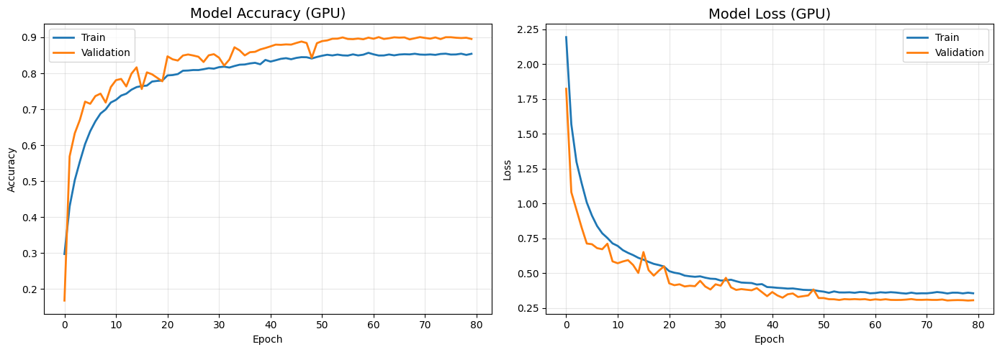

✅ Веса модели сохранены: lstm_cls_mutliclass.weights.h5
✅ Модель сохранена в Keras format: lstm_cls_mutliclass.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_cls_mutliclass_config.json


In [ ]:
model = WellTestLSTM(
    num_classes=num_classes,
    input_shape=(128, 2)
)

trainer = WellTestTrainer(
    model=model.model,
    task_type='classification',
    class_names=class_names
)

history = trainer.train(
    X_train, y_train,
    X_val, y_val,
    batch_size=64,
    epochs=80,
    initial_lr=0.0001
)

metrics = trainer.evaluate(X_test, y_test)

sample = X_test[0]
pred_class, probs, confidence = trainer.predict_single(X_test[0])
print(f"Predicted class: {pred_class}, Confidence: {confidence:.2%}")
print(f"True class: {np.argmax(y_test[0])}")

trainer.plot_training_history(save_path='training_results.png')

trainer.save_model('lstm_cls_mutliclass', format='all')


CONFUSION MATRIX
📊 Confusion matrix сохранена в confusion_matrix.png


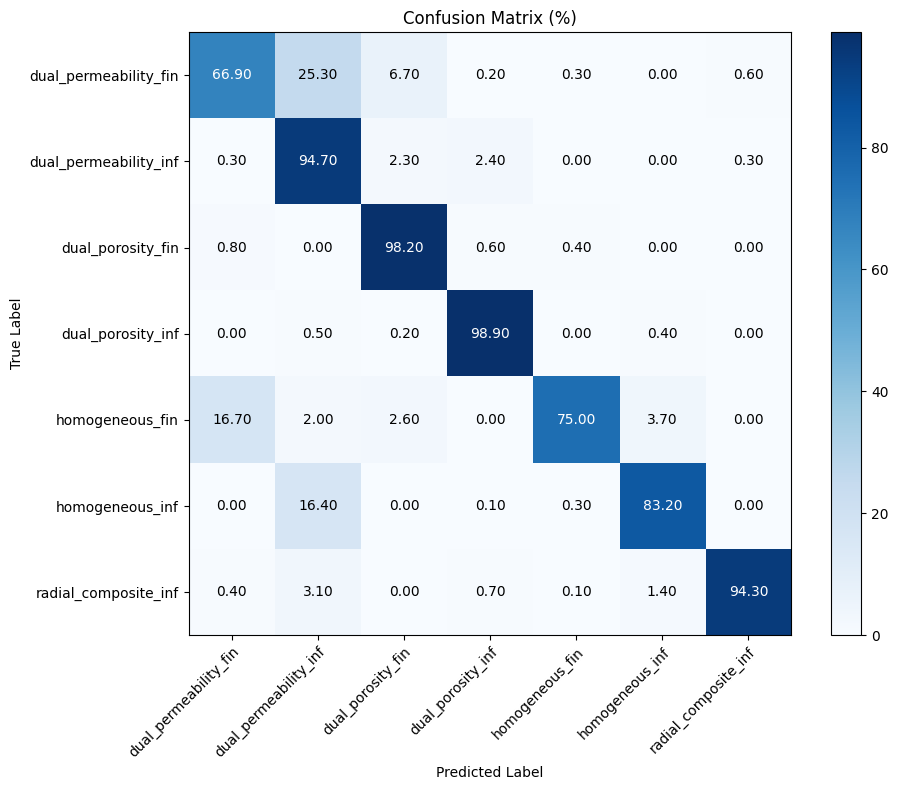

In [ ]:
cm = trainer.plot_confusion_matrix(X_test, y_test,
                                normalize=True,
                                save_path='confusion_matrix.png')

In [ ]:
trainer.save_model('lstm_cls_mutliclass', format='all')

✅ Веса модели сохранены: lstm_cls_mutliclass.weights.h5
✅ Модель сохранена в Keras format: lstm_cls_mutliclass.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_cls_mutliclass_config.json


In [ ]:
import json as _json
_cls_cfg = {
    'task_type': 'classification',
    'class_names': list(class_names),
    'input_shape': [128, 2],
}
with open('lstm_cls_mutliclass_config.json', 'w') as _f:
    _json.dump(_cls_cfg, _f, indent=2)
print('Classification config saved to lstm_cls_mutliclass_config.json')

Classification config saved to lstm_cls_mutliclass_config.json


# Классификация multilabel

In [ ]:
!unzip /content/drive/MyDrive/datasets/cls_data_incs.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: cls_data_incs/params/31.csv  
  inflating: cls_data_incs/params/53.csv  
  inflating: cls_data_incs/params/60.csv  
  inflating: cls_data_incs/params/77.csv  
  inflating: cls_data_incs/params/81.csv  
  inflating: cls_data_incs/params/83.csv  
  inflating: cls_data_incs/params/157.csv  
  inflating: cls_data_incs/params/160.csv  
  inflating: cls_data_incs/params/171.csv  
  inflating: cls_data_incs/params/189.csv  
  inflating: cls_data_incs/params/229.csv  
  inflating: cls_data_incs/params/232.csv  
  inflating: cls_data_incs/params/261.csv  
  inflating: cls_data_incs/params/394.csv  
  inflating: cls_data_incs/params/481.csv  
  inflating: cls_data_incs/params/482.csv  
  inflating: cls_data_incs/params/520.csv  
  inflating: cls_data_incs/params/536.csv  
  inflating: cls_data_incs/params/561.csv  
  inflating: cls_data_incs/params/565.csv  
  inflating: cls_data_incs/params/629.csv  
  inflating: c

## Модель нейронной сети

In [ ]:
from tensorflow import keras
from tensorflow.keras import layers
import numpy as np

class WellTestLSTM_MultiLabel:
    def __init__(self, num_classes=8, input_shape=(128, 2)):
        """
        Инициализация LSTM сети для MULTILABEL классификации кривых ГДИС

        Parameters:
        -----------
        num_classes : int
            Общее количество бинарных меток (4 типа пласта + 2 границы + 2 обрезания = 8)
        input_shape : tuple
            Форма входных данных (временные точки, признаки)
            Для LSTM обычно (timesteps, features)
        """
        self.num_classes = num_classes
        self.input_shape = input_shape
        self.model = self._build_model()

    def _build_model(self):
        """Построение архитектуры LSTM сети для MULTILABEL"""
        inputs = keras.Input(shape=self.input_shape)

        if self.input_shape[0] == 2 and len(self.input_shape) == 2:
            inputs = layers.Permute((2, 1))(inputs)

        # ---- Первый LSTM блок ----
        x = layers.LSTM(
            units=64,
            return_sequences=True,
            name='lstm_1'
        )(inputs)
        x = layers.BatchNormalization(name='bn_1')(x)
        x = layers.Dropout(0.3, name='dropout_1')(x)

        # ---- Второй LSTM блок ----
        x = layers.LSTM(
            units=128,
            return_sequences=True,
            name='lstm_2'
        )(x)
        x = layers.BatchNormalization(name='bn_2')(x)
        x = layers.Dropout(0.3, name='dropout_2')(x)

        # ---- Третий LSTM блок ----
        x = layers.LSTM(
            units=256,
            return_sequences=False,
            name='lstm_3'
        )(x)
        x = layers.BatchNormalization(name='bn_3')(x)
        x = layers.Dropout(0.3, name='dropout_3')(x)

        # ---- Полносвязная часть ----
        x = layers.Dense(128, activation='relu', name='fc1')(x)
        x = layers.BatchNormalization(name='bn_fc1')(x)
        x = layers.Dropout(0.5, name='dropout_fc1')(x)

        x = layers.Dense(64, activation='relu', name='fc2')(x)
        x = layers.BatchNormalization(name='bn_fc2')(x)
        x = layers.Dropout(0.5, name='dropout_fc2')(x)

        outputs = layers.Dense(
            self.num_classes,
            activation='sigmoid',
            name='output'
        )(x)

        model = keras.Model(inputs=inputs, outputs=outputs, name='WellTestLSTM_MultiLabel')

        return model

    def compile_model(self, learning_rate=0.001):
        """
        Компиляция модели с метриками для multilabel
        """
        self.model.compile(
            optimizer=keras.optimizers.Adam(learning_rate=learning_rate),
            loss='binary_crossentropy',
            metrics=[
                'accuracy',
                keras.metrics.Precision(name='precision'),
                keras.metrics.Recall(name='recall'),
                keras.metrics.AUC(name='auc')
            ]
        )
        return self.model

    def summary(self):
        """Вывод архитектуры модели"""
        return self.model.summary()

## Код обучения

In [ ]:
import json
import os
import time

import numpy as np
import pandas as pd
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt

from sklearn.metrics import (classification_report, confusion_matrix,
                             precision_recall_fscore_support, roc_auc_score,
                             mean_squared_error, mean_absolute_error, r2_score,
                             accuracy_score, hamming_loss, jaccard_score)


class WellTestTrainer:
    TASK_TYPES = ['classification', 'regression', 'multilabel']

    def __init__(self, model, task_type='classification', class_names=None,
                 output_names=None, use_mixed_precision=True, multilabel_threshold=0.5):
        """
        Класс для обучения моделей (поддерживает классификацию, регрессию и multilabel)

        Parameters:
        -----------
        model : keras.Model
            Модель для обучения
        task_type : str
            Тип задачи ('classification', 'regression' или 'multilabel')
        class_names : list, optional
            Названия классов (для классификации и multilabel)
        output_names : list, optional
            Названия выходных параметров (для регрессии)
        use_mixed_precision : bool
            Использовать mixed precision для ускорения на GPU
        multilabel_threshold : float
            Порог для бинаризации предсказаний в multilabel (по умолчанию 0.5)
        """
        if task_type not in self.TASK_TYPES:
            raise ValueError(f"task_type должен быть одним из {self.TASK_TYPES}")

        self.model = model
        self.task_type = task_type
        self.class_names = class_names or []
        self.output_names = output_names or [f'output_{i}' for i in range(model.output_shape[-1])]
        self.multilabel_threshold = multilabel_threshold

        self.num_outputs = model.output_shape[-1]

        self.device_type = self._setup_device(use_mixed_precision)

        self.best_model_path = f'best_model_{task_type}.h5'
        self.checkpoint_dir = f'training_checkpoints_{task_type}'
        self.metrics_file = f'training_metrics_{task_type}.json'

        self.history = None
        self.metrics = None
        self.training_time = None
        self.scaler_y = None

        os.makedirs(self.checkpoint_dir, exist_ok=True)

    def _setup_device(self, use_mixed_precision=True):
        """Настройка устройства (GPU/CPU)"""
        print("=" * 60)
        print(f"НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ ({self.task_type.upper()})")
        print("=" * 60)

        gpus = tf.config.list_physical_devices('GPU')

        if gpus:
            print(f"Обнаружено GPU: {len(gpus)}")
            if use_mixed_precision and self.task_type != 'multilabel':
                # Mixed precision может быть проблематичен для multilabel
                tf.keras.mixed_precision.set_global_policy('mixed_float16')
                print("✅ Mixed precision включен")
            return 'GPU'
        else:
            print("GPU не обнаружен, используется CPU")
            return 'CPU'

    def _get_loss_and_metrics(self):
        """Возвращает функцию потерь и метрики в зависимости от типа задачи"""
        if self.task_type == 'classification':
            loss = 'categorical_crossentropy'
            metrics = ['accuracy']
        elif self.task_type == 'multilabel':
            # Для multilabel: бинарная кросс-энтропия
            loss = 'binary_crossentropy'
            metrics = [
                'accuracy',
                keras.metrics.Precision(name='precision'),
                keras.metrics.Recall(name='recall'),
                keras.metrics.AUC(name='auc')
            ]
        else:  # regression
            loss = 'mse'
            metrics = ['mae', 'mse']

        return loss, metrics

    def _get_monitor_metric(self):
        """Возвращает метрику для мониторинга в callbacks"""
        if self.task_type == 'classification':
            return 'val_accuracy', 'max'
        elif self.task_type == 'multilabel':
            # Для multilabel можно мониторить val_auc или val_loss
            return 'val_auc', 'max'
        else:  # regression
            return 'val_loss', 'min'

    def _create_callbacks(self, patience=50, reduce_lr_patience=5):
        """Создание callback'ов для обучения"""
        monitor_metric, monitor_mode = self._get_monitor_metric()

        callbacks = [
            keras.callbacks.ModelCheckpoint(
                filepath=self.best_model_path,
                monitor=monitor_metric,
                mode=monitor_mode,
                save_best_only=True,
                save_weights_only=False,
                verbose=1,
                save_freq='epoch'
            ),

            keras.callbacks.ReduceLROnPlateau(
                monitor=monitor_metric,
                factor=0.5,
                patience=reduce_lr_patience,
                min_lr=1e-6,
                verbose=1,
                mode=monitor_mode
            ),

            keras.callbacks.CSVLogger(
                os.path.join(self.checkpoint_dir, 'training_log.csv'),
                separator=',',
                append=True
            ),

            keras.callbacks.TerminateOnNaN()
        ]

        if self.device_type == 'GPU':
            callbacks.append(
                keras.callbacks.TensorBoard(
                    log_dir=os.path.join(self.checkpoint_dir, 'tensorboard_logs'),
                    histogram_freq=1,
                    write_graph=True,
                    write_images=True,
                    update_freq='epoch'
                )
            )

        return callbacks

    def _get_optimizer(self, initial_lr=0.01, optimizer_type='adam'):
        """Создание оптимизатора"""
        clipnorm = 1.0
        epsilon = 1e-7

        if optimizer_type == 'adam':
            optimizer = keras.optimizers.Adam(
                learning_rate=initial_lr,
                beta_1=0.9,
                beta_2=0.999,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'sgd':
            optimizer = keras.optimizers.SGD(
                learning_rate=initial_lr,
                momentum=0.9,
                nesterov=True,
                clipnorm=clipnorm
            )
        elif optimizer_type == 'rmsprop':
            optimizer = keras.optimizers.RMSprop(
                learning_rate=initial_lr,
                rho=0.9,
                epsilon=epsilon,
                clipnorm=clipnorm
            )
        else:
            raise ValueError(f"Неизвестный оптимизатор: {optimizer_type}")

        return optimizer

    def _compile_model(self, optimizer):
        """Компиляция модели"""
        loss, metrics = self._get_loss_and_metrics()

        self.model.compile(
            optimizer=optimizer,
            loss=loss,
            metrics=metrics
        )

    def set_y_scaler(self, scaler):
        """Установка scaler для нормализации целевых значений (для регрессии)"""
        self.scaler_y = scaler

    def train(self, X_train, y_train, X_val, y_val,
              batch_size=32, epochs=300, initial_lr=0.01,
              optimizer_type='adam', custom_lr_schedule=None,
              class_weight=None, validation_freq=1):
        """
        Обучение модели
        """
        print("\n" + "=" * 60)
        print(f"НАЧАЛО ОБУЧЕНИЯ НА {self.device_type} ({self.task_type.upper()})")
        print("=" * 60)

        print(f"Устройство: {self.device_type}")
        print(f"Размер батча: {batch_size}")
        print(f"Тренировочные данные: X {X_train.shape}, y {y_train.shape}")
        print(f"Валидационные данные: X {X_val.shape}, y {y_val.shape}")
        print(f"Эпохи: {epochs}")

        # Для multilabel проверяем формат меток
        if self.task_type == 'multilabel':
            print(f"Multilabel формат: {y_train.shape[1]} бинарных меток")
            self._print_multilabel_stats(y_train, "Train")
            self._print_multilabel_stats(y_val, "Validation")

        optimizer = self._get_optimizer(initial_lr, optimizer_type)
        self._compile_model(optimizer)

        if custom_lr_schedule is None:
            if self.task_type == 'classification':
                def lr_schedule(epoch, lr):
                    if epoch in [50, 150, 250]:
                        return lr * 0.1
                    return lr
            elif self.task_type == 'multilabel':
                def lr_schedule(epoch, lr):
                    if epoch in [30, 80, 150]:
                        return lr * 0.5
                    return lr
            else:  # regression
                def lr_schedule(epoch, lr):
                    if epoch in [30, 50, 70]:
                        return lr * 0.1
                    return lr
        else:
            lr_schedule = custom_lr_schedule

        lr_scheduler = keras.callbacks.LearningRateScheduler(lr_schedule, verbose=1)

        callbacks = self._create_callbacks()
        callbacks.append(lr_scheduler)

        start_time = time.time()

        try:
            self.history = self.model.fit(
                X_train, y_train,
                validation_data=(X_val, y_val),
                batch_size=batch_size,
                epochs=epochs,
                callbacks=callbacks,
                verbose=1,
                shuffle=True,
                class_weight=class_weight if self.task_type == 'classification' else None,
                validation_freq=validation_freq
            )

            self.training_time = time.time() - start_time

            print(f"\n✅ Обучение завершено за {self.training_time:.2f} секунд")
            print(f"✅ Лучшая модель сохранена в: {self.best_model_path}")

            self._save_training_info(X_train, X_val)

            return self.history

        except Exception as e:
            print(f"\n❌ Ошибка при обучении: {e}")
            print("Попытка восстановления...")

            if os.path.exists(self.best_model_path):
                self.model = keras.models.load_model(self.best_model_path)
                print("✅ Загружена лучшая сохраненная модель")

            raise

    def _print_multilabel_stats(self, y, name):
        """Вывод статистики для multilabel меток"""
        print(f"\n{name} multilabel статистика:")
        print(f"  Форма: {y.shape}")

        # Частота каждой метки
        label_counts = y.sum(axis=0)
        for i, count in enumerate(label_counts):
            label_name = self.class_names[i] if i < len(self.class_names) else f"Label_{i}"
            pct = count / len(y) * 100
            print(f"  {label_name}: {count:.0f} ({pct:.1f}%)")

        # Количество меток на образец
        n_labels_per_sample = y.sum(axis=1)
        print(f"  Среднее меток на образец: {n_labels_per_sample.mean():.2f}")
        print(f"  Медиана меток на образец: {np.median(n_labels_per_sample):.0f}")

    def _save_training_info(self, X_train, X_val):
        """Сохранение информации об обучении"""
        info = {
            'task_type': self.task_type,
            'device_type': self.device_type,
            'training_time': self.training_time,
            'training_samples': len(X_train),
            'validation_samples': len(X_val),
            'input_shape': X_train.shape[1:],
            'model_summary': []
        }

        if self.task_type == 'classification':
            info.update({
                'num_classes': len(self.class_names),
                'class_names': self.class_names
            })
        elif self.task_type == 'multilabel':
            info.update({
                'num_labels': len(self.class_names),
                'label_names': self.class_names,
                'multilabel_threshold': self.multilabel_threshold
            })
        else:  # regression
            info.update({
                'num_outputs': self.num_outputs,
                'output_names': self.output_names
            })

        self.model.summary(print_fn=lambda x: info['model_summary'].append(x))

        with open(self.metrics_file, 'w') as f:
            json.dump(info, f, indent=2, default=str)

        print(f"✅ Информация об обучении сохранена в {self.metrics_file}")

    def evaluate(self, X_test, y_test, batch_size=None):
        """
        Оценка модели на тестовых данных
        """
        print("\n" + "=" * 60)
        print(f"ОЦЕНКА МОДЕЛИ ({self.task_type.upper()})")
        print("=" * 60)

        if batch_size is None:
            batch_size = 32

        # Базовая оценка
        results = self.model.evaluate(
            X_test, y_test,
            batch_size=batch_size,
            verbose=0,
            return_dict=True
        )

        print(f"\n📊 Базовые метрики:")
        for metric_name, metric_value in results.items():
            print(f"  {metric_name}: {metric_value:.4f}")

        # Предсказания
        y_pred = self.model.predict(X_test, batch_size=batch_size, verbose=0)

        # Специфичная оценка в зависимости от типа задачи
        if self.task_type == 'classification':
            self._evaluate_classification(y_test, y_pred)
        elif self.task_type == 'multilabel':
            self._evaluate_multilabel(y_test, y_pred)
        else:  # regression
            self._evaluate_regression(y_test, y_pred, self.scaler_y)

        # Сохранение метрик
        self.metrics = {
            'task_type': self.task_type,
            'test_metrics': results,
            'device_used': self.device_type,
            'evaluation_time': time.time()
        }

        if self.task_type == 'classification':
            self.metrics.update(self._get_classification_metrics_dict())
        elif self.task_type == 'multilabel':
            self.metrics.update(self._get_multilabel_metrics_dict(y_test, y_pred))
        else:
            self.metrics.update(self._get_regression_metrics_dict(y_test, y_pred))

        with open(f'evaluation_metrics_{self.task_type}.json', 'w') as f:
            json.dump(self.metrics, f, indent=2, default=str)

        return self.metrics

    def _evaluate_multilabel(self, y_test, y_pred):
        """
        Оценка для multilabel классификации
        """
        # Бинаризация предсказаний
        y_pred_binary = (y_pred > self.multilabel_threshold).astype(int)
        y_true = y_test

        print(f"\n📊 Multilabel метрики (порог={self.multilabel_threshold}):")

        # 1. Hamming Loss
        hamming = hamming_loss(y_true, y_pred_binary)
        print(f"  Hamming Loss: {hamming:.4f} (чем меньше, тем лучше)")

        # 2. Subset Accuracy (точное совпадение всех меток)
        subset_acc = accuracy_score(y_true, y_pred_binary)
        print(f"  Subset Accuracy: {subset_acc:.4f}")

        # 3. Jaccard Score (Intersection over Union)
        jaccard_micro = jaccard_score(y_true, y_pred_binary, average='micro')
        jaccard_macro = jaccard_score(y_true, y_pred_binary, average='macro')
        print(f"  Jaccard (micro): {jaccard_micro:.4f}")
        print(f"  Jaccard (macro): {jaccard_macro:.4f}")

        # 4. F1 Score по каждому классу
        precision, recall, f1, _ = precision_recall_fscore_support(
            y_true, y_pred_binary, average=None, zero_division=0
        )

        print(f"\n📊 Пер-класс метрики:")
        print(f"{'Метка':<20} | {'Precision':>10} | {'Recall':>10} | {'F1':>10}")
        print("-" * 55)

        for i in range(len(self.class_names)):
            label_name = self.class_names[i] if i < len(self.class_names) else f'Label_{i}'
            print(f"{label_name:<20} | {precision[i]:>10.4f} | {recall[i]:>10.4f} | {f1[i]:>10.4f}")

        # 5. Средние метрики
        print(f"\n📊 Средние метрики:")
        print(f"  Macro F1: {np.mean(f1):.4f}")
        print(f"  Micro F1: {precision_recall_fscore_support(y_true, y_pred_binary, average='micro')[2]:.4f}")

        # 6. ROC AUC если возможно
        try:
            if y_true.shape[1] == 2:
                roc_auc = roc_auc_score(y_true, y_pred)
                print(f"  ROC AUC: {roc_auc:.4f}")
            else:
                roc_auc_macro = roc_auc_score(y_true, y_pred, average='macro', multi_class='ovr')
                print(f"  ROC AUC (macro): {roc_auc_macro:.4f}")
        except Exception as e:
            print(f"  ROC AUC не может быть вычислен: {e}")

    def _get_multilabel_metrics_dict(self, y_test, y_pred):
        """Возвращает словарь с метриками multilabel"""
        y_pred_binary = (y_pred > self.multilabel_threshold).astype(int)
        y_true = y_test

        precision, recall, f1, _ = precision_recall_fscore_support(
            y_true, y_pred_binary, average=None, zero_division=0
        )

        metrics_dict = {
            'threshold': self.multilabel_threshold,
            'hamming_loss': float(hamming_loss(y_true, y_pred_binary)),
            'subset_accuracy': float(accuracy_score(y_true, y_pred_binary)),
            'jaccard_micro': float(jaccard_score(y_true, y_pred_binary, average='micro')),
            'jaccard_macro': float(jaccard_score(y_true, y_pred_binary, average='macro')),
            'macro_f1': float(np.mean(f1)),
            'micro_f1': float(precision_recall_fscore_support(y_true, y_pred_binary, average='micro')[2]),
            'per_label_metrics': {}
        }

        for i, label_name in enumerate(self.class_names):
            metrics_dict['per_label_metrics'][label_name] = {
                'precision': float(precision[i]),
                'recall': float(recall[i]),
                'f1': float(f1[i])
            }

        return metrics_dict

    def _evaluate_classification(self, y_test, y_pred):
        """Оценка для классификации (без изменений)"""
        y_pred_classes = np.argmax(y_pred, axis=1)
        y_true = np.argmax(y_test, axis=1)

        try:
            if len(self.class_names) == 2:
                roc_auc = roc_auc_score(y_true, y_pred[:, 1])
                print(f"\n📈 ROC AUC Score: {roc_auc:.4f}")
            else:
                roc_auc = roc_auc_score(y_true, y_pred, multi_class='ovr', average='macro')
                print(f"\n📈 ROC AUC Score (macro): {roc_auc:.4f}")
        except:
            roc_auc = None
            print("\n⚠️ ROC AUC не может быть вычислен")

        print("\n📊 Classification Report:")
        print(classification_report(
            y_true, y_pred_classes,
            target_names=self.class_names,
            digits=4
        ))

    def _evaluate_regression(self, y_test, y_pred, scaler=None):
        """Оценка для регрессии (без изменений)"""
        if scaler is not None:
            y_test_real = scaler.inverse_transform(y_test)
            y_pred_real = scaler.inverse_transform(y_pred)
        else:
            y_test_real = y_test
            y_pred_real = y_pred

        print("\n📊 Регрессионные метрики (в исходном масштабе):")

        for i in range(self.num_outputs):
            output_name = self.output_names[i] if i < len(self.output_names) else f'Output {i}'

            mse = mean_squared_error(y_test_real[:, i], y_pred_real[:, i])
            mae = mean_absolute_error(y_test_real[:, i], y_pred_real[:, i])
            r2 = r2_score(y_test_real[:, i], y_pred_real[:, i])

            print(f"\n  {output_name}:")
            print(f"    MSE:  {mse:.4e}")
            print(f"    MAE:  {mae:.4e}")
            print(f"    R²:   {r2:.4f}")

            if r2 < 0:
                print(f"    ⚠️  КРИТИЧЕСКАЯ ОШИБКА: Модель работает хуже константы!")

    def _get_regression_metrics_dict(self, y_test, y_pred):
        """Возвращает словарь с метриками регрессии (без изменений)"""
        if self.scaler_y is not None:
            y_test_orig = self.scaler_y.inverse_transform(y_test)
            y_pred_orig = self.scaler_y.inverse_transform(y_pred)
        else:
            y_test_orig = y_test
            y_pred_orig = y_pred

        metrics_dict = {
            'output_names': self.output_names,
            'per_output_metrics': {}
        }

        for i in range(self.num_outputs):
            mse = float(mean_squared_error(y_test_orig[:, i], y_pred_orig[:, i]))
            mae = float(mean_absolute_error(y_test_orig[:, i], y_pred_orig[:, i]))
            r2 = float(r2_score(y_test_orig[:, i], y_pred_orig[:, i]))

            metrics_dict['per_output_metrics'][self.output_names[i]] = {
                'mse': mse,
                'mae': mae,
                'r2': r2
            }

        metrics_dict['overall'] = {
            'mse': float(mean_squared_error(y_test_orig, y_pred_orig)),
            'mae': float(mean_absolute_error(y_test_orig, y_pred_orig))
        }

        return metrics_dict

    def _get_classification_metrics_dict(self):
        """Возвращает словарь с метриками классификации"""
        return {}

    def predict_single(self, X_single, return_original_scale=False):
        """
        Предсказание для одного примера
        """
        X_batch = np.expand_dims(X_single, axis=0)
        predictions = self.model.predict(X_batch, batch_size=1, verbose=0)[0]

        if self.task_type == 'classification':
            predicted_class = np.argmax(predictions)
            confidence = predictions[predicted_class]
            return predicted_class, predictions, confidence

        elif self.task_type == 'multilabel':
            # Возвращаем бинарные метки и вероятности
            predicted_labels = (predictions > self.multilabel_threshold).astype(int)
            return predicted_labels, predictions

        else:  # regression
            if return_original_scale and self.scaler_y is not None:
                predictions = predictions.reshape(1, -1)
                predictions = self.scaler_y.inverse_transform(predictions)[0]
            return predictions

    def plot_training_history(self, save_path=None):
        """Визуализация истории обучения"""
        if self.history is None:
            print("⚠️ Модель еще не обучена!")
            return

        history_dict = self.history.history

        if self.task_type == 'classification':
            self._plot_classification_history(history_dict, save_path)
        elif self.task_type == 'multilabel':
            self._plot_multilabel_history(history_dict, save_path)
        else:
            self._plot_regression_history(history_dict, save_path)

    def _plot_multilabel_history(self, history_dict, save_path):
        """Визуализация истории для multilabel"""
        fig, axes = plt.subplots(2, 2, figsize=(14, 10))

        # Loss
        axes[0, 0].plot(history_dict['loss'], label='Train', linewidth=2)
        axes[0, 0].plot(history_dict['val_loss'], label='Validation', linewidth=2)
        axes[0, 0].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[0, 0].set_xlabel('Epoch')
        axes[0, 0].set_ylabel('Loss')
        axes[0, 0].legend()
        axes[0, 0].grid(True, alpha=0.3)

        # Accuracy
        axes[0, 1].plot(history_dict['accuracy'], label='Train', linewidth=2)
        axes[0, 1].plot(history_dict['val_accuracy'], label='Validation', linewidth=2)
        axes[0, 1].set_title(f'Model Accuracy ({self.device_type})', fontsize=14)
        axes[0, 1].set_xlabel('Epoch')
        axes[0, 1].set_ylabel('Accuracy')
        axes[0, 1].legend()
        axes[0, 1].grid(True, alpha=0.3)

        # Precision/Recall если есть
        if 'precision' in history_dict:
            axes[1, 0].plot(history_dict['precision'], label='Train Precision', linewidth=2)
            axes[1, 0].plot(history_dict['val_precision'], label='Val Precision', linewidth=2)
            axes[1, 0].plot(history_dict['recall'], label='Train Recall', linewidth=2)
            axes[1, 0].plot(history_dict['val_recall'], label='Val Recall', linewidth=2)
            axes[1, 0].set_title('Precision & Recall', fontsize=14)
            axes[1, 0].set_xlabel('Epoch')
            axes[1, 0].legend()
            axes[1, 0].grid(True, alpha=0.3)

        # AUC если есть
        if 'auc' in history_dict:
            axes[1, 1].plot(history_dict['auc'], label='Train AUC', linewidth=2)
            axes[1, 1].plot(history_dict['val_auc'], label='Validation AUC', linewidth=2)
            axes[1, 1].set_title('ROC AUC', fontsize=14)
            axes[1, 1].set_xlabel('Epoch')
            axes[1, 1].legend()
            axes[1, 1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def _plot_classification_history(self, history_dict, save_path):
        """Визуализация истории для классификации (без изменений)"""
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        axes[0].plot(history_dict['accuracy'], label='Train', linewidth=2)
        axes[0].plot(history_dict['val_accuracy'], label='Validation', linewidth=2)
        axes[0].set_title(f'Model Accuracy ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Accuracy')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        axes[1].plot(history_dict['loss'], label='Train', linewidth=2)
        axes[1].plot(history_dict['val_loss'], label='Validation', linewidth=2)
        axes[1].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[1].set_xlabel('Epoch')
        axes[1].set_ylabel('Loss')
        axes[1].legend()
        axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def _plot_regression_history(self, history_dict, save_path):
        """Визуализация истории для регрессии (без изменений)"""
        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        axes[0].plot(history_dict['loss'], label='Train Loss', linewidth=2)
        axes[0].plot(history_dict['val_loss'], label='Validation Loss', linewidth=2)
        axes[0].set_title(f'Model Loss ({self.device_type})', fontsize=14)
        axes[0].set_xlabel('Epoch')
        axes[0].set_ylabel('Loss')
        axes[0].legend()
        axes[0].grid(True, alpha=0.3)

        if 'mae' in history_dict:
            axes[1].plot(history_dict['mae'], label='Train MAE', linewidth=2)
            axes[1].plot(history_dict['val_mae'], label='Validation MAE', linewidth=2)
            axes[1].set_title(f'Model MAE ({self.device_type})', fontsize=14)
            axes[1].set_xlabel('Epoch')
            axes[1].set_ylabel('MAE')
            axes[1].legend()
            axes[1].grid(True, alpha=0.3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=150, bbox_inches='tight')
            print(f"📊 График сохранен в {save_path}")

        plt.show()

    def save_model(self, path=None, format='keras'):
        """Сохранение модели"""
        if path is None:
            path = f'welltest_model_{self.task_type}'

        os.makedirs(os.path.dirname(path) if os.path.dirname(path) else '.', exist_ok=True)

        if format in ['h5', 'all']:
            try:
                weights_path = f"{path}.weights.h5"
                self.model.save_weights(weights_path)
                print(f"✅ Веса модели сохранены: {weights_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить веса: {e}")

        if format in ['keras', 'all']:
            keras_path = f"{path}.keras" if not path.endswith('.keras') else path
            try:
                self.model.save(keras_path)
                print(f"✅ Модель сохранена в Keras format: {keras_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в Keras format: {e}")

        if format in ['savedmodel', 'all']:
            savedmodel_path = f"{path}_savedmodel"
            try:
                tf.saved_model.save(self.model, savedmodel_path)
                print(f"✅ Модель сохранена в SavedModel: {savedmodel_path}")
            except Exception as e:
                print(f"❌ Не удалось сохранить в SavedModel: {e}")

        config = {
            'task_type': self.task_type,
            'class_names': self.class_names if self.task_type in ['classification', 'multilabel'] else [],
            'output_names': self.output_names if self.task_type == 'regression' else [],
            'num_outputs': self.num_outputs if self.task_type == 'regression' else None,
            'input_shape': self.model.input_shape[1:],
            'device_used': self.device_type,
            'model_format': format,
            'save_time': time.strftime('%Y-%m-%d %H:%M:%S')
        }

        if self.task_type == 'multilabel':
            config['multilabel_threshold'] = self.multilabel_threshold

        config_path = f"{path}_config.json"
        with open(config_path, 'w') as f:
            json.dump(config, f, indent=2)
        print(f"✅ Конфигурация сохранена: {config_path}")

## Обучение

In [ ]:
data_preprocess = PressureDataMultilabelClassificationCustomPreprocessor1D(data_dir='/content/cls_data_incs')

X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

In [ ]:
X_train = data_preprocess.normalize(X_train)
X_val = data_preprocess.normalize(X_val)
X_test = data_preprocess.normalize(X_test)

In [ ]:
model = WellTestLSTM_MultiLabel(
    num_classes=9,  # 4 типа пласта + 2 границы + 3 обрезания
    input_shape=(128, 2)
)

trainer = WellTestTrainer(
    model=model.model,
    task_type='multilabel',
    class_names=[
        'homogeneous', 'dual_porosity', 'dual_permeability', 'radial_composite',
        'inf', 'fin',
        'inc1', 'inc2', 'full'
    ],
    use_mixed_precision=False
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (MULTILABEL)
Обнаружено GPU: 1


In [ ]:
# Обучение
history = trainer.train(
    X_train, y_train,
    X_val, y_val,
    batch_size=32,
    epochs=100,
    initial_lr=0.001
)


НАЧАЛО ОБУЧЕНИЯ НА GPU (MULTILABEL)
Устройство: GPU
Размер батча: 32
Тренировочные данные: X (24500, 128, 2), y (24500, 9)
Валидационные данные: X (3500, 128, 2), y (3500, 9)
Эпохи: 100
Multilabel формат: 9 бинарных меток

Train multilabel статистика:
  Форма: (24500, 9)
  homogeneous: 7000 (28.6%)
  dual_porosity: 7000 (28.6%)
  dual_permeability: 7000 (28.6%)
  radial_composite: 3500 (14.3%)
  inf: 14000 (57.1%)
  fin: 10500 (42.9%)
  inc1: 8152 (33.3%)
  inc2: 8154 (33.3%)
  full: 8194 (33.4%)
  Среднее меток на образец: 3.00
  Медиана меток на образец: 3

Validation multilabel статистика:
  Форма: (3500, 9)
  homogeneous: 1000 (28.6%)
  dual_porosity: 1000 (28.6%)
  dual_permeability: 1000 (28.6%)
  radial_composite: 500 (14.3%)
  inf: 2000 (57.1%)
  fin: 1500 (42.9%)
  inc1: 1183 (33.8%)
  inc2: 1144 (32.7%)
  full: 1173 (33.5%)
  Среднее меток на образец: 3.00
  Медиана меток на образец: 3

Epoch 1: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 1/10


Epoch 1: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 39s 35ms/step - accuracy: 0.0119 - auc: 0.8270 - loss: 0.4706 - precision: 0.6390 - recall: 0.6211 - val_accuracy: 0.0000e+00 - val_auc: 0.8991 - val_loss: 0.3481 - val_precision: 0.8393 - val_recall: 0.5802 - learning_rate: 0.0010

Epoch 2: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 2/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0010 - auc: 0.8870 - loss: 0.3666 - precision: 0.7842 - recall: 0.6084
Epoch 2: val_auc did not improve from 0.89906
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 8.5714e-04 - auc: 0.8905 - loss: 0.3617 - precision: 0.7883 - recall: 0.6102 - val_accuracy: 0.0000e+00 - val_auc: 0.8960 - val_loss: 0.3497 - val_precision: 0.8373 - val_recall: 0.5903 - learning_rate: 0.0010

Epoch 3: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 3/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.0


Epoch 3: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0016 - auc: 0.9020 - loss: 0.3451 - precision: 0.8003 - recall: 0.6264 - val_accuracy: 0.0000e+00 - val_auc: 0.9269 - val_loss: 0.3050 - val_precision: 0.8418 - val_recall: 0.6390 - learning_rate: 0.0010

Epoch 4: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 4/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - accuracy: 0.0011 - auc: 0.9062 - loss: 0.3386 - precision: 0.8033 - recall: 0.6325
Epoch 4: val_auc did not improve from 0.92686
766/766 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - accuracy: 0.0014 - auc: 0.9084 - loss: 0.3345 - precision: 0.8050 - recall: 0.6370 - val_accuracy: 5.7143e-04 - val_auc: 0.6315 - val_loss: 1.4309 - val_precision: 0.5298 - val_recall: 0.4281 - learning_rate: 0.0010

Epoch 5: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 5/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.0017 


Epoch 7: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - accuracy: 0.0015 - auc: 0.9149 - loss: 0.3232 - precision: 0.8072 - recall: 0.6509 - val_accuracy: 0.0000e+00 - val_auc: 0.9347 - val_loss: 0.2868 - val_precision: 0.8454 - val_recall: 0.6649 - learning_rate: 0.0010

Epoch 8: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 8/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0026 - auc: 0.9197 - loss: 0.3154 - precision: 0.8090 - recall: 0.6621
Epoch 8: val_auc did not improve from 0.93469
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.0020 - auc: 0.9193 - loss: 0.3161 - precision: 0.8089 - recall: 0.6643 - val_accuracy: 0.0000e+00 - val_auc: 0.9294 - val_loss: 0.2968 - val_precision: 0.8205 - val_recall: 0.6770 - learning_rate: 0.0010

Epoch 9: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 9/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0017 


Epoch 12: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0029 - auc: 0.9322 - loss: 0.2952 - precision: 0.8142 - recall: 0.7152 - val_accuracy: 0.0000e+00 - val_auc: 0.9496 - val_loss: 0.2595 - val_precision: 0.8314 - val_recall: 0.7562 - learning_rate: 0.0010

Epoch 13: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 13/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.0037 - auc: 0.9366 - loss: 0.2875 - precision: 0.8140 - recall: 0.7308
Epoch 13: val_auc did not improve from 0.94962
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0040 - auc: 0.9386 - loss: 0.2839 - precision: 0.8162 - recall: 0.7405 - val_accuracy: 0.0000e+00 - val_auc: 0.9479 - val_loss: 0.2633 - val_precision: 0.8102 - val_recall: 0.7837 - learning_rate: 0.0010

Epoch 14: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 14/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0


Epoch 15: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - accuracy: 0.0063 - auc: 0.9489 - loss: 0.2610 - precision: 0.8246 - recall: 0.7725 - val_accuracy: 0.0000e+00 - val_auc: 0.9536 - val_loss: 0.2506 - val_precision: 0.8224 - val_recall: 0.7932 - learning_rate: 0.0010

Epoch 16: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 16/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0054 - auc: 0.9498 - loss: 0.2597 - precision: 0.8268 - recall: 0.7765
Epoch 16: val_auc improved from 0.95364 to 0.95836, saving model to best_model_multilabel.h5



Epoch 16: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0061 - auc: 0.9512 - loss: 0.2561 - precision: 0.8288 - recall: 0.7793 - val_accuracy: 0.0000e+00 - val_auc: 0.9584 - val_loss: 0.2348 - val_precision: 0.8393 - val_recall: 0.7961 - learning_rate: 0.0010

Epoch 17: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 17/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0074 - auc: 0.9533 - loss: 0.2510 - precision: 0.8311 - recall: 0.7858
Epoch 17: val_auc did not improve from 0.95836
766/766 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - accuracy: 0.0080 - auc: 0.9528 - loss: 0.2524 - precision: 0.8300 - recall: 0.7827 - val_accuracy: 0.0123 - val_auc: 0.9542 - val_loss: 0.2525 - val_precision: 0.8307 - val_recall: 0.7983 - learning_rate: 0.0010

Epoch 18: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 18/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.007


Epoch 18: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.0077 - auc: 0.9551 - loss: 0.2460 - precision: 0.8332 - recall: 0.7893 - val_accuracy: 0.0034 - val_auc: 0.9658 - val_loss: 0.2149 - val_precision: 0.8467 - val_recall: 0.8190 - learning_rate: 0.0010

Epoch 19: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 19/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0085 - auc: 0.9575 - loss: 0.2397 - precision: 0.8377 - recall: 0.7952
Epoch 19: val_auc improved from 0.96583 to 0.96770, saving model to best_model_multilabel.h5



Epoch 19: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - accuracy: 0.0089 - auc: 0.9570 - loss: 0.2408 - precision: 0.8361 - recall: 0.7935 - val_accuracy: 0.0000e+00 - val_auc: 0.9677 - val_loss: 0.2069 - val_precision: 0.8516 - val_recall: 0.8148 - learning_rate: 0.0010

Epoch 20: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 20/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0091 - auc: 0.9568 - loss: 0.2410 - precision: 0.8359 - recall: 0.7906
Epoch 20: val_auc did not improve from 0.96770
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0090 - auc: 0.9575 - loss: 0.2389 - precision: 0.8366 - recall: 0.7918 - val_accuracy: 0.0000e+00 - val_auc: 0.9673 - val_loss: 0.2084 - val_precision: 0.8525 - val_recall: 0.8149 - learning_rate: 0.0010

Epoch 21: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 21/100
764/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0


Epoch 22: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0107 - auc: 0.9593 - loss: 0.2339 - precision: 0.8393 - recall: 0.7988 - val_accuracy: 0.0000e+00 - val_auc: 0.9706 - val_loss: 0.1973 - val_precision: 0.8544 - val_recall: 0.8318 - learning_rate: 0.0010

Epoch 23: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 23/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0111 - auc: 0.9615 - loss: 0.2270 - precision: 0.8420 - recall: 0.8036
Epoch 23: val_auc improved from 0.97061 to 0.97371, saving model to best_model_multilabel.h5



Epoch 23: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.0111 - auc: 0.9612 - loss: 0.2277 - precision: 0.8405 - recall: 0.8034 - val_accuracy: 0.0000e+00 - val_auc: 0.9737 - val_loss: 0.1850 - val_precision: 0.8614 - val_recall: 0.8364 - learning_rate: 0.0010

Epoch 24: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 24/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0118 - auc: 0.9624 - loss: 0.2256 - precision: 0.8460 - recall: 0.8088
Epoch 24: val_auc did not improve from 0.97371
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0116 - auc: 0.9613 - loss: 0.2281 - precision: 0.8421 - recall: 0.8052 - val_accuracy: 0.0000e+00 - val_auc: 0.9701 - val_loss: 0.1985 - val_precision: 0.8540 - val_recall: 0.8287 - learning_rate: 0.0010

Epoch 25: LearningRateScheduler setting learning rate to 0.0010000000474974513.
Epoch 25/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0


Epoch 29: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0131 - auc: 0.9670 - loss: 0.2092 - precision: 0.8493 - recall: 0.8193 - val_accuracy: 0.0000e+00 - val_auc: 0.9761 - val_loss: 0.1735 - val_precision: 0.8671 - val_recall: 0.8410 - learning_rate: 5.0000e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 30/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0149 - auc: 0.9675 - loss: 0.2064 - precision: 0.8494 - recall: 0.8194
Epoch 30: val_auc did not improve from 0.97613
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0150 - auc: 0.9676 - loss: 0.2060 - precision: 0.8492 - recall: 0.8200 - val_accuracy: 0.0000e+00 - val_auc: 0.9751 - val_loss: 0.1784 - val_precision: 0.8608 - val_recall: 0.8442 - learning_rate: 5.0000e-04

Epoch 31: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 31/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - acc


Epoch 31: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.0154 - auc: 0.9696 - loss: 0.1999 - precision: 0.8540 - recall: 0.8279 - val_accuracy: 0.0000e+00 - val_auc: 0.9769 - val_loss: 0.1707 - val_precision: 0.8683 - val_recall: 0.8483 - learning_rate: 2.5000e-04

Epoch 32: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 32/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0183 - auc: 0.9695 - loss: 0.1997 - precision: 0.8533 - recall: 0.8252
Epoch 32: val_auc did not improve from 0.97687
766/766 ━━━━━━━━━━━━━━━━━━━━ 43s 33ms/step - accuracy: 0.0166 - auc: 0.9695 - loss: 0.1998 - precision: 0.8531 - recall: 0.8254 - val_accuracy: 0.0000e+00 - val_auc: 0.9767 - val_loss: 0.1715 - val_precision: 0.8675 - val_recall: 0.8485 - learning_rate: 2.5000e-04

Epoch 33: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 33/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - acc


Epoch 36: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0158 - auc: 0.9712 - loss: 0.1935 - precision: 0.8564 - recall: 0.8314 - val_accuracy: 0.0000e+00 - val_auc: 0.9774 - val_loss: 0.1685 - val_precision: 0.8693 - val_recall: 0.8508 - learning_rate: 2.5000e-04

Epoch 37: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 37/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.0183 - auc: 0.9717 - loss: 0.1916 - precision: 0.8573 - recall: 0.8312
Epoch 37: val_auc did not improve from 0.97737
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.0183 - auc: 0.9714 - loss: 0.1931 - precision: 0.8571 - recall: 0.8316 - val_accuracy: 0.0000e+00 - val_auc: 0.9771 - val_loss: 0.1686 - val_precision: 0.8678 - val_recall: 0.8472 - learning_rate: 2.5000e-04

Epoch 38: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 38/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - acc


Epoch 38: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0185 - auc: 0.9711 - loss: 0.1937 - precision: 0.8558 - recall: 0.8301 - val_accuracy: 0.0000e+00 - val_auc: 0.9775 - val_loss: 0.1667 - val_precision: 0.8657 - val_recall: 0.8504 - learning_rate: 2.5000e-04

Epoch 39: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 39/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0206 - auc: 0.9713 - loss: 0.1930 - precision: 0.8566 - recall: 0.8306
Epoch 39: val_auc did not improve from 0.97746
766/766 ━━━━━━━━━━━━━━━━━━━━ 40s 31ms/step - accuracy: 0.0200 - auc: 0.9713 - loss: 0.1933 - precision: 0.8570 - recall: 0.8316 - val_accuracy: 0.0000e+00 - val_auc: 0.9773 - val_loss: 0.1675 - val_precision: 0.8677 - val_recall: 0.8465 - learning_rate: 2.5000e-04

Epoch 40: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 40/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - acc


Epoch 42: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - accuracy: 0.0203 - auc: 0.9727 - loss: 0.1878 - precision: 0.8597 - recall: 0.8355 - val_accuracy: 0.0000e+00 - val_auc: 0.9775 - val_loss: 0.1659 - val_precision: 0.8683 - val_recall: 0.8473 - learning_rate: 1.2500e-04

Epoch 43: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 43/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.0202 - auc: 0.9735 - loss: 0.1856 - precision: 0.8615 - recall: 0.8381
Epoch 43: val_auc improved from 0.97748 to 0.97804, saving model to best_model_multilabel.h5



Epoch 43: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.0204 - auc: 0.9731 - loss: 0.1864 - precision: 0.8600 - recall: 0.8357 - val_accuracy: 0.0000e+00 - val_auc: 0.9780 - val_loss: 0.1643 - val_precision: 0.8705 - val_recall: 0.8523 - learning_rate: 1.2500e-04

Epoch 44: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 44/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0231 - auc: 0.9737 - loss: 0.1842 - precision: 0.8631 - recall: 0.8381
Epoch 44: val_auc did not improve from 0.97804
766/766 ━━━━━━━━━━━━━━━━━━━━ 42s 32ms/step - accuracy: 0.0214 - auc: 0.9731 - loss: 0.1864 - precision: 0.8609 - recall: 0.8369 - val_accuracy: 0.0000e+00 - val_auc: 0.9780 - val_loss: 0.1649 - val_precision: 0.8687 - val_recall: 0.8510 - learning_rate: 1.2500e-04

Epoch 45: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 45/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - acc


Epoch 46: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0212 - auc: 0.9735 - loss: 0.1848 - precision: 0.8621 - recall: 0.8378 - val_accuracy: 0.0000e+00 - val_auc: 0.9782 - val_loss: 0.1643 - val_precision: 0.8699 - val_recall: 0.8510 - learning_rate: 1.2500e-04

Epoch 47: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 47/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0203 - auc: 0.9728 - loss: 0.1870 - precision: 0.8587 - recall: 0.8347
Epoch 47: val_auc improved from 0.97818 to 0.97839, saving model to best_model_multilabel.h5



Epoch 47: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - accuracy: 0.0209 - auc: 0.9733 - loss: 0.1849 - precision: 0.8589 - recall: 0.8363 - val_accuracy: 0.0000e+00 - val_auc: 0.9784 - val_loss: 0.1630 - val_precision: 0.8690 - val_recall: 0.8535 - learning_rate: 1.2500e-04

Epoch 48: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 48/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0204 - auc: 0.9734 - loss: 0.1853 - precision: 0.8609 - recall: 0.8372
Epoch 48: val_auc did not improve from 0.97839
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0215 - auc: 0.9735 - loss: 0.1846 - precision: 0.8609 - recall: 0.8373 - val_accuracy: 0.0000e+00 - val_auc: 0.9779 - val_loss: 0.1647 - val_precision: 0.8685 - val_recall: 0.8502 - learning_rate: 1.2500e-04

Epoch 49: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 49/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - acc


Epoch 49: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - accuracy: 0.0221 - auc: 0.9735 - loss: 0.1847 - precision: 0.8600 - recall: 0.8381 - val_accuracy: 0.0000e+00 - val_auc: 0.9784 - val_loss: 0.1632 - val_precision: 0.8685 - val_recall: 0.8520 - learning_rate: 1.2500e-04

Epoch 50: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 50/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - accuracy: 0.0221 - auc: 0.9734 - loss: 0.1847 - precision: 0.8607 - recall: 0.8364
Epoch 50: val_auc did not improve from 0.97842
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0206 - auc: 0.9735 - loss: 0.1845 - precision: 0.8606 - recall: 0.8366 - val_accuracy: 0.0000e+00 - val_auc: 0.9779 - val_loss: 0.1652 - val_precision: 0.8674 - val_recall: 0.8512 - learning_rate: 1.2500e-04

Epoch 51: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 51/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - acc


Epoch 53: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0191 - auc: 0.9739 - loss: 0.1830 - precision: 0.8627 - recall: 0.8384 - val_accuracy: 0.0000e+00 - val_auc: 0.9784 - val_loss: 0.1622 - val_precision: 0.8704 - val_recall: 0.8518 - learning_rate: 6.2500e-05

Epoch 54: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 54/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.0226 - auc: 0.9742 - loss: 0.1815 - precision: 0.8623 - recall: 0.8389
Epoch 54: val_auc did not improve from 0.97844
766/766 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - accuracy: 0.0217 - auc: 0.9740 - loss: 0.1826 - precision: 0.8613 - recall: 0.8385 - val_accuracy: 0.0000e+00 - val_auc: 0.9784 - val_loss: 0.1629 - val_precision: 0.8690 - val_recall: 0.8513 - learning_rate: 6.2500e-05

Epoch 55: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 55/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accur


Epoch 56: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0221 - auc: 0.9742 - loss: 0.1817 - precision: 0.8624 - recall: 0.8407 - val_accuracy: 0.0000e+00 - val_auc: 0.9786 - val_loss: 0.1625 - val_precision: 0.8690 - val_recall: 0.8520 - learning_rate: 6.2500e-05

Epoch 57: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 57/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0231 - auc: 0.9747 - loss: 0.1797 - precision: 0.8638 - recall: 0.8414
Epoch 57: val_auc did not improve from 0.97864
766/766 ━━━━━━━━━━━━━━━━━━━━ 41s 32ms/step - accuracy: 0.0245 - auc: 0.9746 - loss: 0.1806 - precision: 0.8634 - recall: 0.8411 - val_accuracy: 0.0000e+00 - val_auc: 0.9783 - val_loss: 0.1627 - val_precision: 0.8696 - val_recall: 0.8505 - learning_rate: 6.2500e-05

Epoch 58: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 58/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accur


Epoch 63: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 41s 33ms/step - accuracy: 0.0233 - auc: 0.9747 - loss: 0.1795 - precision: 0.8636 - recall: 0.8407 - val_accuracy: 0.0000e+00 - val_auc: 0.9787 - val_loss: 0.1621 - val_precision: 0.8711 - val_recall: 0.8532 - learning_rate: 3.1250e-05

Epoch 64: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 64/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0225 - auc: 0.9747 - loss: 0.1799 - precision: 0.8621 - recall: 0.8407
Epoch 64: val_auc did not improve from 0.97866
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0224 - auc: 0.9747 - loss: 0.1798 - precision: 0.8629 - recall: 0.8402 - val_accuracy: 0.0000e+00 - val_auc: 0.9785 - val_loss: 0.1626 - val_precision: 0.8706 - val_recall: 0.8531 - learning_rate: 3.1250e-05

Epoch 65: LearningRateScheduler setting learning rate to 3.125000148429535e-05.
Epoch 65/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - acc


Epoch 67: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - accuracy: 0.0262 - auc: 0.9754 - loss: 0.1776 - precision: 0.8655 - recall: 0.8436 - val_accuracy: 0.0000e+00 - val_auc: 0.9787 - val_loss: 0.1615 - val_precision: 0.8710 - val_recall: 0.8524 - learning_rate: 1.5625e-05

Epoch 68: LearningRateScheduler setting learning rate to 1.5625000742147677e-05.
Epoch 68/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0256 - auc: 0.9747 - loss: 0.1801 - precision: 0.8642 - recall: 0.8408
Epoch 68: val_auc did not improve from 0.97872
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0244 - auc: 0.9750 - loss: 0.1787 - precision: 0.8644 - recall: 0.8419 - val_accuracy: 0.0000e+00 - val_auc: 0.9787 - val_loss: 0.1614 - val_precision: 0.8684 - val_recall: 0.8521 - learning_rate: 1.5625e-05

Epoch 69: LearningRateScheduler setting learning rate to 1.5625000742147677e-05.
Epoch 69/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - a


Epoch 84: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 41s 34ms/step - accuracy: 0.0260 - auc: 0.9752 - loss: 0.1779 - precision: 0.8643 - recall: 0.8431 - val_accuracy: 0.0000e+00 - val_auc: 0.9787 - val_loss: 0.1613 - val_precision: 0.8708 - val_recall: 0.8523 - learning_rate: 1.0000e-06

Epoch 85: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 85/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0254 - auc: 0.9757 - loss: 0.1757 - precision: 0.8646 - recall: 0.8445
Epoch 85: val_auc improved from 0.97874 to 0.97877, saving model to best_model_multilabel.h5



Epoch 85: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0261 - auc: 0.9756 - loss: 0.1767 - precision: 0.8649 - recall: 0.8438 - val_accuracy: 0.0000e+00 - val_auc: 0.9788 - val_loss: 0.1613 - val_precision: 0.8710 - val_recall: 0.8524 - learning_rate: 1.0000e-06

Epoch 86: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 86/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0228 - auc: 0.9752 - loss: 0.1771 - precision: 0.8624 - recall: 0.8425
Epoch 86: val_auc did not improve from 0.97877
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 31ms/step - accuracy: 0.0243 - auc: 0.9755 - loss: 0.1767 - precision: 0.8638 - recall: 0.8430 - val_accuracy: 0.0000e+00 - val_auc: 0.9786 - val_loss: 0.1618 - val_precision: 0.8702 - val_recall: 0.8528 - learning_rate: 1.0000e-06

Epoch 87: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 87/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - acc


Epoch 91: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 26s 33ms/step - accuracy: 0.0275 - auc: 0.9755 - loss: 0.1769 - precision: 0.8643 - recall: 0.8426 - val_accuracy: 0.0000e+00 - val_auc: 0.9788 - val_loss: 0.1613 - val_precision: 0.8697 - val_recall: 0.8538 - learning_rate: 1.0000e-06

Epoch 92: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 92/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - accuracy: 0.0260 - auc: 0.9750 - loss: 0.1785 - precision: 0.8640 - recall: 0.8428
Epoch 92: val_auc did not improve from 0.97877
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - accuracy: 0.0263 - auc: 0.9755 - loss: 0.1766 - precision: 0.8632 - recall: 0.8430 - val_accuracy: 0.0000e+00 - val_auc: 0.9787 - val_loss: 0.1616 - val_precision: 0.8710 - val_recall: 0.8546 - learning_rate: 1.0000e-06

Epoch 93: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 93/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - acc


Epoch 94: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 33ms/step - accuracy: 0.0272 - auc: 0.9751 - loss: 0.1781 - precision: 0.8627 - recall: 0.8419 - val_accuracy: 0.0000e+00 - val_auc: 0.9788 - val_loss: 0.1614 - val_precision: 0.8706 - val_recall: 0.8528 - learning_rate: 1.0000e-06

Epoch 95: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 95/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - accuracy: 0.0238 - auc: 0.9752 - loss: 0.1778 - precision: 0.8633 - recall: 0.8428
Epoch 95: val_auc did not improve from 0.97877
766/766 ━━━━━━━━━━━━━━━━━━━━ 25s 32ms/step - accuracy: 0.0256 - auc: 0.9753 - loss: 0.1773 - precision: 0.8636 - recall: 0.8428 - val_accuracy: 0.0000e+00 - val_auc: 0.9787 - val_loss: 0.1616 - val_precision: 0.8696 - val_recall: 0.8534 - learning_rate: 1.0000e-06

Epoch 96: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 96/100
765/766 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - acc


Epoch 97: finished saving model to best_model_multilabel.h5
766/766 ━━━━━━━━━━━━━━━━━━━━ 24s 32ms/step - accuracy: 0.0276 - auc: 0.9753 - loss: 0.1773 - precision: 0.8636 - recall: 0.8417 - val_accuracy: 0.0000e+00 - val_auc: 0.9788 - val_loss: 0.1613 - val_precision: 0.8700 - val_recall: 0.8538 - learning_rate: 1.0000e-06

Epoch 98: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 98/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - accuracy: 0.0257 - auc: 0.9757 - loss: 0.1763 - precision: 0.8657 - recall: 0.8437
Epoch 98: val_auc did not improve from 0.97878
766/766 ━━━━━━━━━━━━━━━━━━━━ 26s 34ms/step - accuracy: 0.0266 - auc: 0.9755 - loss: 0.1769 - precision: 0.8645 - recall: 0.8423 - val_accuracy: 0.0000e+00 - val_auc: 0.9787 - val_loss: 0.1615 - val_precision: 0.8706 - val_recall: 0.8530 - learning_rate: 1.0000e-06

Epoch 99: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 99/100
766/766 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - acc

✅ Информация об обучении сохранена в training_metrics_multilabel.json


In [ ]:
# Оценка
metrics = trainer.evaluate(X_test, y_test)

# Предсказание
predicted_labels, probabilities = trainer.predict_single(X_test[0])


ОЦЕНКА МОДЕЛИ (MULTILABEL)

📊 Базовые метрики:
  accuracy: 0.0000
  auc: 0.9788
  loss: 0.1614
  precision: 0.8713
  recall: 0.8543

📊 Multilabel метрики (порог=0.5):
  Hamming Loss: 0.0906 (чем меньше, тем лучше)
  Subset Accuracy: 0.6049
  Jaccard (micro): 0.7586
  Jaccard (macro): 0.7845

📊 Пер-класс метрики:
Метка                |  Precision |     Recall |         F1
-------------------------------------------------------
homogeneous          |     0.8623 |     0.8075 |     0.8340
dual_porosity        |     0.8548 |     0.8800 |     0.8672
dual_permeability    |     0.9915 |     0.9860 |     0.9887
radial_composite     |     0.9477 |     0.6340 |     0.7597
inf                  |     0.6646 |     0.9885 |     0.7949
fin                  |     0.9562 |     0.3350 |     0.4962
inc1                 |     1.0000 |     1.0000 |     1.0000
inc2                 |     1.0000 |     1.0000 |     1.0000
full                 |     1.0000 |     1.0000 |     1.0000

📊 Средние метрики:
  Macro F

In [ ]:
trainer.save_model('lstm_cls_multilabel', format='all')

✅ Веса модели сохранены: lstm_cls_multilabel.weights.h5
✅ Модель сохранена в Keras format: lstm_cls_multilabel.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_cls_multilabel_config.json


# Обучение однородной модели для бесконечного пласта

In [ ]:
!unzip /content/drive/MyDrive/homogeneous_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_inf/params/24.csv  
  inflating: homogeneous_inf/params/46.csv  
  inflating: homogeneous_inf/params/48.csv  
  inflating: homogeneous_inf/params/85.csv  
  inflating: homogeneous_inf/params/168.csv  
  inflating: homogeneous_inf/params/183.csv  
  inflating: homogeneous_inf/params/208.csv  
  inflating: homogeneous_inf/params/209.csv  
  inflating: homogeneous_inf/params/215.csv  
  inflating: homogeneous_inf/params/226.csv  
  inflating: homogeneous_inf/params/252.csv  
  inflating: homogeneous_inf/params/268.csv  
  inflating: homogeneous_inf/params/274.csv  
  inflating: homogeneous_inf/params/283.csv  
  inflating: homogeneous_inf/params/290.csv  
  inflating: homogeneous_inf/params/311.csv  
  inflating: homogeneous_inf/params/314.csv  
  inflating: homogeneous_inf/params/319.csv  
  inflating: homogeneous_inf/params/328.csv  
  inflating: homogeneous_inf/params/347.csv  
  inflating: hom

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/homogeneous_inf',
    model_type=Model.HOMOGENEOUS_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 3).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 3).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 3).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler()
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

Transformed data:  0.22645181477281037 1.0989156212789246 0.6251920734561703
Transformed data:  0.2268307253807466 1.0761226513462552 0.6233558344607159
Transformed data:  0.22834343735550172 1.0932869168731432 0.6223710749298094


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=3, task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=60,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 3)
Валидационные данные: X (2000, 128, 2), y (2000, 3)
Эпохи: 60

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.6500 - mae: 1.6919 - mse: 4.6500
Epoch 1: val_loss improved from None to 1.35726, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 18s 37ms/step - loss: 4.4186 - mae: 1.6476 - mse: 4.4186 - val_loss: 1.3573 - val_mae: 0.9045 - val_mse: 1.3573 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 3.9347 - mae: 1.5505 - mse: 3.9347
Epoch 2: val_loss did not improve from 1.35726
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 3.7965 - mae: 1.5250 - mse: 3.7965 - val_loss: 1.6240 - val_mae: 0.9566 - val_mse: 1.6240 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 3.4688 - mae: 1.4542 - mse: 3.4688
Epoch 3: val_loss improved from 1.35726 to 0.79701, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 3.3540 - mae: 1.4281 - mse: 3.3540 - val_loss: 0.7970 - val_mae: 0.6478 - val_mse: 0.7970 - learning_rate: 5.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 4/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.9893 - mae: 1.3433 - mse: 2.9893
Epoch 4: val_loss did not improve from 0.79701
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 2.9164 - mae: 1.3284 - mse: 2.9164 - val_loss: 0.9700 - val_mae: 0.7023 - val_mse: 0.9700 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 2.8095 - mae: 1.3013 - mse: 2.8095
Epoch 5: val_loss did not improve from 0.79701
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 2.7018 - mae: 1.2756 - mse: 2.7018 - val_loss: 1.1556 - val_mae: 0.9188 - val_mse: 1.1556 - learning_rate: 5


Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 2.2391 - mae: 1.1553 - mse: 2.2391 - val_loss: 0.7757 - val_mae: 0.6579 - val_mse: 0.7757 - learning_rate: 5.0000e-05

Epoch 8: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 8/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2.0826 - mae: 1.1083 - mse: 2.0826
Epoch 8: val_loss did not improve from 0.77573
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 2.0504 - mae: 1.0991 - mse: 2.0504 - val_loss: 0.8350 - val_mae: 0.6967 - val_mse: 0.8350 - learning_rate: 5.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 9/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 1.9334 - mae: 1.0642 - mse: 1.9334
Epoch 9: val_loss did not improve from 0.77573
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 1.8885 - mae: 1.0503 - mse: 1.8885 - val_loss: 0.8529 - val_mae: 0.7305 - val_mse: 0.8529 - learning_rate: 5


Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 1.7650 - mae: 1.0133 - mse: 1.7650 - val_loss: 0.7735 - val_mae: 0.6611 - val_mse: 0.7735 - learning_rate: 5.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 11/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.6540 - mae: 0.9788 - mse: 1.6540
Epoch 11: val_loss did not improve from 0.77349
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 1.6336 - mae: 0.9703 - mse: 1.6336 - val_loss: 0.8860 - val_mae: 0.7436 - val_mse: 0.8860 - learning_rate: 5.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 12/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.5466 - mae: 0.9407 - mse: 1.5466
Epoch 12: val_loss improved from 0.77349 to 0.69475, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 1.5037 - mae: 0.9301 - mse: 1.5037 - val_loss: 0.6948 - val_mae: 0.6041 - val_mse: 0.6948 - learning_rate: 5.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 13/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.4237 - mae: 0.9057 - mse: 1.4237
Epoch 13: val_loss improved from 0.69475 to 0.62052, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 1.4024 - mae: 0.8963 - mse: 1.4024 - val_loss: 0.6205 - val_mae: 0.5620 - val_mse: 0.6205 - learning_rate: 5.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 14/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.3202 - mae: 0.8691 - mse: 1.3202
Epoch 14: val_loss improved from 0.62052 to 0.49403, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 1.2731 - mae: 0.8551 - mse: 1.2731 - val_loss: 0.4940 - val_mae: 0.4937 - val_mse: 0.4940 - learning_rate: 5.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 15/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.1907 - mae: 0.8240 - mse: 1.1907
Epoch 15: val_loss improved from 0.49403 to 0.48203, saving model to best_model_regression.h5



Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 1.1442 - mae: 0.8129 - mse: 1.1442 - val_loss: 0.4820 - val_mae: 0.4991 - val_mse: 0.4820 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.1090 - mae: 0.7961 - mse: 1.1090
Epoch 16: val_loss improved from 0.48203 to 0.42808, saving model to best_model_regression.h5



Epoch 16: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 1.0672 - mae: 0.7827 - mse: 1.0672 - val_loss: 0.4281 - val_mae: 0.4378 - val_mse: 0.4281 - learning_rate: 5.0000e-05

Epoch 17: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 17/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.9887 - mae: 0.7558 - mse: 0.9887
Epoch 17: val_loss did not improve from 0.42808
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.9709 - mae: 0.7480 - mse: 0.9709 - val_loss: 0.4377 - val_mae: 0.4575 - val_mse: 0.4377 - learning_rate: 5.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 18/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.9108 - mae: 0.7199 - mse: 0.9108
Epoch 18: val_loss improved from 0.42808 to 0.37056, saving model to best_model_regression.h5



Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.8895 - mae: 0.7108 - mse: 0.8895 - val_loss: 0.3706 - val_mae: 0.3938 - val_mse: 0.3706 - learning_rate: 5.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 19/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.8405 - mae: 0.6907 - mse: 0.8405
Epoch 19: val_loss did not improve from 0.37056
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.8256 - mae: 0.6812 - mse: 0.8256 - val_loss: 0.7557 - val_mae: 0.6719 - val_mse: 0.7557 - learning_rate: 5.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 20/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.7766 - mae: 0.6596 - mse: 0.7766
Epoch 20: val_loss did not improve from 0.37056
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.7536 - mae: 0.6514 - mse: 0.7536 - val_loss: 0.3891 - val_mae: 0.4868 - val_mse: 0.3891 - learning_


Epoch 21: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.6411 - mae: 0.6019 - mse: 0.6411 - val_loss: 0.2129 - val_mae: 0.3145 - val_mse: 0.2129 - learning_rate: 5.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 22/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.5921 - mae: 0.5779 - mse: 0.5921
Epoch 22: val_loss did not improve from 0.21289
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.5856 - mae: 0.5700 - mse: 0.5856 - val_loss: 0.2594 - val_mae: 0.3815 - val_mse: 0.2594 - learning_rate: 5.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 23/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5278 - mae: 0.5431 - mse: 0.5278
Epoch 23: val_loss improved from 0.21289 to 0.14610, saving model to best_model_regression.h5



Epoch 23: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.5081 - mae: 0.5315 - mse: 0.5081 - val_loss: 0.1461 - val_mae: 0.2518 - val_mse: 0.1461 - learning_rate: 5.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 24/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4603 - mae: 0.5024 - mse: 0.4603
Epoch 24: val_loss improved from 0.14610 to 0.12042, saving model to best_model_regression.h5



Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.4555 - mae: 0.4990 - mse: 0.4555 - val_loss: 0.1204 - val_mae: 0.2337 - val_mse: 0.1204 - learning_rate: 5.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 25/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4412 - mae: 0.4834 - mse: 0.4412
Epoch 25: val_loss improved from 0.12042 to 0.09682, saving model to best_model_regression.h5



Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.4049 - mae: 0.4727 - mse: 0.4049 - val_loss: 0.0968 - val_mae: 0.2136 - val_mse: 0.0968 - learning_rate: 5.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 26/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3671 - mae: 0.4527 - mse: 0.3671
Epoch 26: val_loss improved from 0.09682 to 0.07385, saving model to best_model_regression.h5



Epoch 26: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3575 - mae: 0.4441 - mse: 0.3575 - val_loss: 0.0738 - val_mae: 0.1927 - val_mse: 0.0738 - learning_rate: 5.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 27/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3470 - mae: 0.4300 - mse: 0.3470
Epoch 27: val_loss did not improve from 0.07385
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.3369 - mae: 0.4234 - mse: 0.3369 - val_loss: 0.0784 - val_mae: 0.2174 - val_mse: 0.0784 - learning_rate: 5.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 28/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3025 - mae: 0.4079 - mse: 0.3025
Epoch 28: val_loss did not improve from 0.07385
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2992 - mae: 0.4037 - mse: 0.2992 - val_loss: 0.1106 - val_mae: 0.2112 - val_mse: 0.1106 - learning_


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2492 - mae: 0.3639 - mse: 0.2492 - val_loss: 0.0360 - val_mae: 0.1242 - val_mse: 0.0360 - learning_rate: 5.0000e-06

Epoch 32: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 32/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2338 - mae: 0.3592 - mse: 0.2338
Epoch 32: val_loss did not improve from 0.03601
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2351 - mae: 0.3586 - mse: 0.2351 - val_loss: 0.0372 - val_mae: 0.1216 - val_mse: 0.0372 - learning_rate: 5.0000e-06

Epoch 33: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 33/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2462 - mae: 0.3586 - mse: 0.2462
Epoch 33: val_loss did not improve from 0.03601
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2431 - mae: 0.3597 - mse: 0.2431 - val_loss: 0.0390 - val_mae: 0.1339 - val_mse: 0.0390 - learning_


Epoch 34: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2413 - mae: 0.3570 - mse: 0.2413 - val_loss: 0.0352 - val_mae: 0.1258 - val_mse: 0.0352 - learning_rate: 5.0000e-06

Epoch 35: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 35/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2331 - mae: 0.3553 - mse: 0.2331
Epoch 35: val_loss did not improve from 0.03519
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2426 - mae: 0.3565 - mse: 0.2426 - val_loss: 0.0388 - val_mae: 0.1150 - val_mse: 0.0388 - learning_rate: 5.0000e-06

Epoch 36: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 36/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2454 - mae: 0.3564 - mse: 0.2454
Epoch 36: val_loss did not improve from 0.03519
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2447 - mae: 0.3551 - mse: 0.2447 - val_loss: 0.0357 - val_mae: 0.1207 - val_mse: 0.0357 - learning_


Epoch 41: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2318 - mae: 0.3497 - mse: 0.2318 - val_loss: 0.0287 - val_mae: 0.1131 - val_mse: 0.0287 - learning_rate: 2.5000e-06

Epoch 42: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 42/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2283 - mae: 0.3501 - mse: 0.2283
Epoch 42: val_loss did not improve from 0.02870
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2320 - mae: 0.3511 - mse: 0.2320 - val_loss: 0.0308 - val_mae: 0.1212 - val_mse: 0.0308 - learning_rate: 2.5000e-06

Epoch 43: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 43/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2354 - mae: 0.3497 - mse: 0.2354
Epoch 43: val_loss did not improve from 0.02870
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2311 - mae: 0.3501 - mse: 0.2311 - val_loss: 0.0320 - val_mae: 0.1232 - val_mse: 0.0320 - learning


Epoch 49: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2281 - mae: 0.3436 - mse: 0.2281 - val_loss: 0.0279 - val_mae: 0.1130 - val_mse: 0.0279 - learning_rate: 1.2500e-06

Epoch 50: LearningRateScheduler setting learning rate to 1.249999968422344e-06.
Epoch 50/60
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2273 - mae: 0.3429 - mse: 0.2273
Epoch 50: val_loss did not improve from 0.02793
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2274 - mae: 0.3431 - mse: 0.2274 - val_loss: 0.0338 - val_mae: 0.1302 - val_mse: 0.0338 - learning_rate: 1.2500e-06

Epoch 51: LearningRateScheduler setting learning rate to 1.249999968422344e-07.
Epoch 51/60
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2359 - mae: 0.3430 - mse: 0.2359
Epoch 51: val_loss did not improve from 0.02793
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.2261 - mae: 0.3440 - mse: 0.2261 - val_loss: 0.0309 - val_mae: 0.1219 - val_mse: 0.0309 - learning

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0324
  mae: 0.1260
  mse: 0.0324

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  8.8542e-28
    MAE:  2.3766e-14
    R²:   0.9817

  C_D:
    MSE:  1.1917e+03
    MAE:  2.0793e+01
    R²:   0.9584

  S:
    MSE:  1.9432e-01
    MAE:  3.3741e-01
    R²:   0.9637


Количество выходов: 3
Форма y_test_orig: (4000, 3)
Results: 2.708857443911583e-13 1.025031838922108e-12
Results: 2.283434373555017e-13 1.0932869168731433e-12


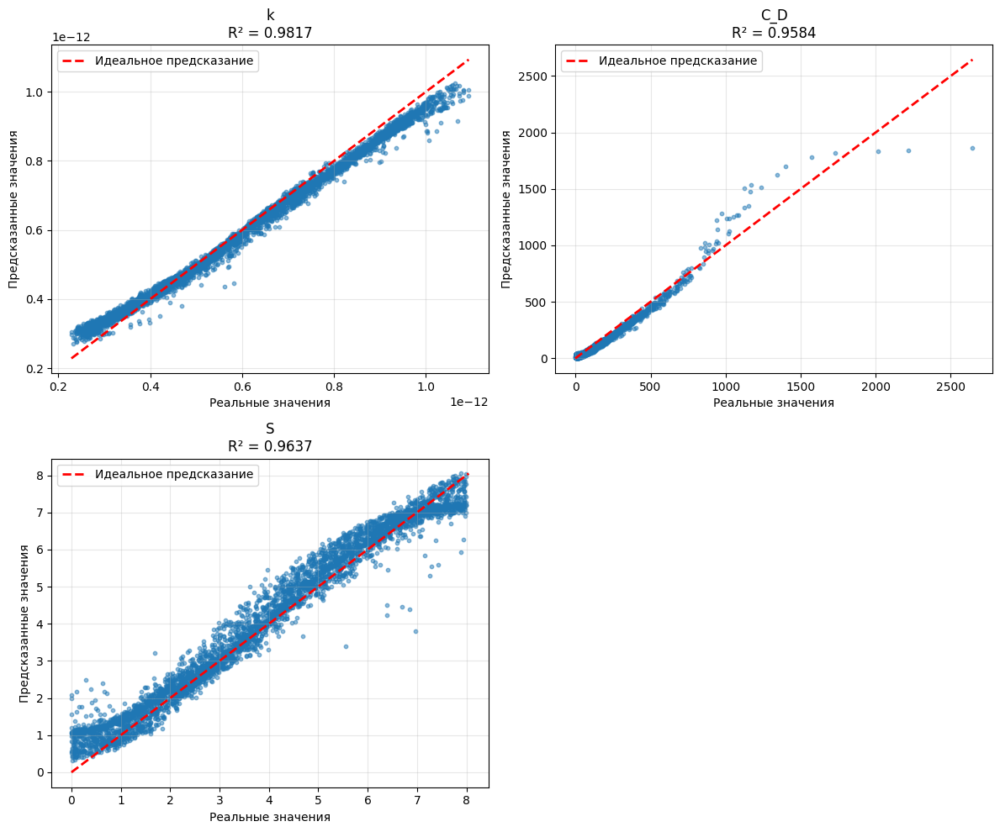

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


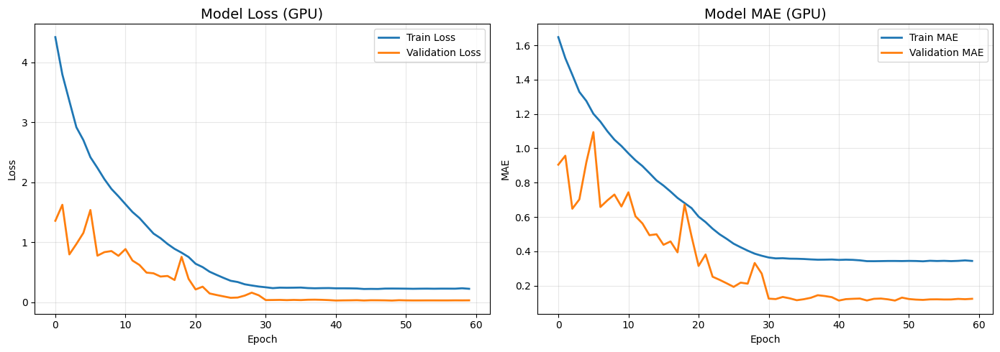

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_homogeneous_inf', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_homogeneous_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_homogeneous_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение однородной модели для бесконечного пласта с разными train, val, test

In [ ]:
# !unzip /content/drive/MyDrive/datasets/homogeneous_inf.zip

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/homogeneous_inf',
    model_type=Model.HOMOGENEOUS_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k': np.float64(6.015860615216118e-13), 'C_D': np.float64(214.88873573322147), 'S': np.float64(4.677444949093964), 'data_type': 'test'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 3).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 3).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 3).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler()
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=3, input_shape=(128, 2), task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=5e-04
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 3)
Валидационные данные: X (2000, 128, 2), y (2000, 3)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 3.2572 - mae: 1.3981 - mse: 3.2572
Epoch 1: val_loss improved from None to 0.91296, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 18s 46ms/step - loss: 2.5758 - mae: 1.2447 - mse: 2.5758 - val_loss: 0.9130 - val_mae: 0.8037 - val_mse: 0.9130 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.4717 - mae: 0.9547 - mse: 1.4717
Epoch 2: val_loss improved from 0.91296 to 0.69156, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 1.3055 - mae: 0.9006 - mse: 1.3055 - val_loss: 0.6916 - val_mae: 0.6637 - val_mse: 0.6916 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.9153 - mae: 0.7555 - mse: 0.9153
Epoch 3: val_loss improved from 0.69156 to 0.52210, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.8021 - mae: 0.7029 - mse: 0.8021 - val_loss: 0.5221 - val_mae: 0.5601 - val_mse: 0.5221 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.5903 - mae: 0.5954 - mse: 0.5903
Epoch 4: val_loss improved from 0.52210 to 0.45790, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.5656 - mae: 0.5827 - mse: 0.5656 - val_loss: 0.4579 - val_mae: 0.4840 - val_mse: 0.4579 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5113 - mae: 0.5526 - mse: 0.5113
Epoch 5: val_loss improved from 0.45790 to 0.45278, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4987 - mae: 0.5451 - mse: 0.4987 - val_loss: 0.4528 - val_mae: 0.4709 - val_mse: 0.4528 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4596 - mae: 0.5233 - mse: 0.4596
Epoch 6: val_loss improved from 0.45278 to 0.33865, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.4411 - mae: 0.5124 - mse: 0.4411 - val_loss: 0.3386 - val_mae: 0.3887 - val_mse: 0.3386 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3126 - mae: 0.4343 - mse: 0.3126
Epoch 7: val_loss improved from 0.33865 to 0.10412, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2495 - mae: 0.3886 - mse: 0.2495 - val_loss: 0.1041 - val_mae: 0.2449 - val_mse: 0.1041 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1668 - mae: 0.3227 - mse: 0.1668
Epoch 8: val_loss improved from 0.10412 to 0.10231, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1632 - mae: 0.3198 - mse: 0.1632 - val_loss: 0.1023 - val_mae: 0.2309 - val_mse: 0.1023 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1530 - mae: 0.3100 - mse: 0.1530
Epoch 9: val_loss improved from 0.10231 to 0.02498, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.1527 - mae: 0.3096 - mse: 0.1527 - val_loss: 0.0250 - val_mae: 0.1205 - val_mse: 0.0250 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1440 - mae: 0.3007 - mse: 0.1440
Epoch 10: val_loss did not improve from 0.02498
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1404 - mae: 0.2964 - mse: 0.1404 - val_loss: 0.0392 - val_mae: 0.1579 - val_mse: 0.0392 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1363 - mae: 0.2930 - mse: 0.1363
Epoch 11: val_loss did not improve from 0.02498
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1356 - mae: 0.2917 - mse: 0.1356 - val_loss: 0.1058 - val_mae: 0.2568 - val_mse: 0.1058 - learning


Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1251 - mae: 0.2806 - mse: 0.1251 - val_loss: 0.0175 - val_mae: 0.0932 - val_mse: 0.0175 - learning_rate: 2.5000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1242 - mae: 0.2797 - mse: 0.1242
Epoch 16: val_loss did not improve from 0.01751
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.1220 - mae: 0.2771 - mse: 0.1220 - val_loss: 0.0525 - val_mae: 0.1978 - val_mse: 0.0525 - learning_rate: 2.5000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 17/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1211 - mae: 0.2751 - mse: 0.1211
Epoch 17: val_loss did not improve from 0.01751
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1216 - mae: 0.2758 - mse: 0.1216 - val_loss: 0.0303 - val_mae: 0.1452 - val_mse: 0.0303 - learnin


Epoch 27: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1133 - mae: 0.2667 - mse: 0.1133 - val_loss: 0.0155 - val_mae: 0.0820 - val_mse: 0.0155 - learning_rate: 6.2500e-05

Epoch 28: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 28/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1125 - mae: 0.2659 - mse: 0.1125
Epoch 28: val_loss did not improve from 0.01546
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1126 - mae: 0.2659 - mse: 0.1126 - val_loss: 0.0176 - val_mae: 0.1001 - val_mse: 0.0176 - learning_rate: 6.2500e-05

Epoch 29: LearningRateScheduler setting learning rate to 6.25000029685907e-05.
Epoch 29/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1126 - mae: 0.2651 - mse: 0.1126
Epoch 29: val_loss did not improve from 0.01546
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1125 - mae: 0.2658 - mse: 0.1125 - val_loss: 0.0189 - val_mae: 0.1032 - val_mse: 0.0189 - learning_


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.1137 - mae: 0.2676 - mse: 0.1137 - val_loss: 0.0142 - val_mae: 0.0838 - val_mse: 0.0142 - learning_rate: 6.2500e-06

Epoch 32: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 32/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1112 - mae: 0.2640 - mse: 0.1112
Epoch 32: val_loss improved from 0.01422 to 0.01396, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1109 - mae: 0.2637 - mse: 0.1109 - val_loss: 0.0140 - val_mae: 0.0841 - val_mse: 0.0140 - learning_rate: 6.2500e-06

Epoch 33: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1156 - mae: 0.2693 - mse: 0.1156
Epoch 33: val_loss did not improve from 0.01396
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1138 - mae: 0.2675 - mse: 0.1138 - val_loss: 0.0146 - val_mae: 0.0827 - val_mse: 0.0146 - learning_rate: 6.2500e-06

Epoch 34: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 34/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1109 - mae: 0.2640 - mse: 0.1109
Epoch 34: val_loss did not improve from 0.01396
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1102 - mae: 0.2631 - mse: 0.1102 - val_loss: 0.0152 - val_mae: 0.0872 - val_mse: 0.0152 - learnin


Epoch 36: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.1114 - mae: 0.2649 - mse: 0.1114 - val_loss: 0.0137 - val_mae: 0.0856 - val_mse: 0.0137 - learning_rate: 6.2500e-06

Epoch 37: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 37/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1120 - mae: 0.2648 - mse: 0.1120
Epoch 37: val_loss did not improve from 0.01374
219/219 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.1112 - mae: 0.2642 - mse: 0.1112 - val_loss: 0.0138 - val_mae: 0.0818 - val_mse: 0.0138 - learning_rate: 6.2500e-06

Epoch 38: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 38/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1132 - mae: 0.2668 - mse: 0.1132
Epoch 38: val_loss did not improve from 0.01374
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1133 - mae: 0.2669 - mse: 0.1133 - val_loss: 0.0156 - val_mae: 0.0900 - val_mse: 0.0156 - learni

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0114
  mae: 0.0760
  mse: 0.0114

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  9.5587e-28
    MAE:  2.2368e-14
    R²:   0.9860

  C_D:
    MSE:  8.8034e+02
    MAE:  2.1803e+01
    R²:   0.9837

  S:
    MSE:  3.9864e-02
    MAE:  1.4809e-01
    R²:   0.9904


Количество выходов: 3
Форма y_test_orig: (4000, 3)
Results: 1.1862925464005414e-13 9.244781589562434e-13
Results: 1.000518832972409e-13 9.999906420338858e-13


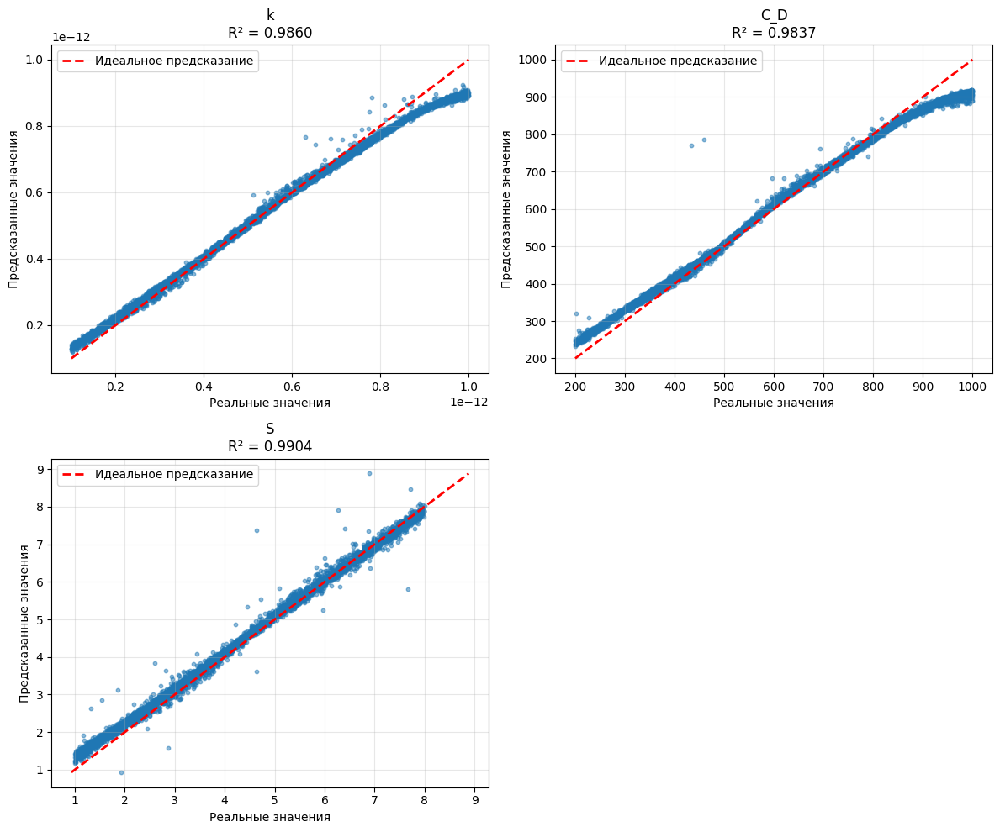

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


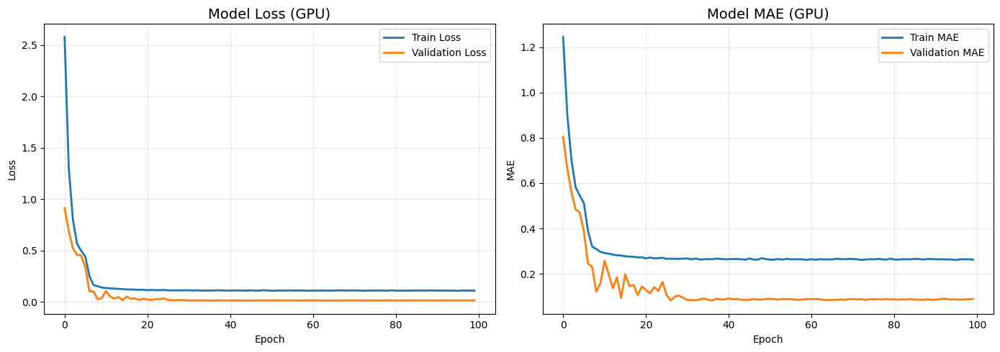

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_homogeneous_inf', format='all')

✅ Веса модели сохранены: lstm_model_regression_homogeneous_inf.weights.h5
✅ Модель сохранена в Keras format: lstm_model_regression_homogeneous_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_model_regression_homogeneous_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_homogeneous_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_homogeneous_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to lstm_model_regression_homogeneous_inf_scaler_config.json


# Обучение однородной модели для кругового пласта

In [ ]:
!unzip /content/drive/MyDrive/homogeneous_inf_04.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_inf_04/params/24.csv  
  inflating: homogeneous_inf_04/params/46.csv  
  inflating: homogeneous_inf_04/params/48.csv  
  inflating: homogeneous_inf_04/params/85.csv  
  inflating: homogeneous_inf_04/params/168.csv  
  inflating: homogeneous_inf_04/params/183.csv  
  inflating: homogeneous_inf_04/params/208.csv  
  inflating: homogeneous_inf_04/params/209.csv  
  inflating: homogeneous_inf_04/params/215.csv  
  inflating: homogeneous_inf_04/params/226.csv  
  inflating: homogeneous_inf_04/params/252.csv  
  inflating: homogeneous_inf_04/params/268.csv  
  inflating: homogeneous_inf_04/params/274.csv  
  inflating: homogeneous_inf_04/params/283.csv  
  inflating: homogeneous_inf_04/params/290.csv  
  inflating: homogeneous_inf_04/params/311.csv  
  inflating: homogeneous_inf_04/params/314.csv  
  inflating: homogeneous_inf_04/params/319.csv  
  inflating: homogeneous_inf_04/params/328.csv  
  inf

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/homogeneous_inf_04',
    model_type=Model.HOMOGENEOUS_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 4).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 4).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 4).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
scaler = KValueScaler()
scaler.fit(y_train_reg_reshaped)

y_train_k = scaler.transform(y_train_reg_reshaped)
y_val_k = scaler.transform(y_val_reg_reshaped)
y_test_k = scaler.transform(y_test_reg_reshaped)

2.2588472771880186e-13 1.0984148631897957e-12
2.2588472771880186 10.984148631897957
2.2588472771880186e-13 1.0984148631897957e-12
2.2588472771880186 10.984148631897957
Transformed data:  2.2588472771880186 10.984148631897957 6.256146310318357
2.2991253242463724e-13 1.089751253304022e-12
2.2991253242463725 10.89751253304022
Transformed data:  2.2991253242463725 10.89751253304022 6.322905990459644
2.284611690455153e-13 1.0948034441420872e-12
2.284611690455153 10.948034441420871
Transformed data:  2.284611690455153 10.948034441420871 6.276000330523352


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=4, task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S', 'r_D_e']
)

trainer_k.set_y_scaler(scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 4)
Валидационные данные: X (2000, 128, 2), y (2000, 4)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 4.3779 - mae: 1.6371 - mse: 4.3779
Epoch 1: val_loss improved from None to 0.96189, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 4.0787 - mae: 1.5782 - mse: 4.0787 - val_loss: 0.9619 - val_mae: 0.8116 - val_mse: 0.9619 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 3.5174 - mae: 1.4639 - mse: 3.5174
Epoch 2: val_loss did not improve from 0.96189
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 3.3729 - mae: 1.4328 - mse: 3.3729 - val_loss: 1.5478 - val_mae: 0.9039 - val_mse: 1.5478 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.0295 - mae: 1.3608 - mse: 3.0295
Epoch 3: val_loss improved from 0.96189 to 0.86025, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 2.9176 - mae: 1.3330 - mse: 2.9176 - val_loss: 0.8602 - val_mae: 0.7318 - val_mse: 0.8602 - learning_rate: 5.0000e-05

Epoch 4: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 4/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 2.6228 - mae: 1.2517 - mse: 2.6228
Epoch 4: val_loss improved from 0.86025 to 0.65459, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 2.5274 - mae: 1.2317 - mse: 2.5274 - val_loss: 0.6546 - val_mae: 0.5906 - val_mse: 0.6546 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2.3980 - mae: 1.1974 - mse: 2.3980
Epoch 5: val_loss improved from 0.65459 to 0.51387, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 2.3004 - mae: 1.1724 - mse: 2.3004 - val_loss: 0.5139 - val_mae: 0.5371 - val_mse: 0.5139 - learning_rate: 5.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2.0699 - mae: 1.1126 - mse: 2.0699
Epoch 6: val_loss did not improve from 0.51387
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 2.0259 - mae: 1.1011 - mse: 2.0259 - val_loss: 0.9924 - val_mae: 0.7354 - val_mse: 0.9924 - learning_rate: 5.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.8982 - mae: 1.0655 - mse: 1.8982
Epoch 7: val_loss did not improve from 0.51387
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 1.8677 - mae: 1.0551 - mse: 1.8677 - val_loss: 0.5567 - val_mae: 0.5376 - val_mse: 0.5567 - learning_rate:


Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 1.5538 - mae: 0.9601 - mse: 1.5538 - val_loss: 0.4293 - val_mae: 0.4770 - val_mse: 0.4293 - learning_rate: 5.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 10/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.4387 - mae: 0.9280 - mse: 1.4387
Epoch 10: val_loss did not improve from 0.42928
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 1.4222 - mae: 0.9173 - mse: 1.4222 - val_loss: 0.4475 - val_mae: 0.4726 - val_mse: 0.4475 - learning_rate: 5.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 11/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.3441 - mae: 0.8884 - mse: 1.3441
Epoch 11: val_loss improved from 0.42928 to 0.36279, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 1.3155 - mae: 0.8804 - mse: 1.3155 - val_loss: 0.3628 - val_mae: 0.4340 - val_mse: 0.3628 - learning_rate: 5.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.1983 - mae: 0.8422 - mse: 1.1983
Epoch 12: val_loss did not improve from 0.36279
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 1.2078 - mae: 0.8423 - mse: 1.2078 - val_loss: 0.4566 - val_mae: 0.4972 - val_mse: 0.4566 - learning_rate: 5.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 13/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.1319 - mae: 0.8138 - mse: 1.1319
Epoch 13: val_loss did not improve from 0.36279
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 1.1210 - mae: 0.8093 - mse: 1.1210 - val_loss: 1.5449 - val_mae: 0.8997 - val_mse: 1.5449 - learnin


Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 1.0174 - mae: 0.7714 - mse: 1.0174 - val_loss: 0.2568 - val_mae: 0.3553 - val_mse: 0.2568 - learning_rate: 5.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 15/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.9522 - mae: 0.7446 - mse: 0.9522
Epoch 15: val_loss did not improve from 0.25677
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.9279 - mae: 0.7350 - mse: 0.9279 - val_loss: 0.3172 - val_mae: 0.3924 - val_mse: 0.3172 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.8432 - mae: 0.7017 - mse: 0.8432
Epoch 16: val_loss did not improve from 0.25677
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.8186 - mae: 0.6914 - mse: 0.8186 - val_loss: 0.4862 - val_mae: 0.4688 - val_mse: 0.4862 - learni


Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.7271 - mae: 0.6500 - mse: 0.7271 - val_loss: 0.1553 - val_mae: 0.2884 - val_mse: 0.1553 - learning_rate: 5.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 18/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.6757 - mae: 0.6226 - mse: 0.6757
Epoch 18: val_loss did not improve from 0.15529
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.6561 - mae: 0.6161 - mse: 0.6561 - val_loss: 0.1703 - val_mae: 0.3026 - val_mse: 0.1703 - learning_rate: 5.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 19/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6097 - mae: 0.5940 - mse: 0.6097
Epoch 19: val_loss did not improve from 0.15529
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.5958 - mae: 0.5869 - mse: 0.5958 - val_loss: 0.5691 - val_mae: 0.5404 - val_mse: 0.5691 - learni


Epoch 20: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.5356 - mae: 0.5564 - mse: 0.5356 - val_loss: 0.1019 - val_mae: 0.2372 - val_mse: 0.1019 - learning_rate: 5.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 21/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4763 - mae: 0.5255 - mse: 0.4763
Epoch 21: val_loss improved from 0.10195 to 0.06877, saving model to best_model_regression.h5



Epoch 21: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4769 - mae: 0.5244 - mse: 0.4769 - val_loss: 0.0688 - val_mae: 0.1948 - val_mse: 0.0688 - learning_rate: 5.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 22/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4309 - mae: 0.5036 - mse: 0.4309
Epoch 22: val_loss did not improve from 0.06877
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.4314 - mae: 0.5000 - mse: 0.4314 - val_loss: 0.4037 - val_mae: 0.4703 - val_mse: 0.4037 - learning_rate: 5.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 23/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4105 - mae: 0.4899 - mse: 0.4105
Epoch 23: val_loss did not improve from 0.06877
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4002 - mae: 0.4798 - mse: 0.4002 - val_loss: 0.1071 - val_mae: 0.2494 - val_mse: 0.1071 - learnin


Epoch 27: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.3028 - mae: 0.4149 - mse: 0.3028 - val_loss: 0.0658 - val_mae: 0.1981 - val_mse: 0.0658 - learning_rate: 2.5000e-05

Epoch 28: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 28/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2980 - mae: 0.4096 - mse: 0.2980
Epoch 28: val_loss did not improve from 0.06577
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2937 - mae: 0.4078 - mse: 0.2937 - val_loss: 0.0900 - val_mae: 0.2116 - val_mse: 0.0900 - learning_rate: 2.5000e-05

Epoch 29: LearningRateScheduler setting learning rate to 2.499999936844688e-05.
Epoch 29/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2809 - mae: 0.3994 - mse: 0.2809
Epoch 29: val_loss did not improve from 0.06577
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.2846 - mae: 0.3996 - mse: 0.2846 - val_loss: 0.2188 - val_mae: 0.3656 - val_mse: 0.2188 - learnin


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2698 - mae: 0.3903 - mse: 0.2698 - val_loss: 0.0496 - val_mae: 0.1726 - val_mse: 0.0496 - learning_rate: 2.5000e-06

Epoch 32: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 32/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2733 - mae: 0.3910 - mse: 0.2733
Epoch 32: val_loss improved from 0.04959 to 0.03170, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2670 - mae: 0.3892 - mse: 0.2670 - val_loss: 0.0317 - val_mae: 0.1311 - val_mse: 0.0317 - learning_rate: 2.5000e-06

Epoch 33: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 33/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2610 - mae: 0.3852 - mse: 0.2610
Epoch 33: val_loss did not improve from 0.03170
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2632 - mae: 0.3863 - mse: 0.2632 - val_loss: 0.0458 - val_mae: 0.1607 - val_mse: 0.0458 - learning_rate: 2.5000e-06

Epoch 34: LearningRateScheduler setting learning rate to 2.499999936844688e-06.
Epoch 34/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2653 - mae: 0.3860 - mse: 0.2653
Epoch 34: val_loss did not improve from 0.03170
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.2631 - mae: 0.3849 - mse: 0.2631 - val_loss: 0.0372 - val_mae: 0.1493 - val_mse: 0.0372 - learni

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0404
  mae: 0.1529
  mse: 0.0404
-1.8111169817820298 2.13961581207468
2.284611690455153 10.948034441420871
-1.7544241 1.6752825
2.4089315 9.929814

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  1.8006e-27
    MAE:  3.4195e-14
    R²:   0.9632

  C_D:
    MSE:  1.4643e+03
    MAE:  2.4444e+01
    R²:   0.9532

  S:
    MSE:  2.3544e-01
    MAE:  4.0409e-01
    R²:   0.9566

  r_D_e:
    MSE:  2.1171e+05
    MAE:  3.6186e+02
    R²:   0.9691
-1.8111169817820298 2.13961581207468
2.284611690455153 10.948034441420871
-1.7544241 1.6752825
2.4089315 9.929814


-1.8111169817820298 2.13961581207468
2.284611690455153 10.948034441420871
-1.7544241 1.6752825
2.4089315 9.929814
Количество выходов: 4
Форма y_test_orig: (4000, 4)
Results: 2.4089316153809437e-13 9.929814132406123e-13
Results: 2.284611690455153e-13 1.0948034441420872e-12


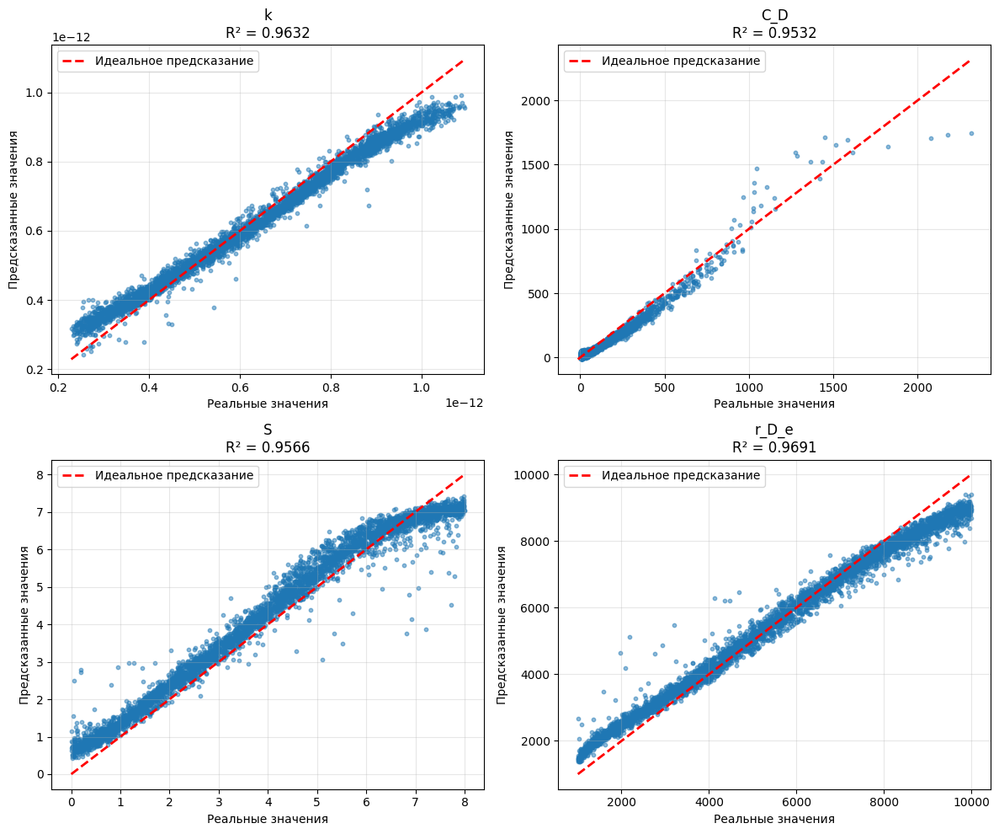

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


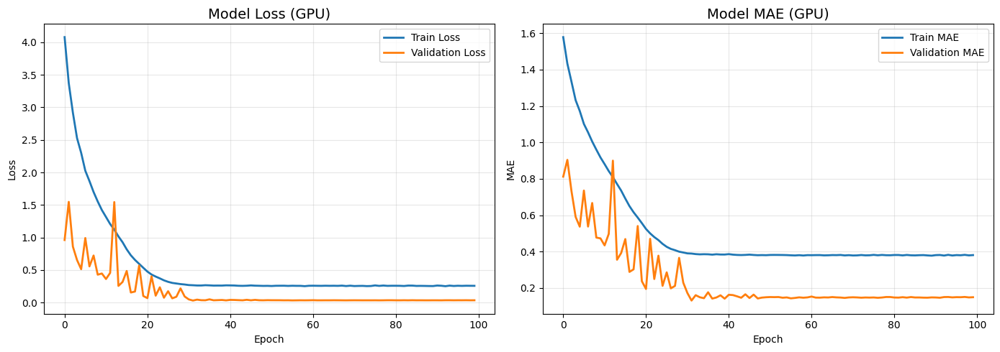

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_homogeneous_fin', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_homogeneous_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_homogeneous_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение однородной модели для кругового пласта с разными train, val, test

In [ ]:
!unzip /content/drive/MyDrive/datasets/homogeneous_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: homogeneous_fin/params/24.csv  
  inflating: homogeneous_fin/params/46.csv  
  inflating: homogeneous_fin/params/48.csv  
  inflating: homogeneous_fin/params/85.csv  
  inflating: homogeneous_fin/params/168.csv  
  inflating: homogeneous_fin/params/183.csv  
  inflating: homogeneous_fin/params/208.csv  
  inflating: homogeneous_fin/params/209.csv  
  inflating: homogeneous_fin/params/215.csv  
  inflating: homogeneous_fin/params/226.csv  
  inflating: homogeneous_fin/params/252.csv  
  inflating: homogeneous_fin/params/268.csv  
  inflating: homogeneous_fin/params/274.csv  
  inflating: homogeneous_fin/params/283.csv  
  inflating: homogeneous_fin/params/290.csv  
  inflating: homogeneous_fin/params/311.csv  
  inflating: homogeneous_fin/params/314.csv  
  inflating: homogeneous_fin/params/319.csv  
  inflating: homogeneous_fin/params/328.csv  
  inflating: homogeneous_fin/params/347.csv  
  inflating: hom

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/homogeneous_fin',
    model_type=Model.HOMOGENEOUS_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k': np.float64(2.453062495111076e-13), 'C_D': np.float64(457.6029778115487), 'S': np.float64(0.5707538095451398), 'r_D_e': np.float64(4219.82510435267), 'data_type': 'train'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 4).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 4).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 4).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler()
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=4, input_shape=(128, 2), task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k', 'C_D', 'S', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=5e-04
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 4)
Валидационные данные: X (2000, 128, 2), y (2000, 4)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 3.2374 - mae: 1.4002 - mse: 3.2374
Epoch 1: val_loss improved from None to 1.16762, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 2.5301 - mae: 1.2379 - mse: 2.5301 - val_loss: 1.1676 - val_mae: 0.8762 - val_mse: 1.1676 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 1.4066 - mae: 0.9341 - mse: 1.4066
Epoch 2: val_loss improved from 1.16762 to 0.88956, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 1.2151 - mae: 0.8689 - mse: 1.2151 - val_loss: 0.8896 - val_mae: 0.7287 - val_mse: 0.8896 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.8090 - mae: 0.7118 - mse: 0.8090
Epoch 3: val_loss improved from 0.88956 to 0.45595, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.7359 - mae: 0.6764 - mse: 0.7359 - val_loss: 0.4559 - val_mae: 0.4926 - val_mse: 0.4559 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.5263 - mae: 0.5679 - mse: 0.5263
Epoch 4: val_loss did not improve from 0.45595
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.4896 - mae: 0.5458 - mse: 0.4896 - val_loss: 0.4951 - val_mae: 0.5215 - val_mse: 0.4951 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4225 - mae: 0.5035 - mse: 0.4225
Epoch 5: val_loss improved from 0.45595 to 0.33634, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.4139 - mae: 0.4985 - mse: 0.4139 - val_loss: 0.3363 - val_mae: 0.4082 - val_mse: 0.3363 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3563 - mae: 0.4646 - mse: 0.3563
Epoch 6: val_loss improved from 0.33634 to 0.08288, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.3115 - mae: 0.4365 - mse: 0.3115 - val_loss: 0.0829 - val_mae: 0.2137 - val_mse: 0.0829 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2264 - mae: 0.3757 - mse: 0.2264
Epoch 7: val_loss did not improve from 0.08288
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2226 - mae: 0.3720 - mse: 0.2226 - val_loss: 0.1781 - val_mae: 0.3195 - val_mse: 0.1781 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2062 - mae: 0.3576 - mse: 0.2062
Epoch 8: val_loss improved from 0.08288 to 0.08038, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2033 - mae: 0.3540 - mse: 0.2033 - val_loss: 0.0804 - val_mae: 0.2148 - val_mse: 0.0804 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2021 - mae: 0.3529 - mse: 0.2021
Epoch 9: val_loss did not improve from 0.08038
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1984 - mae: 0.3501 - mse: 0.1984 - val_loss: 0.1244 - val_mae: 0.2597 - val_mse: 0.1244 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1908 - mae: 0.3427 - mse: 0.1908
Epoch 10: val_loss improved from 0.08038 to 0.08012, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1892 - mae: 0.3415 - mse: 0.1892 - val_loss: 0.0801 - val_mae: 0.2105 - val_mse: 0.0801 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1878 - mae: 0.3396 - mse: 0.1878
Epoch 11: val_loss did not improve from 0.08012
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1863 - mae: 0.3384 - mse: 0.1863 - val_loss: 0.0891 - val_mae: 0.2422 - val_mse: 0.0891 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1791 - mae: 0.3327 - mse: 0.1791
Epoch 12: val_loss improved from 0.08012 to 0.07995, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1809 - mae: 0.3343 - mse: 0.1809 - val_loss: 0.0799 - val_mae: 0.1972 - val_mse: 0.0799 - learning_rate: 5.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 13/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1777 - mae: 0.3307 - mse: 0.1777
Epoch 13: val_loss did not improve from 0.07995
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1771 - mae: 0.3306 - mse: 0.1771 - val_loss: 0.1040 - val_mae: 0.2432 - val_mse: 0.1040 - learning_rate: 5.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 14/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1773 - mae: 0.3310 - mse: 0.1773
Epoch 14: val_loss improved from 0.07995 to 0.07718, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1762 - mae: 0.3297 - mse: 0.1762 - val_loss: 0.0772 - val_mae: 0.2066 - val_mse: 0.0772 - learning_rate: 5.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 15/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1738 - mae: 0.3280 - mse: 0.1738
Epoch 15: val_loss did not improve from 0.07718
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1723 - mae: 0.3257 - mse: 0.1723 - val_loss: 0.0778 - val_mae: 0.2054 - val_mse: 0.0778 - learning_rate: 5.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 16/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1703 - mae: 0.3232 - mse: 0.1703
Epoch 16: val_loss did not improve from 0.07718
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1690 - mae: 0.3223 - mse: 0.1690 - val_loss: 0.0872 - val_mae: 0.2182 - val_mse: 0.0872 - learnin


Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1659 - mae: 0.3209 - mse: 0.1659 - val_loss: 0.0525 - val_mae: 0.1773 - val_mse: 0.0525 - learning_rate: 5.0000e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 18/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1644 - mae: 0.3181 - mse: 0.1644
Epoch 18: val_loss did not improve from 0.05248
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1664 - mae: 0.3199 - mse: 0.1664 - val_loss: 0.0622 - val_mae: 0.1842 - val_mse: 0.0622 - learning_rate: 5.0000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 19/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1642 - mae: 0.3172 - mse: 0.1642
Epoch 19: val_loss did not improve from 0.05248
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.1641 - mae: 0.3179 - mse: 0.1641 - val_loss: 0.0809 - val_mae: 0.2073 - val_mse: 0.0809 - learnin


Epoch 22: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.1597 - mae: 0.3135 - mse: 0.1597 - val_loss: 0.0491 - val_mae: 0.1653 - val_mse: 0.0491 - learning_rate: 5.0000e-04

Epoch 23: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 23/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1566 - mae: 0.3107 - mse: 0.1566
Epoch 23: val_loss improved from 0.04910 to 0.04900, saving model to best_model_regression.h5



Epoch 23: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.1569 - mae: 0.3116 - mse: 0.1569 - val_loss: 0.0490 - val_mae: 0.1710 - val_mse: 0.0490 - learning_rate: 5.0000e-04

Epoch 24: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 24/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1604 - mae: 0.3149 - mse: 0.1604
Epoch 24: val_loss improved from 0.04900 to 0.04890, saving model to best_model_regression.h5



Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1591 - mae: 0.3138 - mse: 0.1591 - val_loss: 0.0489 - val_mae: 0.1600 - val_mse: 0.0489 - learning_rate: 5.0000e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 25/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1565 - mae: 0.3106 - mse: 0.1565
Epoch 25: val_loss did not improve from 0.04890
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1562 - mae: 0.3106 - mse: 0.1562 - val_loss: 0.0754 - val_mae: 0.2117 - val_mse: 0.0754 - learning_rate: 5.0000e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 26/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1562 - mae: 0.3100 - mse: 0.1562
Epoch 26: val_loss did not improve from 0.04890
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.1543 - mae: 0.3084 - mse: 0.1543 - val_loss: 0.0578 - val_mae: 0.1748 - val_mse: 0.0578 - learni


Epoch 30: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1489 - mae: 0.3033 - mse: 0.1489 - val_loss: 0.0476 - val_mae: 0.1590 - val_mse: 0.0476 - learning_rate: 2.5000e-04

Epoch 31: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 31/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1458 - mae: 0.3001 - mse: 0.1458
Epoch 31: val_loss improved from 0.04757 to 0.03868, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1433 - mae: 0.2973 - mse: 0.1433 - val_loss: 0.0387 - val_mae: 0.1304 - val_mse: 0.0387 - learning_rate: 2.5000e-05

Epoch 32: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 32/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1443 - mae: 0.2979 - mse: 0.1443
Epoch 32: val_loss did not improve from 0.03868
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1452 - mae: 0.2989 - mse: 0.1452 - val_loss: 0.0422 - val_mae: 0.1340 - val_mse: 0.0422 - learning_rate: 2.5000e-05

Epoch 33: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1411 - mae: 0.2955 - mse: 0.1411
Epoch 33: val_loss did not improve from 0.03868
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1407 - mae: 0.2949 - mse: 0.1407 - val_loss: 0.0406 - val_mae: 0.1321 - val_mse: 0.0406 - learn


Epoch 34: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1439 - mae: 0.2986 - mse: 0.1439 - val_loss: 0.0317 - val_mae: 0.1167 - val_mse: 0.0317 - learning_rate: 2.5000e-05

Epoch 35: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 35/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1412 - mae: 0.2964 - mse: 0.1412
Epoch 35: val_loss did not improve from 0.03172
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.1425 - mae: 0.2975 - mse: 0.1425 - val_loss: 0.0368 - val_mae: 0.1275 - val_mse: 0.0368 - learning_rate: 2.5000e-05

Epoch 36: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 36/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1440 - mae: 0.2986 - mse: 0.1440
Epoch 36: val_loss did not improve from 0.03172
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.1430 - mae: 0.2977 - mse: 0.1430 - val_loss: 0.0327 - val_mae: 0.1148 - val_mse: 0.0327 - learn

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0241
  mae: 0.1041
  mse: 0.0241

📊 Регрессионные метрики (в исходном масштабе):

  k:
    MSE:  1.6116e-27
    MAE:  2.9647e-14
    R²:   0.9763

  C_D:
    MSE:  1.3261e+03
    MAE:  2.6042e+01
    R²:   0.9754

  S:
    MSE:  4.6469e-02
    MAE:  1.6466e-01
    R²:   0.9886

  r_D_e:
    MSE:  2.2444e+05
    MAE:  3.0936e+02
    R²:   0.9578


Количество выходов: 4
Форма y_test_orig: (4000, 4)
Results: 1.22886767493606e-13 8.935326979188363e-13
Results: 1.0027474413900133e-13 9.996084298621007e-13


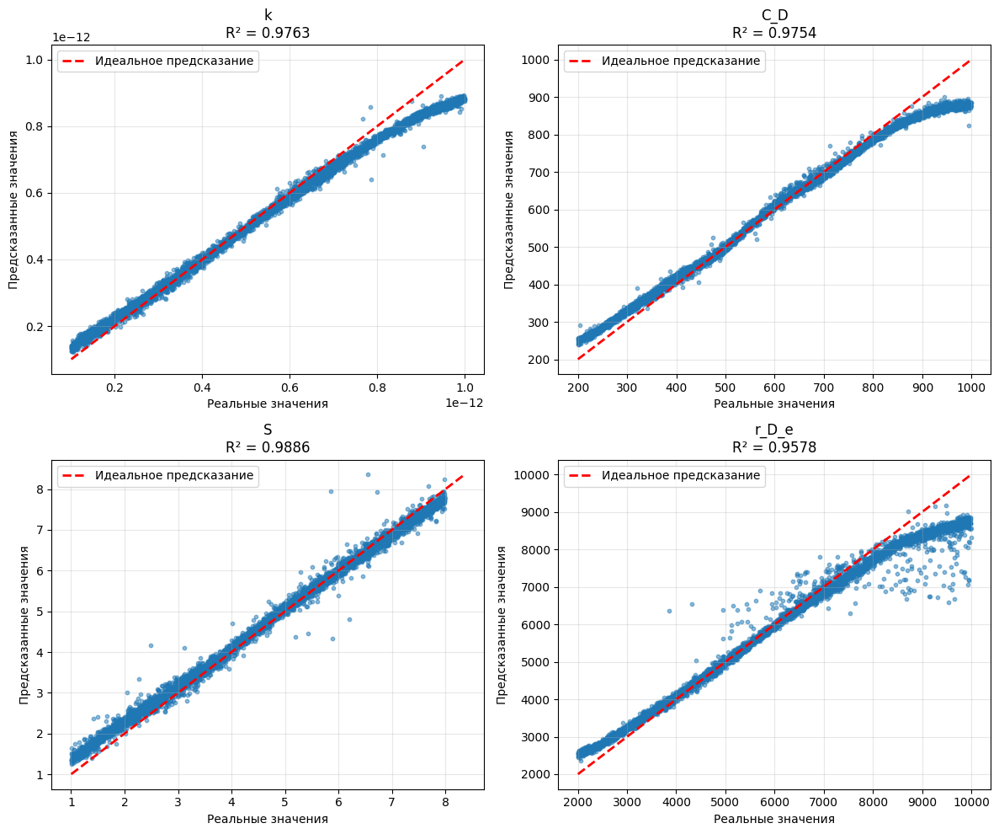

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


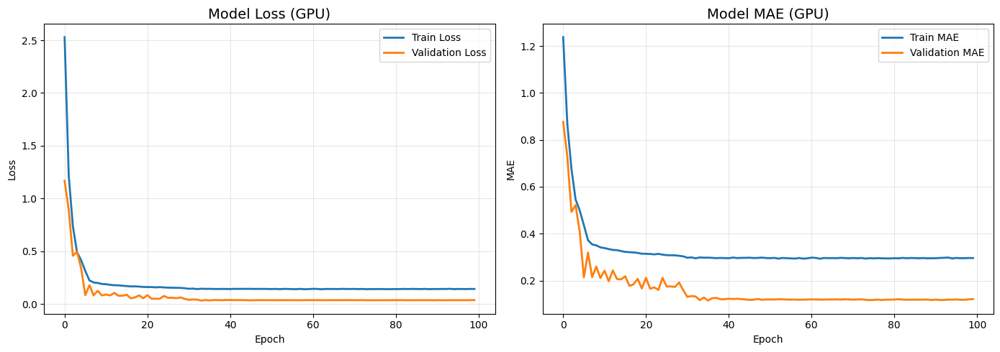

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_homogeneous_fin', format='all')

✅ Веса модели сохранены: lstm_model_regression_homogeneous_fin.weights.h5
✅ Модель сохранена в Keras format: lstm_model_regression_homogeneous_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_model_regression_homogeneous_fin_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_homogeneous_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_homogeneous_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to lstm_model_regression_homogeneous_fin_scaler_config.json


# Обучение для модели двойной пористости для бесконечного пласта

In [ ]:
!unzip /content/drive/MyDrive/dual_porosity_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_porosity_inf/params/24.csv  
  inflating: dual_porosity_inf/params/46.csv  
  inflating: dual_porosity_inf/params/48.csv  
  inflating: dual_porosity_inf/params/85.csv  
  inflating: dual_porosity_inf/params/168.csv  
  inflating: dual_porosity_inf/params/183.csv  
  inflating: dual_porosity_inf/params/208.csv  
  inflating: dual_porosity_inf/params/209.csv  
  inflating: dual_porosity_inf/params/215.csv  
  inflating: dual_porosity_inf/params/226.csv  
  inflating: dual_porosity_inf/params/252.csv  
  inflating: dual_porosity_inf/params/268.csv  
  inflating: dual_porosity_inf/params/274.csv  
  inflating: dual_porosity_inf/params/283.csv  
  inflating: dual_porosity_inf/params/290.csv  
  inflating: dual_porosity_inf/params/311.csv  
  inflating: dual_porosity_inf/params/314.csv  
  inflating: dual_porosity_inf/params/319.csv  
  inflating: dual_porosity_inf/params/328.csv  
  inflating: dual_porosi

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_porosity_inf',
    model_type=Model.DUAL_POROSITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
# y_train shape: (14000, 6, 1) - [образцы, временные шаги, признаки]
# Нам нужен 4-й временной шаг (индекс 4) и 0-й признак (т.к. последняя размерность 1)

# Создаем маски на основе значения в 4-м временном шаге
mask_train = y_train[:, 4, 0] <= 1e-4  # (14000,) - булевый массив
mask_val = y_val[:, 4, 0] <= 1e-4
mask_test = y_test[:, 4, 0] <= 1e-4

# Применяем маски к X и y
X_train_filtered = X_train[mask_train]  # (N, 128, 2)
y_train_filtered = y_train[mask_train]  # (N, 6, 1)

X_val_filtered = X_val[mask_val]
y_val_filtered = y_val[mask_val]

X_test_filtered = X_test[mask_test]
y_test_filtered = y_test[mask_test]

# Проверяем результат
print(f"Train: {y_train.shape[0]} -> {y_train_filtered.shape[0]} (удалено: {y_train.shape[0] - y_train_filtered.shape[0]})")
print(f"Val:   {y_val.shape[0]} -> {y_val_filtered.shape[0]} (удалено: {y_val.shape[0] - y_val_filtered.shape[0]})")
print(f"Test:  {y_test.shape[0]} -> {y_test_filtered.shape[0]} (удалено: {y_test.shape[0] - y_test_filtered.shape[0]})")

# Проверяем новые формы
print(f"\nНовые формы:")
print(f"X_train_filtered shape: {X_train_filtered.shape}")
print(f"y_train_filtered shape: {y_train_filtered.shape}")

X_train = X_train_filtered
X_val = X_val_filtered
X_test = X_test_filtered

y_train = y_train_filtered
y_val = y_val_filtered
y_test = y_test_filtered

Train: 14000 -> 12334 (удалено: 1666)
Val:   2000 -> 1726 (удалено: 274)
Test:  4000 -> 3523 (удалено: 477)

Новые формы:
X_train_filtered shape: (12334, 128, 2)
y_train_filtered shape: (12334, 5, 1)


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 5).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 5).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 5).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

2.274864927018661e-13 1.0952505660546109e-12
2.274864927018661 10.952505660546109
2.274864927018661e-13 1.0952505660546109e-12
2.274864927018661 10.952505660546109
Transformed data:  2.274864927018661 10.952505660546109 6.298999986987828
2.2631267286382606e-13 1.096273239679707e-12
2.2631267286382606 10.962732396797069
Transformed data:  2.2631267286382606 10.962732396797069 6.258958300227702
2.2674806298830842e-13 1.0914920037339268e-12
2.2674806298830843 10.914920037339268
Transformed data:  2.2674806298830843 10.914920037339268 6.286692770862964


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=5, task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.00005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (12334, 128, 2), y (12334, 5)
Валидационные данные: X (1726, 128, 2), y (1726, 5)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 1/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 4.3023 - mae: 1.6105 - mse: 4.3023
Epoch 1: val_loss improved from None to 1.21685, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 17s 37ms/step - loss: 4.1038 - mae: 1.5714 - mse: 4.1038 - val_loss: 1.2169 - val_mae: 0.7344 - val_mse: 1.2169 - learning_rate: 5.0000e-05

Epoch 2: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 2/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 3.7220 - mae: 1.4993 - mse: 3.7220
Epoch 2: val_loss did not improve from 1.21685
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 3.6142 - mae: 1.4731 - mse: 3.6142 - val_loss: 1.3341 - val_mae: 0.8308 - val_mse: 1.3341 - learning_rate: 5.0000e-05

Epoch 3: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 3/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 3.3440 - mae: 1.4113 - mse: 3.3440
Epoch 3: val_loss did not improve from 1.21685
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 3.2517 - mae: 1.3933 - mse: 3.2517 - val_loss: 1.3415 - val_mae: 0.8175 - val_mse: 1.3415 - learning_rate


Epoch 4: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 2.9529 - mae: 1.3209 - mse: 2.9529 - val_loss: 1.0313 - val_mae: 0.6495 - val_mse: 1.0313 - learning_rate: 5.0000e-05

Epoch 5: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 5/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 2.7651 - mae: 1.2794 - mse: 2.7651
Epoch 5: val_loss improved from 1.03128 to 0.90405, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 2.7004 - mae: 1.2616 - mse: 2.7004 - val_loss: 0.9040 - val_mae: 0.5916 - val_mse: 0.9040 - learning_rate: 5.0000e-05

Epoch 6: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 6/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 2.5464 - mae: 1.2149 - mse: 2.5464
Epoch 6: val_loss did not improve from 0.90405
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 2.4570 - mae: 1.1999 - mse: 2.4570 - val_loss: 1.2831 - val_mae: 0.8239 - val_mse: 1.2831 - learning_rate: 5.0000e-05

Epoch 7: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 7/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 2.3091 - mae: 1.1606 - mse: 2.3091
Epoch 7: val_loss did not improve from 0.90405
193/193 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 2.2974 - mae: 1.1526 - mse: 2.2974 - val_loss: 1.4037 - val_mae: 0.8388 - val_mse: 1.4037 - learning_rate


Epoch 8: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 2.1203 - mae: 1.1001 - mse: 2.1203 - val_loss: 0.8900 - val_mae: 0.5626 - val_mse: 0.8900 - learning_rate: 5.0000e-05

Epoch 9: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 9/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 2.0182 - mae: 1.0695 - mse: 2.0182
Epoch 9: val_loss improved from 0.89003 to 0.88478, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 1.9782 - mae: 1.0593 - mse: 1.9782 - val_loss: 0.8848 - val_mae: 0.5930 - val_mse: 0.8848 - learning_rate: 5.0000e-05

Epoch 10: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 10/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.8879 - mae: 1.0326 - mse: 1.8879
Epoch 10: val_loss did not improve from 0.88478
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 1.8480 - mae: 1.0211 - mse: 1.8480 - val_loss: 0.9512 - val_mae: 0.6484 - val_mse: 0.9512 - learning_rate: 5.0000e-05

Epoch 11: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 11/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.7366 - mae: 0.9904 - mse: 1.7366
Epoch 11: val_loss improved from 0.88478 to 0.80753, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 1.7398 - mae: 0.9862 - mse: 1.7398 - val_loss: 0.8075 - val_mae: 0.5721 - val_mse: 0.8075 - learning_rate: 5.0000e-05

Epoch 12: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 12/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.6479 - mae: 0.9565 - mse: 1.6479
Epoch 12: val_loss did not improve from 0.80753
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 1.6118 - mae: 0.9488 - mse: 1.6118 - val_loss: 0.8223 - val_mae: 0.5601 - val_mse: 0.8223 - learning_rate: 5.0000e-05

Epoch 13: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 13/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.5558 - mae: 0.9277 - mse: 1.5558
Epoch 13: val_loss improved from 0.80753 to 0.79097, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 1.5203 - mae: 0.9156 - mse: 1.5203 - val_loss: 0.7910 - val_mae: 0.5761 - val_mse: 0.7910 - learning_rate: 5.0000e-05

Epoch 14: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 14/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.4662 - mae: 0.8947 - mse: 1.4662
Epoch 14: val_loss improved from 0.79097 to 0.71368, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 1.4387 - mae: 0.8869 - mse: 1.4387 - val_loss: 0.7137 - val_mae: 0.5233 - val_mse: 0.7137 - learning_rate: 5.0000e-05

Epoch 15: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 15/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.3586 - mae: 0.8621 - mse: 1.3586
Epoch 15: val_loss did not improve from 0.71368
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 1.3547 - mae: 0.8571 - mse: 1.3547 - val_loss: 0.7856 - val_mae: 0.5363 - val_mse: 0.7856 - learning_rate: 5.0000e-05

Epoch 16: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 16/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.2977 - mae: 0.8357 - mse: 1.2977
Epoch 16: val_loss did not improve from 0.71368
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 1.2864 - mae: 0.8293 - mse: 1.2864 - val_loss: 0.7408 - val_mae: 0.5479 - val_mse: 0.7408 - learnin


Epoch 17: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 1.2065 - mae: 0.7996 - mse: 1.2065 - val_loss: 0.6865 - val_mae: 0.4817 - val_mse: 0.6865 - learning_rate: 5.0000e-05

Epoch 18: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 18/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.1528 - mae: 0.7811 - mse: 1.1528
Epoch 18: val_loss did not improve from 0.68655
193/193 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 1.1469 - mae: 0.7768 - mse: 1.1469 - val_loss: 0.8296 - val_mae: 0.6388 - val_mse: 0.8296 - learning_rate: 5.0000e-05

Epoch 19: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 19/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.0722 - mae: 0.7507 - mse: 1.0722
Epoch 19: val_loss improved from 0.68655 to 0.63380, saving model to best_model_regression.h5



Epoch 19: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 1.0726 - mae: 0.7482 - mse: 1.0726 - val_loss: 0.6338 - val_mae: 0.4757 - val_mse: 0.6338 - learning_rate: 5.0000e-05

Epoch 20: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 20/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.0351 - mae: 0.7330 - mse: 1.0351
Epoch 20: val_loss improved from 0.63380 to 0.62497, saving model to best_model_regression.h5



Epoch 20: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 1.0128 - mae: 0.7264 - mse: 1.0128 - val_loss: 0.6250 - val_mae: 0.4737 - val_mse: 0.6250 - learning_rate: 5.0000e-05

Epoch 21: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 21/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.9704 - mae: 0.7103 - mse: 0.9704
Epoch 21: val_loss did not improve from 0.62497
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.9564 - mae: 0.7031 - mse: 0.9564 - val_loss: 0.7417 - val_mae: 0.5987 - val_mse: 0.7417 - learning_rate: 5.0000e-05

Epoch 22: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 22/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.8753 - mae: 0.6789 - mse: 0.8753
Epoch 22: val_loss improved from 0.62497 to 0.51453, saving model to best_model_regression.h5



Epoch 22: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.8631 - mae: 0.6736 - mse: 0.8631 - val_loss: 0.5145 - val_mae: 0.4823 - val_mse: 0.5145 - learning_rate: 5.0000e-05

Epoch 23: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 23/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.8256 - mae: 0.6573 - mse: 0.8256
Epoch 23: val_loss improved from 0.51453 to 0.46236, saving model to best_model_regression.h5



Epoch 23: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.8087 - mae: 0.6505 - mse: 0.8087 - val_loss: 0.4624 - val_mae: 0.4650 - val_mse: 0.4624 - learning_rate: 5.0000e-05

Epoch 24: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 24/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.7566 - mae: 0.6313 - mse: 0.7566
Epoch 24: val_loss improved from 0.46236 to 0.40691, saving model to best_model_regression.h5



Epoch 24: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.7459 - mae: 0.6257 - mse: 0.7459 - val_loss: 0.4069 - val_mae: 0.4265 - val_mse: 0.4069 - learning_rate: 5.0000e-05

Epoch 25: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 25/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6965 - mae: 0.6064 - mse: 0.6965
Epoch 25: val_loss did not improve from 0.40691
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.6952 - mae: 0.6031 - mse: 0.6952 - val_loss: 0.4974 - val_mae: 0.5185 - val_mse: 0.4974 - learning_rate: 5.0000e-05

Epoch 26: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 26/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6543 - mae: 0.5868 - mse: 0.6543
Epoch 26: val_loss improved from 0.40691 to 0.35094, saving model to best_model_regression.h5



Epoch 26: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.6561 - mae: 0.5859 - mse: 0.6561 - val_loss: 0.3509 - val_mae: 0.3881 - val_mse: 0.3509 - learning_rate: 5.0000e-05

Epoch 27: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 27/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.6351 - mae: 0.5727 - mse: 0.6351
Epoch 27: val_loss did not improve from 0.35094
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.6208 - mae: 0.5685 - mse: 0.6208 - val_loss: 0.3789 - val_mae: 0.3979 - val_mse: 0.3789 - learning_rate: 5.0000e-05

Epoch 28: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 28/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.6029 - mae: 0.5606 - mse: 0.6029
Epoch 28: val_loss did not improve from 0.35094
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.5899 - mae: 0.5539 - mse: 0.5899 - val_loss: 0.4270 - val_mae: 0.4296 - val_mse: 0.4270 - learnin


Epoch 29: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.5559 - mae: 0.5349 - mse: 0.5559 - val_loss: 0.2892 - val_mae: 0.3455 - val_mse: 0.2892 - learning_rate: 5.0000e-05

Epoch 30: LearningRateScheduler setting learning rate to 4.999999873689376e-05.
Epoch 30/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5534 - mae: 0.5295 - mse: 0.5534
Epoch 30: val_loss did not improve from 0.28916
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.5434 - mae: 0.5252 - mse: 0.5434 - val_loss: 0.3467 - val_mae: 0.3976 - val_mse: 0.3467 - learning_rate: 5.0000e-05

Epoch 31: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 31/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5141 - mae: 0.5131 - mse: 0.5141
Epoch 31: val_loss improved from 0.28916 to 0.28895, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.5238 - mae: 0.5150 - mse: 0.5238 - val_loss: 0.2889 - val_mae: 0.3413 - val_mse: 0.2889 - learning_rate: 5.0000e-06

Epoch 32: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 32/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5275 - mae: 0.5157 - mse: 0.5275
Epoch 32: val_loss improved from 0.28895 to 0.27777, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.5182 - mae: 0.5141 - mse: 0.5182 - val_loss: 0.2778 - val_mae: 0.3298 - val_mse: 0.2778 - learning_rate: 5.0000e-06

Epoch 33: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 33/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5173 - mae: 0.5137 - mse: 0.5173
Epoch 33: val_loss did not improve from 0.27777
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.5212 - mae: 0.5146 - mse: 0.5212 - val_loss: 0.2829 - val_mae: 0.3340 - val_mse: 0.2829 - learning_rate: 5.0000e-06

Epoch 34: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 34/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5155 - mae: 0.5100 - mse: 0.5155
Epoch 34: val_loss improved from 0.27777 to 0.27251, saving model to best_model_regression.h5



Epoch 34: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.5208 - mae: 0.5128 - mse: 0.5208 - val_loss: 0.2725 - val_mae: 0.3255 - val_mse: 0.2725 - learning_rate: 5.0000e-06

Epoch 35: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 35/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5235 - mae: 0.5101 - mse: 0.5235
Epoch 35: val_loss improved from 0.27251 to 0.26958, saving model to best_model_regression.h5



Epoch 35: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.5095 - mae: 0.5090 - mse: 0.5095 - val_loss: 0.2696 - val_mae: 0.3201 - val_mse: 0.2696 - learning_rate: 5.0000e-06

Epoch 36: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 36/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5090 - mae: 0.5098 - mse: 0.5090
Epoch 36: val_loss improved from 0.26958 to 0.26941, saving model to best_model_regression.h5



Epoch 36: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.5114 - mae: 0.5095 - mse: 0.5114 - val_loss: 0.2694 - val_mae: 0.3222 - val_mse: 0.2694 - learning_rate: 5.0000e-06

Epoch 37: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 37/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5097 - mae: 0.5096 - mse: 0.5097
Epoch 37: val_loss did not improve from 0.26941
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.5102 - mae: 0.5087 - mse: 0.5102 - val_loss: 0.2732 - val_mae: 0.3244 - val_mse: 0.2732 - learning_rate: 5.0000e-06

Epoch 38: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 38/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5043 - mae: 0.5073 - mse: 0.5043
Epoch 38: val_loss improved from 0.26941 to 0.26792, saving model to best_model_regression.h5



Epoch 38: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.5013 - mae: 0.5059 - mse: 0.5013 - val_loss: 0.2679 - val_mae: 0.3195 - val_mse: 0.2679 - learning_rate: 5.0000e-06

Epoch 39: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 39/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5046 - mae: 0.5058 - mse: 0.5046
Epoch 39: val_loss did not improve from 0.26792
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.5056 - mae: 0.5050 - mse: 0.5056 - val_loss: 0.2995 - val_mae: 0.3488 - val_mse: 0.2995 - learning_rate: 5.0000e-06

Epoch 40: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 40/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5168 - mae: 0.5048 - mse: 0.5168
Epoch 40: val_loss did not improve from 0.26792
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.5091 - mae: 0.5032 - mse: 0.5091 - val_loss: 0.2686 - val_mae: 0.3191 - val_mse: 0.2686 - learnin


Epoch 42: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.4944 - mae: 0.5001 - mse: 0.4944 - val_loss: 0.2671 - val_mae: 0.3165 - val_mse: 0.2671 - learning_rate: 5.0000e-06

Epoch 43: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 43/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5007 - mae: 0.4981 - mse: 0.5007
Epoch 43: val_loss did not improve from 0.26711
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.5012 - mae: 0.4992 - mse: 0.5012 - val_loss: 0.2706 - val_mae: 0.3200 - val_mse: 0.2706 - learning_rate: 5.0000e-06

Epoch 44: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 44/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4964 - mae: 0.4962 - mse: 0.4964
Epoch 44: val_loss improved from 0.26711 to 0.26468, saving model to best_model_regression.h5



Epoch 44: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.4872 - mae: 0.4952 - mse: 0.4872 - val_loss: 0.2647 - val_mae: 0.3204 - val_mse: 0.2647 - learning_rate: 5.0000e-06

Epoch 45: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 45/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4976 - mae: 0.5010 - mse: 0.4976
Epoch 45: val_loss did not improve from 0.26468
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.4916 - mae: 0.4976 - mse: 0.4916 - val_loss: 0.2686 - val_mae: 0.3204 - val_mse: 0.2686 - learning_rate: 5.0000e-06

Epoch 46: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 46/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5082 - mae: 0.5001 - mse: 0.5082
Epoch 46: val_loss did not improve from 0.26468
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.4977 - mae: 0.4981 - mse: 0.4977 - val_loss: 0.2652 - val_mae: 0.3155 - val_mse: 0.2652 - learnin


Epoch 47: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4904 - mae: 0.4948 - mse: 0.4904 - val_loss: 0.2622 - val_mae: 0.3121 - val_mse: 0.2622 - learning_rate: 5.0000e-06

Epoch 48: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 48/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4890 - mae: 0.4937 - mse: 0.4890
Epoch 48: val_loss did not improve from 0.26219
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.4895 - mae: 0.4941 - mse: 0.4895 - val_loss: 0.2707 - val_mae: 0.3212 - val_mse: 0.2707 - learning_rate: 5.0000e-06

Epoch 49: LearningRateScheduler setting learning rate to 4.999999873689376e-06.
Epoch 49/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4867 - mae: 0.4945 - mse: 0.4867
Epoch 49: val_loss did not improve from 0.26219
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4818 - mae: 0.4926 - mse: 0.4818 - val_loss: 0.2686 - val_mae: 0.3179 - val_mse: 0.2686 - learnin


Epoch 51: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4816 - mae: 0.4902 - mse: 0.4816 - val_loss: 0.2606 - val_mae: 0.3097 - val_mse: 0.2606 - learning_rate: 5.0000e-07

Epoch 52: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 52/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4779 - mae: 0.4930 - mse: 0.4779
Epoch 52: val_loss did not improve from 0.26056
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.4795 - mae: 0.4912 - mse: 0.4795 - val_loss: 0.2611 - val_mae: 0.3092 - val_mse: 0.2611 - learning_rate: 5.0000e-07

Epoch 53: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 53/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4944 - mae: 0.4938 - mse: 0.4944
Epoch 53: val_loss improved from 0.26056 to 0.25987, saving model to best_model_regression.h5



Epoch 53: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4858 - mae: 0.4924 - mse: 0.4858 - val_loss: 0.2599 - val_mae: 0.3091 - val_mse: 0.2599 - learning_rate: 5.0000e-07

Epoch 54: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 54/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4778 - mae: 0.4868 - mse: 0.4778
Epoch 54: val_loss did not improve from 0.25987
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.4790 - mae: 0.4880 - mse: 0.4790 - val_loss: 0.2622 - val_mae: 0.3098 - val_mse: 0.2622 - learning_rate: 5.0000e-07

Epoch 55: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 55/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4797 - mae: 0.4918 - mse: 0.4797
Epoch 55: val_loss did not improve from 0.25987
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4839 - mae: 0.4922 - mse: 0.4839 - val_loss: 0.2622 - val_mae: 0.3110 - val_mse: 0.2622 - learnin


Epoch 59: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.4817 - mae: 0.4896 - mse: 0.4817 - val_loss: 0.2596 - val_mae: 0.3085 - val_mse: 0.2596 - learning_rate: 5.0000e-07

Epoch 60: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 60/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4773 - mae: 0.4876 - mse: 0.4773
Epoch 60: val_loss did not improve from 0.25959
193/193 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.4831 - mae: 0.4911 - mse: 0.4831 - val_loss: 0.2599 - val_mae: 0.3089 - val_mse: 0.2599 - learning_rate: 5.0000e-07

Epoch 61: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 61/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4680 - mae: 0.4858 - mse: 0.4680
Epoch 61: val_loss did not improve from 0.25959
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 39ms/step - loss: 0.4813 - mae: 0.4880 - mse: 0.4813 - val_loss: 0.2600 - val_mae: 0.3093 - val_mse: 0.2600 - learn


Epoch 64: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.4753 - mae: 0.4878 - mse: 0.4753 - val_loss: 0.2595 - val_mae: 0.3084 - val_mse: 0.2595 - learning_rate: 5.0000e-07

Epoch 65: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 65/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4786 - mae: 0.4890 - mse: 0.4786
Epoch 65: val_loss did not improve from 0.25953
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.4812 - mae: 0.4920 - mse: 0.4812 - val_loss: 0.2608 - val_mae: 0.3088 - val_mse: 0.2608 - learning_rate: 5.0000e-07

Epoch 66: LearningRateScheduler setting learning rate to 4.999999987376214e-07.
Epoch 66/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4815 - mae: 0.4897 - mse: 0.4815
Epoch 66: val_loss did not improve from 0.25953
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.4764 - mae: 0.4875 - mse: 0.4764 - val_loss: 0.2597 - val_mae: 0.3090 - val_mse: 0.2597 - learnin


Epoch 73: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4830 - mae: 0.4908 - mse: 0.4830 - val_loss: 0.2595 - val_mae: 0.3085 - val_mse: 0.2595 - learning_rate: 5.0000e-08

Epoch 74: LearningRateScheduler setting learning rate to 5.000000058430487e-08.
Epoch 74/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.4748 - mae: 0.4896 - mse: 0.4748
Epoch 74: val_loss improved from 0.25948 to 0.25925, saving model to best_model_regression.h5



Epoch 74: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 8s 40ms/step - loss: 0.4805 - mae: 0.4892 - mse: 0.4805 - val_loss: 0.2593 - val_mae: 0.3086 - val_mse: 0.2593 - learning_rate: 5.0000e-08

Epoch 75: LearningRateScheduler setting learning rate to 5.000000058430487e-08.
Epoch 75/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4838 - mae: 0.4887 - mse: 0.4838
Epoch 75: val_loss improved from 0.25925 to 0.25837, saving model to best_model_regression.h5



Epoch 75: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4785 - mae: 0.4867 - mse: 0.4785 - val_loss: 0.2584 - val_mae: 0.3082 - val_mse: 0.2584 - learning_rate: 5.0000e-08

Epoch 76: LearningRateScheduler setting learning rate to 5.000000058430487e-08.
Epoch 76/100
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4744 - mae: 0.4893 - mse: 0.4744
Epoch 76: val_loss did not improve from 0.25837
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.4830 - mae: 0.4892 - mse: 0.4830 - val_loss: 0.2592 - val_mae: 0.3092 - val_mse: 0.2592 - learning_rate: 5.0000e-08

Epoch 77: LearningRateScheduler setting learning rate to 5.000000058430487e-08.
Epoch 77/100
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4729 - mae: 0.4855 - mse: 0.4729
Epoch 77: val_loss did not improve from 0.25837
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4739 - mae: 0.4855 - mse: 0.4739 - val_loss: 0.2591 - val_mae: 0.3084 - val_mse: 0.2591 - learnin

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.2579
  mae: 0.3096
  mse: 0.2579
-1.8253185650854913 2.089912962468739
2.2674806298830843 10.914920037339268
-1.7033527 1.5461372
2.5368626 9.713901

📊 Регрессионные метрики (в исходном масштабе):

  k_f:
    MSE:  2.1833e-27
    MAE:  3.5158e-14
    R²:   0.9549

  C_D:
    MSE:  1.1113e+03
    MAE:  2.2729e+01
    R²:   0.9462

  S:
    MSE:  8.2963e+00
    MAE:  2.4937e+00
    R²:   0.0031

  omega:
    MSE:  1.8529e-04
    MAE:  8.6801e-03
    R²:   0.8863

  lambda:
    MSE:  1.3534e-11
    MAE:  1.9872e-06
    R²:   0.9212
-1.8253185650854913 2.089912962468739
2.2674806298830843 10.914920037339268
-1.7033527 1.5461372
2.5368626 9.713901


-1.8253185650854913 2.089912962468739
2.2674806298830843 10.914920037339268
-1.7033527 1.5461372
2.5368626 9.713901
Количество выходов: 5
Форма y_test_orig: (3523, 5)
Results: 2.536862592824457e-13 9.713900690766497e-13
Results: 2.2674806298830842e-13 1.0914920037339268e-12


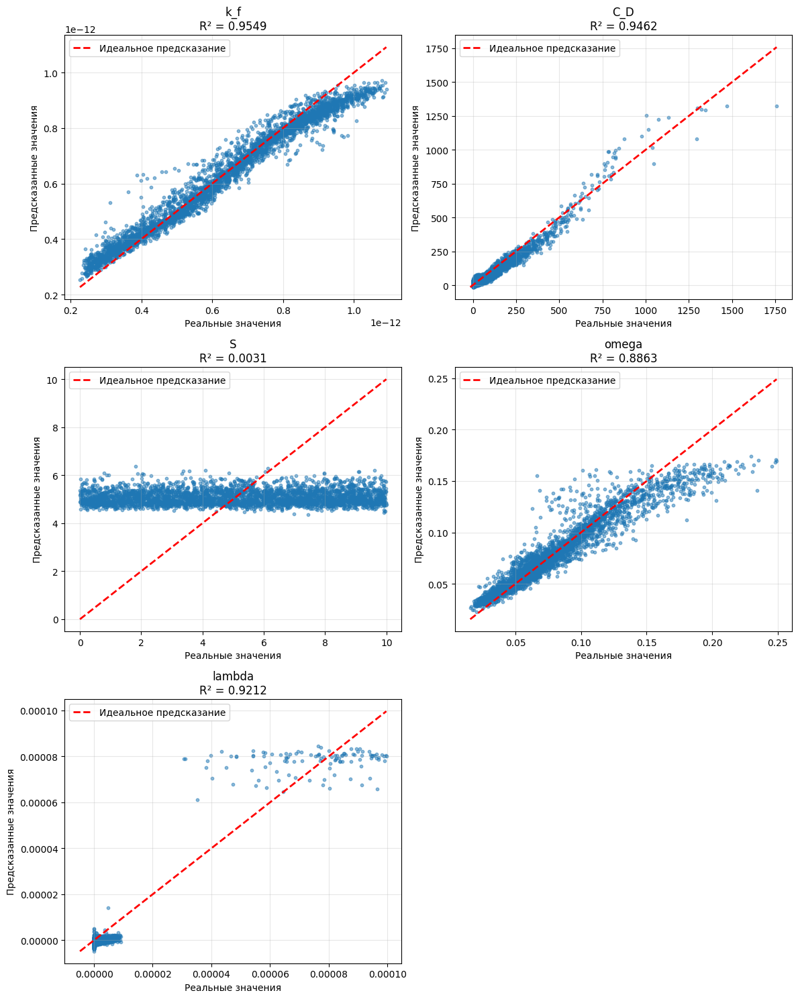

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


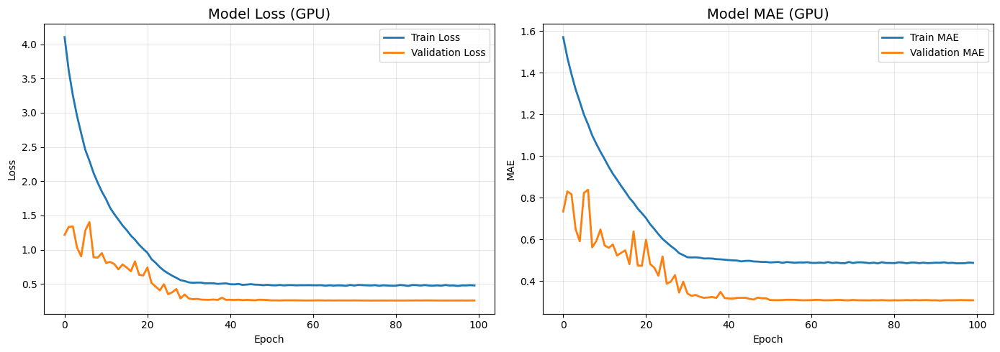

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_porosity_inf', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_porosity_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_porosity_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение двойная пористость бесконечный пласт с разными train, val, test

In [ ]:
!unzip /content/drive/MyDrive/datasets/dual_porosity_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_porosity_inf/params/24.csv  
  inflating: dual_porosity_inf/params/46.csv  
  inflating: dual_porosity_inf/params/48.csv  
  inflating: dual_porosity_inf/params/85.csv  
  inflating: dual_porosity_inf/params/168.csv  
  inflating: dual_porosity_inf/params/183.csv  
  inflating: dual_porosity_inf/params/208.csv  
  inflating: dual_porosity_inf/params/209.csv  
  inflating: dual_porosity_inf/params/215.csv  
  inflating: dual_porosity_inf/params/226.csv  
  inflating: dual_porosity_inf/params/252.csv  
  inflating: dual_porosity_inf/params/268.csv  
  inflating: dual_porosity_inf/params/274.csv  
  inflating: dual_porosity_inf/params/283.csv  
  inflating: dual_porosity_inf/params/290.csv  
  inflating: dual_porosity_inf/params/311.csv  
  inflating: dual_porosity_inf/params/314.csv  
  inflating: dual_porosity_inf/params/319.csv  
  inflating: dual_porosity_inf/params/328.csv  
  inflating: dual_porosi

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_porosity_inf',
    model_type=Model.DUAL_POROSITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k_f': np.float64(8.623772525432176e-13), 'C_D': np.float64(846.6918253984272), 'S': np.float64(8.875777945723872), 'omega': np.float64(0.2016093811191686), 'lambda': np.float64(2.464834985723173e-06), 'data_type': 'train'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 5).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 5).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 5).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=5, input_shape=(128, 2), task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 5)
Валидационные данные: X (2000, 128, 2), y (2000, 5)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 3.3451 - mae: 1.4273 - mse: 3.3451
Epoch 1: val_loss improved from None to 0.78301, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 2.6788 - mae: 1.2759 - mse: 2.6788 - val_loss: 0.7830 - val_mae: 0.7422 - val_mse: 0.7830 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.5362 - mae: 0.9827 - mse: 1.5362
Epoch 2: val_loss improved from 0.78301 to 0.62511, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 1.3522 - mae: 0.9201 - mse: 1.3522 - val_loss: 0.6251 - val_mae: 0.6452 - val_mse: 0.6251 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.8984 - mae: 0.7508 - mse: 0.8984
Epoch 3: val_loss improved from 0.62511 to 0.54023, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.8115 - mae: 0.7099 - mse: 0.8115 - val_loss: 0.5402 - val_mae: 0.5601 - val_mse: 0.5402 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.6246 - mae: 0.6181 - mse: 0.6246
Epoch 4: val_loss improved from 0.54023 to 0.41369, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.5952 - mae: 0.6021 - mse: 0.5952 - val_loss: 0.4137 - val_mae: 0.4616 - val_mse: 0.4137 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5417 - mae: 0.5699 - mse: 0.5417
Epoch 5: val_loss improved from 0.41369 to 0.38630, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.5321 - mae: 0.5636 - mse: 0.5321 - val_loss: 0.3863 - val_mae: 0.4415 - val_mse: 0.3863 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5079 - mae: 0.5513 - mse: 0.5079
Epoch 6: val_loss improved from 0.38630 to 0.36454, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4992 - mae: 0.5470 - mse: 0.4992 - val_loss: 0.3645 - val_mae: 0.4464 - val_mse: 0.3645 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4450 - mae: 0.5205 - mse: 0.4450
Epoch 7: val_loss improved from 0.36454 to 0.22867, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4214 - mae: 0.5053 - mse: 0.4214 - val_loss: 0.2287 - val_mae: 0.3387 - val_mse: 0.2287 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3775 - mae: 0.4731 - mse: 0.3775
Epoch 8: val_loss improved from 0.22867 to 0.20351, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.3700 - mae: 0.4688 - mse: 0.3700 - val_loss: 0.2035 - val_mae: 0.3094 - val_mse: 0.2035 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3583 - mae: 0.4615 - mse: 0.3583
Epoch 9: val_loss improved from 0.20351 to 0.19910, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3548 - mae: 0.4582 - mse: 0.3548 - val_loss: 0.1991 - val_mae: 0.3181 - val_mse: 0.1991 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3471 - mae: 0.4512 - mse: 0.3471
Epoch 10: val_loss improved from 0.19910 to 0.17612, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.3469 - mae: 0.4514 - mse: 0.3469 - val_loss: 0.1761 - val_mae: 0.2781 - val_mse: 0.1761 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3494 - mae: 0.4516 - mse: 0.3494
Epoch 11: val_loss did not improve from 0.17612
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3433 - mae: 0.4472 - mse: 0.3433 - val_loss: 0.1792 - val_mae: 0.2894 - val_mse: 0.1792 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3391 - mae: 0.4430 - mse: 0.3391
Epoch 12: val_loss improved from 0.17612 to 0.17476, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.3379 - mae: 0.4417 - mse: 0.3379 - val_loss: 0.1748 - val_mae: 0.2903 - val_mse: 0.1748 - learning_rate: 5.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 13/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3351 - mae: 0.4382 - mse: 0.3351
Epoch 13: val_loss improved from 0.17476 to 0.17231, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.3320 - mae: 0.4364 - mse: 0.3320 - val_loss: 0.1723 - val_mae: 0.2918 - val_mse: 0.1723 - learning_rate: 5.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 14/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3266 - mae: 0.4331 - mse: 0.3266
Epoch 14: val_loss did not improve from 0.17231
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3262 - mae: 0.4335 - mse: 0.3262 - val_loss: 0.2034 - val_mae: 0.3420 - val_mse: 0.2034 - learning_rate: 5.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 15/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2941 - mae: 0.4191 - mse: 0.2941
Epoch 15: val_loss improved from 0.17231 to 0.08899, saving model to best_model_regression.h5



Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2627 - mae: 0.3985 - mse: 0.2627 - val_loss: 0.0890 - val_mae: 0.2359 - val_mse: 0.0890 - learning_rate: 5.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2159 - mae: 0.3640 - mse: 0.2159
Epoch 16: val_loss improved from 0.08899 to 0.07144, saving model to best_model_regression.h5



Epoch 16: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2109 - mae: 0.3599 - mse: 0.2109 - val_loss: 0.0714 - val_mae: 0.2031 - val_mse: 0.0714 - learning_rate: 5.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 17/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1950 - mae: 0.3470 - mse: 0.1950
Epoch 17: val_loss did not improve from 0.07144
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1955 - mae: 0.3468 - mse: 0.1955 - val_loss: 0.1810 - val_mae: 0.3233 - val_mse: 0.1810 - learning_rate: 5.0000e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 18/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1917 - mae: 0.3448 - mse: 0.1917
Epoch 18: val_loss improved from 0.07144 to 0.04072, saving model to best_model_regression.h5



Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1907 - mae: 0.3433 - mse: 0.1907 - val_loss: 0.0407 - val_mae: 0.1548 - val_mse: 0.0407 - learning_rate: 5.0000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 19/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1843 - mae: 0.3379 - mse: 0.1843
Epoch 19: val_loss did not improve from 0.04072
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1852 - mae: 0.3387 - mse: 0.1852 - val_loss: 0.1128 - val_mae: 0.2588 - val_mse: 0.1128 - learning_rate: 5.0000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 20/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1835 - mae: 0.3372 - mse: 0.1835
Epoch 20: val_loss did not improve from 0.04072
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1815 - mae: 0.3352 - mse: 0.1815 - val_loss: 0.0484 - val_mae: 0.1696 - val_mse: 0.0484 - learnin


Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.1711 - mae: 0.3258 - mse: 0.1711 - val_loss: 0.0370 - val_mae: 0.1446 - val_mse: 0.0370 - learning_rate: 2.5000e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 25/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1690 - mae: 0.3250 - mse: 0.1690
Epoch 25: val_loss did not improve from 0.03703
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.1705 - mae: 0.3256 - mse: 0.1705 - val_loss: 0.0605 - val_mae: 0.2033 - val_mse: 0.0605 - learning_rate: 2.5000e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 26/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1678 - mae: 0.3234 - mse: 0.1678
Epoch 26: val_loss did not improve from 0.03703
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1690 - mae: 0.3240 - mse: 0.1690 - val_loss: 0.0562 - val_mae: 0.1873 - val_mse: 0.0562 - learnin


Epoch 28: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1679 - mae: 0.3224 - mse: 0.1679 - val_loss: 0.0369 - val_mae: 0.1490 - val_mse: 0.0369 - learning_rate: 2.5000e-04

Epoch 29: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 29/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1626 - mae: 0.3178 - mse: 0.1626
Epoch 29: val_loss improved from 0.03687 to 0.03389, saving model to best_model_regression.h5



Epoch 29: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.1651 - mae: 0.3200 - mse: 0.1651 - val_loss: 0.0339 - val_mae: 0.1387 - val_mse: 0.0339 - learning_rate: 2.5000e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 30/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1642 - mae: 0.3197 - mse: 0.1642
Epoch 30: val_loss did not improve from 0.03389
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1645 - mae: 0.3196 - mse: 0.1645 - val_loss: 0.0352 - val_mae: 0.1406 - val_mse: 0.0352 - learning_rate: 2.5000e-04

Epoch 31: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 31/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1617 - mae: 0.3167 - mse: 0.1617
Epoch 31: val_loss improved from 0.03389 to 0.02890, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1613 - mae: 0.3163 - mse: 0.1613 - val_loss: 0.0289 - val_mae: 0.1280 - val_mse: 0.0289 - learning_rate: 2.5000e-05

Epoch 32: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 32/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1620 - mae: 0.3164 - mse: 0.1620
Epoch 32: val_loss improved from 0.02890 to 0.02888, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1623 - mae: 0.3170 - mse: 0.1623 - val_loss: 0.0289 - val_mae: 0.1267 - val_mse: 0.0289 - learning_rate: 2.5000e-05

Epoch 33: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1616 - mae: 0.3159 - mse: 0.1616
Epoch 33: val_loss improved from 0.02888 to 0.02882, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.1614 - mae: 0.3158 - mse: 0.1614 - val_loss: 0.0288 - val_mae: 0.1220 - val_mse: 0.0288 - learning_rate: 2.5000e-05

Epoch 34: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 34/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1606 - mae: 0.3144 - mse: 0.1606
Epoch 34: val_loss improved from 0.02882 to 0.02694, saving model to best_model_regression.h5



Epoch 34: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.1614 - mae: 0.3158 - mse: 0.1614 - val_loss: 0.0269 - val_mae: 0.1135 - val_mse: 0.0269 - learning_rate: 2.5000e-05

Epoch 35: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 35/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1581 - mae: 0.3133 - mse: 0.1581
Epoch 35: val_loss improved from 0.02694 to 0.02647, saving model to best_model_regression.h5



Epoch 35: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.1600 - mae: 0.3155 - mse: 0.1600 - val_loss: 0.0265 - val_mae: 0.1208 - val_mse: 0.0265 - learning_rate: 2.5000e-05

Epoch 36: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 36/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1602 - mae: 0.3155 - mse: 0.1602
Epoch 36: val_loss did not improve from 0.02647
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1604 - mae: 0.3159 - mse: 0.1604 - val_loss: 0.0278 - val_mae: 0.1230 - val_mse: 0.0278 - learning_rate: 2.5000e-05

Epoch 37: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 37/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1609 - mae: 0.3162 - mse: 0.1609
Epoch 37: val_loss did not improve from 0.02647
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1605 - mae: 0.3154 - mse: 0.1605 - val_loss: 0.0267 - val_mae: 0.1196 - val_mse: 0.0267 - learn


Epoch 40: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.1579 - mae: 0.3123 - mse: 0.1579 - val_loss: 0.0256 - val_mae: 0.1183 - val_mse: 0.0256 - learning_rate: 2.5000e-05

Epoch 41: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 41/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1564 - mae: 0.3103 - mse: 0.1564
Epoch 41: val_loss did not improve from 0.02558
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.1588 - mae: 0.3130 - mse: 0.1588 - val_loss: 0.0264 - val_mae: 0.1226 - val_mse: 0.0264 - learning_rate: 2.5000e-05

Epoch 42: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 42/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1623 - mae: 0.3170 - mse: 0.1623
Epoch 42: val_loss did not improve from 0.02558
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.1585 - mae: 0.3137 - mse: 0.1585 - val_loss: 0.0285 - val_mae: 0.1275 - val_mse: 0.0285 - learn


Epoch 46: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.1588 - mae: 0.3139 - mse: 0.1588 - val_loss: 0.0245 - val_mae: 0.1096 - val_mse: 0.0245 - learning_rate: 1.2500e-05

Epoch 47: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 47/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1592 - mae: 0.3141 - mse: 0.1592
Epoch 47: val_loss did not improve from 0.02447
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1602 - mae: 0.3149 - mse: 0.1602 - val_loss: 0.0250 - val_mae: 0.1137 - val_mse: 0.0250 - learning_rate: 1.2500e-05

Epoch 48: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 48/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1597 - mae: 0.3150 - mse: 0.1597
Epoch 48: val_loss did not improve from 0.02447
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1598 - mae: 0.3151 - mse: 0.1598 - val_loss: 0.0266 - val_mae: 0.1153 - val_mse: 0.0266 - lear

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0345
  mae: 0.1318
  mse: 0.0345

📊 Регрессионные метрики (в исходном масштабе):

  k_f:
    MSE:  1.2925e-27
    MAE:  2.6674e-14
    R²:   0.9810

  C_D:
    MSE:  1.7528e+03
    MAE:  3.1292e+01
    R²:   0.9678

  S:
    MSE:  6.8968e-02
    MAE:  2.0567e-01
    R²:   0.9830

  omega:
    MSE:  5.5912e-04
    MAE:  1.6996e-02
    R²:   0.9208

  lambda:
    MSE:  5.7474e-12
    MAE:  1.8313e-06
    R²:   0.2956


Количество выходов: 5
Форма y_test_orig: (4000, 5)
Results: 1.226715262573133e-13 9.182191682347018e-13
Results: 1.0014189960358188e-13 9.998062009973007e-13


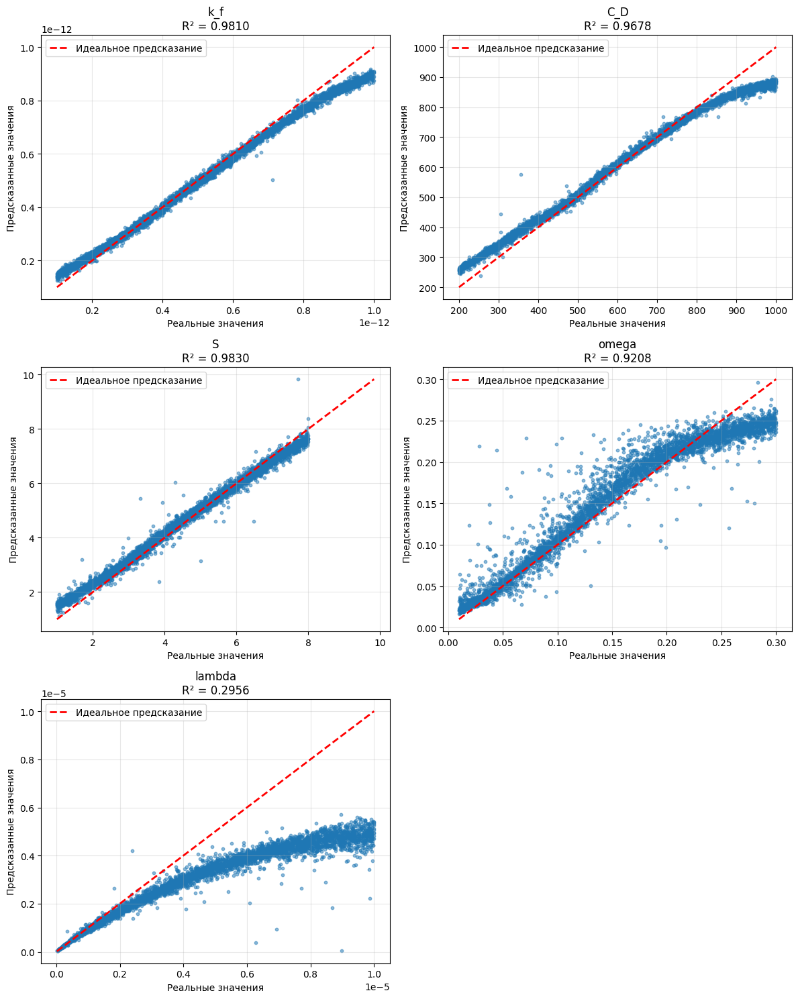

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


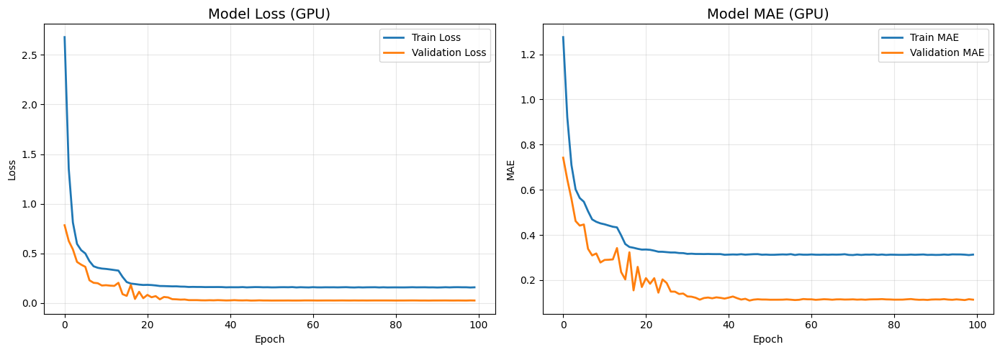

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_porosity_inf', format='all')

✅ Веса модели сохранены: lstm_model_regression_dual_porosity_inf.weights.h5
✅ Модель сохранена в Keras format: lstm_model_regression_dual_porosity_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_model_regression_dual_porosity_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_porosity_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_porosity_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to lstm_model_regression_dual_porosity_inf_scaler_config.json


# Обучение для модели двойной пористости для кругового пласта

In [ ]:
!unzip /content/drive/MyDrive/dual_porosity_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_porosity_fin/params/24.csv  
  inflating: dual_porosity_fin/params/46.csv  
  inflating: dual_porosity_fin/params/48.csv  
  inflating: dual_porosity_fin/params/85.csv  
  inflating: dual_porosity_fin/params/168.csv  
  inflating: dual_porosity_fin/params/183.csv  
  inflating: dual_porosity_fin/params/208.csv  
  inflating: dual_porosity_fin/params/209.csv  
  inflating: dual_porosity_fin/params/215.csv  
  inflating: dual_porosity_fin/params/226.csv  
  inflating: dual_porosity_fin/params/252.csv  
  inflating: dual_porosity_fin/params/268.csv  
  inflating: dual_porosity_fin/params/274.csv  
  inflating: dual_porosity_fin/params/283.csv  
  inflating: dual_porosity_fin/params/290.csv  
  inflating: dual_porosity_fin/params/311.csv  
  inflating: dual_porosity_fin/params/314.csv  
  inflating: dual_porosity_fin/params/319.csv  
  inflating: dual_porosity_fin/params/328.csv  
  inflating: dual_porosi

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_porosity_fin',
    model_type=Model.DUAL_POROSITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
# y_train shape: (14000, 6, 1) - [образцы, временные шаги, признаки]
# Нам нужен 4-й временной шаг (индекс 4) и 0-й признак (т.к. последняя размерность 1)

# Создаем маски на основе значения в 4-м временном шаге
mask_train = y_train[:, 4, 0] <= 1e-4  # (14000,) - булевый массив
mask_val = y_val[:, 4, 0] <= 1e-4
mask_test = y_test[:, 4, 0] <= 1e-4

# Применяем маски к X и y
X_train_filtered = X_train[mask_train]  # (N, 128, 2)
y_train_filtered = y_train[mask_train]  # (N, 6, 1)

X_val_filtered = X_val[mask_val]
y_val_filtered = y_val[mask_val]

X_test_filtered = X_test[mask_test]
y_test_filtered = y_test[mask_test]

# Проверяем результат
print(f"Train: {y_train.shape[0]} -> {y_train_filtered.shape[0]} (удалено: {y_train.shape[0] - y_train_filtered.shape[0]})")
print(f"Val:   {y_val.shape[0]} -> {y_val_filtered.shape[0]} (удалено: {y_val.shape[0] - y_val_filtered.shape[0]})")
print(f"Test:  {y_test.shape[0]} -> {y_test_filtered.shape[0]} (удалено: {y_test.shape[0] - y_test_filtered.shape[0]})")

# Проверяем новые формы
print(f"\nНовые формы:")
print(f"X_train_filtered shape: {X_train_filtered.shape}")
print(f"y_train_filtered shape: {y_train_filtered.shape}")

Train: 14000 -> 12301 (удалено: 1699)
Val:   2000 -> 1773 (удалено: 227)
Test:  4000 -> 3525 (удалено: 475)

Новые формы:
X_train_filtered shape: (12301, 128, 2)
y_train_filtered shape: (12301, 6, 1)


In [ ]:
X_train = X_train_filtered
X_val = X_val_filtered
X_test = X_test_filtered

y_train = y_train_filtered
y_val = y_val_filtered
y_test = y_test_filtered

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

2.2765317130208095e-13 1.093469960505013e-12
2.2765317130208094 10.93469960505013
2.2765317130208095e-13 1.093469960505013e-12
2.2765317130208094 10.93469960505013
Transformed data:  2.2765317130208094 10.93469960505013 6.268957703434185
2.3532506326843185e-13 1.0926023009041956e-12
2.3532506326843183 10.926023009041955
Transformed data:  2.3532506326843183 10.926023009041955 6.298781195933124
2.288001788768131e-13 1.081956890510057e-12
2.288001788768131 10.819568905100569
Transformed data:  2.288001788768131 10.819568905100569 6.233341421044469


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=6, task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=50,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (12301, 128, 2), y (12301, 6)
Валидационные данные: X (1773, 128, 2), y (1773, 6)
Эпохи: 50

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 3.3614 - mae: 1.4055 - mse: 3.3614
Epoch 1: val_loss improved from None to 1.01883, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 16s 37ms/step - loss: 2.7593 - mae: 1.2634 - mse: 2.7593 - val_loss: 1.0188 - val_mae: 0.7172 - val_mse: 1.0188 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.7041 - mae: 0.9718 - mse: 1.7041
Epoch 2: val_loss did not improve from 1.01883
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 1.4949 - mae: 0.9049 - mse: 1.4949 - val_loss: 1.3618 - val_mae: 0.8568 - val_mse: 1.3618 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.0255 - mae: 0.7256 - mse: 1.0255
Epoch 3: val_loss improved from 1.01883 to 0.81810, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.9423 - mae: 0.6866 - mse: 0.9423 - val_loss: 0.8181 - val_mae: 0.6281 - val_mse: 0.8181 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.7674 - mae: 0.5992 - mse: 0.7674
Epoch 4: val_loss did not improve from 0.81810
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.7457 - mae: 0.5855 - mse: 0.7457 - val_loss: 0.9872 - val_mae: 0.6580 - val_mse: 0.9872 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.6774 - mae: 0.5490 - mse: 0.6774
Epoch 5: val_loss did not improve from 0.81810
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.6575 - mae: 0.5423 - mse: 0.6575 - val_loss: 1.0529 - val_mae: 0.6730 - val_mse: 1.0529 - learning_rate: 


Epoch 9: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.4306 - mae: 0.4556 - mse: 0.4306 - val_loss: 0.4553 - val_mae: 0.4932 - val_mse: 0.4553 - learning_rate: 2.5000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 10/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4120 - mae: 0.4460 - mse: 0.4120
Epoch 10: val_loss did not improve from 0.45533
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.4096 - mae: 0.4445 - mse: 0.4096 - val_loss: 0.6896 - val_mae: 0.5585 - val_mse: 0.6896 - learning_rate: 2.5000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 11/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3679 - mae: 0.4268 - mse: 0.3679
Epoch 11: val_loss did not improve from 0.45533
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.3666 - mae: 0.4221 - mse: 0.3666 - val_loss: 0.4757 - val_mae: 0.4555 - val_mse: 0.4757 - learning_r


Epoch 13: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 11s 38ms/step - loss: 0.3357 - mae: 0.3987 - mse: 0.3357 - val_loss: 0.3157 - val_mae: 0.3671 - val_mse: 0.3157 - learning_rate: 2.5000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 14/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3130 - mae: 0.3925 - mse: 0.3130
Epoch 14: val_loss did not improve from 0.31569
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 34ms/step - loss: 0.3174 - mae: 0.3917 - mse: 0.3174 - val_loss: 0.4085 - val_mae: 0.4502 - val_mse: 0.4085 - learning_rate: 2.5000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 15/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3148 - mae: 0.3875 - mse: 0.3148
Epoch 15: val_loss improved from 0.31569 to 0.22525, saving model to best_model_regression.h5



Epoch 15: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.3111 - mae: 0.3856 - mse: 0.3111 - val_loss: 0.2253 - val_mae: 0.3421 - val_mse: 0.2253 - learning_rate: 2.5000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 16/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3015 - mae: 0.3818 - mse: 0.3015
Epoch 16: val_loss did not improve from 0.22525
193/193 ━━━━━━━━━━━━━━━━━━━━ 6s 33ms/step - loss: 0.3056 - mae: 0.3821 - mse: 0.3056 - val_loss: 0.4511 - val_mae: 0.4380 - val_mse: 0.4511 - learning_rate: 2.5000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 17/50
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2880 - mae: 0.3721 - mse: 0.2880
Epoch 17: val_loss did not improve from 0.22525
193/193 ━━━━━━━━━━━━━━━━━━━━ 11s 37ms/step - loss: 0.2953 - mae: 0.3751 - mse: 0.2953 - val_loss: 0.4109 - val_mae: 0.3840 - val_mse: 0.4109 - learning


Epoch 18: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.2937 - mae: 0.3765 - mse: 0.2937 - val_loss: 0.1942 - val_mae: 0.3056 - val_mse: 0.1942 - learning_rate: 2.5000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 19/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2948 - mae: 0.3752 - mse: 0.2948
Epoch 19: val_loss did not improve from 0.19415
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2865 - mae: 0.3717 - mse: 0.2865 - val_loss: 0.3414 - val_mae: 0.3762 - val_mse: 0.3414 - learning_rate: 2.5000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 20/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2788 - mae: 0.3666 - mse: 0.2788
Epoch 20: val_loss did not improve from 0.19415
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2813 - mae: 0.3694 - mse: 0.2813 - val_loss: 0.2547 - val_mae: 0.3478 - val_mse: 0.2547 - learning_


Epoch 25: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2572 - mae: 0.3525 - mse: 0.2572 - val_loss: 0.1587 - val_mae: 0.2743 - val_mse: 0.1587 - learning_rate: 1.2500e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 26/50
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2555 - mae: 0.3522 - mse: 0.2555
Epoch 26: val_loss did not improve from 0.15870
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2546 - mae: 0.3522 - mse: 0.2546 - val_loss: 0.1854 - val_mae: 0.2617 - val_mse: 0.1854 - learning_rate: 1.2500e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 27/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2574 - mae: 0.3521 - mse: 0.2574
Epoch 27: val_loss did not improve from 0.15870
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.2535 - mae: 0.3497 - mse: 0.2535 - val_loss: 0.2156 - val_mae: 0.3256 - val_mse: 0.2156 - learning_


Epoch 30: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.2476 - mae: 0.3481 - mse: 0.2476 - val_loss: 0.1471 - val_mae: 0.2526 - val_mse: 0.1471 - learning_rate: 1.2500e-04

Epoch 31: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 31/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2478 - mae: 0.3460 - mse: 0.2478
Epoch 31: val_loss improved from 0.14712 to 0.09737, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2417 - mae: 0.3441 - mse: 0.2417 - val_loss: 0.0974 - val_mae: 0.1865 - val_mse: 0.0974 - learning_rate: 1.2500e-05

Epoch 32: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 32/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2368 - mae: 0.3397 - mse: 0.2368
Epoch 32: val_loss did not improve from 0.09737
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2406 - mae: 0.3422 - mse: 0.2406 - val_loss: 0.1138 - val_mae: 0.2087 - val_mse: 0.1138 - learning_rate: 1.2500e-05

Epoch 33: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 33/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2358 - mae: 0.3403 - mse: 0.2358
Epoch 33: val_loss did not improve from 0.09737
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2353 - mae: 0.3397 - mse: 0.2353 - val_loss: 0.0978 - val_mae: 0.1905 - val_mse: 0.0978 - learnin


Epoch 35: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2357 - mae: 0.3416 - mse: 0.2357 - val_loss: 0.0963 - val_mae: 0.1938 - val_mse: 0.0963 - learning_rate: 1.2500e-05

Epoch 36: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 36/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2459 - mae: 0.3435 - mse: 0.2459
Epoch 36: val_loss did not improve from 0.09633
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2409 - mae: 0.3417 - mse: 0.2409 - val_loss: 0.1013 - val_mae: 0.2067 - val_mse: 0.1013 - learning_rate: 1.2500e-05

Epoch 37: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 37/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2331 - mae: 0.3403 - mse: 0.2331
Epoch 37: val_loss did not improve from 0.09633
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2320 - mae: 0.3388 - mse: 0.2320 - val_loss: 0.0974 - val_mae: 0.2011 - val_mse: 0.0974 - learnin


Epoch 38: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2396 - mae: 0.3424 - mse: 0.2396 - val_loss: 0.0947 - val_mae: 0.1892 - val_mse: 0.0947 - learning_rate: 1.2500e-05

Epoch 39: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 39/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2317 - mae: 0.3382 - mse: 0.2317
Epoch 39: val_loss did not improve from 0.09468
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2333 - mae: 0.3392 - mse: 0.2333 - val_loss: 0.1132 - val_mae: 0.1992 - val_mse: 0.1132 - learning_rate: 1.2500e-05

Epoch 40: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 40/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2314 - mae: 0.3380 - mse: 0.2314
Epoch 40: val_loss improved from 0.09468 to 0.09343, saving model to best_model_regression.h5



Epoch 40: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2349 - mae: 0.3390 - mse: 0.2349 - val_loss: 0.0934 - val_mae: 0.1866 - val_mse: 0.0934 - learning_rate: 1.2500e-05

Epoch 41: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 41/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2336 - mae: 0.3425 - mse: 0.2336
Epoch 41: val_loss improved from 0.09343 to 0.08970, saving model to best_model_regression.h5



Epoch 41: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.2373 - mae: 0.3430 - mse: 0.2373 - val_loss: 0.0897 - val_mae: 0.1887 - val_mse: 0.0897 - learning_rate: 1.2500e-05

Epoch 42: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 42/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2378 - mae: 0.3408 - mse: 0.2378
Epoch 42: val_loss did not improve from 0.08970
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 36ms/step - loss: 0.2371 - mae: 0.3402 - mse: 0.2371 - val_loss: 0.0918 - val_mae: 0.1940 - val_mse: 0.0918 - learning_rate: 1.2500e-05

Epoch 43: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 43/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2290 - mae: 0.3375 - mse: 0.2290
Epoch 43: val_loss did not improve from 0.08970
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.2312 - mae: 0.3386 - mse: 0.2312 - val_loss: 0.0904 - val_mae: 0.1832 - val_mse: 0.0904 - learnin


Epoch 44: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2389 - mae: 0.3410 - mse: 0.2389 - val_loss: 0.0864 - val_mae: 0.1755 - val_mse: 0.0864 - learning_rate: 1.2500e-05

Epoch 45: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 45/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2366 - mae: 0.3399 - mse: 0.2366
Epoch 45: val_loss did not improve from 0.08642
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 35ms/step - loss: 0.2369 - mae: 0.3403 - mse: 0.2369 - val_loss: 0.0914 - val_mae: 0.1812 - val_mse: 0.0914 - learning_rate: 1.2500e-05

Epoch 46: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 46/50
193/193 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2347 - mae: 0.3376 - mse: 0.2347
Epoch 46: val_loss did not improve from 0.08642
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 37ms/step - loss: 0.2347 - mae: 0.3400 - mse: 0.2347 - val_loss: 0.0865 - val_mae: 0.1793 - val_mse: 0.0865 - learnin


Epoch 48: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 7s 38ms/step - loss: 0.2317 - mae: 0.3382 - mse: 0.2317 - val_loss: 0.0863 - val_mae: 0.1819 - val_mse: 0.0863 - learning_rate: 1.2500e-05

Epoch 49: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 49/50
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2345 - mae: 0.3388 - mse: 0.2345
Epoch 49: val_loss did not improve from 0.08635

Epoch 49: ReduceLROnPlateau reducing learning rate to 6.250000296859071e-06.
193/193 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.2358 - mae: 0.3379 - mse: 0.2358 - val_loss: 0.0912 - val_mae: 0.1893 - val_mse: 0.0912 - learning_rate: 6.2500e-06

Epoch 50: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 50/50
192/193 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2310 - mae: 0.3388 - mse: 0.2310
Epoch 50: val_loss improved from 0.08635 to 0.08449, saving model to best_model_regression.h5



Epoch 50: finished saving model to best_model_regression.h5
193/193 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.2331 - mae: 0.3390 - mse: 0.2331 - val_loss: 0.0845 - val_mae: 0.1812 - val_mse: 0.0845 - learning_rate: 6.2500e-06

✅ Обучение завершено за 372.28 секунд
✅ Лучшая модель сохранена в: best_model_regression.h5


✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0775
  mae: 0.1762
  mse: 0.0775
-1.8009847925715088 2.058696892601538
2.2880017887681317 10.819568905100569
-1.4638036 1.6946577
3.033318 10.014885

📊 Регрессионные метрики (в исходном масштабе):

  k_f:
    MSE:  2.5782e-27
    MAE:  4.0263e-14
    R²:   0.9461

  C_D:
    MSE:  4.4921e+02
    MAE:  1.3957e+01
    R²:   0.9816

  S:
    MSE:  5.8769e-01
    MAE:  5.5945e-01
    R²:   0.9296

  omega:
    MSE:  3.6434e-04
    MAE:  1.4114e-02
    R²:   0.7575

  lambda:
    MSE:  8.0957e-12
    MAE:  8.7304e-07
    R²:   0.9415

  r_D_e:
    MSE:  2.8863e+05
    MAE:  4.3571e+02
    R²:   0.9579
-1.8009847925715088 2.058696892601538
2.2880017887681317 10.819568905100569
-1.4638036 1.6946577
3.033318 10.014885


-1.8009847925715088 2.058696892601538
2.2880017887681317 10.819568905100569
-1.4638036 1.6946577
3.033318 10.014885
Количество выходов: 6
Форма y_test_orig: (3525, 6)
Results: 3.0333182255044833e-13 1.0014884971668025e-12
Results: 2.2880017887681317e-13 1.081956890510057e-12


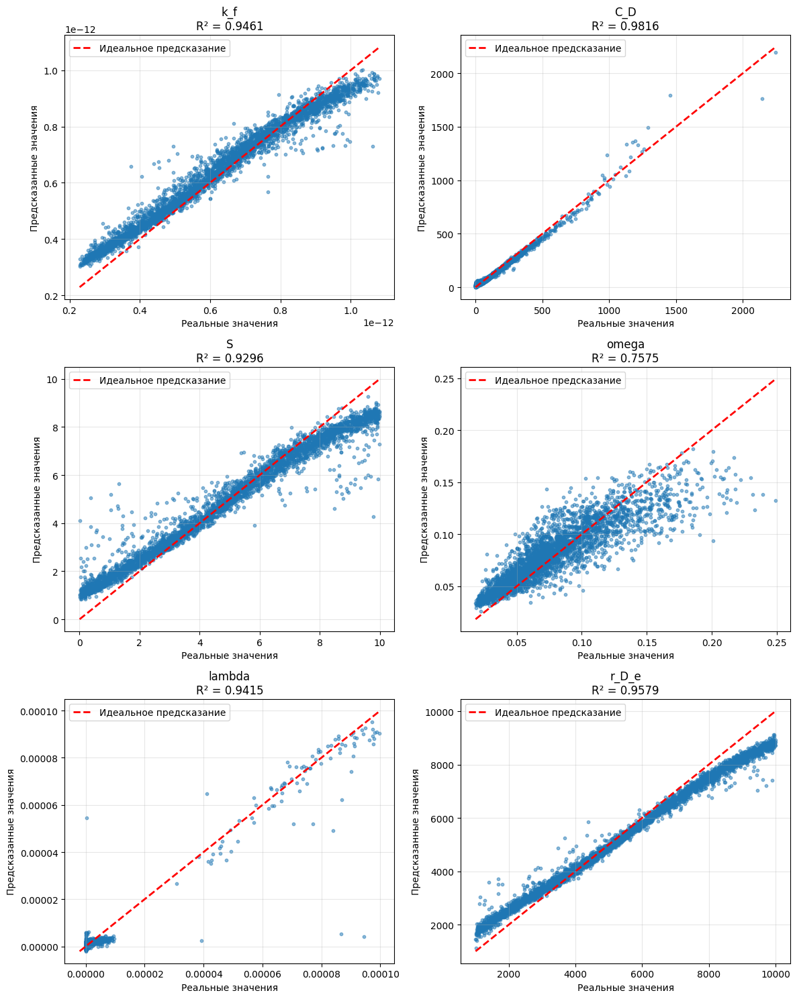

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


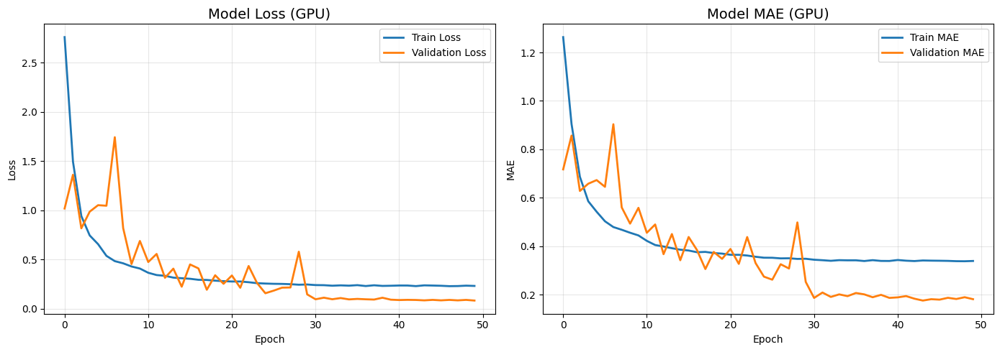

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_porosity_fin', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_porosity_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_porosity_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение двойная пористость круговой пласт с разными train, val, test

In [ ]:
!unzip /content/drive/MyDrive/datasets/dual_porosity_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_porosity_fin/params/24.csv  
  inflating: dual_porosity_fin/params/46.csv  
  inflating: dual_porosity_fin/params/48.csv  
  inflating: dual_porosity_fin/params/85.csv  
  inflating: dual_porosity_fin/params/168.csv  
  inflating: dual_porosity_fin/params/183.csv  
  inflating: dual_porosity_fin/params/208.csv  
  inflating: dual_porosity_fin/params/209.csv  
  inflating: dual_porosity_fin/params/215.csv  
  inflating: dual_porosity_fin/params/226.csv  
  inflating: dual_porosity_fin/params/252.csv  
  inflating: dual_porosity_fin/params/268.csv  
  inflating: dual_porosity_fin/params/274.csv  
  inflating: dual_porosity_fin/params/283.csv  
  inflating: dual_porosity_fin/params/290.csv  
  inflating: dual_porosity_fin/params/311.csv  
  inflating: dual_porosity_fin/params/314.csv  
  inflating: dual_porosity_fin/params/319.csv  
  inflating: dual_porosity_fin/params/328.csv  
  inflating: dual_porosi

In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_porosity_fin',
    model_type=Model.DUAL_POROSITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k_f': np.float64(9.633145577704826e-13), 'C_D': np.float64(309.04083075723315), 'S': np.float64(3.98883247018218), 'omega': np.float64(0.0789596464266675), 'lambda': np.float64(2.5381250989569288e-06), 'R_eD': np.float64(9171.301488915708), 'data_type': 'test'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=6, input_shape=(128, 2), task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k_f', 'C_D', 'S', 'omega', 'lambda', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 3.3673 - mae: 1.4328 - mse: 3.3673
Epoch 1: val_loss improved from None to 0.87933, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 19s 44ms/step - loss: 2.6935 - mae: 1.2772 - mse: 2.6935 - val_loss: 0.8793 - val_mae: 0.7686 - val_mse: 0.8793 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.5753 - mae: 0.9959 - mse: 1.5753
Epoch 2: val_loss improved from 0.87933 to 0.72806, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 1.3904 - mae: 0.9365 - mse: 1.3904 - val_loss: 0.7281 - val_mae: 0.7073 - val_mse: 0.7281 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.0066 - mae: 0.8045 - mse: 1.0066
Epoch 3: val_loss improved from 0.72806 to 0.60484, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.9342 - mae: 0.7752 - mse: 0.9342 - val_loss: 0.6048 - val_mae: 0.6134 - val_mse: 0.6048 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.7824 - mae: 0.7117 - mse: 0.7824
Epoch 4: val_loss did not improve from 0.60484
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.7494 - mae: 0.6962 - mse: 0.7494 - val_loss: 0.6256 - val_mae: 0.5847 - val_mse: 0.6256 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.6557 - mae: 0.6491 - mse: 0.6557
Epoch 5: val_loss improved from 0.60484 to 0.52159, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.6287 - mae: 0.6341 - mse: 0.6287 - val_loss: 0.5216 - val_mae: 0.5705 - val_mse: 0.5216 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5815 - mae: 0.6059 - mse: 0.5815
Epoch 6: val_loss improved from 0.52159 to 0.47240, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.5767 - mae: 0.6029 - mse: 0.5767 - val_loss: 0.4724 - val_mae: 0.5108 - val_mse: 0.4724 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5445 - mae: 0.5838 - mse: 0.5445
Epoch 7: val_loss improved from 0.47240 to 0.40818, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.5332 - mae: 0.5783 - mse: 0.5332 - val_loss: 0.4082 - val_mae: 0.4827 - val_mse: 0.4082 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4880 - mae: 0.5517 - mse: 0.4880
Epoch 8: val_loss did not improve from 0.40818
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4704 - mae: 0.5419 - mse: 0.4704 - val_loss: 0.4958 - val_mae: 0.5538 - val_mse: 0.4958 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4360 - mae: 0.5202 - mse: 0.4360
Epoch 9: val_loss improved from 0.40818 to 0.24771, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.4226 - mae: 0.5122 - mse: 0.4226 - val_loss: 0.2477 - val_mae: 0.3741 - val_mse: 0.2477 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3867 - mae: 0.4889 - mse: 0.3867
Epoch 10: val_loss improved from 0.24771 to 0.21430, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3829 - mae: 0.4858 - mse: 0.3829 - val_loss: 0.2143 - val_mae: 0.3543 - val_mse: 0.2143 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3617 - mae: 0.4714 - mse: 0.3617
Epoch 11: val_loss improved from 0.21430 to 0.19075, saving model to best_model_regression.h5



Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.3586 - mae: 0.4690 - mse: 0.3586 - val_loss: 0.1907 - val_mae: 0.3351 - val_mse: 0.1907 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.3313 - mae: 0.4521 - mse: 0.3313
Epoch 12: val_loss improved from 0.19075 to 0.14978, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3212 - mae: 0.4459 - mse: 0.3212 - val_loss: 0.1498 - val_mae: 0.2982 - val_mse: 0.1498 - learning_rate: 5.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 13/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2890 - mae: 0.4237 - mse: 0.2890
Epoch 13: val_loss improved from 0.14978 to 0.13925, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2829 - mae: 0.4191 - mse: 0.2829 - val_loss: 0.1392 - val_mae: 0.2891 - val_mse: 0.1392 - learning_rate: 5.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 14/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2664 - mae: 0.4074 - mse: 0.2664
Epoch 14: val_loss improved from 0.13925 to 0.10086, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2627 - mae: 0.4051 - mse: 0.2627 - val_loss: 0.1009 - val_mae: 0.2439 - val_mse: 0.1009 - learning_rate: 5.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 15/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2546 - mae: 0.3975 - mse: 0.2546
Epoch 15: val_loss improved from 0.10086 to 0.08916, saving model to best_model_regression.h5



Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2514 - mae: 0.3953 - mse: 0.2514 - val_loss: 0.0892 - val_mae: 0.2358 - val_mse: 0.0892 - learning_rate: 5.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2439 - mae: 0.3899 - mse: 0.2439
Epoch 16: val_loss did not improve from 0.08916
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2424 - mae: 0.3882 - mse: 0.2424 - val_loss: 0.1069 - val_mae: 0.2504 - val_mse: 0.1069 - learning_rate: 5.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 17/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step - loss: 0.2380 - mae: 0.3842 - mse: 0.2380
Epoch 17: val_loss improved from 0.08916 to 0.07033, saving model to best_model_regression.h5



Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 43ms/step - loss: 0.2366 - mae: 0.3830 - mse: 0.2366 - val_loss: 0.0703 - val_mae: 0.1976 - val_mse: 0.0703 - learning_rate: 5.0000e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 18/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2337 - mae: 0.3815 - mse: 0.2337
Epoch 18: val_loss did not improve from 0.07033
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2325 - mae: 0.3803 - mse: 0.2325 - val_loss: 0.0960 - val_mae: 0.2432 - val_mse: 0.0960 - learning_rate: 5.0000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 19/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2269 - mae: 0.3755 - mse: 0.2269
Epoch 19: val_loss did not improve from 0.07033
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2259 - mae: 0.3745 - mse: 0.2259 - val_loss: 0.0800 - val_mae: 0.2143 - val_mse: 0.0800 - learni


Epoch 21: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2198 - mae: 0.3698 - mse: 0.2198 - val_loss: 0.0666 - val_mae: 0.1925 - val_mse: 0.0666 - learning_rate: 5.0000e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 22/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2170 - mae: 0.3670 - mse: 0.2170
Epoch 22: val_loss did not improve from 0.06657
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2158 - mae: 0.3661 - mse: 0.2158 - val_loss: 0.0767 - val_mae: 0.2177 - val_mse: 0.0767 - learning_rate: 5.0000e-04

Epoch 23: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 23/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2140 - mae: 0.3660 - mse: 0.2140
Epoch 23: val_loss did not improve from 0.06657
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2119 - mae: 0.3634 - mse: 0.2119 - val_loss: 0.0767 - val_mae: 0.2119 - val_mse: 0.0767 - learnin


Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2104 - mae: 0.3620 - mse: 0.2104 - val_loss: 0.0564 - val_mae: 0.1804 - val_mse: 0.0564 - learning_rate: 5.0000e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 26/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2093 - mae: 0.3609 - mse: 0.2093
Epoch 26: val_loss did not improve from 0.05636
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2088 - mae: 0.3607 - mse: 0.2088 - val_loss: 0.0590 - val_mae: 0.1791 - val_mse: 0.0590 - learning_rate: 5.0000e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 27/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2034 - mae: 0.3556 - mse: 0.2034
Epoch 27: val_loss did not improve from 0.05636
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2057 - mae: 0.3572 - mse: 0.2057 - val_loss: 0.0855 - val_mae: 0.2244 - val_mse: 0.0855 - learnin


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1925 - mae: 0.3455 - mse: 0.1925 - val_loss: 0.0473 - val_mae: 0.1602 - val_mse: 0.0473 - learning_rate: 2.5000e-05

Epoch 32: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 32/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1904 - mae: 0.3436 - mse: 0.1904
Epoch 32: val_loss improved from 0.04731 to 0.04669, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 38ms/step - loss: 0.1903 - mae: 0.3438 - mse: 0.1903 - val_loss: 0.0467 - val_mae: 0.1596 - val_mse: 0.0467 - learning_rate: 2.5000e-05

Epoch 33: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1863 - mae: 0.3407 - mse: 0.1863
Epoch 33: val_loss improved from 0.04669 to 0.04488, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1873 - mae: 0.3410 - mse: 0.1873 - val_loss: 0.0449 - val_mae: 0.1572 - val_mse: 0.0449 - learning_rate: 2.5000e-05

Epoch 34: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 34/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1879 - mae: 0.3415 - mse: 0.1879
Epoch 34: val_loss improved from 0.04488 to 0.04293, saving model to best_model_regression.h5



Epoch 34: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1893 - mae: 0.3428 - mse: 0.1893 - val_loss: 0.0429 - val_mae: 0.1539 - val_mse: 0.0429 - learning_rate: 2.5000e-05

Epoch 35: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 35/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.1893 - mae: 0.3433 - mse: 0.1893
Epoch 35: val_loss did not improve from 0.04293
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.1903 - mae: 0.3442 - mse: 0.1903 - val_loss: 0.0437 - val_mae: 0.1538 - val_mse: 0.0437 - learning_rate: 2.5000e-05

Epoch 36: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 36/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1872 - mae: 0.3414 - mse: 0.1872
Epoch 36: val_loss did not improve from 0.04293
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1874 - mae: 0.3411 - mse: 0.1874 - val_loss: 0.0437 - val_mae: 0.1565 - val_mse: 0.0437 - learn


Epoch 37: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1878 - mae: 0.3418 - mse: 0.1878 - val_loss: 0.0411 - val_mae: 0.1495 - val_mse: 0.0411 - learning_rate: 2.5000e-05

Epoch 38: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 38/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.1850 - mae: 0.3392 - mse: 0.1850
Epoch 38: val_loss did not improve from 0.04110
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1859 - mae: 0.3398 - mse: 0.1859 - val_loss: 0.0457 - val_mae: 0.1570 - val_mse: 0.0457 - learning_rate: 2.5000e-05

Epoch 39: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 39/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1906 - mae: 0.3448 - mse: 0.1906
Epoch 39: val_loss did not improve from 0.04110
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1905 - mae: 0.3440 - mse: 0.1905 - val_loss: 0.0426 - val_mae: 0.1524 - val_mse: 0.0426 - learn


Epoch 41: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.1859 - mae: 0.3402 - mse: 0.1859 - val_loss: 0.0409 - val_mae: 0.1482 - val_mse: 0.0409 - learning_rate: 2.5000e-05

Epoch 42: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 42/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1872 - mae: 0.3422 - mse: 0.1872
Epoch 42: val_loss did not improve from 0.04093
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1877 - mae: 0.3418 - mse: 0.1877 - val_loss: 0.0450 - val_mae: 0.1577 - val_mse: 0.0450 - learning_rate: 2.5000e-05

Epoch 43: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 43/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.1886 - mae: 0.3422 - mse: 0.1886
Epoch 43: val_loss did not improve from 0.04093
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.1878 - mae: 0.3417 - mse: 0.1878 - val_loss: 0.0415 - val_mae: 0.1513 - val_mse: 0.0415 - learn


Epoch 47: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1859 - mae: 0.3398 - mse: 0.1859 - val_loss: 0.0406 - val_mae: 0.1473 - val_mse: 0.0406 - learning_rate: 1.2500e-05

Epoch 48: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 48/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1842 - mae: 0.3388 - mse: 0.1842
Epoch 48: val_loss did not improve from 0.04055
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1845 - mae: 0.3385 - mse: 0.1845 - val_loss: 0.0414 - val_mae: 0.1486 - val_mse: 0.0414 - learning_rate: 1.2500e-05

Epoch 49: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 49/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.1880 - mae: 0.3428 - mse: 0.1880
Epoch 49: val_loss did not improve from 0.04055
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.1853 - mae: 0.3404 - mse: 0.1853 - val_loss: 0.0417 - val_mae: 0.1495 - val_mse: 0.0417 - learn

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0445
  mae: 0.1560
  mse: 0.0445

📊 Регрессионные метрики (в исходном масштабе):

  k_f:
    MSE:  2.6483e-27
    MAE:  3.7445e-14
    R²:   0.9604

  C_D:
    MSE:  1.9891e+03
    MAE:  3.3518e+01
    R²:   0.9634

  S:
    MSE:  1.5560e-01
    MAE:  2.8764e-01
    R²:   0.9604

  omega:
    MSE:  6.9731e-04
    MAE:  1.8717e-02
    R²:   0.8980

  lambda:
    MSE:  7.4326e-12
    MAE:  2.1216e-06
    R²:   0.1199

  r_D_e:
    MSE:  2.2081e+05
    MAE:  3.4605e+02
    R²:   0.9591


Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: 1.1280477149166329e-13 9.077774881620371e-13
Results: 1.0008395428208061e-13 9.998707603134344e-13


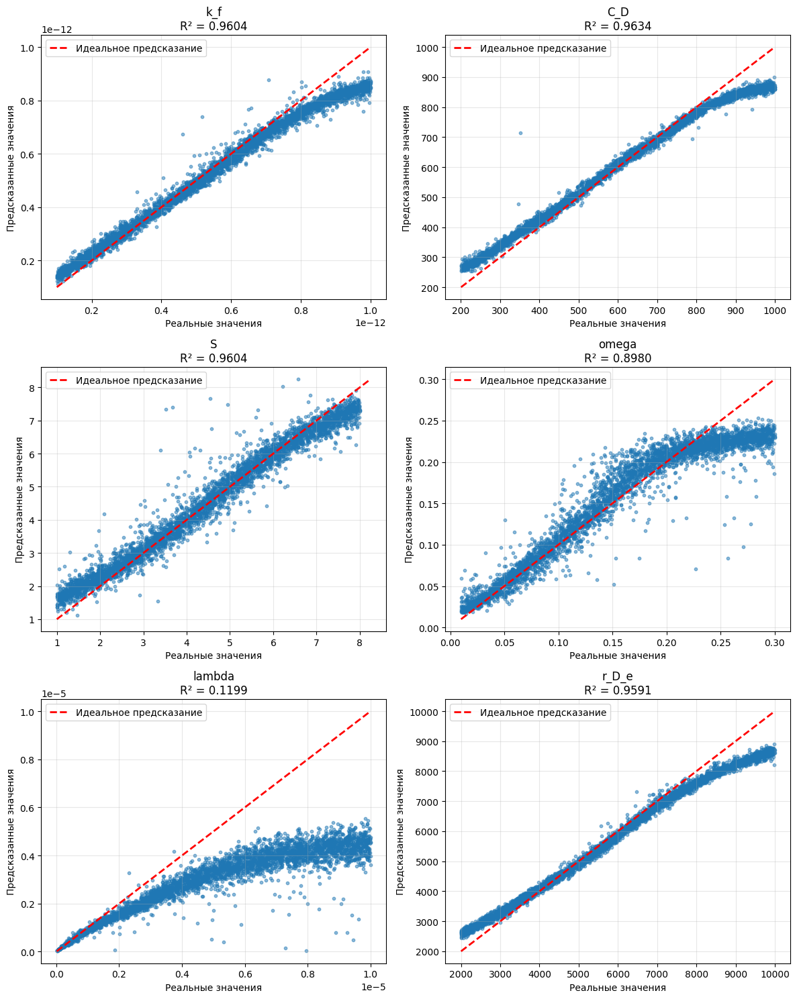

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


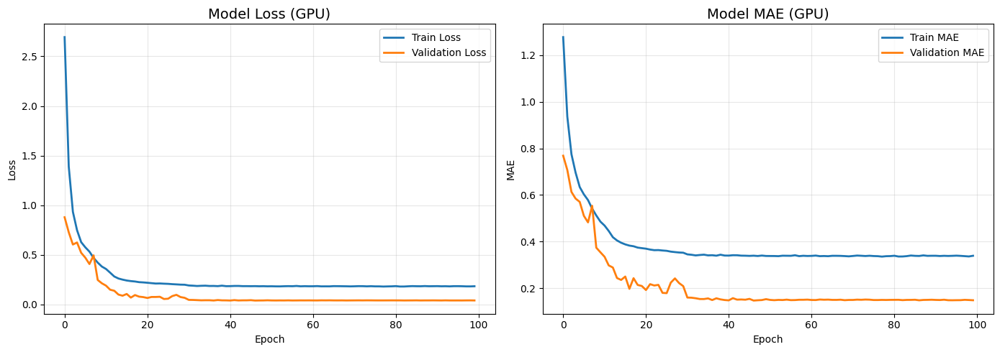

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_porosity_fin', format='all')

✅ Веса модели сохранены: lstm_model_regression_dual_porosity_fin.weights.h5
✅ Модель сохранена в Keras format: lstm_model_regression_dual_porosity_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_model_regression_dual_porosity_fin_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_porosity_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_porosity_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to lstm_model_regression_dual_porosity_fin_scaler_config.json


# Обучение для модели двойной проницаемости для бесконечного пласта

In [ ]:
!unzip /content/drive/MyDrive/dual_permeability_inf1.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_permeability_inf1/params/24.csv  
  inflating: dual_permeability_inf1/params/46.csv  
  inflating: dual_permeability_inf1/params/48.csv  
  inflating: dual_permeability_inf1/params/85.csv  
  inflating: dual_permeability_inf1/params/168.csv  
  inflating: dual_permeability_inf1/params/183.csv  
  inflating: dual_permeability_inf1/params/208.csv  
  inflating: dual_permeability_inf1/params/209.csv  
  inflating: dual_permeability_inf1/params/215.csv  
  inflating: dual_permeability_inf1/params/226.csv  
  inflating: dual_permeability_inf1/params/252.csv  
  inflating: dual_permeability_inf1/params/268.csv  
  inflating: dual_permeability_inf1/params/274.csv  
  inflating: dual_permeability_inf1/params/283.csv  
  inflating: dual_permeability_inf1/params/290.csv  
  inflating: dual_permeability_inf1/params/311.csv  
  inflating: dual_permeability_inf1/params/314.csv  
  inflating: dual_permeability_inf1

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_permeability_inf1',
    model_type=Model.DUAL_PERMEABILITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

8.870504534173776e-15 7.94410859885136e-13
0.08870504534173776 7.9441085988513604
8.870504534173776e-15 7.94410859885136e-13
0.08870504534173776 7.9441085988513604
Transformed data:  0.08870504534173776 7.9441085988513604 1.2644849910512983
9.96543770096279e-15 7.054425899399876e-13
0.09965437700962791 7.054425899399876
Transformed data:  0.09965437700962791 7.054425899399876 1.3096413552209345
1.200522348152422e-14 6.962941938370646e-13
0.1200522348152422 6.962941938370647
Transformed data:  0.1200522348152422 6.962941938370647 1.2542470647366517


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=6, task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 3.5857 - mae: 1.4650 - mse: 3.5857
Epoch 1: val_loss improved from None to 1.22441, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 17s 36ms/step - loss: 2.8152 - mae: 1.2863 - mse: 2.8152 - val_loss: 1.2244 - val_mae: 0.8814 - val_mse: 1.2244 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.5069 - mae: 0.9303 - mse: 1.5069
Epoch 2: val_loss improved from 1.22441 to 1.20988, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 1.3343 - mae: 0.8657 - mse: 1.3343 - val_loss: 1.2099 - val_mae: 0.8426 - val_mse: 1.2099 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.9470 - mae: 0.7123 - mse: 0.9470
Epoch 3: val_loss improved from 1.20988 to 0.93549, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.8557 - mae: 0.6748 - mse: 0.8557 - val_loss: 0.9355 - val_mae: 0.7030 - val_mse: 0.9355 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6711 - mae: 0.5908 - mse: 0.6711
Epoch 4: val_loss improved from 0.93549 to 0.58423, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.6540 - mae: 0.5790 - mse: 0.6540 - val_loss: 0.5842 - val_mae: 0.5520 - val_mse: 0.5842 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6145 - mae: 0.5556 - mse: 0.6145
Epoch 5: val_loss did not improve from 0.58423
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.5985 - mae: 0.5491 - mse: 0.5985 - val_loss: 0.7613 - val_mae: 0.6694 - val_mse: 0.7613 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5760 - mae: 0.5359 - mse: 0.5760
Epoch 6: val_loss did not improve from 0.58423
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.5565 - mae: 0.5267 - mse: 0.5565 - val_loss: 0.6065 - val_mae: 0.5229 - val_mse: 0.6065 - learning_rate:


Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4915 - mae: 0.4880 - mse: 0.4915 - val_loss: 0.5481 - val_mae: 0.5184 - val_mse: 0.5481 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4545 - mae: 0.4653 - mse: 0.4545
Epoch 8: val_loss did not improve from 0.54812
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.4525 - mae: 0.4614 - mse: 0.4525 - val_loss: 0.8207 - val_mae: 0.6527 - val_mse: 0.8207 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4410 - mae: 0.4529 - mse: 0.4410
Epoch 9: val_loss did not improve from 0.54812
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4297 - mae: 0.4472 - mse: 0.4297 - val_loss: 1.4061 - val_mae: 0.8413 - val_mse: 1.4061 - learning_rate:


Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.3563 - mae: 0.4102 - mse: 0.3563 - val_loss: 0.3057 - val_mae: 0.4006 - val_mse: 0.3057 - learning_rate: 5.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 13/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.3462 - mae: 0.4048 - mse: 0.3462
Epoch 13: val_loss did not improve from 0.30567
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.3538 - mae: 0.4073 - mse: 0.3538 - val_loss: 1.0368 - val_mae: 0.7111 - val_mse: 1.0368 - learning_rate: 5.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 14/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3356 - mae: 0.4006 - mse: 0.3356
Epoch 14: val_loss did not improve from 0.30567
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3405 - mae: 0.4005 - mse: 0.3405 - val_loss: 0.6597 - val_mae: 0.6264 - val_mse: 0.6597 - learnin


Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3134 - mae: 0.3862 - mse: 0.3134 - val_loss: 0.3010 - val_mae: 0.3716 - val_mse: 0.3010 - learning_rate: 2.5000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 19/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3082 - mae: 0.3829 - mse: 0.3082
Epoch 19: val_loss did not improve from 0.30096
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3096 - mae: 0.3847 - mse: 0.3096 - val_loss: 0.5195 - val_mae: 0.4873 - val_mse: 0.5195 - learning_rate: 2.5000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 20/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3090 - mae: 0.3851 - mse: 0.3090
Epoch 20: val_loss did not improve from 0.30096
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3138 - mae: 0.3864 - mse: 0.3138 - val_loss: 1.0549 - val_mae: 0.7628 - val_mse: 1.0549 - learnin


Epoch 24: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2892 - mae: 0.3719 - mse: 0.2892 - val_loss: 0.2649 - val_mae: 0.3461 - val_mse: 0.2649 - learning_rate: 1.2500e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 25/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2847 - mae: 0.3690 - mse: 0.2847
Epoch 25: val_loss improved from 0.26490 to 0.22168, saving model to best_model_regression.h5



Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2850 - mae: 0.3686 - mse: 0.2850 - val_loss: 0.2217 - val_mae: 0.3104 - val_mse: 0.2217 - learning_rate: 1.2500e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 26/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2774 - mae: 0.3672 - mse: 0.2774
Epoch 26: val_loss improved from 0.22168 to 0.16400, saving model to best_model_regression.h5



Epoch 26: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2839 - mae: 0.3690 - mse: 0.2839 - val_loss: 0.1640 - val_mae: 0.2686 - val_mse: 0.1640 - learning_rate: 1.2500e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 27/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2865 - mae: 0.3669 - mse: 0.2865
Epoch 27: val_loss did not improve from 0.16400
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2779 - mae: 0.3650 - mse: 0.2779 - val_loss: 0.2813 - val_mae: 0.3653 - val_mse: 0.2813 - learning_rate: 1.2500e-04

Epoch 28: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 28/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2729 - mae: 0.3635 - mse: 0.2729
Epoch 28: val_loss did not improve from 0.16400
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2735 - mae: 0.3634 - mse: 0.2735 - val_loss: 0.2152 - val_mae: 0.3348 - val_mse: 0.2152 - learnin


Epoch 29: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2764 - mae: 0.3636 - mse: 0.2764 - val_loss: 0.1371 - val_mae: 0.2270 - val_mse: 0.1371 - learning_rate: 1.2500e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 30/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2682 - mae: 0.3596 - mse: 0.2682
Epoch 30: val_loss did not improve from 0.13708
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2696 - mae: 0.3595 - mse: 0.2696 - val_loss: 0.2254 - val_mae: 0.3328 - val_mse: 0.2254 - learning_rate: 1.2500e-04

Epoch 31: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 31/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2614 - mae: 0.3554 - mse: 0.2614
Epoch 31: val_loss improved from 0.13708 to 0.12073, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2585 - mae: 0.3548 - mse: 0.2585 - val_loss: 0.1207 - val_mae: 0.2185 - val_mse: 0.1207 - learning_rate: 1.2500e-05

Epoch 32: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 32/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2657 - mae: 0.3562 - mse: 0.2657
Epoch 32: val_loss did not improve from 0.12073
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2618 - mae: 0.3558 - mse: 0.2618 - val_loss: 0.1211 - val_mae: 0.2183 - val_mse: 0.1211 - learning_rate: 1.2500e-05

Epoch 33: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 33/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2570 - mae: 0.3532 - mse: 0.2570
Epoch 33: val_loss did not improve from 0.12073
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.2586 - mae: 0.3539 - mse: 0.2586 - val_loss: 0.1223 - val_mae: 0.2177 - val_mse: 0.1223 - learn


Epoch 34: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2560 - mae: 0.3517 - mse: 0.2560 - val_loss: 0.1191 - val_mae: 0.2192 - val_mse: 0.1191 - learning_rate: 1.2500e-05

Epoch 35: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 35/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2550 - mae: 0.3510 - mse: 0.2550
Epoch 35: val_loss improved from 0.11912 to 0.11758, saving model to best_model_regression.h5



Epoch 35: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2564 - mae: 0.3514 - mse: 0.2564 - val_loss: 0.1176 - val_mae: 0.2160 - val_mse: 0.1176 - learning_rate: 1.2500e-05

Epoch 36: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 36/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2507 - mae: 0.3505 - mse: 0.2507
Epoch 36: val_loss improved from 0.11758 to 0.11586, saving model to best_model_regression.h5



Epoch 36: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2550 - mae: 0.3523 - mse: 0.2550 - val_loss: 0.1159 - val_mae: 0.2143 - val_mse: 0.1159 - learning_rate: 1.2500e-05

Epoch 37: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 37/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2571 - mae: 0.3541 - mse: 0.2571
Epoch 37: val_loss did not improve from 0.11586
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2557 - mae: 0.3533 - mse: 0.2557 - val_loss: 0.1170 - val_mae: 0.2170 - val_mse: 0.1170 - learning_rate: 1.2500e-05

Epoch 38: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 38/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2581 - mae: 0.3541 - mse: 0.2581
Epoch 38: val_loss improved from 0.11586 to 0.11484, saving model to best_model_regression.h5



Epoch 38: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2561 - mae: 0.3528 - mse: 0.2561 - val_loss: 0.1148 - val_mae: 0.2147 - val_mse: 0.1148 - learning_rate: 1.2500e-05

Epoch 39: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 39/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2544 - mae: 0.3512 - mse: 0.2544
Epoch 39: val_loss did not improve from 0.11484
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2572 - mae: 0.3532 - mse: 0.2572 - val_loss: 0.1173 - val_mae: 0.2165 - val_mse: 0.1173 - learning_rate: 1.2500e-05

Epoch 40: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 40/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2583 - mae: 0.3528 - mse: 0.2583
Epoch 40: val_loss did not improve from 0.11484
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2570 - mae: 0.3524 - mse: 0.2570 - val_loss: 0.1276 - val_mae: 0.2312 - val_mse: 0.1276 - learn


Epoch 44: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2560 - mae: 0.3508 - mse: 0.2560 - val_loss: 0.1139 - val_mae: 0.2116 - val_mse: 0.1139 - learning_rate: 6.2500e-06

Epoch 45: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 45/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2539 - mae: 0.3485 - mse: 0.2539
Epoch 45: val_loss improved from 0.11388 to 0.11332, saving model to best_model_regression.h5



Epoch 45: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2504 - mae: 0.3486 - mse: 0.2504 - val_loss: 0.1133 - val_mae: 0.2113 - val_mse: 0.1133 - learning_rate: 6.2500e-06

Epoch 46: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 46/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2514 - mae: 0.3502 - mse: 0.2514
Epoch 46: val_loss improved from 0.11332 to 0.11247, saving model to best_model_regression.h5



Epoch 46: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2527 - mae: 0.3500 - mse: 0.2527 - val_loss: 0.1125 - val_mae: 0.2106 - val_mse: 0.1125 - learning_rate: 6.2500e-06

Epoch 47: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 47/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2571 - mae: 0.3512 - mse: 0.2571
Epoch 47: val_loss did not improve from 0.11247
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2532 - mae: 0.3493 - mse: 0.2532 - val_loss: 0.1146 - val_mae: 0.2160 - val_mse: 0.1146 - learning_rate: 6.2500e-06

Epoch 48: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 48/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2583 - mae: 0.3514 - mse: 0.2583
Epoch 48: val_loss improved from 0.11247 to 0.11037, saving model to best_model_regression.h5



Epoch 48: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2531 - mae: 0.3506 - mse: 0.2531 - val_loss: 0.1104 - val_mae: 0.2099 - val_mse: 0.1104 - learning_rate: 6.2500e-06

Epoch 49: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 49/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2510 - mae: 0.3477 - mse: 0.2510
Epoch 49: val_loss did not improve from 0.11037
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2520 - mae: 0.3490 - mse: 0.2520 - val_loss: 0.1118 - val_mae: 0.2128 - val_mse: 0.1118 - learning_rate: 6.2500e-06

Epoch 50: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 50/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2590 - mae: 0.3508 - mse: 0.2590
Epoch 50: val_loss did not improve from 0.11037
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2575 - mae: 0.3514 - mse: 0.2575 - val_loss: 0.1120 - val_mae: 0.2092 - val_mse: 0.1120 - learnin


Epoch 73: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2512 - mae: 0.3498 - mse: 0.2512 - val_loss: 0.1104 - val_mae: 0.2092 - val_mse: 0.1104 - learning_rate: 6.2500e-08

Epoch 74: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 74/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2480 - mae: 0.3470 - mse: 0.2480
Epoch 74: val_loss improved from 0.11036 to 0.10978, saving model to best_model_regression.h5



Epoch 74: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2507 - mae: 0.3491 - mse: 0.2507 - val_loss: 0.1098 - val_mae: 0.2088 - val_mse: 0.1098 - learning_rate: 6.2500e-08

Epoch 75: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 75/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2508 - mae: 0.3504 - mse: 0.2508
Epoch 75: val_loss did not improve from 0.10978
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2501 - mae: 0.3498 - mse: 0.2501 - val_loss: 0.1104 - val_mae: 0.2096 - val_mse: 0.1104 - learning_rate: 6.2500e-08

Epoch 76: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 76/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2518 - mae: 0.3473 - mse: 0.2518
Epoch 76: val_loss improved from 0.10978 to 0.10972, saving model to best_model_regression.h5



Epoch 76: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2500 - mae: 0.3466 - mse: 0.2500 - val_loss: 0.1097 - val_mae: 0.2087 - val_mse: 0.1097 - learning_rate: 6.2500e-08

Epoch 77: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 77/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2473 - mae: 0.3488 - mse: 0.2473
Epoch 77: val_loss did not improve from 0.10972
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.2530 - mae: 0.3512 - mse: 0.2530 - val_loss: 0.1106 - val_mae: 0.2104 - val_mse: 0.1106 - learning_rate: 6.2500e-08

Epoch 78: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 78/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2533 - mae: 0.3506 - mse: 0.2533
Epoch 78: val_loss did not improve from 0.10972
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2524 - mae: 0.3509 - mse: 0.2524 - val_loss: 0.1107 - val_mae: 0.2108 - val_mse: 0.1107 - learnin


Epoch 99: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2516 - mae: 0.3497 - mse: 0.2516 - val_loss: 0.1095 - val_mae: 0.2080 - val_mse: 0.1095 - learning_rate: 6.2500e-08

Epoch 100: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 100/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2552 - mae: 0.3497 - mse: 0.2552
Epoch 100: val_loss did not improve from 0.10945
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2538 - mae: 0.3493 - mse: 0.2538 - val_loss: 0.1095 - val_mae: 0.2087 - val_mse: 0.1095 - learning_rate: 6.2500e-08

✅ Обучение завершено за 830.87 секунд
✅ Лучшая модель сохранена в: best_model_regression.h5


✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.1074
  mae: 0.2060
  mse: 0.1074
-1.2771030787797513 6.359060304819087
0.12005223481524219 6.962941938370647
-1.7080404 5.417712
-0.26611757 6.119385

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  1.7170e-28
    MAE:  9.3769e-15
    R²:   0.9780

  C_D:
    MSE:  1.8502e+02
    MAE:  9.0125e+00
    R²:   0.9783

  S1:
    MSE:  3.1951e-01
    MAE:  4.5561e-01
    R²:   0.9617

  omega:
    MSE:  3.3525e-04
    MAE:  1.2733e-02
    R²:   0.7638

  lambda:
    MSE:  1.6980e-12
    MAE:  7.1801e-07
    R²:   0.9490

  kappa:
    MSE:  1.5144e-03
    MAE:  3.0578e-02
    R²:   0.7076
-1.2771030787797513 6.359060304819087
0.12005223481524219 6.962941938370647
-1.7080404 5.417712
-0.26611757 6.119385


-1.2771030787797513 6.359060304819087
0.12005223481524219 6.962941938370647
-1.7080404 5.417712
-0.26611757 6.119385
Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: -2.6611757570249757e-14 6.119385055104731e-13
Results: 1.2005223481524219e-14 6.962941938370646e-13


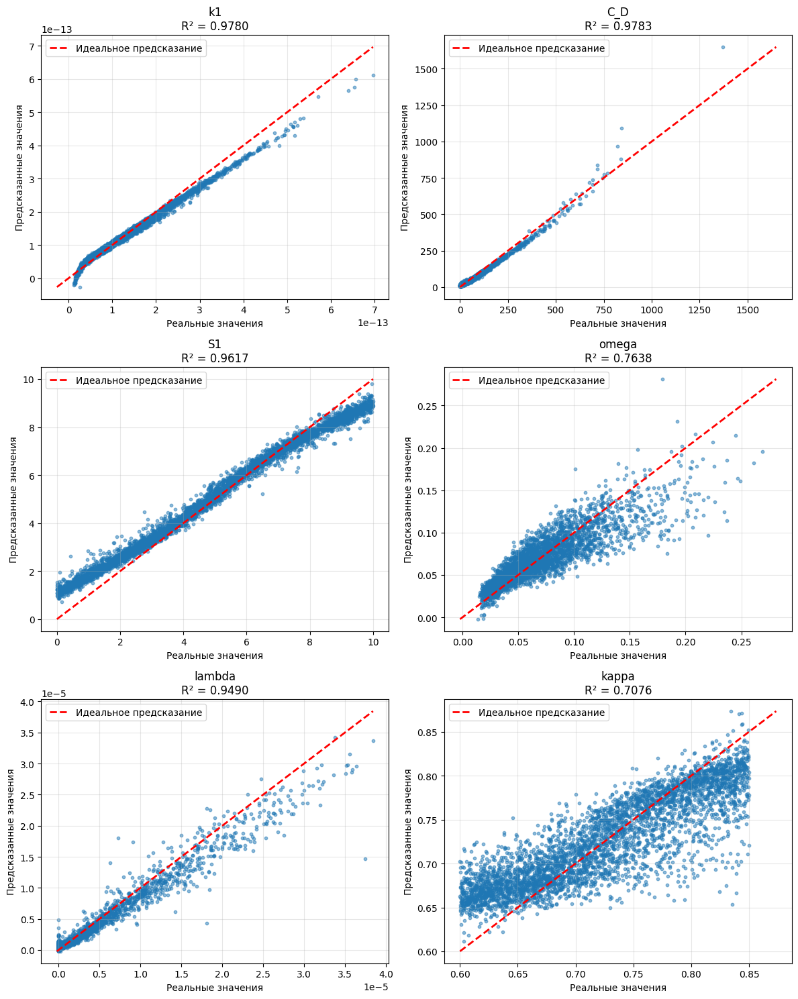

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


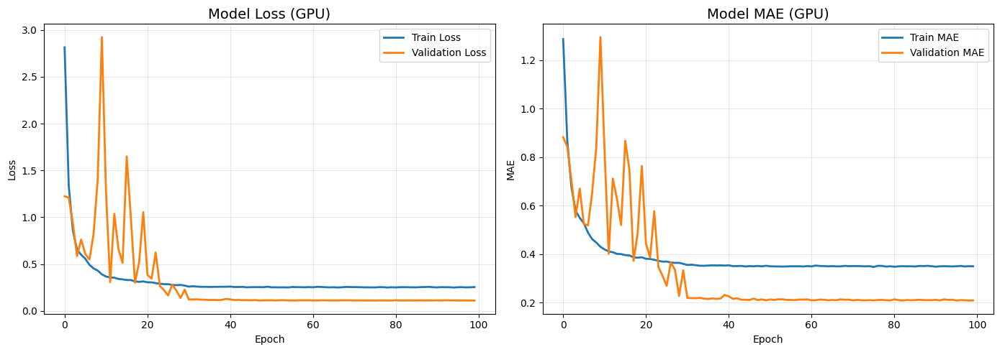

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_permeability_inf', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_permeability_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_permeability_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение двойная проницаемость бесконечный пласт с разными train, val, test

In [ ]:
!unzip /content/drive/MyDrive/datasets/dual_permeability_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_permeability_inf/params/24.csv  
  inflating: dual_permeability_inf/params/46.csv  
  inflating: dual_permeability_inf/params/48.csv  
  inflating: dual_permeability_inf/params/85.csv  
  inflating: dual_permeability_inf/params/168.csv  
  inflating: dual_permeability_inf/params/183.csv  
  inflating: dual_permeability_inf/params/208.csv  
  inflating: dual_permeability_inf/params/209.csv  
  inflating: dual_permeability_inf/params/215.csv  
  inflating: dual_permeability_inf/params/226.csv  
  inflating: dual_permeability_inf/params/252.csv  
  inflating: dual_permeability_inf/params/268.csv  
  inflating: dual_permeability_inf/params/274.csv  
  inflating: dual_permeability_inf/params/283.csv  
  inflating: dual_permeability_inf/params/290.csv  
  inflating: dual_permeability_inf/params/311.csv  
  inflating: dual_permeability_inf/params/314.csv  
  inflating: dual_permeability_inf/params/319.csv  


In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_permeability_inf',
    model_type=Model.DUAL_PERMEABILITY_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k1': np.float64(9.26012503589256e-13), 'C_D': np.float64(991.1393695070454), 'S1': np.float64(6.125750210415935), 'omega': np.float64(0.0177643603104016), 'lambda': np.float64(1.2634888675133407e-06), 'kappa': np.float64(0.9497342135050884), 'data_type': 'test'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=6, input_shape=(128, 2), task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.2422 - mae: 1.4126 - mse: 3.2422
Epoch 1: val_loss improved from None to 0.93995, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 18s 38ms/step - loss: 2.6222 - mae: 1.2667 - mse: 2.6222 - val_loss: 0.9399 - val_mae: 0.8247 - val_mse: 0.9399 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 1.5558 - mae: 0.9873 - mse: 1.5558
Epoch 2: val_loss improved from 0.93995 to 0.92117, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 1.4028 - mae: 0.9422 - mse: 1.4028 - val_loss: 0.9212 - val_mae: 0.8245 - val_mse: 0.9212 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 1.0776 - mae: 0.8378 - mse: 1.0776
Epoch 3: val_loss improved from 0.92117 to 0.71394, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 1.0103 - mae: 0.8119 - mse: 1.0103 - val_loss: 0.7139 - val_mae: 0.6841 - val_mse: 0.7139 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.8528 - mae: 0.7465 - mse: 0.8528
Epoch 4: val_loss improved from 0.71394 to 0.65436, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.8187 - mae: 0.7292 - mse: 0.8187 - val_loss: 0.6544 - val_mae: 0.6583 - val_mse: 0.6544 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.7460 - mae: 0.6923 - mse: 0.7460
Epoch 5: val_loss improved from 0.65436 to 0.58269, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.7248 - mae: 0.6801 - mse: 0.7248 - val_loss: 0.5827 - val_mae: 0.6178 - val_mse: 0.5827 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.6550 - mae: 0.6417 - mse: 0.6550
Epoch 6: val_loss improved from 0.58269 to 0.51205, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.6312 - mae: 0.6271 - mse: 0.6312 - val_loss: 0.5120 - val_mae: 0.5438 - val_mse: 0.5120 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.5891 - mae: 0.6003 - mse: 0.5891
Epoch 7: val_loss did not improve from 0.51205
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.5828 - mae: 0.5964 - mse: 0.5828 - val_loss: 0.5387 - val_mae: 0.5476 - val_mse: 0.5387 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.5726 - mae: 0.5880 - mse: 0.5726
Epoch 8: val_loss did not improve from 0.51205
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.5623 - mae: 0.5827 - mse: 0.5623 - val_loss: 0.5567 - val_mae: 0.5715 - val_mse: 0.5567 - learning_rate:


Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.5426 - mae: 0.5706 - mse: 0.5426 - val_loss: 0.4939 - val_mae: 0.5354 - val_mse: 0.4939 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.5315 - mae: 0.5657 - mse: 0.5315
Epoch 11: val_loss did not improve from 0.49391
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.5265 - mae: 0.5618 - mse: 0.5265 - val_loss: 0.5553 - val_mae: 0.5810 - val_mse: 0.5553 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.5081 - mae: 0.5508 - mse: 0.5081
Epoch 12: val_loss improved from 0.49391 to 0.44521, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 11s 39ms/step - loss: 0.5039 - mae: 0.5481 - mse: 0.5039 - val_loss: 0.4452 - val_mae: 0.5177 - val_mse: 0.4452 - learning_rate: 5.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 13/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4734 - mae: 0.5327 - mse: 0.4734
Epoch 13: val_loss did not improve from 0.44521
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4674 - mae: 0.5285 - mse: 0.4674 - val_loss: 0.6276 - val_mae: 0.6423 - val_mse: 0.6276 - learning_rate: 5.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 14/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4348 - mae: 0.5093 - mse: 0.4348
Epoch 14: val_loss improved from 0.44521 to 0.40399, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.4230 - mae: 0.5017 - mse: 0.4230 - val_loss: 0.4040 - val_mae: 0.4825 - val_mse: 0.4040 - learning_rate: 5.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 15/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.4094 - mae: 0.4937 - mse: 0.4094
Epoch 15: val_loss improved from 0.40399 to 0.31257, saving model to best_model_regression.h5



Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.4032 - mae: 0.4895 - mse: 0.4032 - val_loss: 0.3126 - val_mae: 0.4167 - val_mse: 0.3126 - learning_rate: 5.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3925 - mae: 0.4810 - mse: 0.3925
Epoch 16: val_loss did not improve from 0.31257
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.3908 - mae: 0.4806 - mse: 0.3908 - val_loss: 0.3694 - val_mae: 0.4532 - val_mse: 0.3694 - learning_rate: 5.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 17/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3788 - mae: 0.4725 - mse: 0.3788
Epoch 17: val_loss did not improve from 0.31257
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3773 - mae: 0.4715 - mse: 0.3773 - val_loss: 0.3172 - val_mae: 0.4011 - val_mse: 0.3172 - learnin


Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3709 - mae: 0.4680 - mse: 0.3709 - val_loss: 0.2634 - val_mae: 0.3673 - val_mse: 0.2634 - learning_rate: 5.0000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 19/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3656 - mae: 0.4658 - mse: 0.3656
Epoch 19: val_loss did not improve from 0.26343
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.3627 - mae: 0.4627 - mse: 0.3627 - val_loss: 0.2749 - val_mae: 0.3923 - val_mse: 0.2749 - learning_rate: 5.0000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 20/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3566 - mae: 0.4594 - mse: 0.3566
Epoch 20: val_loss improved from 0.26343 to 0.24580, saving model to best_model_regression.h5



Epoch 20: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3535 - mae: 0.4569 - mse: 0.3535 - val_loss: 0.2458 - val_mae: 0.3550 - val_mse: 0.2458 - learning_rate: 5.0000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 21/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3463 - mae: 0.4537 - mse: 0.3463
Epoch 21: val_loss improved from 0.24580 to 0.23720, saving model to best_model_regression.h5



Epoch 21: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.3463 - mae: 0.4531 - mse: 0.3463 - val_loss: 0.2372 - val_mae: 0.3725 - val_mse: 0.2372 - learning_rate: 5.0000e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 22/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.3384 - mae: 0.4488 - mse: 0.3384
Epoch 22: val_loss improved from 0.23720 to 0.19519, saving model to best_model_regression.h5



Epoch 22: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.3310 - mae: 0.4438 - mse: 0.3310 - val_loss: 0.1952 - val_mae: 0.3298 - val_mse: 0.1952 - learning_rate: 5.0000e-04

Epoch 23: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 23/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3246 - mae: 0.4407 - mse: 0.3246
Epoch 23: val_loss did not improve from 0.19519
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.3254 - mae: 0.4403 - mse: 0.3254 - val_loss: 0.2523 - val_mae: 0.3759 - val_mse: 0.2523 - learning_rate: 5.0000e-04

Epoch 24: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 24/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3124 - mae: 0.4322 - mse: 0.3124
Epoch 24: val_loss did not improve from 0.19519
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3105 - mae: 0.4312 - mse: 0.3105 - val_loss: 0.2375 - val_mae: 0.3733 - val_mse: 0.2375 - learnin


Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.3044 - mae: 0.4275 - mse: 0.3044 - val_loss: 0.1620 - val_mae: 0.2927 - val_mse: 0.1620 - learning_rate: 5.0000e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 26/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2991 - mae: 0.4236 - mse: 0.2991
Epoch 26: val_loss did not improve from 0.16199
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2970 - mae: 0.4222 - mse: 0.2970 - val_loss: 0.1975 - val_mae: 0.3204 - val_mse: 0.1975 - learning_rate: 5.0000e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 27/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2862 - mae: 0.4134 - mse: 0.2862
Epoch 27: val_loss did not improve from 0.16199
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.2878 - mae: 0.4152 - mse: 0.2878 - val_loss: 0.1944 - val_mae: 0.3104 - val_mse: 0.1944 - learnin


Epoch 29: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2825 - mae: 0.4119 - mse: 0.2825 - val_loss: 0.1608 - val_mae: 0.2914 - val_mse: 0.1608 - learning_rate: 5.0000e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 30/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2793 - mae: 0.4099 - mse: 0.2793
Epoch 30: val_loss did not improve from 0.16083
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2761 - mae: 0.4077 - mse: 0.2761 - val_loss: 0.2797 - val_mae: 0.3902 - val_mse: 0.2797 - learning_rate: 5.0000e-04

Epoch 31: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 31/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2576 - mae: 0.3934 - mse: 0.2576
Epoch 31: val_loss improved from 0.16083 to 0.10761, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2493 - mae: 0.3883 - mse: 0.2493 - val_loss: 0.1076 - val_mae: 0.2390 - val_mse: 0.1076 - learning_rate: 5.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 32/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2403 - mae: 0.3833 - mse: 0.2403
Epoch 32: val_loss did not improve from 0.10761
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2413 - mae: 0.3837 - mse: 0.2413 - val_loss: 0.1134 - val_mae: 0.2405 - val_mse: 0.1134 - learning_rate: 5.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2385 - mae: 0.3811 - mse: 0.2385
Epoch 33: val_loss did not improve from 0.10761
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.2381 - mae: 0.3804 - mse: 0.2381 - val_loss: 0.1111 - val_mae: 0.2442 - val_mse: 0.1111 - learn


Epoch 35: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2388 - mae: 0.3809 - mse: 0.2388 - val_loss: 0.1046 - val_mae: 0.2324 - val_mse: 0.1046 - learning_rate: 5.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 36/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2346 - mae: 0.3777 - mse: 0.2346
Epoch 36: val_loss did not improve from 0.10457
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2375 - mae: 0.3798 - mse: 0.2375 - val_loss: 0.1096 - val_mae: 0.2359 - val_mse: 0.1096 - learning_rate: 5.0000e-05

Epoch 37: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 37/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2414 - mae: 0.3825 - mse: 0.2414
Epoch 37: val_loss did not improve from 0.10457
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2371 - mae: 0.3799 - mse: 0.2371 - val_loss: 0.1143 - val_mae: 0.2443 - val_mse: 0.1143 - learn


Epoch 38: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2337 - mae: 0.3771 - mse: 0.2337 - val_loss: 0.0987 - val_mae: 0.2230 - val_mse: 0.0987 - learning_rate: 5.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 39/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2307 - mae: 0.3747 - mse: 0.2307
Epoch 39: val_loss did not improve from 0.09872
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2333 - mae: 0.3767 - mse: 0.2333 - val_loss: 0.1085 - val_mae: 0.2400 - val_mse: 0.1085 - learning_rate: 5.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 40/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2303 - mae: 0.3744 - mse: 0.2303
Epoch 40: val_loss did not improve from 0.09872
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.2325 - mae: 0.3760 - mse: 0.2325 - val_loss: 0.1001 - val_mae: 0.2182 - val_mse: 0.1001 - learn


Epoch 44: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2276 - mae: 0.3729 - mse: 0.2276 - val_loss: 0.0945 - val_mae: 0.2205 - val_mse: 0.0945 - learning_rate: 2.5000e-05

Epoch 45: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 45/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2300 - mae: 0.3735 - mse: 0.2300
Epoch 45: val_loss did not improve from 0.09452
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.2292 - mae: 0.3733 - mse: 0.2292 - val_loss: 0.0964 - val_mae: 0.2200 - val_mse: 0.0964 - learning_rate: 2.5000e-05

Epoch 46: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 46/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2298 - mae: 0.3736 - mse: 0.2298
Epoch 46: val_loss did not improve from 0.09452
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2292 - mae: 0.3738 - mse: 0.2292 - val_loss: 0.1163 - val_mae: 0.2423 - val_mse: 0.1163 - learn


Epoch 48: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2267 - mae: 0.3719 - mse: 0.2267 - val_loss: 0.0935 - val_mae: 0.2232 - val_mse: 0.0935 - learning_rate: 2.5000e-05

Epoch 49: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 49/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2270 - mae: 0.3731 - mse: 0.2270
Epoch 49: val_loss improved from 0.09347 to 0.09226, saving model to best_model_regression.h5



Epoch 49: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2266 - mae: 0.3721 - mse: 0.2266 - val_loss: 0.0923 - val_mae: 0.2189 - val_mse: 0.0923 - learning_rate: 2.5000e-05

Epoch 50: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 50/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2259 - mae: 0.3720 - mse: 0.2259
Epoch 50: val_loss improved from 0.09226 to 0.09089, saving model to best_model_regression.h5



Epoch 50: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2265 - mae: 0.3729 - mse: 0.2265 - val_loss: 0.0909 - val_mae: 0.2170 - val_mse: 0.0909 - learning_rate: 2.5000e-05

Epoch 51: LearningRateScheduler setting learning rate to 2.5000001187436284e-06.
Epoch 51/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2257 - mae: 0.3708 - mse: 0.2257
Epoch 51: val_loss did not improve from 0.09089
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2259 - mae: 0.3713 - mse: 0.2259 - val_loss: 0.0912 - val_mae: 0.2149 - val_mse: 0.0912 - learning_rate: 2.5000e-06

Epoch 52: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 52/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2260 - mae: 0.3717 - mse: 0.2260
Epoch 52: val_loss improved from 0.09089 to 0.08841, saving model to best_model_regression.h5



Epoch 52: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2249 - mae: 0.3712 - mse: 0.2249 - val_loss: 0.0884 - val_mae: 0.2126 - val_mse: 0.0884 - learning_rate: 2.5000e-06

Epoch 53: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 53/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2221 - mae: 0.3684 - mse: 0.2221
Epoch 53: val_loss did not improve from 0.08841
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2250 - mae: 0.3706 - mse: 0.2250 - val_loss: 0.0899 - val_mae: 0.2136 - val_mse: 0.0899 - learning_rate: 2.5000e-06

Epoch 54: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 54/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2252 - mae: 0.3706 - mse: 0.2252
Epoch 54: val_loss improved from 0.08841 to 0.08832, saving model to best_model_regression.h5



Epoch 54: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.2238 - mae: 0.3697 - mse: 0.2238 - val_loss: 0.0883 - val_mae: 0.2117 - val_mse: 0.0883 - learning_rate: 2.5000e-06

Epoch 55: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 55/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2199 - mae: 0.3668 - mse: 0.2199
Epoch 55: val_loss did not improve from 0.08832
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2200 - mae: 0.3662 - mse: 0.2200 - val_loss: 0.0924 - val_mae: 0.2156 - val_mse: 0.0924 - learning_rate: 2.5000e-06

Epoch 56: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 56/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2240 - mae: 0.3705 - mse: 0.2240
Epoch 56: val_loss did not improve from 0.08832
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2239 - mae: 0.3696 - mse: 0.2239 - val_loss: 0.0899 - val_mae: 0.2140 - val_mse: 0.0899 - learn


Epoch 59: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2234 - mae: 0.3693 - mse: 0.2234 - val_loss: 0.0872 - val_mae: 0.2107 - val_mse: 0.0872 - learning_rate: 1.2500e-06

Epoch 60: LearningRateScheduler setting learning rate to 1.2500000821091817e-06.
Epoch 60/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2200 - mae: 0.3666 - mse: 0.2200
Epoch 60: val_loss did not improve from 0.08725
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2217 - mae: 0.3682 - mse: 0.2217 - val_loss: 0.0878 - val_mae: 0.2120 - val_mse: 0.0878 - learning_rate: 1.2500e-06

Epoch 61: LearningRateScheduler setting learning rate to 1.2500000821091817e-06.
Epoch 61/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2198 - mae: 0.3666 - mse: 0.2198
Epoch 61: val_loss did not improve from 0.08725
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2232 - mae: 0.3701 - mse: 0.2232 - val_loss: 0.0885 - val_mae: 0.2124 - val_mse: 0.0885 - learn


Epoch 65: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2222 - mae: 0.3680 - mse: 0.2222 - val_loss: 0.0866 - val_mae: 0.2096 - val_mse: 0.0866 - learning_rate: 1.0000e-06

Epoch 66: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 66/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2221 - mae: 0.3683 - mse: 0.2221
Epoch 66: val_loss did not improve from 0.08662
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2226 - mae: 0.3693 - mse: 0.2226 - val_loss: 0.0882 - val_mae: 0.2114 - val_mse: 0.0882 - learning_rate: 1.0000e-06

Epoch 67: LearningRateScheduler setting learning rate to 9.999999974752427e-07.
Epoch 67/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2207 - mae: 0.3672 - mse: 0.2207
Epoch 67: val_loss did not improve from 0.08662
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2220 - mae: 0.3681 - mse: 0.2220 - val_loss: 0.0872 - val_mae: 0.2116 - val_mse: 0.0872 - learnin


Epoch 70: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2238 - mae: 0.3694 - mse: 0.2238 - val_loss: 0.0866 - val_mae: 0.2096 - val_mse: 0.0866 - learning_rate: 1.0000e-06

Epoch 71: LearningRateScheduler setting learning rate to 9.999999974752428e-08.
Epoch 71/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2244 - mae: 0.3703 - mse: 0.2244
Epoch 71: val_loss did not improve from 0.08656
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2232 - mae: 0.3693 - mse: 0.2232 - val_loss: 0.0866 - val_mae: 0.2093 - val_mse: 0.0866 - learning_rate: 1.0000e-07

Epoch 72: LearningRateScheduler setting learning rate to 1.0000000116860974e-07.
Epoch 72/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2238 - mae: 0.3699 - mse: 0.2238
Epoch 72: val_loss did not improve from 0.08656
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2233 - mae: 0.3692 - mse: 0.2233 - val_loss: 0.0871 - val_mae: 0.2107 - val_mse: 0.0871 - learni

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0606
  mae: 0.1866
  mse: 0.0606

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  2.5876e-27
    MAE:  3.6919e-14
    R²:   0.9616

  C_D:
    MSE:  2.3458e+03
    MAE:  3.5319e+01
    R²:   0.9558

  S1:
    MSE:  3.3077e-01
    MAE:  4.4383e-01
    R²:   0.9382

  omega:
    MSE:  8.0377e-04
    MAE:  2.1290e-02
    R²:   0.7337

  lambda:
    MSE:  3.2884e-12
    MAE:  1.3396e-06
    R²:   0.5766

  kappa:
    MSE:  3.3009e-03
    MAE:  4.6964e-02
    R²:   0.5343


Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: 9.970937785283226e-14 9.259866094388225e-13
Results: 1.0011720680526148e-13 9.999841537892105e-13


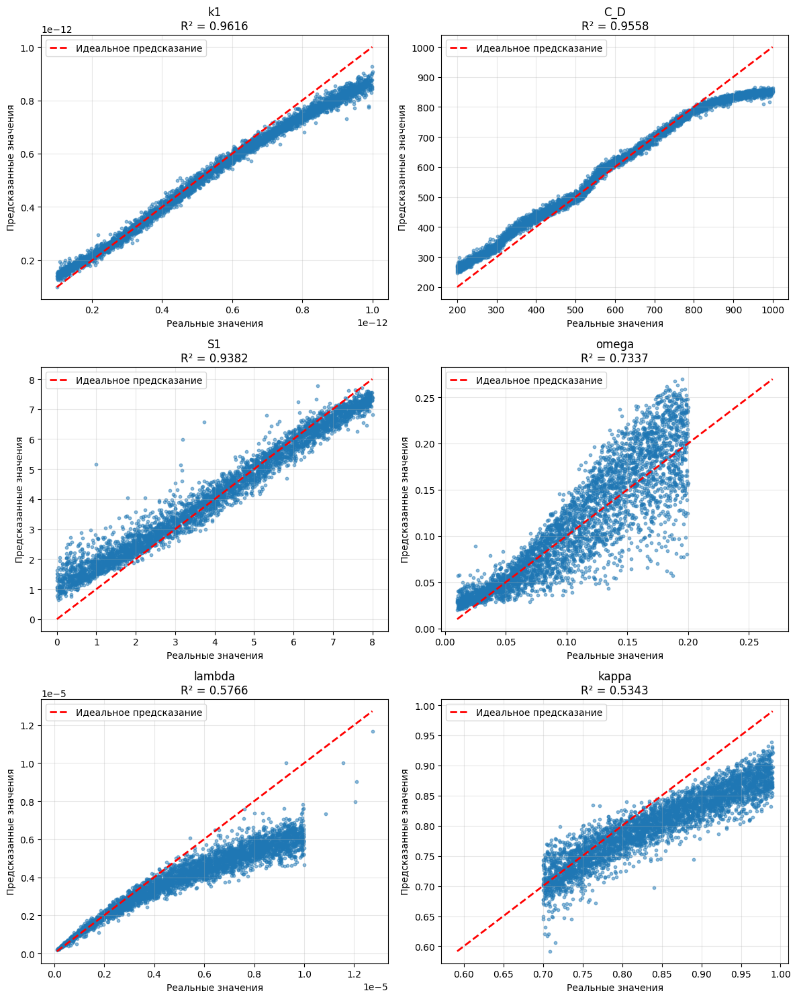

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


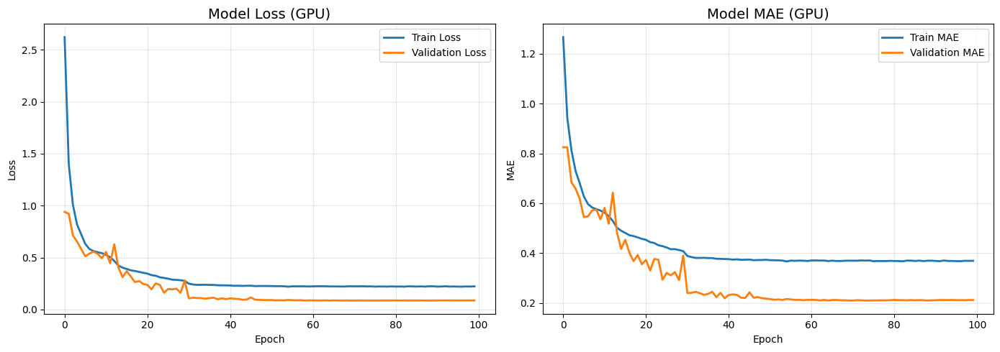

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_permeability_inf', format='all')

✅ Веса модели сохранены: lstm_model_regression_dual_permeability_inf.weights.h5
✅ Модель сохранена в Keras format: lstm_model_regression_dual_permeability_inf.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_model_regression_dual_permeability_inf_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_permeability_inf',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_permeability_inf_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to lstm_model_regression_dual_permeability_inf_scaler_config.json


# Обучение для модели двойной проницаемости для кругового пласта



In [ ]:
!unzip /content/drive/MyDrive/dual_permeability_fin.zip

Archive:  /content/drive/MyDrive/dual_permeability_fin.zip
replace dual_permeability_fin/curve/dual_permeability_fin_4.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/dual_permeability_fin',
    model_type=Model.DUAL_PERMEABILITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 7).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 7).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 7).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

8.656059032131743e-15 7.74913787719907e-13
0.08656059032131742 7.74913787719907
8.656059032131743e-15 7.74913787719907e-13
0.08656059032131742 7.74913787719907
Transformed data:  0.08656059032131742 7.74913787719907 1.2544525074920394
1.3425149544135911e-14 7.650135287029537e-13
0.13425149544135911 7.650135287029537
Transformed data:  0.13425149544135911 7.650135287029537 1.2566707099423489
1.1034430066075862e-14 8.206501771592047e-13
0.11034430066075862 8.206501771592047
Transformed data:  0.11034430066075862 8.206501771592047 1.2897428873818304


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=7, task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (17500, 128, 2), y (17500, 7)
Валидационные данные: X (2500, 128, 2), y (2500, 7)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 3.2014 - mae: 1.3673 - mse: 3.2014
Epoch 1: val_loss improved from None to 1.12176, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 19s 38ms/step - loss: 2.4584 - mae: 1.1873 - mse: 2.4584 - val_loss: 1.1218 - val_mae: 0.8064 - val_mse: 1.1218 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.2463 - mae: 0.8377 - mse: 1.2463
Epoch 2: val_loss did not improve from 1.12176
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 1.0929 - mae: 0.7806 - mse: 1.0929 - val_loss: 1.8905 - val_mae: 1.0288 - val_mse: 1.8905 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.7809 - mae: 0.6523 - mse: 0.7809
Epoch 3: val_loss did not improve from 1.12176
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.7347 - mae: 0.6291 - mse: 0.7347 - val_loss: 1.2258 - val_mae: 0.8986 - val_mse: 1.2258 - learning_rat


Epoch 4: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.5898 - mae: 0.5560 - mse: 0.5898 - val_loss: 0.5778 - val_mae: 0.5431 - val_mse: 0.5778 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.5278 - mae: 0.5206 - mse: 0.5278
Epoch 5: val_loss did not improve from 0.57783
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.5035 - mae: 0.5045 - mse: 0.5035 - val_loss: 0.8063 - val_mae: 0.6565 - val_mse: 0.8063 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4689 - mae: 0.4789 - mse: 0.4689
Epoch 6: val_loss did not improve from 0.57783
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.4594 - mae: 0.4751 - mse: 0.4594 - val_loss: 0.9167 - val_mae: 0.6810 - val_mse: 0.9167 - learning_rat


Epoch 8: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.4402 - mae: 0.4612 - mse: 0.4402 - val_loss: 0.4408 - val_mae: 0.4466 - val_mse: 0.4408 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4330 - mae: 0.4577 - mse: 0.4330
Epoch 9: val_loss did not improve from 0.44085
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.4338 - mae: 0.4567 - mse: 0.4338 - val_loss: 0.6319 - val_mae: 0.6265 - val_mse: 0.6319 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4279 - mae: 0.4528 - mse: 0.4279
Epoch 10: val_loss did not improve from 0.44085
274/274 ━━━━━━━━━━━━━━━━━━━━ 11s 35ms/step - loss: 0.4279 - mae: 0.4527 - mse: 0.4279 - val_loss: 0.4617 - val_mae: 0.4982 - val_mse: 0.4617 - learning_


Epoch 15: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.4105 - mae: 0.4419 - mse: 0.4105 - val_loss: 0.3336 - val_mae: 0.3905 - val_mse: 0.3336 - learning_rate: 2.5000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 16/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4132 - mae: 0.4432 - mse: 0.4132
Epoch 16: val_loss did not improve from 0.33364
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.4083 - mae: 0.4416 - mse: 0.4083 - val_loss: 0.3879 - val_mae: 0.4238 - val_mse: 0.3879 - learning_rate: 2.5000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 17/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4026 - mae: 0.4366 - mse: 0.4026
Epoch 17: val_loss did not improve from 0.33364
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.4036 - mae: 0.4379 - mse: 0.4036 - val_loss: 0.3978 - val_mae: 0.4199 - val_mse: 0.3978 - learn


Epoch 21: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.3325 - mae: 0.4086 - mse: 0.3325 - val_loss: 0.2664 - val_mae: 0.3592 - val_mse: 0.2664 - learning_rate: 1.2500e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 22/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3313 - mae: 0.4060 - mse: 0.3313
Epoch 22: val_loss did not improve from 0.26636
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.3271 - mae: 0.4051 - mse: 0.3271 - val_loss: 0.3109 - val_mae: 0.3978 - val_mse: 0.3109 - learning_rate: 1.2500e-04

Epoch 23: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 23/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3286 - mae: 0.4059 - mse: 0.3286
Epoch 23: val_loss improved from 0.26636 to 0.22336, saving model to best_model_regression.h5



Epoch 23: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.3257 - mae: 0.4038 - mse: 0.3257 - val_loss: 0.2234 - val_mae: 0.3216 - val_mse: 0.2234 - learning_rate: 1.2500e-04

Epoch 24: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 24/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3229 - mae: 0.4026 - mse: 0.3229
Epoch 24: val_loss did not improve from 0.22336
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3201 - mae: 0.4007 - mse: 0.3201 - val_loss: 0.2623 - val_mae: 0.3305 - val_mse: 0.2623 - learning_rate: 1.2500e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 25/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.3148 - mae: 0.3997 - mse: 0.3148
Epoch 25: val_loss improved from 0.22336 to 0.21344, saving model to best_model_regression.h5



Epoch 25: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.3172 - mae: 0.3993 - mse: 0.3172 - val_loss: 0.2134 - val_mae: 0.2984 - val_mse: 0.2134 - learning_rate: 1.2500e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 26/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3126 - mae: 0.3968 - mse: 0.3126
Epoch 26: val_loss did not improve from 0.21344
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 32ms/step - loss: 0.3135 - mae: 0.3969 - mse: 0.3135 - val_loss: 0.5344 - val_mae: 0.5540 - val_mse: 0.5344 - learning_rate: 1.2500e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0001250000059371814.
Epoch 27/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3064 - mae: 0.3940 - mse: 0.3064
Epoch 27: val_loss did not improve from 0.21344
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3121 - mae: 0.3954 - mse: 0.3121 - val_loss: 0.4081 - val_mae: 0.4621 - val_mse: 0.4081 - learn


Epoch 31: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3025 - mae: 0.3902 - mse: 0.3025 - val_loss: 0.1661 - val_mae: 0.2592 - val_mse: 0.1661 - learning_rate: 6.2500e-06

Epoch 32: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 32/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3055 - mae: 0.3923 - mse: 0.3055
Epoch 32: val_loss did not improve from 0.16615
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 34ms/step - loss: 0.3035 - mae: 0.3908 - mse: 0.3035 - val_loss: 0.1662 - val_mae: 0.2617 - val_mse: 0.1662 - learning_rate: 6.2500e-06

Epoch 33: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 33/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2972 - mae: 0.3881 - mse: 0.2972
Epoch 33: val_loss improved from 0.16615 to 0.16275, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.3013 - mae: 0.3905 - mse: 0.3013 - val_loss: 0.1627 - val_mae: 0.2572 - val_mse: 0.1627 - learning_rate: 6.2500e-06

Epoch 34: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 34/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3039 - mae: 0.3900 - mse: 0.3039
Epoch 34: val_loss did not improve from 0.16275
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3015 - mae: 0.3893 - mse: 0.3015 - val_loss: 0.1653 - val_mae: 0.2587 - val_mse: 0.1653 - learning_rate: 6.2500e-06

Epoch 35: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 35/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2983 - mae: 0.3898 - mse: 0.2983
Epoch 35: val_loss did not improve from 0.16275
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.2966 - mae: 0.3885 - mse: 0.2966 - val_loss: 0.1638 - val_mae: 0.2601 - val_mse: 0.1638 - lear


Epoch 36: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.2992 - mae: 0.3890 - mse: 0.2992 - val_loss: 0.1627 - val_mae: 0.2574 - val_mse: 0.1627 - learning_rate: 6.2500e-06

Epoch 37: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 37/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3010 - mae: 0.3905 - mse: 0.3010
Epoch 37: val_loss improved from 0.16266 to 0.16107, saving model to best_model_regression.h5



Epoch 37: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2994 - mae: 0.3893 - mse: 0.2994 - val_loss: 0.1611 - val_mae: 0.2550 - val_mse: 0.1611 - learning_rate: 6.2500e-06

Epoch 38: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 38/100
274/274 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.3014 - mae: 0.3893 - mse: 0.3014
Epoch 38: val_loss improved from 0.16107 to 0.15897, saving model to best_model_regression.h5



Epoch 38: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3018 - mae: 0.3894 - mse: 0.3018 - val_loss: 0.1590 - val_mae: 0.2532 - val_mse: 0.1590 - learning_rate: 6.2500e-06

Epoch 39: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 39/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3005 - mae: 0.3898 - mse: 0.3005
Epoch 39: val_loss did not improve from 0.15897
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.3009 - mae: 0.3893 - mse: 0.3009 - val_loss: 0.1613 - val_mae: 0.2551 - val_mse: 0.1613 - learning_rate: 6.2500e-06

Epoch 40: LearningRateScheduler setting learning rate to 6.250000296859071e-06.
Epoch 40/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3011 - mae: 0.3902 - mse: 0.3011
Epoch 40: val_loss did not improve from 0.15897
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3011 - mae: 0.3899 - mse: 0.3011 - val_loss: 0.1623 - val_mae: 0.2555 - val_mse: 0.1623 - learn


Epoch 51: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 37ms/step - loss: 0.2996 - mae: 0.3884 - mse: 0.2996 - val_loss: 0.1589 - val_mae: 0.2527 - val_mse: 0.1589 - learning_rate: 1.5625e-07

Epoch 52: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 52/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2970 - mae: 0.3888 - mse: 0.2970
Epoch 52: val_loss did not improve from 0.15889
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.2990 - mae: 0.3895 - mse: 0.2990 - val_loss: 0.1590 - val_mae: 0.2525 - val_mse: 0.1590 - learning_rate: 1.5625e-07

Epoch 53: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 53/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3022 - mae: 0.3886 - mse: 0.3022
Epoch 53: val_loss did not improve from 0.15889
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.2983 - mae: 0.3876 - mse: 0.2983 - val_loss: 0.1604 - val_mae: 0.2545 - val_mse: 0.1604 - learn


Epoch 54: finished saving model to best_model_regression.h5
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 36ms/step - loss: 0.3005 - mae: 0.3893 - mse: 0.3005 - val_loss: 0.1578 - val_mae: 0.2506 - val_mse: 0.1578 - learning_rate: 1.5625e-07

Epoch 55: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 55/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3007 - mae: 0.3888 - mse: 0.3007
Epoch 55: val_loss did not improve from 0.15775
274/274 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.2982 - mae: 0.3881 - mse: 0.2982 - val_loss: 0.1599 - val_mae: 0.2537 - val_mse: 0.1599 - learning_rate: 1.5625e-07

Epoch 56: LearningRateScheduler setting learning rate to 1.562500102636477e-07.
Epoch 56/100
273/274 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2976 - mae: 0.3892 - mse: 0.2976
Epoch 56: val_loss did not improve from 0.15775
274/274 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.2989 - mae: 0.3891 - mse: 0.2989 - val_loss: 0.1587 - val_mae: 0.2519 - val_mse: 0.1587 - learn

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.1647
  mae: 0.2562
  mse: 0.1647
-1.2960673302427559 7.875412374143512
0.11034430066075873 8.206501771592047
-1.8756661 5.03199
-0.40129873 5.6964602

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  1.8508e-28
    MAE:  9.3204e-15
    R²:   0.9779

  C_D:
    MSE:  2.0342e+02
    MAE:  9.9454e+00
    R²:   0.9755

  S1:
    MSE:  3.2968e-01
    MAE:  4.6279e-01
    R²:   0.9597

  omega:
    MSE:  4.2053e-04
    MAE:  1.5022e-02
    R²:   0.7126

  lambda:
    MSE:  2.8352e-12
    MAE:  8.7062e-07
    R²:   0.9183

  kappa:
    MSE:  3.1524e-03
    MAE:  4.6723e-02
    R²:   0.3917

  r_D_e:
    MSE:  6.4667e+05
    MAE:  6.2387e+02
    R²:   0.9127
-1.2960673302427559 7.875412374143512
0.11034430066075873 8.206501771592047
-1.8756661 5.03199
-0.40129873 5.6964602


-1.2960673302427559 7.875412374143512
0.11034430066075873 8.206501771592047
-1.8756661 5.03199
-0.40129873 5.6964602
Количество выходов: 7
Форма y_test_orig: (5000, 7)
Results: -4.012987316580341e-14 5.696460555863758e-13
Results: 1.1034430066075873e-14 8.206501771592047e-13


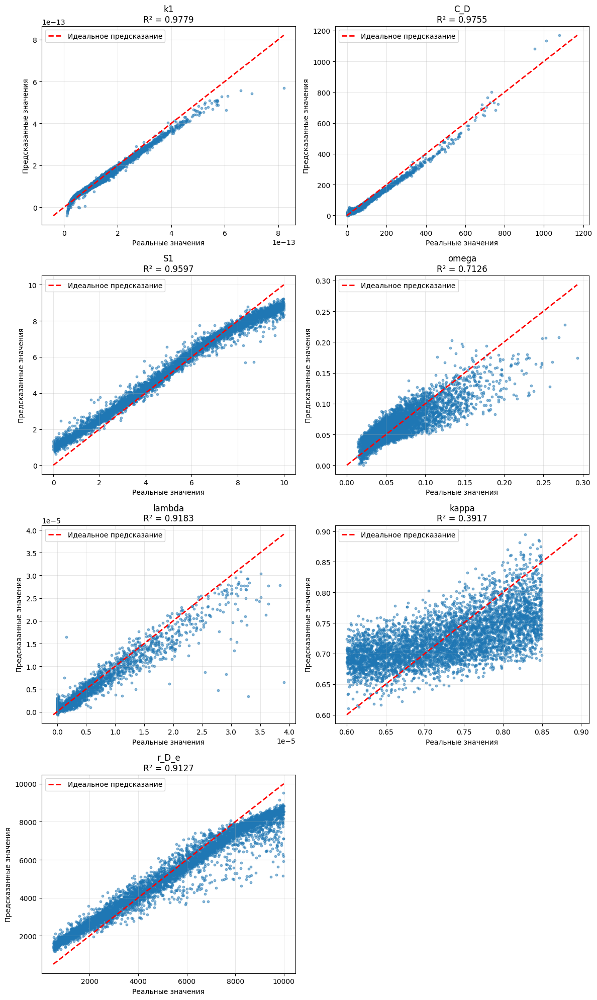

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


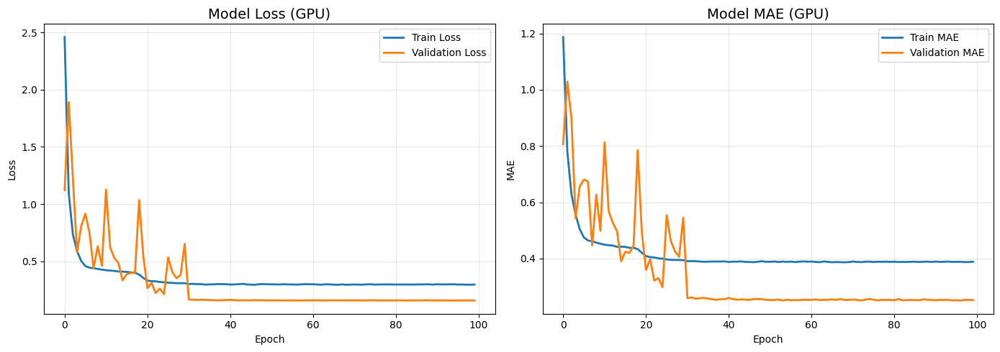

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_permeability_fin', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_permeability_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_permeability_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение двойная проницаемость круговой пласт с разными train, val, test

In [ ]:
!unzip /content/drive/MyDrive/datasets/dual_permeability_fin.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: dual_permeability_fin/params/24.csv  
  inflating: dual_permeability_fin/params/46.csv  
  inflating: dual_permeability_fin/params/48.csv  
  inflating: dual_permeability_fin/params/85.csv  
  inflating: dual_permeability_fin/params/168.csv  
  inflating: dual_permeability_fin/params/183.csv  
  inflating: dual_permeability_fin/params/208.csv  
  inflating: dual_permeability_fin/params/209.csv  
  inflating: dual_permeability_fin/params/215.csv  
  inflating: dual_permeability_fin/params/226.csv  
  inflating: dual_permeability_fin/params/252.csv  
  inflating: dual_permeability_fin/params/268.csv  
  inflating: dual_permeability_fin/params/274.csv  
  inflating: dual_permeability_fin/params/283.csv  
  inflating: dual_permeability_fin/params/290.csv  
  inflating: dual_permeability_fin/params/311.csv  
  inflating: dual_permeability_fin/params/314.csv  
  inflating: dual_permeability_fin/params/319.csv  


In [ ]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/dual_permeability_fin',
    model_type=Model.DUAL_PERMEABILITY_FIN
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k1': np.float64(6.495540017310044e-13), 'C_D': np.float64(538.6984356557033), 'S1': np.float64(7.879314543231102), 'omega': np.float64(0.1887791295964296), 'lambda': np.float64(8.69250806293198e-06), 'kappa': np.float64(0.7770972395142737), 'R_eD': np.float64(7082.991024411126), 'data_type': 'test'}


In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 7).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 7).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 7).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=7, input_shape=(128, 2), task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S1', 'omega', 'lambda', 'kappa', 'r_D_e']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 7)
Валидационные данные: X (2000, 128, 2), y (2000, 7)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 3.3960 - mae: 1.4421 - mse: 3.3960
Epoch 1: val_loss improved from None to 1.03248, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 17s 42ms/step - loss: 2.7133 - mae: 1.2863 - mse: 2.7133 - val_loss: 1.0325 - val_mae: 0.8383 - val_mse: 1.0325 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 1.5680 - mae: 0.9960 - mse: 1.5680
Epoch 2: val_loss did not improve from 1.03248
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 1.3831 - mae: 0.9358 - mse: 1.3831 - val_loss: 1.1068 - val_mae: 0.8599 - val_mse: 1.1068 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 1.0232 - mae: 0.8094 - mse: 1.0232
Epoch 3: val_loss improved from 1.03248 to 0.71569, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.9563 - mae: 0.7855 - mse: 0.9563 - val_loss: 0.7157 - val_mae: 0.6928 - val_mse: 0.7157 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.8345 - mae: 0.7358 - mse: 0.8345
Epoch 4: val_loss improved from 0.71569 to 0.63084, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.8063 - mae: 0.7247 - mse: 0.8063 - val_loss: 0.6308 - val_mae: 0.6301 - val_mse: 0.6308 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.7416 - mae: 0.6955 - mse: 0.7416
Epoch 5: val_loss improved from 0.63084 to 0.56094, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.7128 - mae: 0.6806 - mse: 0.7128 - val_loss: 0.5609 - val_mae: 0.5879 - val_mse: 0.5609 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.6678 - mae: 0.6529 - mse: 0.6678
Epoch 6: val_loss improved from 0.56094 to 0.55129, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.6628 - mae: 0.6498 - mse: 0.6628 - val_loss: 0.5513 - val_mae: 0.5832 - val_mse: 0.5513 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6436 - mae: 0.6392 - mse: 0.6436
Epoch 7: val_loss improved from 0.55129 to 0.54508, saving model to best_model_regression.h5



Epoch 7: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 39ms/step - loss: 0.6360 - mae: 0.6354 - mse: 0.6360 - val_loss: 0.5451 - val_mae: 0.5935 - val_mse: 0.5451 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5903 - mae: 0.6080 - mse: 0.5903
Epoch 8: val_loss improved from 0.54508 to 0.52930, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.5757 - mae: 0.5974 - mse: 0.5757 - val_loss: 0.5293 - val_mae: 0.5465 - val_mse: 0.5293 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.5541 - mae: 0.5810 - mse: 0.5541
Epoch 9: val_loss improved from 0.52930 to 0.45244, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.5511 - mae: 0.5794 - mse: 0.5511 - val_loss: 0.4524 - val_mae: 0.5110 - val_mse: 0.4524 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5407 - mae: 0.5712 - mse: 0.5407
Epoch 10: val_loss improved from 0.45244 to 0.43345, saving model to best_model_regression.h5



Epoch 10: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.5390 - mae: 0.5710 - mse: 0.5390 - val_loss: 0.4334 - val_mae: 0.4861 - val_mse: 0.4334 - learning_rate: 5.0000e-04

Epoch 11: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 11/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.5346 - mae: 0.5688 - mse: 0.5346
Epoch 11: val_loss did not improve from 0.43345
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.5313 - mae: 0.5669 - mse: 0.5313 - val_loss: 0.4453 - val_mae: 0.5084 - val_mse: 0.4453 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5267 - mae: 0.5647 - mse: 0.5267
Epoch 12: val_loss did not improve from 0.43345
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.5241 - mae: 0.5625 - mse: 0.5241 - val_loss: 0.4663 - val_mae: 0.5454 - val_mse: 0.4663 - learnin


Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4954 - mae: 0.5453 - mse: 0.4954 - val_loss: 0.3929 - val_mae: 0.4597 - val_mse: 0.3929 - learning_rate: 5.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 15/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4842 - mae: 0.5385 - mse: 0.4842
Epoch 15: val_loss did not improve from 0.39294
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.4765 - mae: 0.5346 - mse: 0.4765 - val_loss: 0.4479 - val_mae: 0.5164 - val_mse: 0.4479 - learning_rate: 5.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4619 - mae: 0.5260 - mse: 0.4619
Epoch 16: val_loss improved from 0.39294 to 0.36838, saving model to best_model_regression.h5



Epoch 16: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4567 - mae: 0.5237 - mse: 0.4567 - val_loss: 0.3684 - val_mae: 0.4670 - val_mse: 0.3684 - learning_rate: 5.0000e-04

Epoch 17: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 17/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4363 - mae: 0.5113 - mse: 0.4363
Epoch 17: val_loss improved from 0.36838 to 0.36516, saving model to best_model_regression.h5



Epoch 17: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4342 - mae: 0.5091 - mse: 0.4342 - val_loss: 0.3652 - val_mae: 0.4582 - val_mse: 0.3652 - learning_rate: 5.0000e-04

Epoch 18: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 18/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.4183 - mae: 0.4999 - mse: 0.4183
Epoch 18: val_loss improved from 0.36516 to 0.32093, saving model to best_model_regression.h5



Epoch 18: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.4185 - mae: 0.4998 - mse: 0.4185 - val_loss: 0.3209 - val_mae: 0.4417 - val_mse: 0.3209 - learning_rate: 5.0000e-04

Epoch 19: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 19/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4086 - mae: 0.4932 - mse: 0.4086
Epoch 19: val_loss improved from 0.32093 to 0.27436, saving model to best_model_regression.h5



Epoch 19: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.4081 - mae: 0.4934 - mse: 0.4081 - val_loss: 0.2744 - val_mae: 0.3930 - val_mse: 0.2744 - learning_rate: 5.0000e-04

Epoch 20: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 20/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4033 - mae: 0.4884 - mse: 0.4033
Epoch 20: val_loss did not improve from 0.27436
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4009 - mae: 0.4879 - mse: 0.4009 - val_loss: 0.2781 - val_mae: 0.3862 - val_mse: 0.2781 - learning_rate: 5.0000e-04

Epoch 21: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 21/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.3948 - mae: 0.4841 - mse: 0.3948
Epoch 21: val_loss did not improve from 0.27436
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3939 - mae: 0.4832 - mse: 0.3939 - val_loss: 0.2882 - val_mae: 0.4084 - val_mse: 0.2882 - learnin


Epoch 23: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.3822 - mae: 0.4768 - mse: 0.3822 - val_loss: 0.2498 - val_mae: 0.3612 - val_mse: 0.2498 - learning_rate: 5.0000e-04

Epoch 24: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 24/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3782 - mae: 0.4743 - mse: 0.3782
Epoch 24: val_loss did not improve from 0.24981
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.3796 - mae: 0.4749 - mse: 0.3796 - val_loss: 0.2653 - val_mae: 0.3752 - val_mse: 0.2653 - learning_rate: 5.0000e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 25/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.3671 - mae: 0.4673 - mse: 0.3671
Epoch 25: val_loss did not improve from 0.24981
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3688 - mae: 0.4685 - mse: 0.3688 - val_loss: 0.2937 - val_mae: 0.4117 - val_mse: 0.2937 - learnin


Epoch 26: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.3570 - mae: 0.4622 - mse: 0.3570 - val_loss: 0.2471 - val_mae: 0.3567 - val_mse: 0.2471 - learning_rate: 5.0000e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 27/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3534 - mae: 0.4598 - mse: 0.3534
Epoch 27: val_loss improved from 0.24712 to 0.21474, saving model to best_model_regression.h5



Epoch 27: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3523 - mae: 0.4589 - mse: 0.3523 - val_loss: 0.2147 - val_mae: 0.3410 - val_mse: 0.2147 - learning_rate: 5.0000e-04

Epoch 28: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 28/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3490 - mae: 0.4573 - mse: 0.3490
Epoch 28: val_loss did not improve from 0.21474
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3438 - mae: 0.4541 - mse: 0.3438 - val_loss: 0.2493 - val_mae: 0.3638 - val_mse: 0.2493 - learning_rate: 5.0000e-04

Epoch 29: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 29/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3403 - mae: 0.4523 - mse: 0.3403
Epoch 29: val_loss improved from 0.21474 to 0.18466, saving model to best_model_regression.h5



Epoch 29: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.3382 - mae: 0.4509 - mse: 0.3382 - val_loss: 0.1847 - val_mae: 0.3209 - val_mse: 0.1847 - learning_rate: 5.0000e-04

Epoch 30: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 30/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.3373 - mae: 0.4505 - mse: 0.3373
Epoch 30: val_loss did not improve from 0.18466
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.3338 - mae: 0.4478 - mse: 0.3338 - val_loss: 0.2259 - val_mae: 0.3405 - val_mse: 0.2259 - learning_rate: 5.0000e-04

Epoch 31: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 31/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3203 - mae: 0.4386 - mse: 0.3203
Epoch 31: val_loss improved from 0.18466 to 0.17026, saving model to best_model_regression.h5



Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.3122 - mae: 0.4337 - mse: 0.3122 - val_loss: 0.1703 - val_mae: 0.3005 - val_mse: 0.1703 - learning_rate: 5.0000e-05

Epoch 32: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 32/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3044 - mae: 0.4288 - mse: 0.3044
Epoch 32: val_loss did not improve from 0.17026
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.3038 - mae: 0.4286 - mse: 0.3038 - val_loss: 0.1968 - val_mae: 0.3144 - val_mse: 0.1968 - learning_rate: 5.0000e-05

Epoch 33: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.3014 - mae: 0.4263 - mse: 0.3014
Epoch 33: val_loss improved from 0.17026 to 0.16523, saving model to best_model_regression.h5



Epoch 33: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2996 - mae: 0.4254 - mse: 0.2996 - val_loss: 0.1652 - val_mae: 0.2881 - val_mse: 0.1652 - learning_rate: 5.0000e-05

Epoch 34: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 34/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2982 - mae: 0.4252 - mse: 0.2982
Epoch 34: val_loss improved from 0.16523 to 0.14301, saving model to best_model_regression.h5



Epoch 34: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2966 - mae: 0.4240 - mse: 0.2966 - val_loss: 0.1430 - val_mae: 0.2696 - val_mse: 0.1430 - learning_rate: 5.0000e-05

Epoch 35: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 35/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.2924 - mae: 0.4213 - mse: 0.2924
Epoch 35: val_loss did not improve from 0.14301
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2969 - mae: 0.4240 - mse: 0.2969 - val_loss: 0.1622 - val_mae: 0.2866 - val_mse: 0.1622 - learning_rate: 5.0000e-05

Epoch 36: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 36/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2970 - mae: 0.4237 - mse: 0.2970
Epoch 36: val_loss did not improve from 0.14301
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.2960 - mae: 0.4229 - mse: 0.2960 - val_loss: 0.1530 - val_mae: 0.2779 - val_mse: 0.1530 - learn


Epoch 37: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2939 - mae: 0.4214 - mse: 0.2939 - val_loss: 0.1400 - val_mae: 0.2659 - val_mse: 0.1400 - learning_rate: 5.0000e-05

Epoch 38: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 38/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2912 - mae: 0.4199 - mse: 0.2912
Epoch 38: val_loss did not improve from 0.13998
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2920 - mae: 0.4206 - mse: 0.2920 - val_loss: 0.1408 - val_mae: 0.2681 - val_mse: 0.1408 - learning_rate: 5.0000e-05

Epoch 39: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 39/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2907 - mae: 0.4191 - mse: 0.2907
Epoch 39: val_loss improved from 0.13998 to 0.13398, saving model to best_model_regression.h5



Epoch 39: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2912 - mae: 0.4194 - mse: 0.2912 - val_loss: 0.1340 - val_mae: 0.2613 - val_mse: 0.1340 - learning_rate: 5.0000e-05

Epoch 40: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 40/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2923 - mae: 0.4212 - mse: 0.2923
Epoch 40: val_loss did not improve from 0.13398
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2926 - mae: 0.4205 - mse: 0.2926 - val_loss: 0.1442 - val_mae: 0.2695 - val_mse: 0.1442 - learning_rate: 5.0000e-05

Epoch 41: LearningRateScheduler setting learning rate to 5.0000002374872565e-05.
Epoch 41/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2934 - mae: 0.4225 - mse: 0.2934
Epoch 41: val_loss did not improve from 0.13398
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2910 - mae: 0.4202 - mse: 0.2910 - val_loss: 0.1413 - val_mae: 0.2721 - val_mse: 0.1413 - learn


Epoch 46: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2853 - mae: 0.4158 - mse: 0.2853 - val_loss: 0.1303 - val_mae: 0.2583 - val_mse: 0.1303 - learning_rate: 2.5000e-05

Epoch 47: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 47/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2866 - mae: 0.4169 - mse: 0.2866
Epoch 47: val_loss did not improve from 0.13027
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2858 - mae: 0.4160 - mse: 0.2858 - val_loss: 0.1362 - val_mae: 0.2619 - val_mse: 0.1362 - learning_rate: 2.5000e-05

Epoch 48: LearningRateScheduler setting learning rate to 2.5000001187436283e-05.
Epoch 48/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2813 - mae: 0.4122 - mse: 0.2813
Epoch 48: val_loss did not improve from 0.13027
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2826 - mae: 0.4131 - mse: 0.2826 - val_loss: 0.1341 - val_mae: 0.2596 - val_mse: 0.1341 - learn


Epoch 50: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2837 - mae: 0.4156 - mse: 0.2837 - val_loss: 0.1295 - val_mae: 0.2590 - val_mse: 0.1295 - learning_rate: 2.5000e-05

Epoch 51: LearningRateScheduler setting learning rate to 2.5000001187436284e-06.
Epoch 51/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2772 - mae: 0.4099 - mse: 0.2772
Epoch 51: val_loss did not improve from 0.12954
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.2782 - mae: 0.4102 - mse: 0.2782 - val_loss: 0.1298 - val_mae: 0.2566 - val_mse: 0.1298 - learning_rate: 2.5000e-06

Epoch 52: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 52/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2847 - mae: 0.4151 - mse: 0.2847
Epoch 52: val_loss improved from 0.12954 to 0.12771, saving model to best_model_regression.h5



Epoch 52: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2839 - mae: 0.4145 - mse: 0.2839 - val_loss: 0.1277 - val_mae: 0.2543 - val_mse: 0.1277 - learning_rate: 2.5000e-06

Epoch 53: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 53/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2846 - mae: 0.4158 - mse: 0.2846
Epoch 53: val_loss did not improve from 0.12771
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2830 - mae: 0.4145 - mse: 0.2830 - val_loss: 0.1291 - val_mae: 0.2558 - val_mse: 0.1291 - learning_rate: 2.5000e-06

Epoch 54: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 54/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2796 - mae: 0.4119 - mse: 0.2796
Epoch 54: val_loss did not improve from 0.12771
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.2818 - mae: 0.4139 - mse: 0.2818 - val_loss: 0.1293 - val_mae: 0.2558 - val_mse: 0.1293 - learn


Epoch 57: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2792 - mae: 0.4118 - mse: 0.2792 - val_loss: 0.1272 - val_mae: 0.2533 - val_mse: 0.1272 - learning_rate: 2.5000e-06

Epoch 58: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 58/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2817 - mae: 0.4136 - mse: 0.2817
Epoch 58: val_loss did not improve from 0.12718
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 39ms/step - loss: 0.2816 - mae: 0.4136 - mse: 0.2816 - val_loss: 0.1277 - val_mae: 0.2541 - val_mse: 0.1277 - learning_rate: 2.5000e-06

Epoch 59: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 59/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.2781 - mae: 0.4094 - mse: 0.2781
Epoch 59: val_loss did not improve from 0.12718
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.2799 - mae: 0.4119 - mse: 0.2799 - val_loss: 0.1286 - val_mae: 0.2552 - val_mse: 0.1286 - learn


Epoch 61: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.2801 - mae: 0.4119 - mse: 0.2801 - val_loss: 0.1269 - val_mae: 0.2523 - val_mse: 0.1269 - learning_rate: 2.5000e-06

Epoch 62: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 62/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step - loss: 0.2831 - mae: 0.4142 - mse: 0.2831
Epoch 62: val_loss did not improve from 0.12687
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2820 - mae: 0.4131 - mse: 0.2820 - val_loss: 0.1275 - val_mae: 0.2537 - val_mse: 0.1275 - learning_rate: 2.5000e-06

Epoch 63: LearningRateScheduler setting learning rate to 2.5000001642183634e-06.
Epoch 63/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2818 - mae: 0.4126 - mse: 0.2818
Epoch 63: val_loss did not improve from 0.12687
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 40ms/step - loss: 0.2809 - mae: 0.4125 - mse: 0.2809 - val_loss: 0.1286 - val_mae: 0.2544 - val_mse: 0.1286 - lear


Epoch 69: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2781 - mae: 0.4115 - mse: 0.2781 - val_loss: 0.1267 - val_mae: 0.2528 - val_mse: 0.1267 - learning_rate: 1.2500e-06

Epoch 70: LearningRateScheduler setting learning rate to 1.2500000821091817e-06.
Epoch 70/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2779 - mae: 0.4119 - mse: 0.2779
Epoch 70: val_loss improved from 0.12669 to 0.12657, saving model to best_model_regression.h5



Epoch 70: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2787 - mae: 0.4119 - mse: 0.2787 - val_loss: 0.1266 - val_mae: 0.2525 - val_mse: 0.1266 - learning_rate: 1.2500e-06

Epoch 71: LearningRateScheduler setting learning rate to 1.2500000821091816e-07.
Epoch 71/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2794 - mae: 0.4126 - mse: 0.2794
Epoch 71: val_loss did not improve from 0.12657
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.2807 - mae: 0.4136 - mse: 0.2807 - val_loss: 0.1271 - val_mae: 0.2532 - val_mse: 0.1271 - learning_rate: 1.2500e-07

Epoch 72: LearningRateScheduler setting learning rate to 1.2500001389526005e-07.
Epoch 72/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2817 - mae: 0.4126 - mse: 0.2817
Epoch 72: val_loss did not improve from 0.12657
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2809 - mae: 0.4125 - mse: 0.2809 - val_loss: 0.1275 - val_mae: 0.2533 - val_mse: 0.1275 - learn


Epoch 73: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.2799 - mae: 0.4126 - mse: 0.2799 - val_loss: 0.1265 - val_mae: 0.2521 - val_mse: 0.1265 - learning_rate: 1.2500e-07

Epoch 74: LearningRateScheduler setting learning rate to 1.2500001389526005e-07.
Epoch 74/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step - loss: 0.2841 - mae: 0.4156 - mse: 0.2841
Epoch 74: val_loss improved from 0.12652 to 0.12652, saving model to best_model_regression.h5



Epoch 74: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 39ms/step - loss: 0.2823 - mae: 0.4142 - mse: 0.2823 - val_loss: 0.1265 - val_mae: 0.2520 - val_mse: 0.1265 - learning_rate: 1.2500e-07

Epoch 75: LearningRateScheduler setting learning rate to 1.2500001389526005e-07.
Epoch 75/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2814 - mae: 0.4128 - mse: 0.2814
Epoch 75: val_loss did not improve from 0.12652
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2810 - mae: 0.4130 - mse: 0.2810 - val_loss: 0.1281 - val_mae: 0.2544 - val_mse: 0.1281 - learning_rate: 1.2500e-07

Epoch 76: LearningRateScheduler setting learning rate to 1.2500001389526005e-07.
Epoch 76/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2815 - mae: 0.4136 - mse: 0.2815
Epoch 76: val_loss did not improve from 0.12652
219/219 ━━━━━━━━━━━━━━━━━━━━ 10s 35ms/step - loss: 0.2804 - mae: 0.4122 - mse: 0.2804 - val_loss: 0.1278 - val_mae: 0.2539 - val_mse: 0.1278 - lear

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0860
  mae: 0.2158
  mse: 0.0860

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  3.7064e-27
    MAE:  4.6233e-14
    R²:   0.9449

  C_D:
    MSE:  3.3774e+03
    MAE:  4.4523e+01
    R²:   0.9370

  S1:
    MSE:  4.8672e-01
    MAE:  4.9456e-01
    R²:   0.9066

  omega:
    MSE:  8.0629e-04
    MAE:  2.1425e-02
    R²:   0.7350

  lambda:
    MSE:  3.7759e-12
    MAE:  1.3902e-06
    R²:   0.5119

  kappa:
    MSE:  3.7530e-03
    MAE:  5.0528e-02
    R²:   0.4618

  r_D_e:
    MSE:  5.9850e+05
    MAE:  5.4797e+02
    R²:   0.8019


Количество выходов: 7
Форма y_test_orig: (4000, 7)
Results: 1.1424334514422568e-13 8.877547677012265e-13
Results: 1.000404560786794e-13 9.999100709997228e-13


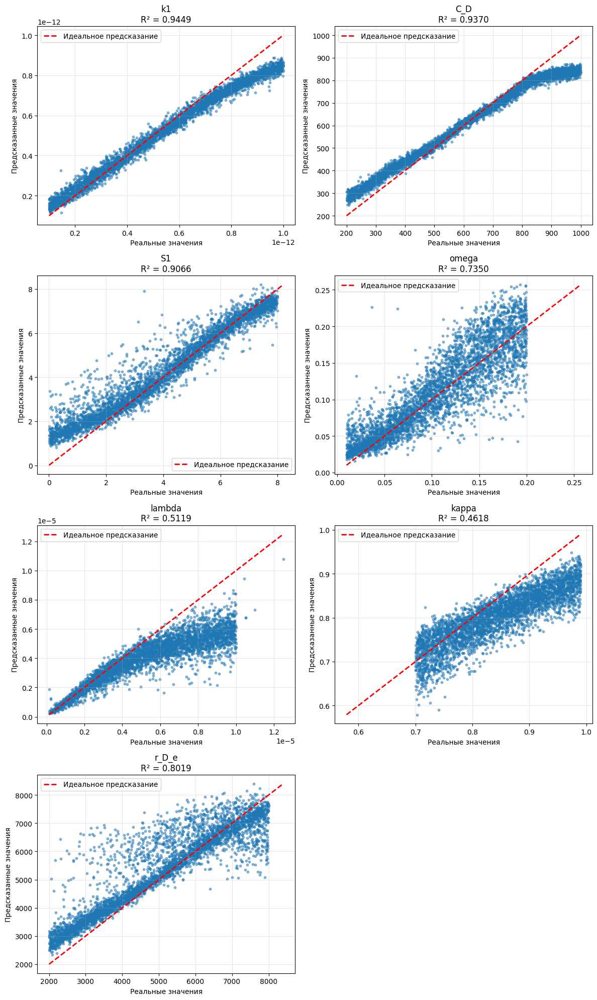

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


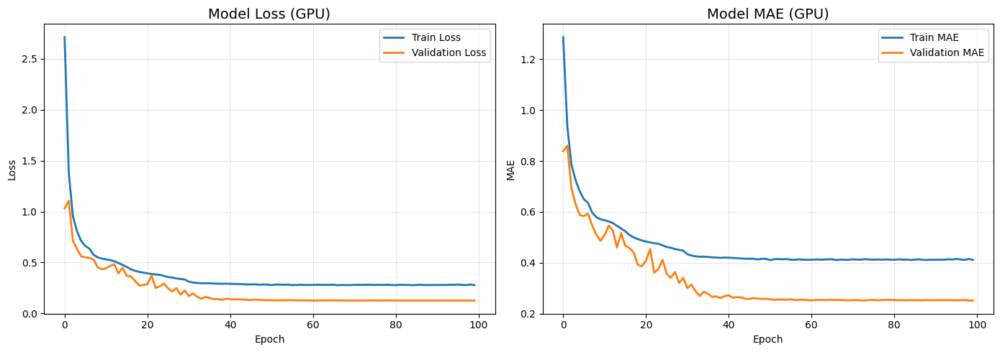

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_dual_permeability_fin', format='all')

✅ Веса модели сохранены: lstm_model_regression_dual_permeability_fin.weights.h5
✅ Модель сохранена в Keras format: lstm_model_regression_dual_permeability_fin.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_model_regression_dual_permeability_fin_config.json


In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_dual_permeability_fin',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_dual_permeability_fin_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to lstm_model_regression_dual_permeability_fin_scaler_config.json


# Обучение для радиально-комозитной модели

In [ ]:
!unzip /content/drive/MyDrive/radial_composite.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: radial_composite/params/24.csv  
  inflating: radial_composite/params/46.csv  
  inflating: radial_composite/params/48.csv  
  inflating: radial_composite/params/85.csv  
  inflating: radial_composite/params/168.csv  
  inflating: radial_composite/params/183.csv  
  inflating: radial_composite/params/208.csv  
  inflating: radial_composite/params/209.csv  
  inflating: radial_composite/params/215.csv  
  inflating: radial_composite/params/226.csv  
  inflating: radial_composite/params/252.csv  
  inflating: radial_composite/params/268.csv  
  inflating: radial_composite/params/274.csv  
  inflating: radial_composite/params/283.csv  
  inflating: radial_composite/params/290.csv  
  inflating: radial_composite/params/311.csv  
  inflating: radial_composite/params/314.csv  
  inflating: radial_composite/params/319.csv  
  inflating: radial_composite/params/328.csv  
  inflating: radial_composite/params/347.cs

In [ ]:
data_preprocess = PressureDataRegressionPreprocessor1D(
    data_dir='/content/radial_composite',
    model_type=Model.RADIAL_COMPOSITE_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset(task='regression')

In [ ]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [ ]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [ ]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

2.566172232996822e-05 0.0097485943343984
256617223.2996822 97485943343.98401
2.566172232996822e-05 0.0097485943343984
256617223.2996822 97485943343.98401
Transformed data:  256617223.2996822 97485943343.98401 23433780405.759125
3.7610233893248e-05 0.0095093978136966
376102338.93248 95093978136.966
Transformed data:  376102338.93248 95093978136.966 23151109394.497414
2.93641814650077e-05 0.0095686701076857
293641814.650077 95686701076.85701
Transformed data:  293641814.650077 95686701076.85701 22898386424.95971


In [ ]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [ ]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [ ]:
model = WellTestLSTM(num_classes=6, task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S', 'M12', 'omega12', 'r_fD']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 1/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.6600 - mae: 1.4141 - mse: 3.6600
Epoch 1: val_loss improved from None to 0.94224, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 17s 38ms/step - loss: 2.7991 - mae: 1.2200 - mse: 2.7991 - val_loss: 0.9422 - val_mae: 0.5594 - val_mse: 0.9422 - learning_rate: 5.0000e-04

Epoch 2: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 2/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.6070 - mae: 0.8793 - mse: 1.6070
Epoch 2: val_loss did not improve from 0.94224
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 1.4392 - mae: 0.8138 - mse: 1.4392 - val_loss: 0.9910 - val_mae: 0.6047 - val_mse: 0.9910 - learning_rate: 5.0000e-04

Epoch 3: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step - loss: 1.0451 - mae: 0.6646 - mse: 1.0451
Epoch 3: val_loss improved from 0.94224 to 0.87966, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 1.0015 - mae: 0.6332 - mse: 1.0015 - val_loss: 0.8797 - val_mae: 0.5231 - val_mse: 0.8797 - learning_rate: 5.0000e-04

Epoch 4: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 4/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.8968 - mae: 0.5625 - mse: 0.8968
Epoch 4: val_loss improved from 0.87966 to 0.83542, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.8362 - mae: 0.5467 - mse: 0.8362 - val_loss: 0.8354 - val_mae: 0.4975 - val_mse: 0.8354 - learning_rate: 5.0000e-04

Epoch 5: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.7827 - mae: 0.5103 - mse: 0.7827
Epoch 5: val_loss did not improve from 0.83542
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.7746 - mae: 0.5051 - mse: 0.7746 - val_loss: 0.8390 - val_mae: 0.4940 - val_mse: 0.8390 - learning_rate: 5.0000e-04

Epoch 6: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 6/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.7129 - mae: 0.4881 - mse: 0.7129
Epoch 6: val_loss improved from 0.83542 to 0.74341, saving model to best_model_regression.h5



Epoch 6: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.7631 - mae: 0.4900 - mse: 0.7631 - val_loss: 0.7434 - val_mae: 0.4769 - val_mse: 0.7434 - learning_rate: 5.0000e-04

Epoch 7: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 7/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.7343 - mae: 0.4851 - mse: 0.7343
Epoch 7: val_loss did not improve from 0.74341
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.7476 - mae: 0.4838 - mse: 0.7476 - val_loss: 0.7884 - val_mae: 0.4800 - val_mse: 0.7884 - learning_rate: 5.0000e-04

Epoch 8: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 8/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.7392 - mae: 0.4778 - mse: 0.7392
Epoch 8: val_loss improved from 0.74341 to 0.70126, saving model to best_model_regression.h5



Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.7445 - mae: 0.4781 - mse: 0.7445 - val_loss: 0.7013 - val_mae: 0.4895 - val_mse: 0.7013 - learning_rate: 5.0000e-04

Epoch 9: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 9/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.7516 - mae: 0.4777 - mse: 0.7516
Epoch 9: val_loss did not improve from 0.70126
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.7301 - mae: 0.4745 - mse: 0.7301 - val_loss: 0.7527 - val_mae: 0.4842 - val_mse: 0.7527 - learning_rate: 5.0000e-04

Epoch 10: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 10/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.7176 - mae: 0.4729 - mse: 0.7176
Epoch 10: val_loss did not improve from 0.70126
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.7305 - mae: 0.4750 - mse: 0.7305 - val_loss: 0.7656 - val_mae: 0.4924 - val_mse: 0.7656 - learning_ra


Epoch 11: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.7098 - mae: 0.4672 - mse: 0.7098 - val_loss: 0.6896 - val_mae: 0.5020 - val_mse: 0.6896 - learning_rate: 5.0000e-04

Epoch 12: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 12/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.6267 - mae: 0.4274 - mse: 0.6267
Epoch 12: val_loss improved from 0.68961 to 0.57329, saving model to best_model_regression.h5



Epoch 12: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.6193 - mae: 0.4192 - mse: 0.6193 - val_loss: 0.5733 - val_mae: 0.4124 - val_mse: 0.5733 - learning_rate: 5.0000e-04

Epoch 13: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 13/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.6242 - mae: 0.4084 - mse: 0.6242
Epoch 13: val_loss improved from 0.57329 to 0.54260, saving model to best_model_regression.h5



Epoch 13: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.6020 - mae: 0.4045 - mse: 0.6020 - val_loss: 0.5426 - val_mae: 0.3844 - val_mse: 0.5426 - learning_rate: 5.0000e-04

Epoch 14: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 14/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.5927 - mae: 0.3986 - mse: 0.5927
Epoch 14: val_loss improved from 0.54260 to 0.45686, saving model to best_model_regression.h5



Epoch 14: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.5868 - mae: 0.3983 - mse: 0.5868 - val_loss: 0.4569 - val_mae: 0.3479 - val_mse: 0.4569 - learning_rate: 5.0000e-04

Epoch 15: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 15/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.5474 - mae: 0.3896 - mse: 0.5474
Epoch 15: val_loss did not improve from 0.45686
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.5678 - mae: 0.3939 - mse: 0.5678 - val_loss: 0.5032 - val_mae: 0.3474 - val_mse: 0.5032 - learning_rate: 5.0000e-04

Epoch 16: LearningRateScheduler setting learning rate to 0.0005000000237487257.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.5632 - mae: 0.3932 - mse: 0.5632
Epoch 16: val_loss did not improve from 0.45686
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.5759 - mae: 0.3938 - mse: 0.5759 - val_loss: 0.6200 - val_mae: 0.4254 - val_mse: 0.6200 - learnin


Epoch 21: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4667 - mae: 0.3217 - mse: 0.4667 - val_loss: 0.4045 - val_mae: 0.2687 - val_mse: 0.4045 - learning_rate: 2.5000e-04

Epoch 22: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 22/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4887 - mae: 0.3191 - mse: 0.4887
Epoch 22: val_loss improved from 0.40452 to 0.37417, saving model to best_model_regression.h5



Epoch 22: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4657 - mae: 0.3164 - mse: 0.4657 - val_loss: 0.3742 - val_mae: 0.3123 - val_mse: 0.3742 - learning_rate: 2.5000e-04

Epoch 23: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 23/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4796 - mae: 0.3160 - mse: 0.4796
Epoch 23: val_loss improved from 0.37417 to 0.37090, saving model to best_model_regression.h5



Epoch 23: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.4604 - mae: 0.3146 - mse: 0.4604 - val_loss: 0.3709 - val_mae: 0.2677 - val_mse: 0.3709 - learning_rate: 2.5000e-04

Epoch 24: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 24/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.4690 - mae: 0.3100 - mse: 0.4690
Epoch 24: val_loss did not improve from 0.37090
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 34ms/step - loss: 0.4556 - mae: 0.3087 - mse: 0.4556 - val_loss: 0.4447 - val_mae: 0.3381 - val_mse: 0.4447 - learning_rate: 2.5000e-04

Epoch 25: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 25/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4816 - mae: 0.3118 - mse: 0.4816
Epoch 25: val_loss improved from 0.37090 to 0.32222, saving model to best_model_regression.h5



Epoch 25: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4519 - mae: 0.3064 - mse: 0.4519 - val_loss: 0.3222 - val_mae: 0.2548 - val_mse: 0.3222 - learning_rate: 2.5000e-04

Epoch 26: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 26/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4210 - mae: 0.3025 - mse: 0.4210
Epoch 26: val_loss did not improve from 0.32222
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 33ms/step - loss: 0.4483 - mae: 0.3055 - mse: 0.4483 - val_loss: 0.3666 - val_mae: 0.3006 - val_mse: 0.3666 - learning_rate: 2.5000e-04

Epoch 27: LearningRateScheduler setting learning rate to 0.0002500000118743628.
Epoch 27/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4448 - mae: 0.3020 - mse: 0.4448
Epoch 27: val_loss did not improve from 0.32222
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4370 - mae: 0.3038 - mse: 0.4370 - val_loss: 0.3249 - val_mae: 0.2564 - val_mse: 0.3249 - learnin


Epoch 31: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 34ms/step - loss: 0.4258 - mae: 0.2948 - mse: 0.4258 - val_loss: 0.2762 - val_mae: 0.1876 - val_mse: 0.2762 - learning_rate: 1.2500e-05

Epoch 32: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 32/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4421 - mae: 0.2910 - mse: 0.4421
Epoch 32: val_loss improved from 0.27625 to 0.26820, saving model to best_model_regression.h5



Epoch 32: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4187 - mae: 0.2911 - mse: 0.4187 - val_loss: 0.2682 - val_mae: 0.1890 - val_mse: 0.2682 - learning_rate: 1.2500e-05

Epoch 33: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 33/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4067 - mae: 0.2913 - mse: 0.4067
Epoch 33: val_loss did not improve from 0.26820
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 32ms/step - loss: 0.4188 - mae: 0.2917 - mse: 0.4188 - val_loss: 0.2729 - val_mae: 0.1888 - val_mse: 0.2729 - learning_rate: 1.2500e-05

Epoch 34: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 34/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4329 - mae: 0.2882 - mse: 0.4329
Epoch 34: val_loss did not improve from 0.26820
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4243 - mae: 0.2909 - mse: 0.4243 - val_loss: 0.2728 - val_mae: 0.1903 - val_mse: 0.2728 - learn


Epoch 36: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.4192 - mae: 0.2919 - mse: 0.4192 - val_loss: 0.2672 - val_mae: 0.1855 - val_mse: 0.2672 - learning_rate: 1.2500e-05

Epoch 37: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 37/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4361 - mae: 0.2925 - mse: 0.4361
Epoch 37: val_loss improved from 0.26717 to 0.25921, saving model to best_model_regression.h5



Epoch 37: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4162 - mae: 0.2902 - mse: 0.4162 - val_loss: 0.2592 - val_mae: 0.1862 - val_mse: 0.2592 - learning_rate: 1.2500e-05

Epoch 38: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 38/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4124 - mae: 0.2898 - mse: 0.4124
Epoch 38: val_loss improved from 0.25921 to 0.25678, saving model to best_model_regression.h5



Epoch 38: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.4217 - mae: 0.2908 - mse: 0.4217 - val_loss: 0.2568 - val_mae: 0.1882 - val_mse: 0.2568 - learning_rate: 1.2500e-05

Epoch 39: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 39/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.4122 - mae: 0.2915 - mse: 0.4122
Epoch 39: val_loss did not improve from 0.25678
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4184 - mae: 0.2908 - mse: 0.4184 - val_loss: 0.2572 - val_mae: 0.1836 - val_mse: 0.2572 - learning_rate: 1.2500e-05

Epoch 40: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 40/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.3803 - mae: 0.2858 - mse: 0.3803
Epoch 40: val_loss did not improve from 0.25678
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.4227 - mae: 0.2896 - mse: 0.4227 - val_loss: 0.2631 - val_mae: 0.1896 - val_mse: 0.2631 - learn


Epoch 43: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.4229 - mae: 0.2909 - mse: 0.4229 - val_loss: 0.2562 - val_mae: 0.1943 - val_mse: 0.2562 - learning_rate: 1.2500e-05

Epoch 44: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 44/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 28ms/step - loss: 0.4093 - mae: 0.2884 - mse: 0.4093
Epoch 44: val_loss did not improve from 0.25619
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.4196 - mae: 0.2897 - mse: 0.4196 - val_loss: 0.2671 - val_mae: 0.1870 - val_mse: 0.2671 - learning_rate: 1.2500e-05

Epoch 45: LearningRateScheduler setting learning rate to 1.2500000593718141e-05.
Epoch 45/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.4243 - mae: 0.2911 - mse: 0.4243
Epoch 45: val_loss did not improve from 0.25619
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.4191 - mae: 0.2898 - mse: 0.4191 - val_loss: 0.2627 - val_mae: 0.1827 - val_mse: 0.2627 - learn


Epoch 93: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 11s 36ms/step - loss: 0.4126 - mae: 0.2878 - mse: 0.4126 - val_loss: 0.2559 - val_mae: 0.1795 - val_mse: 0.2559 - learning_rate: 6.2500e-08

Epoch 94: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 94/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.3876 - mae: 0.2874 - mse: 0.3876
Epoch 94: val_loss did not improve from 0.25592
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4119 - mae: 0.2885 - mse: 0.4119 - val_loss: 0.2625 - val_mae: 0.1843 - val_mse: 0.2625 - learning_rate: 6.2500e-08

Epoch 95: LearningRateScheduler setting learning rate to 6.250000694763003e-08.
Epoch 95/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 29ms/step - loss: 0.4125 - mae: 0.2890 - mse: 0.4125
Epoch 95: val_loss did not improve from 0.25592
219/219 ━━━━━━━━━━━━━━━━━━━━ 7s 33ms/step - loss: 0.4137 - mae: 0.2895 - mse: 0.4137 - val_loss: 0.2630 - val_mae: 0.1843 - val_mse: 0.2630 - learni

✅ Информация об обучении сохранена в training_metrics_regression.json


In [ ]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.3166
  mae: 0.1874
  mse: 0.3166
-1.3465006682653609 4.20432252748641
293641814.6500778 95686701076.85701
-1.15493 3.683807
3585858800.0 86741434000.0

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  1.2323e-07
    MAE:  2.5102e-04
    R²:   0.9562

  S1:
    MSE:  5.2970e-01
    MAE:  5.1451e-01
    R²:   0.9360

  C_D:
    MSE:  3.9839e+04
    MAE:  1.0157e+02
    R²:   0.9066

  M12:
    MSE:  7.7760e-02
    MAE:  1.9941e-01
    R²:   0.9417

  omega12:
    MSE:  1.5864e+01
    MAE:  1.3047e+00
    R²:   0.4862

  r_fD:
    MSE:  1.7563e+01
    MAE:  9.5418e-01
    R²:   0.0057
-1.3465006682653609 4.20432252748641
293641814.6500778 95686701076.85701
-1.15493 3.683807
3585858800.0 86741434000.0


-1.3465006682653609 4.20432252748641
293641814.6500778 95686701076.85701
-1.15493 3.683807
3585858800.0 86741434000.0
Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: 0.00035858587943948805 0.008674143813550472
Results: 2.9364181465007783e-05 0.0095686701076857


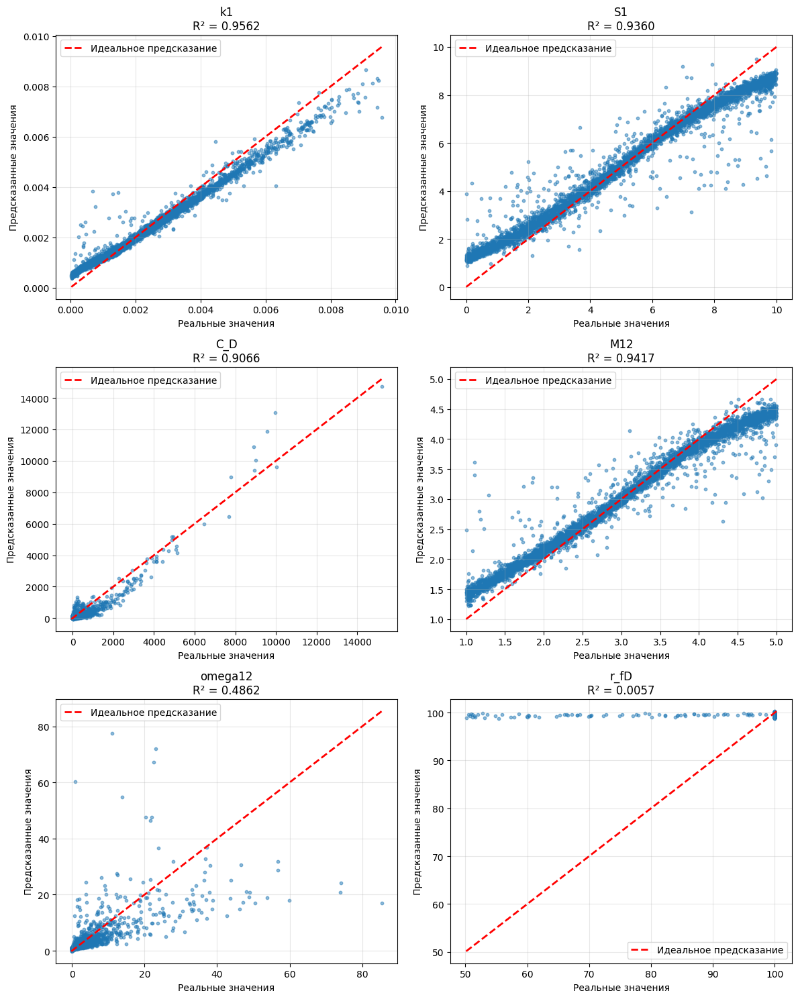

In [ ]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


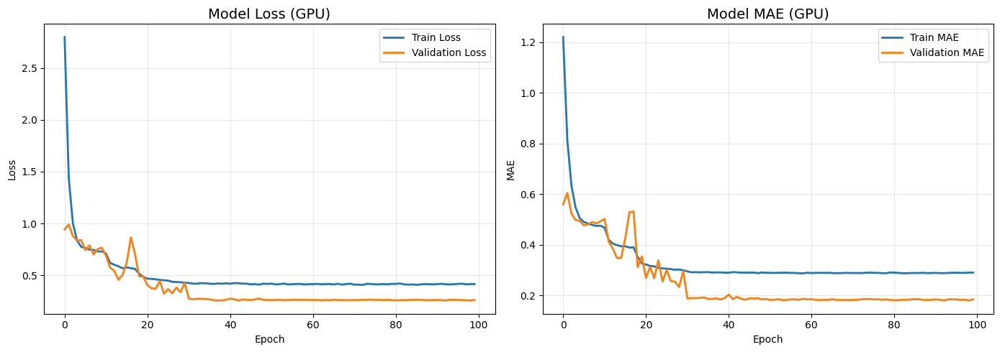

In [ ]:
trainer_k.plot_training_history(save_path='training_history.png')

In [ ]:
trainer_k.save_model('lstm_model_regression_radial_composite', format='all')

In [ ]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_radial_composite',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_radial_composite_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

# Обучение радиально-композитная модель с разными train, val, test

In [15]:
!unzip /content/drive/MyDrive/datasets/radial_composite_inf.zip

Выходные данные были обрезаны до нескольких последних строк (5000).
  inflating: radial_composite_inf/params/24.csv  
  inflating: radial_composite_inf/params/46.csv  
  inflating: radial_composite_inf/params/48.csv  
  inflating: radial_composite_inf/params/85.csv  
  inflating: radial_composite_inf/params/168.csv  
  inflating: radial_composite_inf/params/183.csv  
  inflating: radial_composite_inf/params/208.csv  
  inflating: radial_composite_inf/params/209.csv  
  inflating: radial_composite_inf/params/215.csv  
  inflating: radial_composite_inf/params/226.csv  
  inflating: radial_composite_inf/params/252.csv  
  inflating: radial_composite_inf/params/268.csv  
  inflating: radial_composite_inf/params/274.csv  
  inflating: radial_composite_inf/params/283.csv  
  inflating: radial_composite_inf/params/290.csv  
  inflating: radial_composite_inf/params/311.csv  
  inflating: radial_composite_inf/params/314.csv  
  inflating: radial_composite_inf/params/319.csv  
  inflating: radia

In [16]:
data_preprocess = PressureDataRegressionCustomPreprocessor1D(
    data_dir='/content/radial_composite_inf',
    model_type=Model.RADIAL_COMPOSITE_INF
)
X_train, X_val, X_test, y_train, y_val, y_test = data_preprocess.get_dataset()

{'k1': np.float64(4.0998093914129246e-13), 'C_D': np.float64(415.9632573186357), 'S': np.float64(2.582117372148587), 'omega12': np.float64(2.9851727794000973), 'M12': np.float64(9.265755685341688), 'r_fD': np.float64(147.49807624771375), 'data_type': 'train'}


In [17]:
y_train_reg_reshaped = y_train.reshape(-1, 6).astype(np.float64)
y_val_reg_reshaped = y_val.reshape(-1, 6).astype(np.float64)
y_test_reg_reshaped = y_test.reshape(-1, 6).astype(np.float64)

In [18]:
y_train_k = y_train_reg_reshaped[:, 0:1]
y_val_k = y_val_reg_reshaped[:, 0:1]
y_test_k = y_test_reg_reshaped[:, 0:1]

y_train_k_norm = y_train_k
y_val_k_norm = y_val_k
y_test_k_norm = y_test_k

k_train_reshaped = y_train_k_norm.reshape(-1, 1, 1)
k_val_reshaped = y_val_k_norm.reshape(-1, 1, 1)
k_test_reshaped = y_test_k_norm.reshape(-1, 1, 1)

In [19]:
k_scaler = KValueScaler(log_cols=[3, 4])
k_scaler.fit(y_train_reg_reshaped)

y_train_k = k_scaler.transform(y_train_reg_reshaped)
y_val_k = k_scaler.transform(y_val_reg_reshaped)
y_test_k = k_scaler.transform(y_test_reg_reshaped)

In [20]:
X_train_k = X_train / k_train_reshaped
X_val_k = X_val / k_val_reshaped
X_test_k = X_test / k_test_reshaped

In [21]:
eps = 1e-10
X_train_k = np.log10(np.abs(X_train_k) + eps)
X_val_k = np.log10(np.abs(X_val_k) + eps)
X_test_k = np.log10(np.abs(X_test_k) + eps)
# Глобальная стандартизация: приводим к ~[-3, 3] с сохранением межсэмпловой вариации k
X_mean = X_train_k.mean(axis=(0, 1), keepdims=True)
X_std  = X_train_k.std(axis=(0, 1), keepdims=True)
X_train_k = (X_train_k - X_mean) / X_std
X_val_k   = (X_val_k   - X_mean) / X_std
X_test_k  = (X_test_k  - X_mean) / X_std

In [22]:
model = WellTestLSTM(num_classes=6, input_shape=(128, 2), task_type='regression')

trainer_k = WellTestTrainer(
    model=model.model,
    task_type='regression',
    output_names=['k1', 'C_D', 'S', 'M12', 'omega12', 'r_fD']
)

trainer_k.set_y_scaler(k_scaler)

history_k = trainer_k.train(
    X_train_k, y_train_k,
    X_val_k, y_val_k,
    batch_size=64,
    epochs=100,
    initial_lr=0.0005
)

НАСТРОЙКА УСТРОЙСТВА ДЛЯ ОБУЧЕНИЯ (REGRESSION)
Обнаружено GPU: 1
✅ Mixed precision включен

НАЧАЛО ОБУЧЕНИЯ НА GPU (REGRESSION)
Устройство: GPU
Размер батча: 64
Тренировочные данные: X (14000, 128, 2), y (14000, 6)
Валидационные данные: X (2000, 128, 2), y (2000, 6)
Эпохи: 100

Epoch 1: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 1/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 1.6891 - mae: 0.9980 - mse: 1.6891
Epoch 1: val_loss improved from None to 0.74608, saving model to best_model_regression.h5



Epoch 1: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 18s 40ms/step - loss: 1.0516 - mae: 0.8018 - mse: 1.0516 - val_loss: 0.7461 - val_mae: 0.6856 - val_mse: 0.7461 - learning_rate: 0.0050

Epoch 2: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 2/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.6522 - mae: 0.6485 - mse: 0.6522
Epoch 2: val_loss improved from 0.74608 to 0.70149, saving model to best_model_regression.h5



Epoch 2: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.6368 - mae: 0.6389 - mse: 0.6368 - val_loss: 0.7015 - val_mae: 0.6762 - val_mse: 0.7015 - learning_rate: 0.0050

Epoch 3: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 3/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.6050 - mae: 0.6194 - mse: 0.6050
Epoch 3: val_loss improved from 0.70149 to 0.55105, saving model to best_model_regression.h5



Epoch 3: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.5885 - mae: 0.6100 - mse: 0.5885 - val_loss: 0.5510 - val_mae: 0.5770 - val_mse: 0.5510 - learning_rate: 0.0050

Epoch 4: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 4/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.5264 - mae: 0.5740 - mse: 0.5264
Epoch 4: val_loss improved from 0.55105 to 0.30633, saving model to best_model_regression.h5



Epoch 4: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 34ms/step - loss: 0.4999 - mae: 0.5572 - mse: 0.4999 - val_loss: 0.3063 - val_mae: 0.4113 - val_mse: 0.3063 - learning_rate: 0.0050

Epoch 5: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 5/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.4255 - mae: 0.5103 - mse: 0.4255
Epoch 5: val_loss improved from 0.30633 to 0.24389, saving model to best_model_regression.h5



Epoch 5: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.4148 - mae: 0.5031 - mse: 0.4148 - val_loss: 0.2439 - val_mae: 0.3855 - val_mse: 0.2439 - learning_rate: 0.0050

Epoch 6: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 6/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.3619 - mae: 0.4684 - mse: 0.3619
Epoch 6: val_loss did not improve from 0.24389
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3533 - mae: 0.4640 - mse: 0.3533 - val_loss: 0.3066 - val_mae: 0.4155 - val_mse: 0.3066 - learning_rate: 0.0050

Epoch 7: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 7/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.3278 - mae: 0.4477 - mse: 0.3278
Epoch 7: val_loss did not improve from 0.24389
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.3195 - mae: 0.4423 - mse: 0.3195 - val_loss: 0.3574 - val_mae: 0.4775 - val_mse: 0.3574 - learning_rate: 0.0050

E


Epoch 8: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.2921 - mae: 0.4237 - mse: 0.2921 - val_loss: 0.2128 - val_mae: 0.3288 - val_mse: 0.2128 - learning_rate: 0.0050

Epoch 9: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 9/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 30ms/step - loss: 0.2733 - mae: 0.4110 - mse: 0.2733
Epoch 9: val_loss improved from 0.21279 to 0.21198, saving model to best_model_regression.h5



Epoch 9: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 35ms/step - loss: 0.2738 - mae: 0.4105 - mse: 0.2738 - val_loss: 0.2120 - val_mae: 0.3292 - val_mse: 0.2120 - learning_rate: 0.0050

Epoch 10: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 10/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.2611 - mae: 0.3993 - mse: 0.2611
Epoch 10: val_loss did not improve from 0.21198
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2615 - mae: 0.3999 - mse: 0.2615 - val_loss: 0.2273 - val_mae: 0.3356 - val_mse: 0.2273 - learning_rate: 0.0050

Epoch 11: LearningRateScheduler setting learning rate to 0.004999999888241291.
Epoch 11/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2524 - mae: 0.3939 - mse: 0.2524
Epoch 11: val_loss did not improve from 0.21198
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.2532 - mae: 0.3943 - mse: 0.2532 - val_loss: 0.2321 - val_mae: 0.3422 - val_mse: 0.2321 - learning_rate: 0.0


Epoch 15: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 40ms/step - loss: 0.2138 - mae: 0.3621 - mse: 0.2138 - val_loss: 0.1310 - val_mae: 0.2421 - val_mse: 0.1310 - learning_rate: 0.0025

Epoch 16: LearningRateScheduler setting learning rate to 0.0024999999441206455.
Epoch 16/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.2104 - mae: 0.3595 - mse: 0.2104
Epoch 16: val_loss did not improve from 0.13097
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.2092 - mae: 0.3577 - mse: 0.2092 - val_loss: 0.1623 - val_mae: 0.2717 - val_mse: 0.1623 - learning_rate: 0.0025

Epoch 17: LearningRateScheduler setting learning rate to 0.0024999999441206455.
Epoch 17/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step - loss: 0.2066 - mae: 0.3556 - mse: 0.2066
Epoch 17: val_loss did not improve from 0.13097
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.2060 - mae: 0.3550 - mse: 0.2060 - val_loss: 0.1476 - val_mae: 0.2495 - val_mse: 0.1476 - learning_rate: 


Epoch 21: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 9s 41ms/step - loss: 0.1888 - mae: 0.3389 - mse: 0.1888 - val_loss: 0.1234 - val_mae: 0.2287 - val_mse: 0.1234 - learning_rate: 0.0012

Epoch 22: LearningRateScheduler setting learning rate to 0.0012499999720603228.
Epoch 22/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1887 - mae: 0.3396 - mse: 0.1887
Epoch 22: val_loss improved from 0.12341 to 0.12243, saving model to best_model_regression.h5



Epoch 22: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 37ms/step - loss: 0.1866 - mae: 0.3366 - mse: 0.1866 - val_loss: 0.1224 - val_mae: 0.2168 - val_mse: 0.1224 - learning_rate: 0.0012

Epoch 23: LearningRateScheduler setting learning rate to 0.0012499999720603228.
Epoch 23/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1819 - mae: 0.3330 - mse: 0.1819
Epoch 23: val_loss did not improve from 0.12243
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1829 - mae: 0.3337 - mse: 0.1829 - val_loss: 0.1244 - val_mae: 0.2189 - val_mse: 0.1244 - learning_rate: 0.0012

Epoch 24: LearningRateScheduler setting learning rate to 0.0012499999720603228.
Epoch 24/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 0.1816 - mae: 0.3320 - mse: 0.1816
Epoch 24: val_loss did not improve from 0.12243
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 35ms/step - loss: 0.1823 - mae: 0.3322 - mse: 0.1823 - val_loss: 0.1398 - val_mae: 0.2424 - val_mse: 0.1398 - learning_rate: 


Epoch 26: finished saving model to best_model_regression.h5
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1799 - mae: 0.3299 - mse: 0.1799 - val_loss: 0.0990 - val_mae: 0.2054 - val_mse: 0.0990 - learning_rate: 0.0012

Epoch 27: LearningRateScheduler setting learning rate to 0.0012499999720603228.
Epoch 27/100
219/219 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step - loss: 0.1777 - mae: 0.3283 - mse: 0.1777
Epoch 27: val_loss did not improve from 0.09904
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 36ms/step - loss: 0.1790 - mae: 0.3294 - mse: 0.1790 - val_loss: 0.1173 - val_mae: 0.2109 - val_mse: 0.1173 - learning_rate: 0.0012

Epoch 28: LearningRateScheduler setting learning rate to 0.0012499999720603228.
Epoch 28/100
218/219 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step - loss: 0.1746 - mae: 0.3248 - mse: 0.1746
Epoch 28: val_loss did not improve from 0.09904
219/219 ━━━━━━━━━━━━━━━━━━━━ 8s 38ms/step - loss: 0.1759 - mae: 0.3260 - mse: 0.1759 - val_loss: 0.1215 - val_mae: 0.2330 - val_mse: 0.1215 - learning_rate: 

✅ Информация об обучении сохранена в training_metrics_regression.json


In [23]:
metrics_k = trainer_k.evaluate(X_test_k, y_test_k)


ОЦЕНКА МОДЕЛИ (REGRESSION)

📊 Базовые метрики:
  loss: 0.0512
  mae: 0.1408
  mse: 0.0512

📊 Регрессионные метрики (в исходном масштабе):

  k1:
    MSE:  2.8979e-27
    MAE:  3.7215e-14
    R²:   0.9562

  C_D:
    MSE:  1.7325e+03
    MAE:  3.0192e+01
    R²:   0.9675

  S:
    MSE:  2.5865e-01
    MAE:  3.1766e-01
    R²:   0.9511

  omega12:
    MSE:  1.8062e+00
    MAE:  4.8300e-01
    R²:   0.8300

  M12:
    MSE:  1.1242e+00
    MAE:  7.3273e-01
    R²:   0.8595

  r_fD:
    MSE:  9.2906e+03
    MAE:  5.7771e+01
    R²:   0.8632


Количество выходов: 6
Форма y_test_orig: (4000, 6)
Results: 1.2401435130551808e-13 8.689513952137018e-13
Results: 1.0020839204759425e-13 9.999285650004926e-13


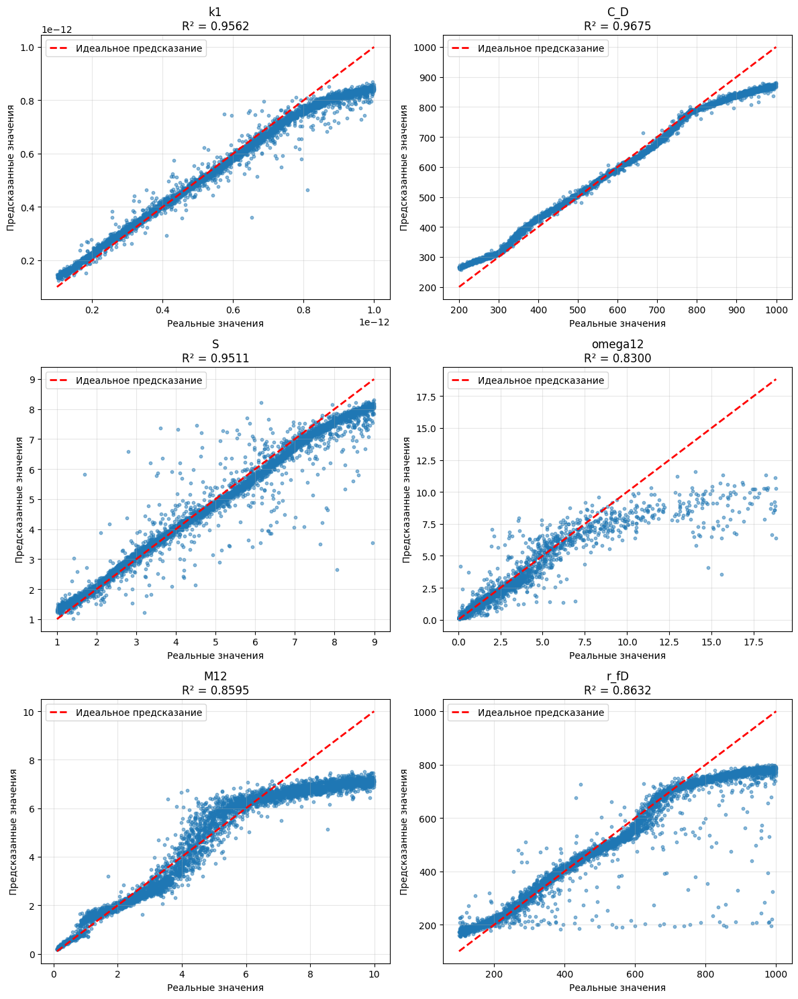

In [24]:
trainer_k.plot_predictions_vs_actual(X_test_k, y_test_k)

📊 График сохранен в training_history.png


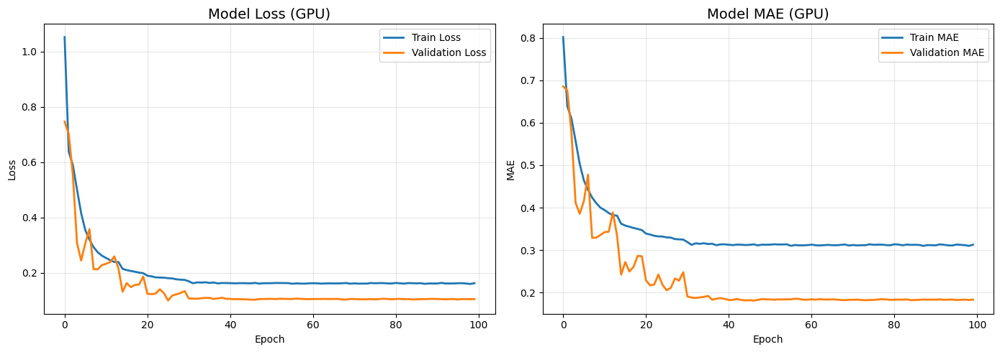

In [25]:
trainer_k.plot_training_history(save_path='training_history.png')

In [26]:
trainer_k.save_model('lstm_model_regression_radial_composite', format='all')

✅ Веса модели сохранены: lstm_model_regression_radial_composite.weights.h5
✅ Модель сохранена в Keras format: lstm_model_regression_radial_composite.keras
❌ Не удалось сохранить в SavedModel: this __dict__ descriptor does not support '_DictWrapper' objects
✅ Конфигурация сохранена: lstm_model_regression_radial_composite_config.json


In [27]:
import json as _json, numpy as _np, os as _os
_n_cols = len(trainer_k.output_names)
_cfg = {
    'model_name': 'lstm_model_regression_radial_composite',
    'output_names': trainer_k.output_names,
    'log_cols': k_scaler.log_cols,
    'k_multiplier': k_scaler.k_multiplier,
    'k_scaler_mean': k_scaler.k_scaler.mean_.tolist(),
    'k_scaler_scale': k_scaler.k_scaler.scale_.tolist(),
    'log_scaler_mean': {str(c): k_scaler.log_scalers[c].mean_.tolist() for c in k_scaler.log_cols},
    'log_scaler_scale': {str(c): k_scaler.log_scalers[c].scale_.tolist() for c in k_scaler.log_cols},
    'other_cols': k_scaler._other_cols(_n_cols),
    'other_scaler_mean': k_scaler.other_scaler.mean_.tolist() if k_scaler.other_scaler else [],
    'other_scaler_scale': k_scaler.other_scaler.scale_.tolist() if k_scaler.other_scaler else [],
    'X_mean': X_mean.tolist(),
    'X_std': X_std.tolist(),
}
_path = 'lstm_model_regression_radial_composite_scaler_config.json'
with open(_path, 'w') as _f:
    _json.dump(_cfg, _f, indent=2)
print(f'Scaler config saved to {_path}')

Scaler config saved to lstm_model_regression_radial_composite_scaler_config.json
